### Paths, Configs, Hyperparameters
##### Everything can be found at https://ki-k8s-1.f2.htw-berlin.de/jupyter in Jupyter Uni Server GPU in the folder "/home/jovyan/shared/s0599003". (including the subset of MusicNet for a re-run)
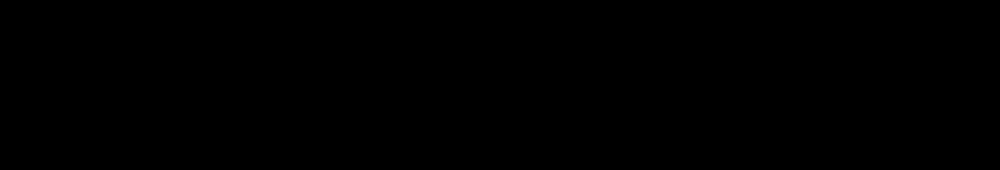
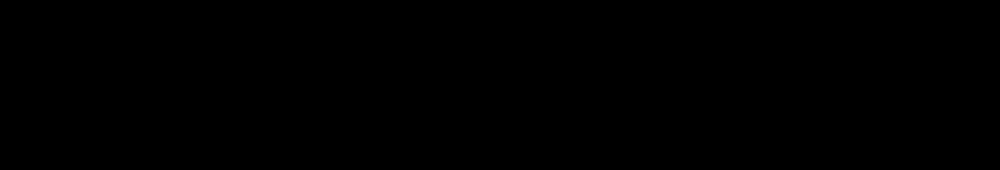

In [1]:
# BLOCK 0: Imports + Paths + Device + Seed
from __future__ import annotations
import os
import json
import time
import math
import random
from dataclasses import dataclass, asdict
from pathlib import Path
from typing import Dict, List, Tuple, Optional, Any
from collections import Counter, defaultdict

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt

# -----------------------------
# librosa
# -----------------------------
try:
    import librosa
except Exception as e:
    raise ImportError(
        "librosa is required.\n"
        "Install in TERMINAL:\n"
        "  python -m pip install --user librosa soundfile\n"
        "Then restart kernel."
    ) from e

try:
    from tqdm import tqdm
except Exception:
    tqdm = lambda x, **kwargs: x

try:
    from IPython.display import display
except Exception:
    display = print

# -----------------------------
# Root paths
# -----------------------------
ROOT_DIR = Path("/home/jovyan/shared/s0599003")
DATA_ROOT = ROOT_DIR / "musicnet"

TRAIN_AUDIO_DIR = DATA_ROOT / "train_data"
TRAIN_LABEL_DIR = DATA_ROOT / "train_labels"
TEST_AUDIO_DIR  = DATA_ROOT / "test_data"
TEST_LABEL_DIR  = DATA_ROOT / "test_labels"
META_PATH       = DATA_ROOT / "musicnet_metadata.csv"

# -----------------------------
# Output structure
# -----------------------------
OUT_ROOT = ROOT_DIR / "ctc_runs"
FIG_DIR  = OUT_ROOT / "figures"
CKPT_DIR = OUT_ROOT / "checkpoints"
CACHE_DIR= OUT_ROOT / "cache"

for d in [OUT_ROOT, FIG_DIR, CKPT_DIR, CACHE_DIR]:
    d.mkdir(parents=True, exist_ok=True)

SPLITS_PATH = OUT_ROOT / "splits.json"
VOCAB_PATH  = OUT_ROOT / "vocab_info.json"

# -----------------------------
# Device
# -----------------------------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("DEVICE:", DEVICE)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    torch.backends.cudnn.benchmark = True

# -----------------------------
# DataLoader defaults
# -----------------------------
NUM_WORKERS = 4
PIN_MEMORY  = (DEVICE == "cuda")
print("NUM_WORKERS:", NUM_WORKERS, "PIN_MEMORY:", PIN_MEMORY)

# -----------------------------
# Reproducibility
# -----------------------------
def set_seed(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

# -----------------------------
# Checks
# -----------------------------
assert TRAIN_AUDIO_DIR.exists(), TRAIN_AUDIO_DIR
assert TRAIN_LABEL_DIR.exists(), TRAIN_LABEL_DIR
assert TEST_AUDIO_DIR.exists(),  TEST_AUDIO_DIR
assert TEST_LABEL_DIR.exists(),  TEST_LABEL_DIR
assert META_PATH.exists(),       META_PATH

print("Data root:", DATA_ROOT)
print("Output root:", OUT_ROOT)


DEVICE: cuda
CUDA available: True
GPU: Tesla V100-PCIE-16GB
NUM_WORKERS: 4 PIN_MEMORY: True
Data root: /home/jovyan/shared/s0599003/musicnet
Output root: /home/jovyan/shared/s0599003/ctc_runs


### Load Metadata and the Subset Split

In [3]:
# BLOCK 1: Load metadata + index_df
def list_wavs(d: Path) -> List[Path]:
    return sorted(d.glob("*.wav"))

train_wavs = list_wavs(TRAIN_AUDIO_DIR)
test_wavs  = list_wavs(TEST_AUDIO_DIR)

print("Train wavs:", len(train_wavs))
print("Test wavs :", len(test_wavs))

meta = pd.read_csv(META_PATH)
assert "id" in meta.columns, "metadata must contain column 'id'"
meta["id"] = meta["id"].astype(int)

def build_index_df() -> pd.DataFrame:
    rows = []
    for w in train_wavs:
        tid = int(w.stem)
        rows.append({
            "id": tid, "split_src": "train",
            "audio_path": str(w),
            "label_path": str(TRAIN_LABEL_DIR / f"{tid}.csv")
        })
    for w in test_wavs:
        tid = int(w.stem)
        rows.append({
            "id": tid, "split_src": "test",
            "audio_path": str(w),
            "label_path": str(TEST_LABEL_DIR / f"{tid}.csv")
        })
    df = pd.DataFrame(rows)

    missing = [p for p in df["label_path"].values if not Path(p).exists()]
    if missing:
        raise FileNotFoundError(f"Missing label files: {missing[:5]} (and more)")
    return df

index_df = build_index_df()
display(index_df.head())

TRAIN_POOL_IDS = sorted([int(p.stem) for p in train_wavs])
TEST_IDS       = sorted([int(p.stem) for p in test_wavs])

print("Train pool tracks:", len(TRAIN_POOL_IDS))
print("Test tracks:", len(TEST_IDS))


Train wavs: 40
Test wavs : 10


,id,split_src,audio_path,label_path
0,2156,train,/home/jovyan/shared/s0599003/musicnet/train_da...,/home/jovyan/shared/s0599003/musicnet/train_la...
1,2194,train,/home/jovyan/shared/s0599003/musicnet/train_da...,/home/jovyan/shared/s0599003/musicnet/train_la...
2,2195,train,/home/jovyan/shared/s0599003/musicnet/train_da...,/home/jovyan/shared/s0599003/musicnet/train_la...
3,2196,train,/home/jovyan/shared/s0599003/musicnet/train_da...,/home/jovyan/shared/s0599003/musicnet/train_la...
4,2200,train,/home/jovyan/shared/s0599003/musicnet/train_da...,/home/jovyan/shared/s0599003/musicnet/train_la...


Train pool tracks: 40
Test tracks: 10


### Train/Val/Test Strategy

In [4]:
# BLOCK 2: Fixed train/val split
N_VAL = 8

def work_key(row: pd.Series) -> Tuple[str, str]:
    return (str(row.get("composer", "UNKNOWN_COMPOSER")).strip(),
            str(row.get("composition", f"id_{row['id']}")).strip())

def make_val_split(meta_df: pd.DataFrame, train_pool_ids: List[int], n_val: int, seed: int):
    rng = random.Random(seed)
    df = meta_df[meta_df["id"].isin(train_pool_ids)].copy()

    if "composer" not in df.columns:
        df["composer"] = "UNKNOWN_COMPOSER"
    if "composition" not in df.columns:
        df["composition"] = df["id"].apply(lambda x: f"id_{x}")

    df["composer"] = df["composer"].fillna("UNKNOWN_COMPOSER")
    df["composition"] = df["composition"].fillna(df["id"].apply(lambda x: f"id_{x}"))
    df["work_key"] = df.apply(work_key, axis=1)

    groups = df.groupby("work_key")["id"].apply(list).tolist()
    groups.sort(key=len)
    rng.shuffle(groups)

    val_ids = []
    for g in groups:
        if len(val_ids) + len(g) <= n_val:
            val_ids.extend(g)
        if len(val_ids) == n_val:
            break

    if len(val_ids) < n_val:
        remaining = [tid for tid in train_pool_ids if tid not in val_ids]
        rng.shuffle(remaining)
        val_ids.extend(remaining[:(n_val - len(val_ids))])

    val_ids = sorted(set(val_ids))
    train_ids = sorted([tid for tid in train_pool_ids if tid not in val_ids])

    # leakage check by work_key
    tv = meta_df[meta_df["id"].isin(train_ids + val_ids)].copy()
    if "composer" not in tv.columns:
        tv["composer"] = "UNKNOWN_COMPOSER"
    if "composition" not in tv.columns:
        tv["composition"] = tv["id"].apply(lambda x: f"id_{x}")
    tv["composer"] = tv["composer"].fillna("UNKNOWN_COMPOSER")
    tv["composition"] = tv["composition"].fillna(tv["id"].apply(lambda x: f"id_{x}"))
    tv["work_key"] = tv.apply(work_key, axis=1)

    train_works = set(tv[tv["id"].isin(train_ids)]["work_key"])
    val_works   = set(tv[tv["id"].isin(val_ids)]["work_key"])
    print("Work leakage count:", len(train_works & val_works))

    assert len(val_ids) == n_val
    assert len(set(train_ids) & set(val_ids)) == 0
    return train_ids, val_ids

if SPLITS_PATH.exists():
    splits = json.loads(SPLITS_PATH.read_text(encoding="utf-8"))
    train_ids = splits["train_ids"]
    val_ids   = splits["val_ids"]
else:
    train_ids, val_ids = make_val_split(meta, TRAIN_POOL_IDS, n_val=N_VAL, seed=42)
    splits = {"train_ids": train_ids, "val_ids": val_ids, "test_ids": TEST_IDS}
    SPLITS_PATH.write_text(json.dumps(splits, indent=2), encoding="utf-8")
    print("Saved:", SPLITS_PATH)

print("Train:", len(train_ids), "Val:", len(val_ids), "Test:", len(TEST_IDS))
print("Val IDs:", val_ids)


Train: 32 Val: 8 Test: 10
Val IDs: [2156, 2213, 2214, 2215, 2224, 2239, 2240, 2358]


### Labels, The pitch-only vocabulary and the special tokens

In [5]:
# BLOCK 3: Labels + pitch-only vocab
def read_label_csv(path: Path) -> pd.DataFrame:
    df = pd.read_csv(path)
    required = {"start_time", "end_time", "instrument", "note"}
    missing = required - set(df.columns)
    if missing:
        raise ValueError(f"{path} missing columns: {missing}")
    df = df.copy()
    df["start_time"] = df["start_time"].astype(int)
    df["end_time"]   = df["end_time"].astype(int)
    df["instrument"] = df["instrument"].astype(int)
    df["note"]       = df["note"].astype(int)
    return df

MIN_NOTE = 21
MAX_NOTE = 108
N_PITCH  = MAX_NOTE - MIN_NOTE + 1  # 88

def note_to_id(note: int) -> int:
    if note < MIN_NOTE or note > MAX_NOTE:
        raise ValueError(f"Note out of range: {note}")
    return note - MIN_NOTE

def id_to_note(tid: int) -> int:
    return tid + MIN_NOTE

PAD_ID        = N_PITCH
CTC_BLANK_ID  = N_PITCH + 1
SOS_ID        = N_PITCH + 2
EOS_ID        = N_PITCH + 3
TOTAL_VOCAB_SIZE = N_PITCH + 4

vocab_info = {
    "type": "pitch_only",
    "min_note": MIN_NOTE, "max_note": MAX_NOTE, "N_PITCH": N_PITCH,
    "PAD_ID": PAD_ID, "CTC_BLANK_ID": CTC_BLANK_ID, "SOS_ID": SOS_ID, "EOS_ID": EOS_ID,
    "TOTAL_VOCAB_SIZE": TOTAL_VOCAB_SIZE
}
VOCAB_PATH.write_text(json.dumps(vocab_info, indent=2), encoding="utf-8")
print("TOTAL_VOCAB_SIZE:", TOTAL_VOCAB_SIZE)
print("Saved:", VOCAB_PATH)


TOTAL_VOCAB_SIZE: 92
Saved: /home/jovyan/shared/s0599003/ctc_runs/vocab_info.json


### Analysis of the Dataset: Imbalance, Drift, Polyphony Proxies

,split,track_id,duration_s,n_events,note_density,pitch_min,pitch_max,pitch_mean,poly_mean,poly_p95,poly_max
count,50,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
unique,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,train,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2281.380000,120.930144,1216.840000,9.565818,36.840000,85.140000,63.330920,2.460581,3.720000,5.380000
std,NaN,164.807481,39.680317,841.824946,3.780975,5.478567,5.272222,3.079076,0.686672,1.414791,2.431847
min,NaN,1759.000000,52.905896,417.000000,4.260639,27.000000,63.000000,52.652174,0.720253,1.000000,1.000000
25%,NaN,2210.000000,94.701814,717.250000,7.131917,36.000000,83.000000,62.338723,1.973193,3.000000,4.000000
50%,NaN,2238.500000,114.508435,886.500000,8.704893,37.000000,84.000000,63.321733,2.465087,4.000000,5.000000
75%,NaN,2334.000000,143.951338,1415.250000,10.466760,38.000000,85.750000,64.342481,2.922328,4.000000,6.000000


,note,train_count,val_count,test_count,train_pct,val_pct,test_pct
46,67,1425,501,540,0.038111,0.050801,0.039738
53,74,1281,413,520,0.034260,0.041878,0.038266
51,72,1263,509,322,0.033778,0.051612,0.023696
48,69,1237,289,423,0.033083,0.029304,0.031128
49,70,1155,300,390,0.030890,0.030420,0.028700
41,62,1141,347,505,0.030515,0.035186,0.037162
37,58,1132,231,605,0.030275,0.023423,0.044521
39,60,1116,474,364,0.029847,0.048063,0.026786
34,55,1104,403,559,0.029526,0.040864,0.041136
36,57,1076,247,318,0.028777,0.025046,0.023401


,note,train_count,val_count,test_count,train_pct,val_pct,test_pct
9,30,0,3,7,0.0,0.000304,0.000515
78,99,0,0,0,0.0,0.000000,0.000000
79,100,0,0,0,0.0,0.000000,0.000000
76,97,0,0,0,0.0,0.000000,0.000000
77,98,0,0,0,0.0,0.000000,0.000000
83,104,0,0,0,0.0,0.000000,0.000000
81,102,0,0,0,0.0,0.000000,0.000000
82,103,0,0,0,0.0,0.000000,0.000000
4,25,0,0,0,0.0,0.000000,0.000000
5,26,0,0,0,0.0,0.000000,0.000000


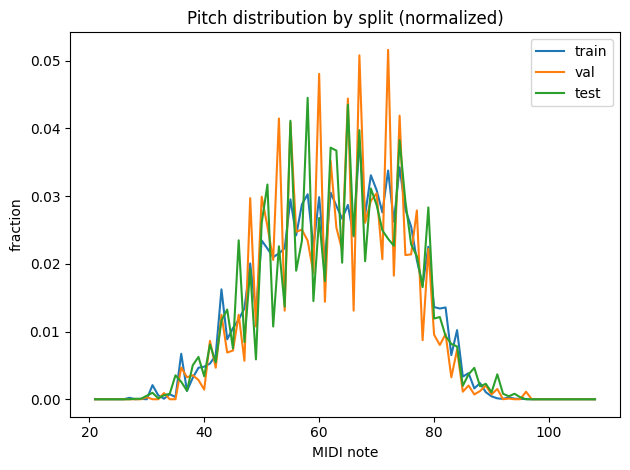

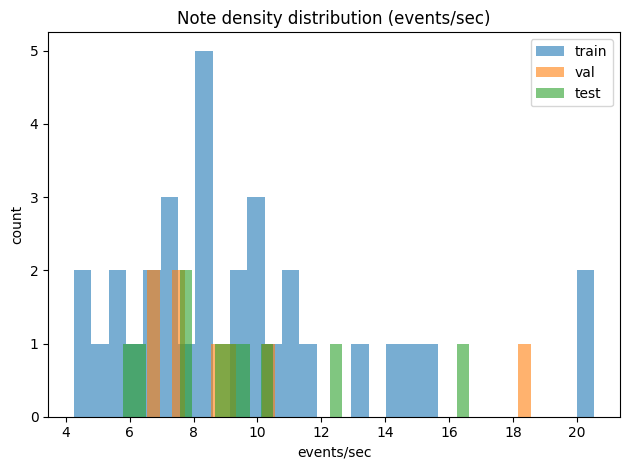

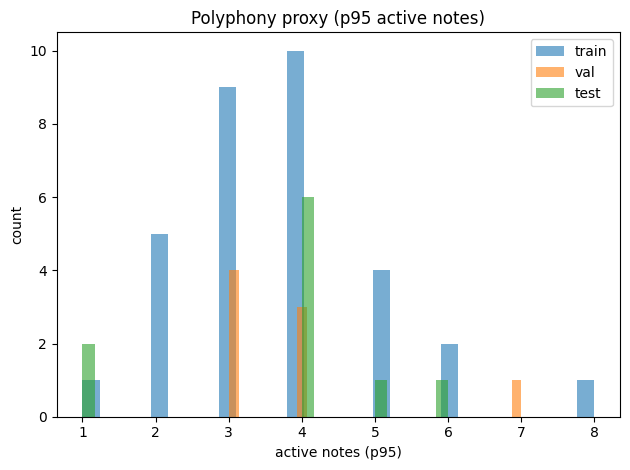

In [6]:
# BLOCK 3A: Deep dataset analysis
def load_labels_for_ids(ids: List[int], split_src: str) -> List[pd.DataFrame]:
    dfs = []
    for tid in ids:
        p = (TRAIN_LABEL_DIR / f"{tid}.csv") if split_src == "train" else (TEST_LABEL_DIR / f"{tid}.csv")
        df = read_label_csv(p)
        df["track_id"] = tid
        dfs.append(df)
    return dfs

train_label_dfs = load_labels_for_ids(train_ids, "train")
val_label_dfs   = load_labels_for_ids(val_ids,   "train")
test_label_dfs  = load_labels_for_ids(TEST_IDS,  "test")

def pitch_histogram(label_dfs: List[pd.DataFrame]) -> np.ndarray:
    counts = np.zeros(N_PITCH, dtype=np.int64)
    for df in label_dfs:
        for n in df["note"].values:
            n = int(n)
            if MIN_NOTE <= n <= MAX_NOTE:
                counts[note_to_id(n)] += 1
    return counts

def polyphony_sweep_stats(df: pd.DataFrame) -> Dict[str, float]:
    # Sweep active-note count at event boundaries in samples
    events = []
    for s in df["start_time"].values:
        events.append((int(s), +1))
    for e in df["end_time"].values:
        events.append((int(e), -1))
    events.sort(key=lambda x: (x[0], -x[1]))

    active = 0
    active_vals = []
    last_t = None
    for t, d in events:
        if last_t is not None and t != last_t:
            active_vals.append(active)
        active += d
        last_t = t

    if not active_vals:
        return {"poly_mean": 0.0, "poly_p95": 0.0, "poly_max": 0.0}
    arr = np.asarray(active_vals, dtype=np.float32)
    return {
        "poly_mean": float(arr.mean()),
        "poly_p95":  float(np.percentile(arr, 95)),
        "poly_max":  float(arr.max()),
    }

def split_label_summary(label_dfs: List[pd.DataFrame], split_name: str, sr: int = 44100) -> pd.DataFrame:
    rows = []
    for df in label_dfs:
        tid = int(df["track_id"].iloc[0])
        dur_s = float(df["end_time"].max() / sr) if len(df) else 0.0
        n_events = int(len(df))
        note_density = float(n_events / max(dur_s, 1e-9))
        pitch_min = int(df["note"].min()) if len(df) else -1
        pitch_max = int(df["note"].max()) if len(df) else -1
        pitch_mean = float(df["note"].mean()) if len(df) else float("nan")
        poly = polyphony_sweep_stats(df)
        rows.append({
            "split": split_name,
            "track_id": tid,
            "duration_s": dur_s,
            "n_events": n_events,
            "note_density": note_density,
            "pitch_min": pitch_min,
            "pitch_max": pitch_max,
            "pitch_mean": pitch_mean,
            **poly
        })
    return pd.DataFrame(rows)

df_train_summary = split_label_summary(train_label_dfs, "train")
df_val_summary   = split_label_summary(val_label_dfs,   "val")
df_test_summary  = split_label_summary(test_label_dfs,  "test")

track_summary = pd.concat([df_train_summary, df_val_summary, df_test_summary], axis=0, ignore_index=True)
display(track_summary.describe(include="all"))

# Pitch imbalance tables
train_counts = pitch_histogram(train_label_dfs)
val_counts   = pitch_histogram(val_label_dfs)
test_counts  = pitch_histogram(test_label_dfs)

pitch_df = pd.DataFrame({
    "note": [id_to_note(i) for i in range(N_PITCH)],
    "train_count": train_counts,
    "val_count": val_counts,
    "test_count": test_counts
})
pitch_df["train_pct"] = pitch_df["train_count"] / max(1, pitch_df["train_count"].sum())
pitch_df["val_pct"]   = pitch_df["val_count"]   / max(1, pitch_df["val_count"].sum())
pitch_df["test_pct"]  = pitch_df["test_count"]  / max(1, pitch_df["test_count"].sum())

display(pitch_df.sort_values("train_count", ascending=False).head(15))
display(pitch_df.sort_values("train_count", ascending=True).head(15))

# Plots: pitch distribution drift
plt.figure()
plt.plot(pitch_df["note"], pitch_df["train_pct"].values, label="train")
plt.plot(pitch_df["note"], pitch_df["val_pct"].values,   label="val")
plt.plot(pitch_df["note"], pitch_df["test_pct"].values,  label="test")
plt.title("Pitch distribution by split (normalized)")
plt.xlabel("MIDI note"); plt.ylabel("fraction")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "pitch_distribution_by_split.png", dpi=160)
plt.show()

# Plots: density and polyphony proxies
plt.figure()
plt.hist(df_train_summary["note_density"], bins=30, alpha=0.6, label="train")
plt.hist(df_val_summary["note_density"],   bins=30, alpha=0.6, label="val")
plt.hist(df_test_summary["note_density"],  bins=30, alpha=0.6, label="test")
plt.title("Note density distribution (events/sec)")
plt.xlabel("events/sec"); plt.ylabel("count")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "note_density_by_split.png", dpi=160)
plt.show()

plt.figure()
plt.hist(df_train_summary["poly_p95"], bins=30, alpha=0.6, label="train")
plt.hist(df_val_summary["poly_p95"],   bins=30, alpha=0.6, label="val")
plt.hist(df_test_summary["poly_p95"],  bins=30, alpha=0.6, label="test")
plt.title("Polyphony proxy (p95 active notes)")
plt.xlabel("active notes (p95)"); plt.ylabel("count")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "polyphony_p95_by_split.png", dpi=160)
plt.show()

### Input Feature for CTC: CQT versus HCQT

CQT: (252, 862) (F,T)
HCQT: (5, 252, 862) (C,F,T) harmonics: (0.5, 1.0, 2.0, 3.0, 4.0)


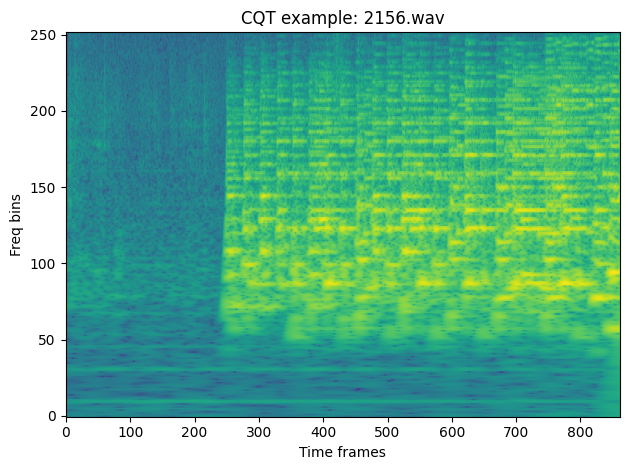

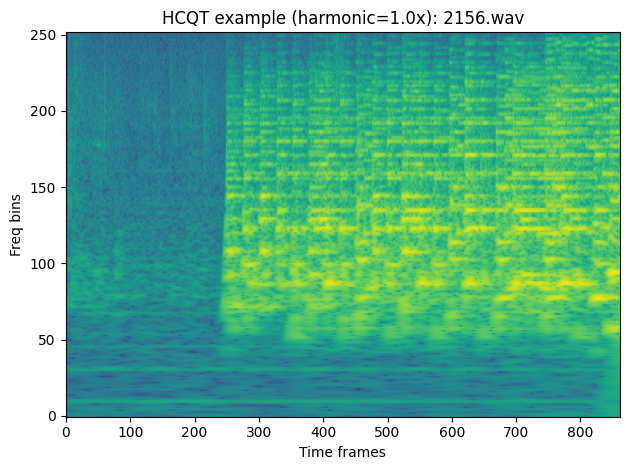

In [7]:
# BLOCK 4: Feature configs and computation
@dataclass
class PreprocConfig:
    sr: int = 44100
    mono: bool = True
    seg_seconds: float = 10.0
    hop_seconds: float = 5.0
    hop_length: int = 512
    bins_per_octave: int = 36
    n_bins: int = 252
    fmin: float = 32.7031956626
    log_eps: float = 1e-6
    normalize: bool = True

@dataclass
class HCQTConfig:
    harmonics: Tuple[float, ...] = (0.5, 1.0, 2.0, 3.0, 4.0)

CFG  = PreprocConfig()
HCFG = HCQTConfig()

def compute_cqt(y: np.ndarray, cfg: PreprocConfig) -> np.ndarray:
    C = librosa.cqt(
        y=y, sr=cfg.sr, hop_length=cfg.hop_length,
        fmin=cfg.fmin, n_bins=cfg.n_bins, bins_per_octave=cfg.bins_per_octave
    )
    X = np.log(np.abs(C).astype(np.float32) + cfg.log_eps)
    if cfg.normalize:
        X = (X - X.mean()) / (X.std() + 1e-8)
    return X.astype(np.float32)  # (F,T)

def compute_hcqt(y: np.ndarray, cfg: PreprocConfig, hcfg: HCQTConfig) -> np.ndarray:
    Xs = []
    for h in hcfg.harmonics:
        fmin_h = cfg.fmin * float(h)
        C = librosa.cqt(
            y=y, sr=cfg.sr, hop_length=cfg.hop_length,
            fmin=fmin_h, n_bins=cfg.n_bins, bins_per_octave=cfg.bins_per_octave
        )
        X = np.log(np.abs(C).astype(np.float32) + cfg.log_eps)
        Xs.append(X)
    X = np.stack(Xs, axis=0)  # (C,F,T)
    if cfg.normalize:
        X = (X - X.mean()) / (X.std() + 1e-8)
    return X.astype(np.float32)

# Feature sanity check plot
example_wav = train_wavs[0]
y, _ = librosa.load(example_wav, sr=CFG.sr, mono=CFG.mono)
seg_len = int(CFG.seg_seconds * CFG.sr)

Xc = compute_cqt(y[:seg_len], CFG)
Xh = compute_hcqt(y[:seg_len], CFG, HCFG)

print("CQT:", Xc.shape, "(F,T)")
print("HCQT:", Xh.shape, "(C,F,T) harmonics:", HCFG.harmonics)

plt.figure()
plt.imshow(Xc, aspect="auto", origin="lower")
plt.title(f"CQT example: {example_wav.name}")
plt.xlabel("Time frames"); plt.ylabel("Freq bins")
plt.tight_layout()
plt.savefig(FIG_DIR / "feat_cqt_example.png", dpi=160)
plt.show()

plt.figure()
plt.imshow(Xh[1], aspect="auto", origin="lower")
plt.title(f"HCQT example (harmonic={HCFG.harmonics[1]}x): {example_wav.name}")
plt.xlabel("Time frames"); plt.ylabel("Freq bins")
plt.tight_layout()
plt.savefig(FIG_DIR / "feat_hcqt_example.png", dpi=160)
plt.show()


### Precomputing segments for CQT and HCQT

In [9]:
# BLOCK 5: Precompute segments (cached)
CQT_DIR  = CACHE_DIR / "cqt_npz"
HCQT_DIR = CACHE_DIR / "hcqt_npz"
CQT_DIR.mkdir(parents=True, exist_ok=True)
HCQT_DIR.mkdir(parents=True, exist_ok=True)

MANIFEST_CQT  = CACHE_DIR / "manifest_cqt.csv"
MANIFEST_HCQT = CACHE_DIR / "manifest_hcqt.csv"

def events_to_token_sequence_pitch_only(events_df: pd.DataFrame, seg_start_samp: int, seg_end_samp: int) -> List[int]:
    # target tokens are based on onset (start_time) within segment
    df = events_df[(events_df["start_time"] >= seg_start_samp) & (events_df["start_time"] < seg_end_samp)].copy()
    if len(df) == 0:
        return []
    df["rel_start"] = df["start_time"] - seg_start_samp
    df = df.sort_values(["rel_start", "note"], ascending=[True, True])

    toks = []
    for n in df["note"].values:
        n = int(n)
        if MIN_NOTE <= n <= MAX_NOTE:
            toks.append(note_to_id(n))

    # compress immediate repeats
    out = []
    prev = None
    for t in toks:
        if t != prev:
            out.append(t)
        prev = t
    return out

def precompute_feature_npz(
    feature_type: str,
    out_dir: Path,
    manifest_path: Path,
    cfg: PreprocConfig,
    hcfg: Optional[HCQTConfig],
    splits: Dict[str, List[int]],
) -> pd.DataFrame:
    """
    Saves per-segment .npz with:
      - X: float16
          CQT : (F,T)
          HCQT: (C,F,T)
      - y: int32 pitch token sequence (onsets)
      - meta: json string
    """
    if manifest_path.exists():
        print("[CACHE] Using existing manifest:", manifest_path)
        return pd.read_csv(manifest_path)

    rows = []
    seg_len = int(cfg.seg_seconds * cfg.sr)
    hop_len = int(cfg.hop_seconds * cfg.sr)

    id_to_audio = {int(r["id"]): (Path(r["audio_path"]), Path(r["label_path"]), r["split_src"])
                   for _, r in index_df.iterrows()}

    def ids_for_split(sp: str) -> List[int]:
        if sp == "train": return splits["train_ids"]
        if sp == "val":   return splits["val_ids"]
        if sp == "test":  return splits["test_ids"]
        raise ValueError(sp)

    save_idx = 0
    for split in ["train", "val", "test"]:
        for tid in tqdm(ids_for_split(split), desc=f"precompute_{feature_type}_{split}"):
            audio_path, label_path, _ = id_to_audio[int(tid)]
            events = read_label_csv(label_path)

            y_audio, _ = librosa.load(audio_path, sr=cfg.sr, mono=cfg.mono)
            n_total = len(y_audio)

            for seg_start in range(0, max(1, n_total - seg_len + 1), hop_len):
                seg_end = seg_start + seg_len
                if seg_end > n_total:
                    break

                tok = events_to_token_sequence_pitch_only(events, seg_start, seg_end)
                if len(tok) == 0:
                    continue  # skip empty targets to reduce degenerate all blank segments

                y_seg = y_audio[seg_start:seg_end]

                if feature_type == "cqt":
                    X = compute_cqt(y_seg, cfg)        # (F,T)
                    n_frames = int(X.shape[1])
                elif feature_type == "hcqt":
                    assert hcfg is not None
                    X = compute_hcqt(y_seg, cfg, hcfg) # (C,F,T)
                    n_frames = int(X.shape[2])
                else:
                    raise ValueError("feature_type must be 'cqt' or 'hcqt'")

                npz_path = out_dir / f"{split}_id{tid}_seg{save_idx:05d}.npz"
                meta_out = {
                    "track_id": int(tid), "split": split,
                    "audio_path": str(audio_path), "label_path": str(label_path),
                    "seg_start_samp": int(seg_start), "seg_end_samp": int(seg_end),
                    "sr": cfg.sr, "hop_length": cfg.hop_length,
                    "bins_per_octave": cfg.bins_per_octave, "n_bins": cfg.n_bins, "fmin": cfg.fmin,
                    "token_type": "pitch_only", "min_note": MIN_NOTE, "max_note": MAX_NOTE,
                    "feature_type": feature_type,
                    "hcqt_harmonics": (list(hcfg.harmonics) if hcfg else None),
                }

                np.savez_compressed(
                    npz_path,
                    X=X.astype(np.float16),
                    y=np.asarray(tok, dtype=np.int32),
                    meta=json.dumps(meta_out),
                )

                rows.append({
                    "split": split,
                    "track_id": int(tid),
                    "seg_idx": int(save_idx),
                    "npz_path": str(npz_path),
                    "n_frames": int(n_frames),
                    "n_tokens": int(len(tok)),
                    "feature_type": feature_type,
                })
                save_idx += 1

    manifest = pd.DataFrame(rows)
    manifest.to_csv(manifest_path, index=False)
    print("Saved manifest:", manifest_path, "| rows:", len(manifest))
    print(manifest["split"].value_counts())
    return manifest

manifest_cqt  = precompute_feature_npz("cqt",  CQT_DIR,  MANIFEST_CQT,  CFG, None, splits)
manifest_hcqt = precompute_feature_npz("hcqt", HCQT_DIR, MANIFEST_HCQT, CFG, HCFG, splits)

display(manifest_cqt.head())
display(manifest_hcqt.head())


[CACHE] Using existing manifest: /home/jovyan/shared/s0599003/ctc_runs/cache/manifest_cqt.csv
[CACHE] Using existing manifest: /home/jovyan/shared/s0599003/ctc_runs/cache/manifest_hcqt.csv


,split,track_id,seg_idx,npz_path,n_frames,n_tokens,feature_type
0,train,2194,0,/home/jovyan/shared/s0599003/ctc_runs/cache/cq...,862,41,cqt
1,train,2194,1,/home/jovyan/shared/s0599003/ctc_runs/cache/cq...,862,40,cqt
2,train,2194,2,/home/jovyan/shared/s0599003/ctc_runs/cache/cq...,862,45,cqt
3,train,2194,3,/home/jovyan/shared/s0599003/ctc_runs/cache/cq...,862,49,cqt
4,train,2194,4,/home/jovyan/shared/s0599003/ctc_runs/cache/cq...,862,44,cqt


,split,track_id,seg_idx,npz_path,n_frames,n_tokens,feature_type
0,train,2194,0,/home/jovyan/shared/s0599003/ctc_runs/cache/hc...,862,41,hcqt
1,train,2194,1,/home/jovyan/shared/s0599003/ctc_runs/cache/hc...,862,40,hcqt
2,train,2194,2,/home/jovyan/shared/s0599003/ctc_runs/cache/hc...,862,45,hcqt
3,train,2194,3,/home/jovyan/shared/s0599003/ctc_runs/cache/hc...,862,49,hcqt
4,train,2194,4,/home/jovyan/shared/s0599003/ctc_runs/cache/hc...,862,44,hcqt


### Curriculum Schedule by token length

CQT token length percentiles: {
  "train": {
    "p50": 93.5,
    "p75": 120.0,
    "p90": 175.30000000000007,
    "p95": 208.29999999999995,
    "p99": 314.1199999999999,
    "p100": 366.0
  },
  "val": {
    "p50": 90.5,
    "p75": 121.0,
    "p90": 183.0,
    "p95": 202.75,
    "p99": 230.60000000000002,
    "p100": 234.0
  },
  "test": {
    "p50": 86.5,
    "p75": 109.0,
    "p90": 138.0,
    "p95": 153.60000000000014,
    "p99": 233.0,
    "p100": 241.0
  }
}
HCQT token length percentiles: {
  "train": {
    "p50": 93.5,
    "p75": 120.0,
    "p90": 175.30000000000007,
    "p95": 208.29999999999995,
    "p99": 314.1199999999999,
    "p100": 366.0
  },
  "val": {
    "p50": 90.5,
    "p75": 121.0,
    "p90": 183.0,
    "p95": 202.75,
    "p99": 230.60000000000002,
    "p100": 234.0
  },
  "test": {
    "p50": 86.5,
    "p75": 109.0,
    "p90": 138.0,
    "p95": 153.60000000000014,
    "p99": 233.0,
    "p100": 241.0
  }
}


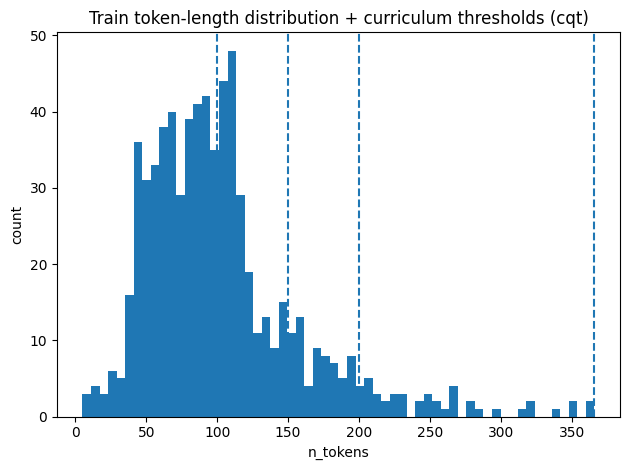

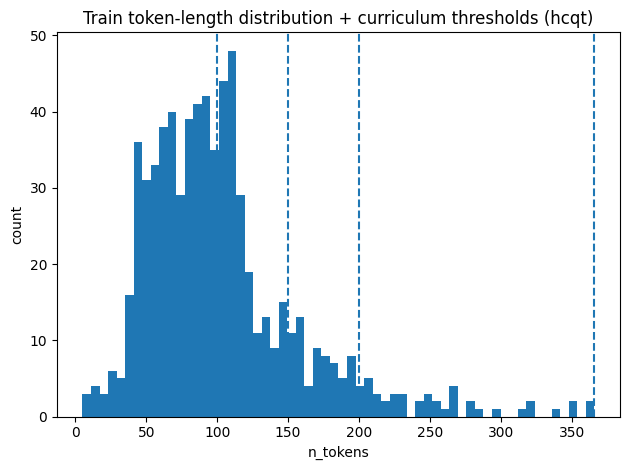

In [10]:
# BLOCK 5B
def token_length_percentiles(manifest: pd.DataFrame) -> Dict[str, Dict[str, float]]:
    def perc(arr):
        ps = [50, 75, 90, 95, 99, 100]
        return {f"p{p}": float(np.percentile(arr, p)) for p in ps}
    out = {}
    for sp in ["train", "val", "test"]:
        a = manifest[manifest["split"] == sp]["n_tokens"].values
        out[sp] = perc(a) if len(a) else {}
    return out

print("CQT token length percentiles:", json.dumps(token_length_percentiles(manifest_cqt), indent=2))
print("HCQT token length percentiles:", json.dumps(token_length_percentiles(manifest_hcqt), indent=2))

train_cqt = manifest_cqt[manifest_cqt["split"]=="train"].reset_index(drop=True)
val_cqt   = manifest_cqt[manifest_cqt["split"]=="val"].reset_index(drop=True)
test_cqt  = manifest_cqt[manifest_cqt["split"]=="test"].reset_index(drop=True)

train_hcqt= manifest_hcqt[manifest_hcqt["split"]=="train"].reset_index(drop=True)
val_hcqt  = manifest_hcqt[manifest_hcqt["split"]=="val"].reset_index(drop=True)
test_hcqt = manifest_hcqt[manifest_hcqt["split"]=="test"].reset_index(drop=True)

CURRICULUM_PHASES = [
    (0,   100, "Phase 1: Easy segments only"),
    (20,  150, "Phase 2: Add medium segments"),
    (40,  200, "Phase 3: Add hard segments"),
    (60,  366, "Phase 4: All data including very hard"),
]

def curriculum_max_tokens(epoch: int) -> Tuple[int, str]:
    current = CURRICULUM_PHASES[0]
    for e0, mx, desc in CURRICULUM_PHASES:
        if epoch >= e0:
            current = (e0, mx, desc)
    return int(current[1]), str(current[2])

def filter_by_max_tokens(manifest: pd.DataFrame, max_tokens: int) -> pd.DataFrame:
    return manifest[manifest["n_tokens"] <= max_tokens].reset_index(drop=True)

def plot_curriculum_coverage(train_manifest: pd.DataFrame, tag: str):
    lens = train_manifest["n_tokens"].values
    plt.figure()
    plt.hist(lens, bins=60)
    for _, mx, _ in CURRICULUM_PHASES:
        plt.axvline(mx, linestyle="--")
    plt.title(f"Train token-length distribution + curriculum thresholds ({tag})")
    plt.xlabel("n_tokens"); plt.ylabel("count")
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"curriculum_thresholds_{tag}.png", dpi=160)
    plt.show()

plot_curriculum_coverage(train_cqt, "cqt")
plot_curriculum_coverage(train_hcqt, "hcqt")


### Augmentation for the experiments

In [11]:
# BLOCK 6: Augmentation
@dataclass
class AugmentConfig:
    enabled: bool = False
    freq_shift_bins_max: int = 2
    semitone_shift_max: int = 1
    noise_std: float = 0.015
    p_noise: float = 0.4
    p_specaug: float = 0.35
    time_mask_max: int = 12
    freq_mask_max: int = 10
    n_time_masks: int = 1
    n_freq_masks: int = 1

AUG_OFF = AugmentConfig(enabled=False)
AUG_ON  = AugmentConfig(enabled=True)

def _randint(rng: np.random.RandomState, lo: int, hi: int) -> int:
    if hi < lo:
        return lo
    return int(rng.randint(lo, hi+1))

def apply_feature_augment(X: np.ndarray, cfg: AugmentConfig, bins_per_octave: int, rng: np.random.RandomState) -> np.ndarray:
    """
    X in canonical shape:
      - CQT : (T,F)
      - HCQT: (C,T,F)
    """
    if not cfg.enabled:
        return X

    X_aug = X.copy()

    # total frequency shift in bins
    total_shift_bins = 0
    if cfg.freq_shift_bins_max > 0:
        total_shift_bins += _randint(rng, -cfg.freq_shift_bins_max, cfg.freq_shift_bins_max)

    if cfg.semitone_shift_max > 0:
        semi = _randint(rng, -cfg.semitone_shift_max, cfg.semitone_shift_max)
        bins_per_semi = int(round(bins_per_octave / 12.0))
        total_shift_bins += semi * bins_per_semi

    if total_shift_bins != 0:
        X_aug = np.roll(X_aug, shift=total_shift_bins, axis=-1)

    # noise
    if rng.rand() < cfg.p_noise:
        X_aug = X_aug + rng.normal(0.0, cfg.noise_std, size=X_aug.shape).astype(X_aug.dtype)

    # mild SpecAugment
    if rng.rand() < cfg.p_specaug:
        if X_aug.ndim == 2:
            T, F = X_aug.shape
            for _ in range(cfg.n_time_masks):
                w = _randint(rng, 0, cfg.time_mask_max)
                if w > 0:
                    t0 = _randint(rng, 0, max(0, T - w))
                    X_aug[t0:t0+w, :] = 0
            for _ in range(cfg.n_freq_masks):
                w = _randint(rng, 0, cfg.freq_mask_max)
                if w > 0:
                    f0 = _randint(rng, 0, max(0, F - w))
                    X_aug[:, f0:f0+w] = 0
        else:
            C, T, F = X_aug.shape
            for _ in range(cfg.n_time_masks):
                w = _randint(rng, 0, cfg.time_mask_max)
                if w > 0:
                    t0 = _randint(rng, 0, max(0, T - w))
                    X_aug[:, t0:t0+w, :] = 0
            for _ in range(cfg.n_freq_masks):
                w = _randint(rng, 0, cfg.freq_mask_max)
                if w > 0:
                    f0 = _randint(rng, 0, max(0, F - w))
                    X_aug[:, :, f0:f0+w] = 0

    return X_aug


### Dataset + Collate + Dataloader

In [12]:
# BLOCK 7
class MusicNetNPZDataset(Dataset):
    def __init__(self, manifest: pd.DataFrame, augment_cfg: AugmentConfig, seed: int = 0):
        self.manifest = manifest.reset_index(drop=True)
        self.augment_cfg = augment_cfg
        self.rng = np.random.RandomState(seed)

    def __len__(self) -> int:
        return len(self.manifest)

    def __getitem__(self, idx: int):
        row = self.manifest.iloc[idx]
        d = np.load(row["npz_path"], allow_pickle=False)
        X = d["X"]  # float16
        y = d["y"].astype(np.int64)
        meta = json.loads(str(d["meta"]))

        feature_type = meta["feature_type"]

        # canonical shapes:
        # CQT saved (F,T) -> (T,F)
        # HCQT saved (C,F,T) -> (C,T,F)
        if feature_type == "cqt":
            X = X.astype(np.float32).T
        else:
            X = X.astype(np.float32).transpose(0, 2, 1)

        X = apply_feature_augment(X, self.augment_cfg, bins_per_octave=CFG.bins_per_octave, rng=self.rng)

        return {"X": torch.from_numpy(X), "y": torch.from_numpy(y), "meta": meta}

def collate_batch(batch: List[Dict[str, Any]]):
    Xs = [b["X"] for b in batch]
    ys = [b["y"] for b in batch]
    metas = [b["meta"] for b in batch]

    if Xs[0].dim() == 2:
        x_lens = torch.tensor([x.shape[0] for x in Xs], dtype=torch.long)
        T_max = int(x_lens.max().item())
        Fdim = int(Xs[0].shape[1])
        X_pad = torch.zeros((len(Xs), T_max, Fdim), dtype=torch.float32)
        for i, x in enumerate(Xs):
            X_pad[i, :x.shape[0], :] = x
    else:
        x_lens = torch.tensor([x.shape[1] for x in Xs], dtype=torch.long)
        T_max = int(x_lens.max().item())
        Cdim = int(Xs[0].shape[0])
        Fdim = int(Xs[0].shape[2])
        X_pad = torch.zeros((len(Xs), Cdim, T_max, Fdim), dtype=torch.float32)
        for i, x in enumerate(Xs):
            X_pad[i, :, :x.shape[1], :] = x

    y_lens = torch.tensor([len(y) for y in ys], dtype=torch.long)
    y_max = int(y_lens.max().item()) if len(ys) else 0
    y_pad = torch.full((len(ys), y_max), PAD_ID, dtype=torch.long)
    for i, y in enumerate(ys):
        y_pad[i, :len(y)] = y

    return X_pad, x_lens, y_pad, y_lens, metas

def make_loader(ds: Dataset, batch_size: int, shuffle: bool) -> DataLoader:
    kwargs = dict(
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        collate_fn=collate_batch,
        drop_last=False,
    )
    if NUM_WORKERS > 0:
        kwargs["persistent_workers"] = True
        kwargs["prefetch_factor"] = 2

    try:
        return DataLoader(ds, **kwargs)
    except Exception as e:
        print("DataLoader failed with num_workers=", NUM_WORKERS, "-> retry with num_workers=0. Error:", repr(e))
        kwargs["num_workers"] = 0
        kwargs.pop("persistent_workers", None)
        kwargs.pop("prefetch_factor", None)
        return DataLoader(ds, **kwargs)


### Shared Encoder CNN + BiLSTM (Architecture kept the same for both methods)

In [13]:
# BLOCK 8: CNN + BiLSTM + CTC
def infer_channels_and_freqbins(Xb: torch.Tensor):
    # Xb: (B,T,F) or (B,C,T,F)
    if Xb.dim() == 3:
        return 1, int(Xb.shape[-1])
    if Xb.dim() == 4:
        return int(Xb.shape[1]), int(Xb.shape[-1])
    raise ValueError(f"Unexpected X shape: {tuple(Xb.shape)}")

class CNNBiLSTMEncoder(nn.Module):
    def __init__(self, in_channels: int, n_freq_bins: int,
                 cnn_channels: Tuple[int, int] = (32, 64),
                 lstm_hidden: int = 256,
                 lstm_layers: int = 2,
                 dropout: float = 0.1):
        super().__init__()
        c1, c2 = cnn_channels

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, c1, kernel_size=3, padding=1),
            nn.BatchNorm2d(c1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=(1, 2)),

            nn.Conv2d(c1, c2, kernel_size=3, padding=1),
            nn.BatchNorm2d(c2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=(1, 2)),
        )

        f_after = n_freq_bins // 4
        self.lstm_in = c2 * f_after

        self.bilstm = nn.LSTM(
            input_size=self.lstm_in,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            bidirectional=True,
            batch_first=True,
            dropout=dropout if lstm_layers > 1 else 0.0,
        )
        self.out_dim = 2 * lstm_hidden

    def forward(self, X: torch.Tensor, x_lens: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        if X.dim() == 3:
            X = X.unsqueeze(1)  # (B,1,T,F)
        Z = self.conv(X)       # (B,C2,T,F')
        B, C, T, Fp = Z.shape
        Z = Z.permute(0, 2, 1, 3).contiguous().view(B, T, C * Fp)
        out, _ = self.bilstm(Z)
        return out, x_lens

class CTCTranscriber(nn.Module):
    def __init__(self, in_channels: int, n_freq_bins: int, vocab_size: int = TOTAL_VOCAB_SIZE):
        super().__init__()
        self.encoder = CNNBiLSTMEncoder(in_channels=in_channels, n_freq_bins=n_freq_bins)
        self.classifier = nn.Linear(self.encoder.out_dim, vocab_size)

    def forward(self, X: torch.Tensor, x_lens: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        H, out_lens = self.encoder(X, x_lens)
        logits = self.classifier(H)                # (B,T,V)
        log_probs = F.log_softmax(logits, dim=-1)  # (B,T,V)
        return log_probs, out_lens


### Greedy Decoding and the apadtive blank penalty schedule

In [14]:
# BLOCK 9
class AdaptiveBlankPenaltySchedule:
    def __init__(self, start_alpha=0.15, end_alpha=0.05, warmup_epochs=20):
        self.start_alpha = float(start_alpha)
        self.end_alpha = float(end_alpha)
        self.warmup_epochs = int(warmup_epochs)

    def alpha(self, epoch: int) -> float:
        if epoch <= 0:
            return self.start_alpha
        if epoch >= self.warmup_epochs:
            return self.end_alpha
        t = epoch / float(self.warmup_epochs)
        return self.start_alpha + t * (self.end_alpha - self.start_alpha)

BLANK_SCHED = AdaptiveBlankPenaltySchedule(start_alpha=0.15, end_alpha=0.05, warmup_epochs=20)

def apply_blank_penalty(log_probs: torch.Tensor, blank_id: int, alpha: float) -> torch.Tensor:
    # Penalize blank by subtracting alpha from its log-prob
    if alpha <= 0:
        return log_probs
    lp = log_probs.clone()
    lp[..., blank_id] = lp[..., blank_id] - float(alpha)
    return lp

def ctc_collapse_best_path(best_path: List[int], blank_id: int) -> List[int]:
    out = []
    prev = None
    for t in best_path:
        if t == blank_id:
            prev = t
            continue
        if t != prev:
            out.append(int(t))
        prev = t
    return out

def greedy_decode(log_probs_1: torch.Tensor, out_len: int, blank_id: int, alpha: float = 0.0) -> List[int]:
    # log_probs_1: (T,V)
    lp = log_probs_1[:out_len]
    lp = apply_blank_penalty(lp, blank_id, alpha)
    best = torch.argmax(lp, dim=-1).detach().cpu().tolist()
    return ctc_collapse_best_path(best, blank_id)


### Metrics and Diagnostics

In [15]:
# BLOCK 10
def levenshtein_distance(a: List[int], b: List[int]) -> int:
    n, m = len(a), len(b)
    if n == 0: return m
    if m == 0: return n
    dp = np.zeros((n+1, m+1), dtype=np.int32)
    dp[:, 0] = np.arange(n+1)
    dp[0, :] = np.arange(m+1)
    for i in range(1, n+1):
        ai = a[i-1]
        for j in range(1, m+1):
            cost = 0 if ai == b[j-1] else 1
            dp[i, j] = min(dp[i-1, j] + 1, dp[i, j-1] + 1, dp[i-1, j-1] + cost)
    return int(dp[n, m])

def token_prf(pred: List[int], tgt: List[int]) -> Tuple[float, float, float]:
    pc = Counter(pred)
    tc = Counter(tgt)
    inter = sum((pc & tc).values())
    p = inter / max(1, len(pred))
    r = inter / max(1, len(tgt))
    f1 = 2*p*r / max(1e-9, p+r)
    return float(p), float(r), float(f1)

def eval_sequence_metrics(pred: List[int], tgt: List[int]) -> Dict[str, float]:
    dist = levenshtein_distance(pred, tgt)
    ter = dist / max(1, len(tgt))
    p, r, f1 = token_prf(pred, tgt)
    len_ratio = len(pred) / max(1, len(tgt))
    return {"TER": float(ter), "token_P": p, "token_R": r, "token_F1": f1, "len_ratio": float(len_ratio)}

def compute_blank_statistics(log_probs: torch.Tensor, out_lens: torch.Tensor, blank_id: int) -> Dict[str, float]:
    probs = torch.exp(log_probs.detach())
    B, T, V = probs.shape
    mask = torch.arange(T, device=probs.device)[None, :] < out_lens[:, None]

    blank_probs = probs[..., blank_id][mask]
    if blank_probs.numel() == 0:
        return {"pct_frames_blank": 1.0, "blank_prob_mean": 1.0, "non_blank_prob_mean": 0.0, "n_unique_tokens": 0.0}

    argmax = torch.argmax(log_probs.detach(), dim=-1)[mask]
    pct_blank = float((argmax == blank_id).float().mean().item())

    blank_prob_mean = float(blank_probs.mean().item())
    non_blank_prob_mean = float((1.0 - blank_probs).mean().item())

    non_blank_tokens = argmax[argmax != blank_id].detach().cpu().numpy().tolist()
    n_unique = float(len(set(non_blank_tokens)))

    return {
        "pct_frames_blank": pct_blank,
        "blank_prob_mean": blank_prob_mean,
        "non_blank_prob_mean": non_blank_prob_mean,
        "n_unique_tokens": n_unique,
    }

def compute_entropy_statistics(log_probs: torch.Tensor, out_lens: torch.Tensor) -> Dict[str, float]:
    probs = torch.exp(log_probs.detach())
    B, T, V = probs.shape
    mask = torch.arange(T, device=probs.device)[None, :] < out_lens[:, None]
    ent = -(probs * log_probs.detach()).sum(dim=-1)[mask]
    if ent.numel() == 0:
        return {"entropy_mean": float("nan"), "entropy_normalized": float("nan")}
    mean_entropy = float(ent.mean().item())
    max_entropy = float(np.log(V))
    return {"entropy_mean": mean_entropy, "entropy_normalized": mean_entropy / max_entropy}

def compute_gradient_stats(model: nn.Module) -> Dict[str, float]:
    total_norm_sq = 0.0
    out = {}
    for name, p in model.named_parameters():
        if p.grad is None:
            continue
        g = p.grad.data.norm(2).item()
        total_norm_sq += g ** 2
        lname = name.lower()
        if "classifier" in lname:
            out["classifier"] = g
        elif "lstm" in lname:
            out["lstm"] = g
        elif "conv" in lname or "cnn" in lname:
            out["cnn"] = g
    out["total"] = float(total_norm_sq ** 0.5)
    return out

def per_pitch_pr(pred_seqs: List[List[int]], tgt_seqs: List[List[int]]) -> pd.DataFrame:
    tp = np.zeros(N_PITCH, dtype=np.int64)
    fp = np.zeros(N_PITCH, dtype=np.int64)
    fn = np.zeros(N_PITCH, dtype=np.int64)

    for pred, tgt in zip(pred_seqs, tgt_seqs):
        pc = Counter([t for t in pred if 0 <= t < N_PITCH])
        tc = Counter([t for t in tgt if 0 <= t < N_PITCH])
        inter = pc & tc
        for k, v in inter.items():
            tp[k] += v
        for k, v in (pc - tc).items():
            fp[k] += v
        for k, v in (tc - pc).items():
            fn[k] += v

    rows = []
    for i in range(N_PITCH):
        P = tp[i] / max(1, tp[i] + fp[i])
        R = tp[i] / max(1, tp[i] + fn[i])
        F1 = 2*P*R / max(1e-9, P+R)
        rows.append({"note": id_to_note(i), "P": float(P), "R": float(R), "F1": float(F1),
                     "tp": int(tp[i]), "fp": int(fp[i]), "fn": int(fn[i])})
    return pd.DataFrame(rows)


### Metrics (TER, token F1, per-pitch PR, blank stats, entropy, gradients, emission)

In [16]:
def levenshtein_distance(a: List[int], b: List[int]) -> int:
    n, m = len(a), len(b)
    if n == 0: return m
    if m == 0: return n
    dp = np.zeros((n+1, m+1), dtype=np.int32)
    dp[:, 0] = np.arange(n+1)
    dp[0, :] = np.arange(m+1)
    for i in range(1, n+1):
        ai = a[i-1]
        for j in range(1, m+1):
            cost = 0 if ai == b[j-1] else 1
            dp[i, j] = min(dp[i-1, j] + 1, dp[i, j-1] + 1, dp[i-1, j-1] + cost)
    return int(dp[n, m])

def token_prf(pred: List[int], tgt: List[int]) -> Tuple[float, float, float]:
    pc = Counter(pred)
    tc = Counter(tgt)
    inter = sum((pc & tc).values())
    p = inter / max(1, len(pred))
    r = inter / max(1, len(tgt))
    f1 = 2*p*r / max(1e-9, p+r)
    return float(p), float(r), float(f1)

def eval_sequence_metrics(pred: List[int], tgt: List[int]) -> Dict[str, float]:
    dist = levenshtein_distance(pred, tgt)
    ter = dist / max(1, len(tgt))
    p, r, f1 = token_prf(pred, tgt)
    len_ratio = len(pred) / max(1, len(tgt))
    return {"TER": float(ter), "token_P": p, "token_R": r, "token_F1": f1, "len_ratio": float(len_ratio)}

def compute_blank_statistics(log_probs: torch.Tensor, out_lens: torch.Tensor, blank_id: int) -> Dict[str, float]:
    probs = torch.exp(log_probs.detach())
    B, T, V = probs.shape
    mask = torch.arange(T, device=probs.device)[None, :] < out_lens[:, None]

    blank_probs = probs[..., blank_id][mask]
    if blank_probs.numel() == 0:
        return {"pct_frames_blank": 1.0, "blank_prob_mean": 1.0, "non_blank_prob_mean": 0.0, "n_unique_tokens": 0.0}

    argmax = torch.argmax(log_probs.detach(), dim=-1)[mask]
    pct_blank = float((argmax == blank_id).float().mean().item())

    blank_prob_mean = float(blank_probs.mean().item())
    non_blank_prob_mean = float((1.0 - blank_probs).mean().item())

    non_blank_tokens = argmax[argmax != blank_id].detach().cpu().numpy().tolist()
    n_unique = float(len(set(non_blank_tokens)))

    return {
        "pct_frames_blank": pct_blank,
        "blank_prob_mean": blank_prob_mean,
        "non_blank_prob_mean": non_blank_prob_mean,
        "n_unique_tokens": n_unique,
    }

def compute_entropy_statistics(log_probs: torch.Tensor, out_lens: torch.Tensor) -> Dict[str, float]:
    probs = torch.exp(log_probs.detach())
    B, T, V = probs.shape
    mask = torch.arange(T, device=probs.device)[None, :] < out_lens[:, None]
    ent = -(probs * log_probs.detach()).sum(dim=-1)[mask]
    if ent.numel() == 0:
        return {"entropy_mean": float("nan"), "entropy_normalized": float("nan")}
    mean_entropy = float(ent.mean().item())
    max_entropy = float(np.log(V))
    return {"entropy_mean": mean_entropy, "entropy_normalized": mean_entropy / max_entropy}

def compute_gradient_stats(model: nn.Module) -> Dict[str, float]:
    total_norm_sq = 0.0
    out = {}
    for name, p in model.named_parameters():
        if p.grad is None:
            continue
        g = p.grad.data.norm(2).item()
        total_norm_sq += g ** 2
        lname = name.lower()
        if "classifier" in lname:
            out["classifier"] = g
        elif "lstm" in lname:
            out["lstm"] = g
        elif "conv" in lname or "cnn" in lname:
            out["cnn"] = g
    out["total"] = float(total_norm_sq ** 0.5)
    return out

def per_pitch_pr(pred_seqs: List[List[int]], tgt_seqs: List[List[int]]) -> pd.DataFrame:
    tp = np.zeros(N_PITCH, dtype=np.int64)
    fp = np.zeros(N_PITCH, dtype=np.int64)
    fn = np.zeros(N_PITCH, dtype=np.int64)

    for pred, tgt in zip(pred_seqs, tgt_seqs):
        pc = Counter([t for t in pred if 0 <= t < N_PITCH])
        tc = Counter([t for t in tgt if 0 <= t < N_PITCH])
        inter = pc & tc
        for k, v in inter.items():
            tp[k] += v
        for k, v in (pc - tc).items():
            fp[k] += v
        for k, v in (tc - pc).items():
            fn[k] += v

    rows = []
    for i in range(N_PITCH):
        P = tp[i] / max(1, tp[i] + fp[i])
        R = tp[i] / max(1, tp[i] + fn[i])
        F1 = 2*P*R / max(1e-9, P+R)
        rows.append({"note": id_to_note(i), "P": float(P), "R": float(R), "F1": float(F1),
                     "tp": int(tp[i]), "fp": int(fp[i]), "fn": int(fn[i])})
    return pd.DataFrame(rows)


### Loss and alignment visualization

In [17]:
# BLOCK 11
ctc_loss_fn = nn.CTCLoss(blank=CTC_BLANK_ID, reduction="mean", zero_infinity=True)

def ctc_loss_from_batch(log_probs: torch.Tensor, out_lens: torch.Tensor,
                        y_pad: torch.Tensor, y_lens: torch.Tensor) -> torch.Tensor:
    lp = log_probs.permute(1, 0, 2)  # (T,B,V)
    targets = []
    for i in range(y_pad.shape[0]):
        targets.append(y_pad[i, :y_lens[i]].contiguous())
    targets = torch.cat(targets, dim=0) if len(targets) else torch.empty((0,), dtype=torch.long, device=log_probs.device)
    return ctc_loss_fn(lp, targets, out_lens, y_lens)

def plot_alignment_sanity(
    log_probs_1: torch.Tensor, out_len: int, meta: Dict[str, Any],
    tgt_tokens: List[int], pred_tokens: List[int],
    save_dir: Path
):
    save_dir.mkdir(parents=True, exist_ok=True)

    lp = log_probs_1[:out_len].detach().cpu()
    probs = torch.exp(lp)
    blank_p = probs[:, CTC_BLANK_ID].numpy()
    best = torch.argmax(lp, dim=-1).numpy()

    plt.figure(figsize=(12, 4))
    plt.plot(blank_p)
    plt.title(f"Blank probability over frames | track {meta['track_id']} | start {meta['seg_start_samp']}")
    plt.xlabel("frame"); plt.ylabel("P(blank)")
    plt.tight_layout()
    plt.savefig(save_dir / "alignment_blankprob.png", dpi=160)
    plt.show()

    plt.figure(figsize=(12, 3))
    plt.plot(best)
    plt.title("Framewise argmax token id (includes blank)")
    plt.xlabel("frame"); plt.ylabel("token id")
    plt.tight_layout()
    plt.savefig(save_dir / "alignment_argmax.png", dpi=160)
    plt.show()

    print("Target len:", len(tgt_tokens), "| Pred len:", len(pred_tokens))
    print("Target (first 40):", tgt_tokens[:40])
    print("Pred   (first 40):", pred_tokens[:40])


In [18]:
# BLOCK 12: Training loop
@dataclass
class TrainConfig:
    epochs: int = 80
    batch_size: int = 8
    lr: float = 1e-3
    weight_decay: float = 1e-4
    grad_clip: float = 1.0
    amp: bool = True

    # Greedy-only blank-penalty ablation grid
    decode_blank_alphas: Tuple[float, ...] = (0.0, 0.05, 0.10, 0.15)

def evaluate_model_greedy(
    model: nn.Module,
    loader: DataLoader,
    blank_alpha: float,
) -> Dict[str, Any]:
    model.eval()
    loss_sum = 0.0
    n_batches = 0

    all_pred = []
    all_tgt  = []

    with torch.no_grad():
        for X, x_lens, y_pad, y_lens, metas in loader:
            X = X.to(DEVICE, non_blocking=True)
            x_lens = x_lens.to(DEVICE)
            y_pad = y_pad.to(DEVICE)
            y_lens = y_lens.to(DEVICE)

            log_probs, out_lens = model(X, x_lens)
            loss = ctc_loss_from_batch(log_probs, out_lens, y_pad, y_lens)
            loss_sum += float(loss.item())
            n_batches += 1

            for i in range(log_probs.shape[0]):
                lp1 = log_probs[i]
                ol  = int(out_lens[i].item())
                tgt = y_pad[i, :y_lens[i]].detach().cpu().tolist()
                pred = greedy_decode(lp1, ol, CTC_BLANK_ID, alpha=blank_alpha)
                all_pred.append(pred)
                all_tgt.append(tgt)

    metrics = {"loss": loss_sum / max(1, n_batches)}
    ters, f1s, lrs = [], [], []
    for p, t in zip(all_pred, all_tgt):
        m = eval_sequence_metrics(p, t)
        ters.append(m["TER"])
        f1s.append(m["token_F1"])
        lrs.append(m["len_ratio"])

    metrics.update({
        "TER": float(np.mean(ters)) if ters else float("nan"),
        "token_F1": float(np.mean(f1s)) if f1s else float("nan"),
        "len_ratio": float(np.mean(lrs)) if lrs else float("nan"),
        "pred_seqs": all_pred,
        "tgt_seqs": all_tgt,
    })
    return metrics

def print_detailed_metrics(epoch, train_loss, val_metrics, blank_stats, grad_stats, entropy_stats, curriculum_desc):
    print("\n" + "="*80)
    print(f"EPOCH {epoch:03d} - Detailed Analysis")
    print("="*80)
    print(f"Curriculum: {curriculum_desc}")
    print(f"Loss:       {train_loss:.4f}")
    print(f"Val F1:     {val_metrics['token_F1']:.4f}")
    print(f"Val TER:    {val_metrics['TER']:.4f}")
    print(f"Len Ratio:  {val_metrics['len_ratio']:.3f}")

    print("\nBLANK DIAGNOSTICS:")
    print(f"  Frames blank (argmax):  {blank_stats['pct_frames_blank']*100:.1f}%")
    print(f"  Mean P(blank):          {blank_stats['blank_prob_mean']:.3f}")
    print(f"  Mean non-blank prob:    {blank_stats['non_blank_prob_mean']:.3f}")
    print(f"  Unique tokens (argmax): {int(blank_stats['n_unique_tokens'])}")

    if blank_stats["pct_frames_blank"] > 0.95:
        status = "BLANK COLLAPSE"
    elif blank_stats["pct_frames_blank"] > 0.80:
        status = "PARTIAL COLLAPSE / RECOVERY"
    else:
        status = "HEALTHY"
    print(f"  Status: {status}")

    print("\nGRADIENT HEALTH:")
    print(f"  Total norm:     {grad_stats.get('total', 0.0):.4f}")
    print(f"  CNN:            {grad_stats.get('cnn', 0.0):.4f}")
    print(f"  LSTM:           {grad_stats.get('lstm', 0.0):.4f}")
    print(f"  Classifier:     {grad_stats.get('classifier', 0.0):.4f}")

    print("\nPREDICTION CONFIDENCE:")
    print(f"  Entropy (norm): {entropy_stats.get('entropy_normalized', float('nan')):.3f}")

    print("="*80 + "\n")

def train_one_experiment(
    feature: str,
    augment: bool,
    seed: int,
    cfg: TrainConfig,
) -> Dict[str, Any]:
    set_seed(seed)

    # Manifests
    if feature == "cqt":
        base_train, base_val, base_test = train_cqt, val_cqt, test_cqt
    else:
        base_train, base_val, base_test = train_hcqt, val_hcqt, test_hcqt

    # Run directory (clean)
    run_name = f"{feature}_{'aug' if augment else 'noaug'}_seed{seed}"
    run_dir  = OUT_ROOT / "runs_main_grid" / run_name
    run_dir.mkdir(parents=True, exist_ok=True)
    (run_dir / "figs").mkdir(parents=True, exist_ok=True)
    (run_dir / "checkpoints").mkdir(parents=True, exist_ok=True)

    (run_dir / "config.json").write_text(json.dumps({"feature": feature, "augment": augment, "seed": seed, **asdict(cfg)}, indent=2), encoding="utf-8")

    # Curriculum initial
    max_tok, cur_desc = curriculum_max_tokens(0)
    train_manifest = filter_by_max_tokens(base_train, max_tok)

    # Datasets/loaders
    aug_cfg = AUG_ON if augment else AUG_OFF
    train_ds = MusicNetNPZDataset(train_manifest, aug_cfg, seed=seed)
    val_ds   = MusicNetNPZDataset(base_val, AUG_OFF, seed=seed+1)
    test_ds  = MusicNetNPZDataset(base_test, AUG_OFF, seed=seed+2)

    train_loader = make_loader(train_ds, batch_size=cfg.batch_size, shuffle=True)
    val_loader   = make_loader(val_ds,   batch_size=cfg.batch_size, shuffle=False)
    test_loader  = make_loader(test_ds,  batch_size=cfg.batch_size, shuffle=False)

    # Infer shapes for model init
    X0, _, _, _, _ = next(iter(train_loader))
    in_channels, n_freq_bins = infer_channels_and_freqbins(X0)
    model = CTCTranscriber(in_channels=in_channels, n_freq_bins=n_freq_bins).to(DEVICE)

    opt = torch.optim.AdamW(model.parameters(), lr=cfg.lr, weight_decay=cfg.weight_decay)
    scaler = torch.cuda.amp.GradScaler(enabled=(cfg.amp and DEVICE=="cuda"))

    best_val_f1 = -1.0
    best_epoch = -1
    history = []

    for epoch in range(cfg.epochs):
        # Curriculum update
        max_tok_new, cur_desc = curriculum_max_tokens(epoch)
        if max_tok_new != max_tok:
            max_tok = max_tok_new
            train_manifest = filter_by_max_tokens(base_train, max_tok)
            train_ds = MusicNetNPZDataset(train_manifest, aug_cfg, seed=seed+epoch)
            train_loader = make_loader(train_ds, batch_size=cfg.batch_size, shuffle=True)

        model.train()
        loss_sum = 0.0
        n_batches = 0

        blank_stats_acc = []
        entropy_acc = []
        grad_stats_last = {}

        for X, x_lens, y_pad, y_lens, metas in train_loader:
            X = X.to(DEVICE, non_blocking=True)
            x_lens = x_lens.to(DEVICE)
            y_pad = y_pad.to(DEVICE)
            y_lens = y_lens.to(DEVICE)

            opt.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast(enabled=(cfg.amp and DEVICE=="cuda")):
                log_probs, out_lens = model(X, x_lens)
                loss = ctc_loss_from_batch(log_probs, out_lens, y_pad, y_lens)

            scaler.scale(loss).backward()
            scaler.unscale_(opt)
            torch.nn.utils.clip_grad_norm_(model.parameters(), cfg.grad_clip)

            grad_stats_last = compute_gradient_stats(model)

            scaler.step(opt)
            scaler.update()

            loss_sum += float(loss.item())
            n_batches += 1

            blank_stats_acc.append(compute_blank_statistics(log_probs, out_lens, blank_id=CTC_BLANK_ID))
            entropy_acc.append(compute_entropy_statistics(log_probs, out_lens))

        train_loss = loss_sum / max(1, n_batches)

        blank_stats = {k: float(np.mean([d[k] for d in blank_stats_acc])) for k in blank_stats_acc[0].keys()} if blank_stats_acc else {}
        entropy_stats = {k: float(np.mean([d[k] for d in entropy_acc])) for k in entropy_acc[0].keys()} if entropy_acc else {}

        # Greedy-only ablation over blank alpha
        val_results = {}
        for a in cfg.decode_blank_alphas:
            val_results[f"greedy_alpha{a:.2f}"] = evaluate_model_greedy(model, val_loader, blank_alpha=a)

        # Primary setting: use schedule alpha snapped to nearest grid value
        alpha_sched = BLANK_SCHED.alpha(epoch)
        nearest = min(cfg.decode_blank_alphas, key=lambda x: abs(x - alpha_sched))
        key_primary = f"greedy_alpha{nearest:.2f}"
        val_primary = val_results[key_primary]

        print_detailed_metrics(epoch, train_loss, val_primary, blank_stats, grad_stats_last, entropy_stats, curriculum_desc=cur_desc)

        # Checkpoint by primary val F1
        if val_primary["token_F1"] > best_val_f1:
            best_val_f1 = float(val_primary["token_F1"])
            best_epoch = epoch
            ckpt_path = run_dir / "checkpoints" / "best.pt"
            torch.save({
                "model": model.state_dict(),
                "in_channels": in_channels,
                "n_freq_bins": n_freq_bins,
                "feature": feature,
                "augment": augment,
                "seed": seed,
                "epoch": epoch
            }, ckpt_path)

        row = {
            "epoch": epoch,
            "train_loss": train_loss,
            "best_val_f1": best_val_f1,
            "blank_pct_frames": blank_stats.get("pct_frames_blank", float("nan")),
            "blank_prob_mean": blank_stats.get("blank_prob_mean", float("nan")),
            "non_blank_prob_mean": blank_stats.get("non_blank_prob_mean", float("nan")),
            "entropy_norm": entropy_stats.get("entropy_normalized", float("nan")),
            "grad_total": grad_stats_last.get("total", float("nan")),
            "curriculum_max_tokens": max_tok,
        }
        for k, res in val_results.items():
            row[f"val_{k}_F1"] = res["token_F1"]
            row[f"val_{k}_TER"] = res["TER"]
            row[f"val_{k}_len_ratio"] = res["len_ratio"]
        history.append(row)

        # Curves every 10 epochs
        if epoch % 10 == 0 and len(history) > 1:
            hdf = pd.DataFrame(history)

            plt.figure()
            plt.plot(hdf["epoch"], hdf["train_loss"])
            plt.title(f"Train loss ({run_name})")
            plt.xlabel("epoch"); plt.ylabel("loss")
            plt.tight_layout()
            plt.savefig(run_dir / "figs" / "curve_train_loss.png", dpi=160)
            plt.show()

            plt.figure()
            plt.plot(hdf["epoch"], hdf["blank_pct_frames"])
            plt.title(f"Blank dominance (argmax blank) ({run_name})")
            plt.xlabel("epoch"); plt.ylabel("fraction")
            plt.tight_layout()
            plt.savefig(run_dir / "figs" / "curve_blank_dominance.png", dpi=160)
            plt.show()

            plt.figure()
            plt.plot(hdf["epoch"], hdf["entropy_norm"])
            plt.title(f"Entropy normalized ({run_name})")
            plt.xlabel("epoch"); plt.ylabel("entropy_norm")
            plt.tight_layout()
            plt.savefig(run_dir / "figs" / "curve_entropy.png", dpi=160)
            plt.show()

    # Save history
    hist_df = pd.DataFrame(history)
    hist_df.to_csv(run_dir / "history.csv", index=False)

    # Load best checkpoint and evaluate on test across alpha grid
    ckpt = torch.load(run_dir / "checkpoints" / "best.pt", map_location="cpu")
    model.load_state_dict(ckpt["model"])
    model.to(DEVICE).eval()

    test_summary = {}
    for a in cfg.decode_blank_alphas:
        test_summary[f"greedy_alpha{a:.2f}"] = evaluate_model_greedy(model, test_loader, blank_alpha=a)

    alpha_best = min(cfg.decode_blank_alphas, key=lambda x: abs(x - BLANK_SCHED.alpha(best_epoch)))
    best_test_key = f"greedy_alpha{alpha_best:.2f}"

    # Per-pitch PR/F1
    pr_df = per_pitch_pr(test_summary[best_test_key]["pred_seqs"], test_summary[best_test_key]["tgt_seqs"])
    pr_df.to_csv(run_dir / "per_pitch_pr_test.csv", index=False)

    # Qualitative alignment visualization (one batch)
    X, x_lens, y_pad, y_lens, metas = next(iter(test_loader))
    X = X.to(DEVICE); x_lens = x_lens.to(DEVICE)
    with torch.no_grad():
        log_probs, out_lens = model(X, x_lens)
    i = 0
    lp1 = log_probs[i]
    ol  = int(out_lens[i].item())
    tgt = y_pad[i, :y_lens[i]].cpu().tolist()
    pred = greedy_decode(lp1, ol, CTC_BLANK_ID, alpha=float(alpha_best))
    plot_alignment_sanity(lp1, ol, metas[i], tgt, pred, save_dir=run_dir / "figs")

    out = {
        "run_name": run_name,
        "feature": feature,
        "augment": augment,
        "seed": seed,
        "best_epoch": best_epoch,
        "best_val_f1_primary": best_val_f1,
        "test_best_key": best_test_key,
        "test_F1": float(test_summary[best_test_key]["token_F1"]),
        "test_TER": float(test_summary[best_test_key]["TER"]),
        "run_dir": str(run_dir),
    }
    (run_dir / "summary.json").write_text(json.dumps(out, indent=2), encoding="utf-8")
    return out


### The 4 Main Experiments comparing CQT versus HCQT with and without Augmentation (Analysis for each Epoch)


##########################################################################################
Running: hcqt augment= False
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       9.5131
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  94.0%
  Mean P(blank):          0.807
  Mean non-blank prob:    0.193
  Unique tokens (argmax): 3
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0002
  LSTM:           0.0028
  Classifier:     0.0657

PREDICTION CONFIDENCE:
  Entropy (norm): 0.240


EPOCH 001 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.9164
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.926
  Mean non-blank prob:    0.074
  Unique tokens (argmax): 0
  

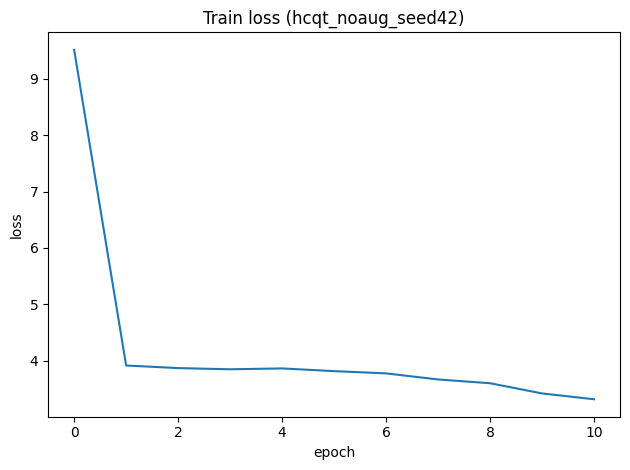

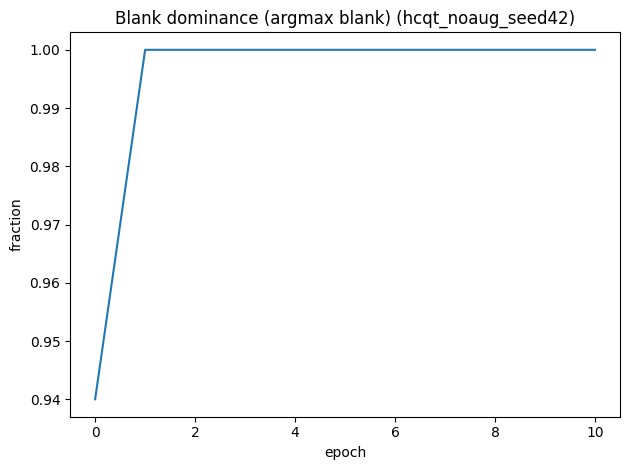

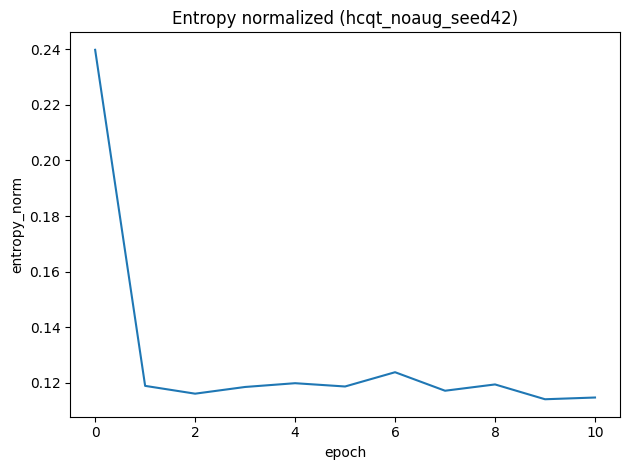


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.2063
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.921
  Mean non-blank prob:    0.079
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0170
  LSTM:           0.0084
  Classifier:     0.0866

PREDICTION CONFIDENCE:
  Entropy (norm): 0.111


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.0917
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.922
  Mean non-blank prob:    0.078
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0380
  LSTM:           0.0101
  Classifier:     0.0878

PREDICTION CONFIDENCE:
  Entropy (norm): 0.108


EPOCH 013 - Detailed Analysis
Cur

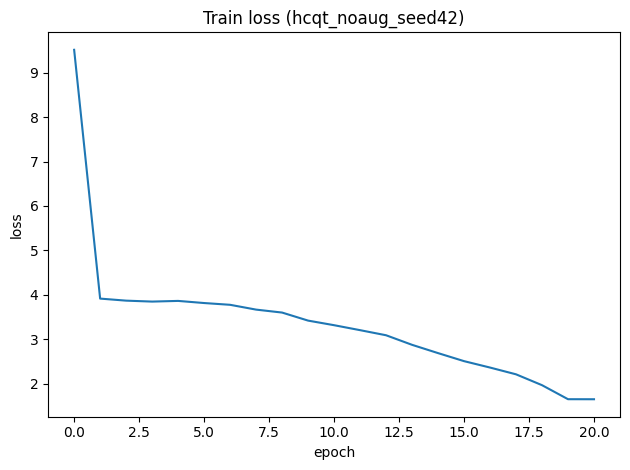

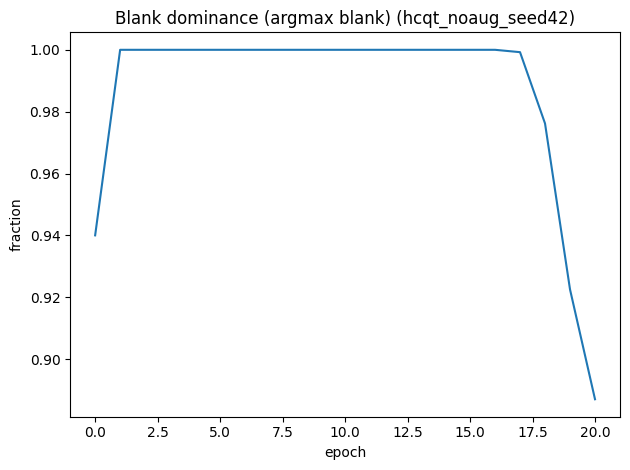

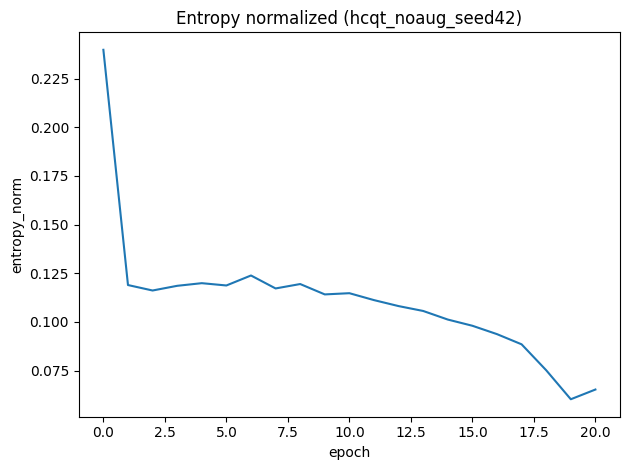


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.4745
Val F1:     0.7267
Val TER:    0.4380
Len Ratio:  0.705

BLANK DIAGNOSTICS:
  Frames blank (argmax):  87.5%
  Mean P(blank):          0.861
  Mean non-blank prob:    0.139
  Unique tokens (argmax): 39
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0861
  LSTM:           0.0088
  Classifier:     0.0338

PREDICTION CONFIDENCE:
  Entropy (norm): 0.059


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.3262
Val F1:     0.7186
Val TER:    0.4360
Len Ratio:  0.663

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.6%
  Mean P(blank):          0.855
  Mean non-blank prob:    0.145
  Unique tokens (argmax): 40
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0333
  LSTM:           0.0176
  Classifier:     0.0237

PREDICTION CONFIDENCE:
  Entropy (norm): 0.054


EPOCH

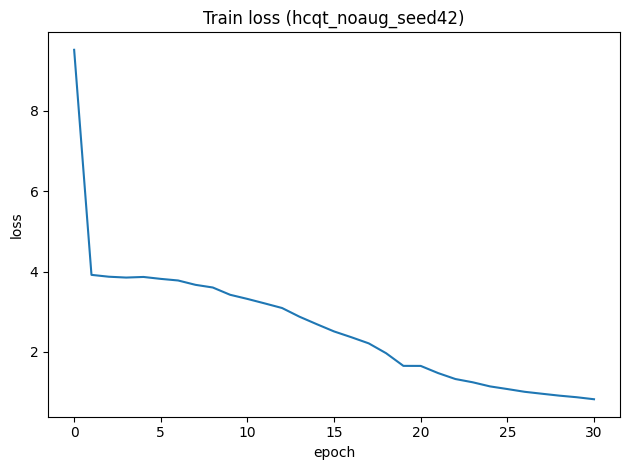

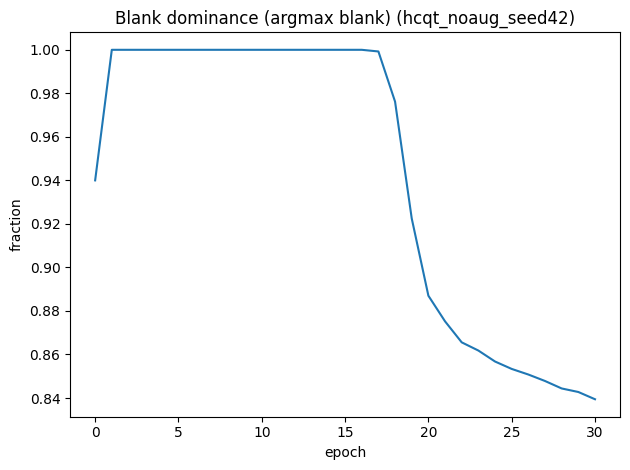

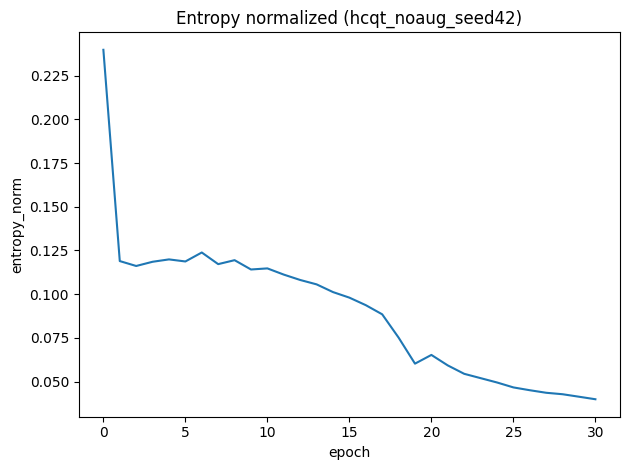


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.7841
Val F1:     0.7607
Val TER:    0.3852
Len Ratio:  0.744

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.8%
  Mean P(blank):          0.832
  Mean non-blank prob:    0.168
  Unique tokens (argmax): 44
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0562
  LSTM:           0.0133
  Classifier:     0.0206

PREDICTION CONFIDENCE:
  Entropy (norm): 0.039


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.7440
Val F1:     0.7780
Val TER:    0.3730
Len Ratio:  0.771

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.6%
  Mean P(blank):          0.830
  Mean non-blank prob:    0.170
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0566
  LSTM:           0.0167
  Classifier:     0.0187

PREDICTION CONFIDENCE:
  Entropy (norm): 0.038


EPOCH

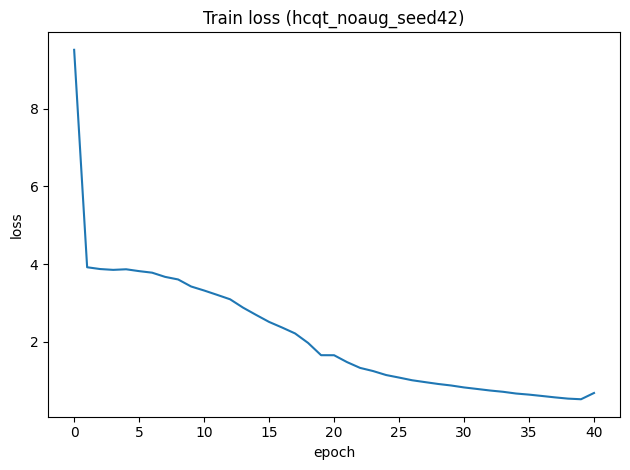

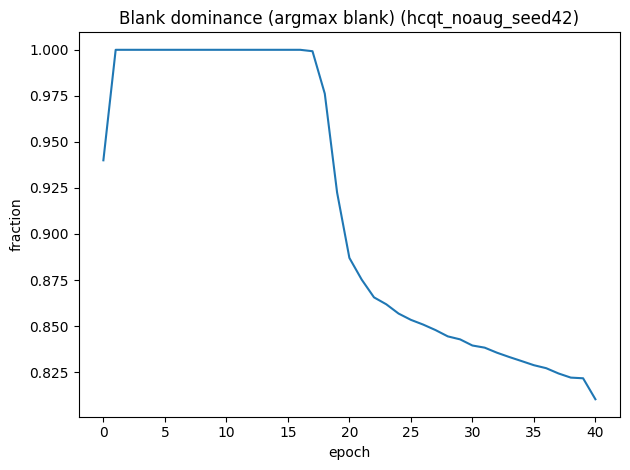

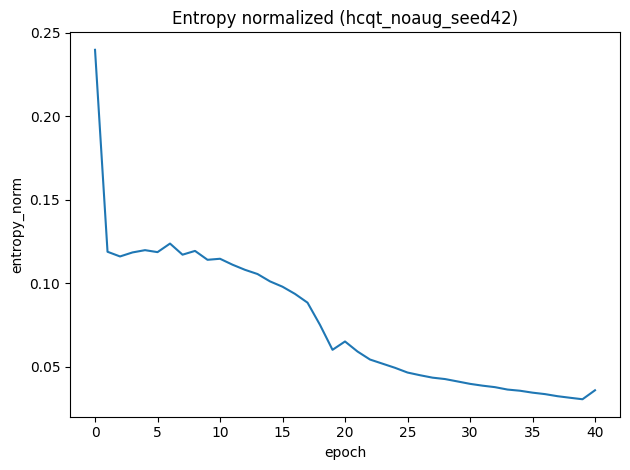


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.6216
Val F1:     0.7930
Val TER:    0.3660
Len Ratio:  0.809

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.9%
  Mean P(blank):          0.803
  Mean non-blank prob:    0.197
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0462
  LSTM:           0.0119
  Classifier:     0.0171

PREDICTION CONFIDENCE:
  Entropy (norm): 0.036


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5876
Val F1:     0.7981
Val TER:    0.3720
Len Ratio:  0.845

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.6%
  Mean P(blank):          0.801
  Mean non-blank prob:    0.199
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1202
  LSTM:           0.0109
  Classifier:     0.0217

PREDICTION CONFIDENCE:
  Entropy (norm): 0.035


EPOCH 043

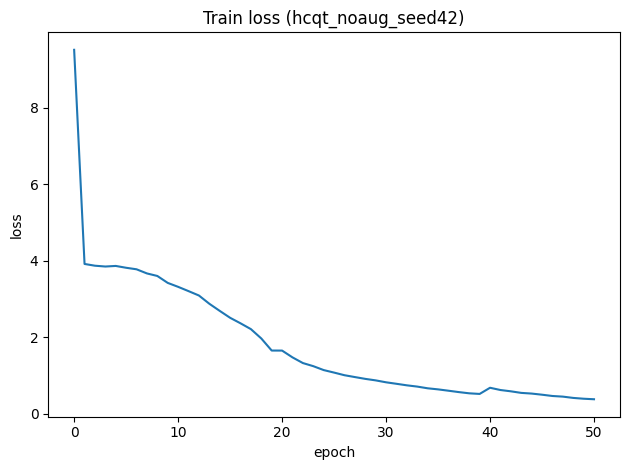

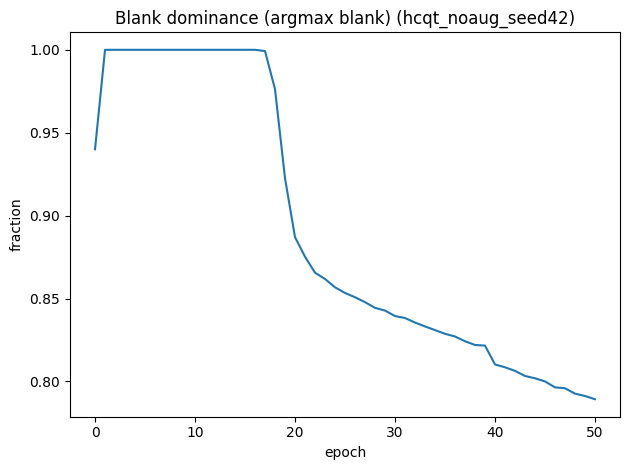

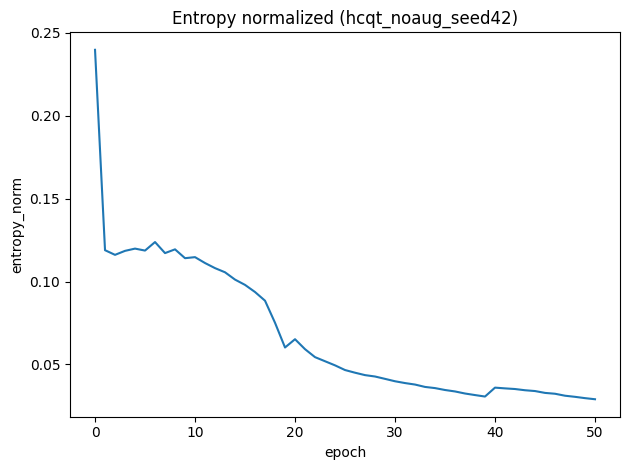


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.3542
Val F1:     0.7973
Val TER:    0.3617
Len Ratio:  0.833

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.8%
  Mean P(blank):          0.785
  Mean non-blank prob:    0.215
  Unique tokens (argmax): 48
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0399
  LSTM:           0.0094
  Classifier:     0.0152

PREDICTION CONFIDENCE:
  Entropy (norm): 0.028


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.3394
Val F1:     0.7921
Val TER:    0.3658
Len Ratio:  0.833

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.4%
  Mean P(blank):          0.782
  Mean non-blank prob:    0.218
  Unique tokens (argmax): 48
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1261
  LSTM:           0.0116
  Classifier:     0.0173

PREDICTION CONFIDENCE:
  Entropy (norm): 0.027


EPOCH 053 - Detailed Analysis
Curriculum: Phase 3

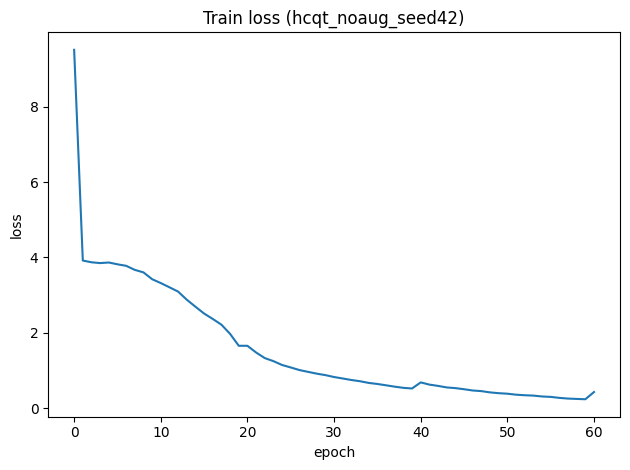

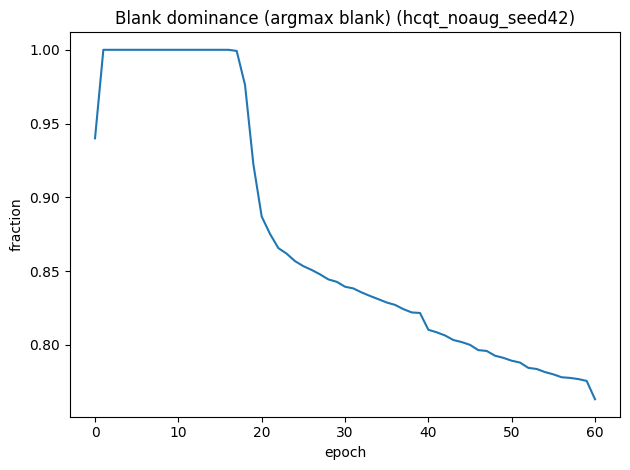

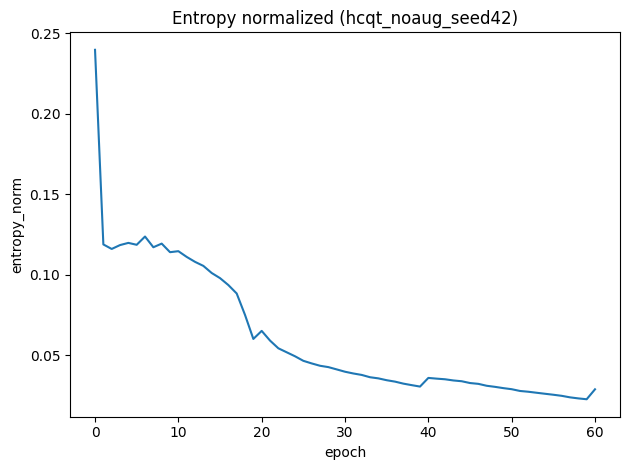


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3718
Val F1:     0.8160
Val TER:    0.3799
Len Ratio:  0.924

BLANK DIAGNOSTICS:
  Frames blank (argmax):  76.2%
  Mean P(blank):          0.759
  Mean non-blank prob:    0.241
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0692
  LSTM:           0.0149
  Classifier:     0.0163

PREDICTION CONFIDENCE:
  Entropy (norm): 0.029


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3431
Val F1:     0.8026
Val TER:    0.3642
Len Ratio:  0.812

BLANK DIAGNOSTICS:
  Frames blank (argmax):  76.0%
  Mean P(blank):          0.756
  Mean non-blank prob:    0.244
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0489
  LSTM:           0.0110
  Classifier:     0.0121

PREDICTION CONFIDENCE:
  Entropy (norm): 0.029


EPOCH 063 - Detailed Analys

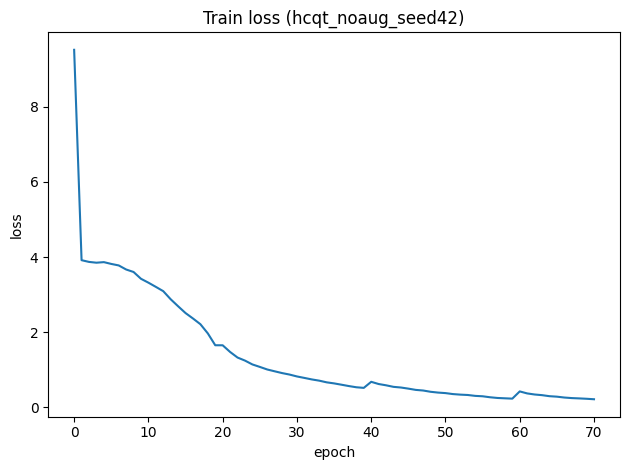

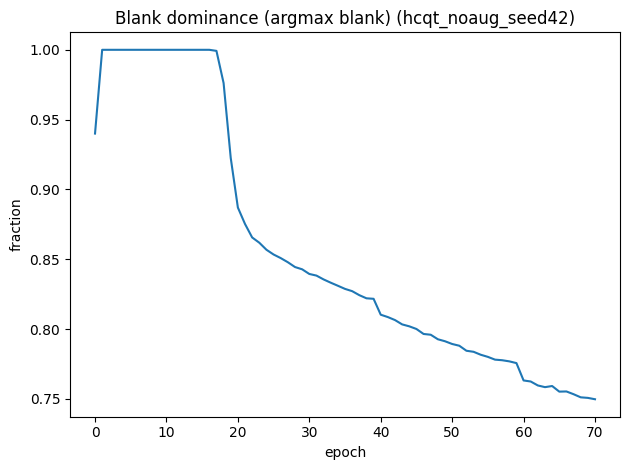

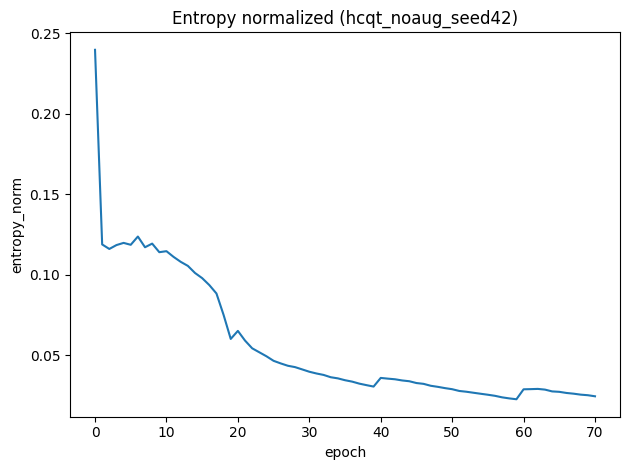


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.2013
Val F1:     0.8007
Val TER:    0.3723
Len Ratio:  0.838

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.8%
  Mean P(blank):          0.747
  Mean non-blank prob:    0.253
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0678
  LSTM:           0.0086
  Classifier:     0.0108

PREDICTION CONFIDENCE:
  Entropy (norm): 0.024


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1962
Val F1:     0.8125
Val TER:    0.3750
Len Ratio:  0.893

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.7%
  Mean P(blank):          0.746
  Mean non-blank prob:    0.254
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0762
  LSTM:           0.0071
  Classifier:     0.0071

PREDICTION CONFIDENCE:
  Entropy (norm): 0.024


EPOCH 073 - Detailed Analys

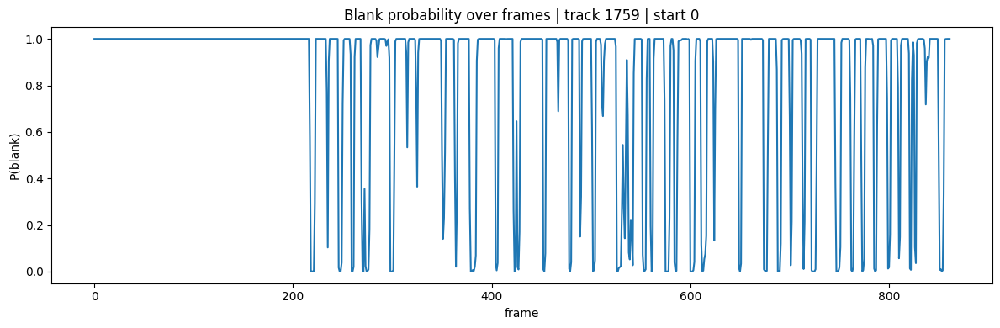

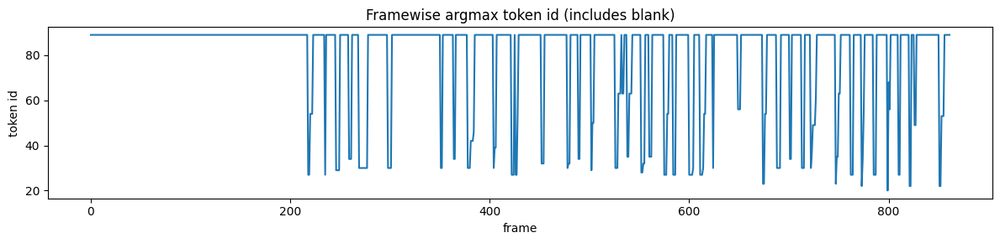

Target len: 95 | Pred len: 66
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [27, 54, 27, 29, 34, 30, 30, 30, 34, 30, 42, 46, 30, 39, 27, 27, 54, 32, 30, 32, 34, 29, 50, 30, 63, 63, 35, 63, 28, 32, 35, 27, 54, 27, 27, 30, 27, 30, 54, 30]

##########################################################################################
Running: hcqt augment= True
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       9.6420
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  94.0%
  Mean P(blank):          0.808
  Mean non-blank prob:    0.192
  Unique tokens (argmax): 3
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0003
  L

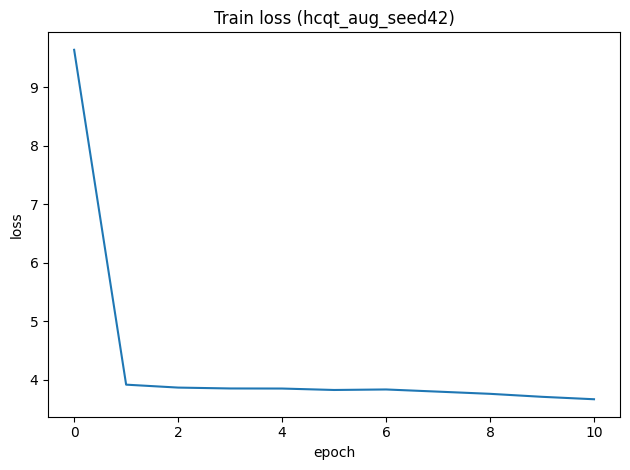

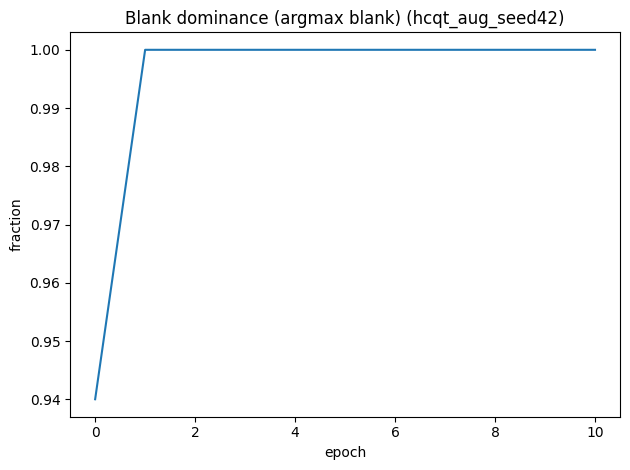

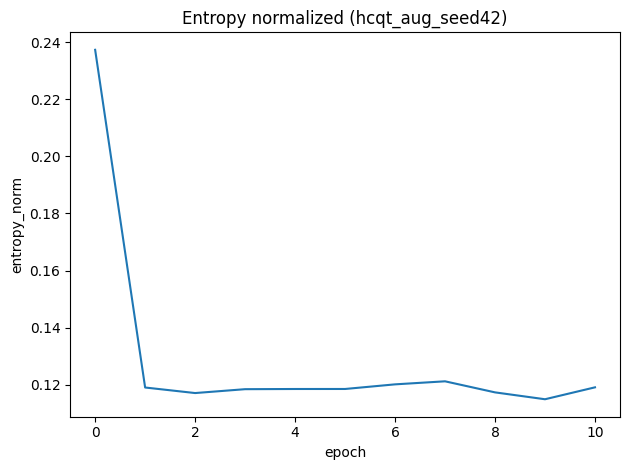


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.5782
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.923
  Mean non-blank prob:    0.077
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0082
  LSTM:           0.0069
  Classifier:     0.0886

PREDICTION CONFIDENCE:
  Entropy (norm): 0.117


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.4919
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.922
  Mean non-blank prob:    0.078
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0262
  LSTM:           0.0074
  Classifier:     0.0903

PREDICTION CONFIDENCE:
  Entropy (norm): 0.116


EPOCH 013 - Detailed Analysis
Cur

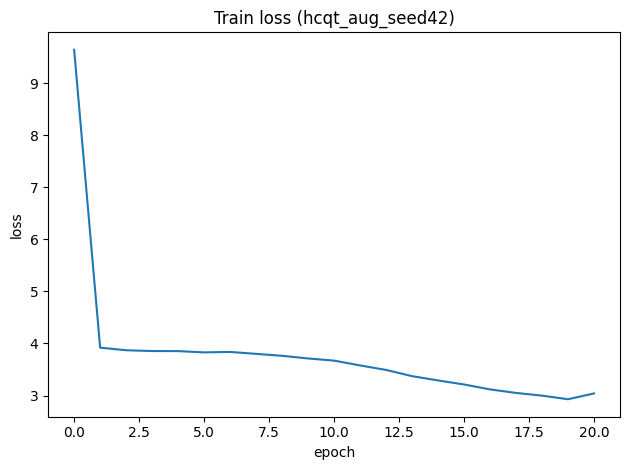

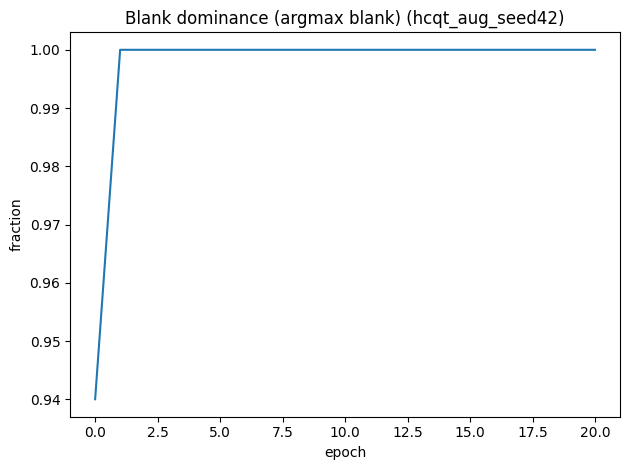

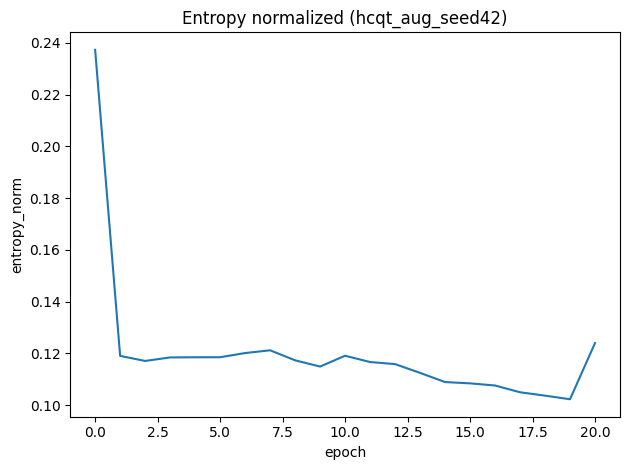


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       2.9600
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.902
  Mean non-blank prob:    0.098
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0363
  LSTM:           0.0105
  Classifier:     0.0925

PREDICTION CONFIDENCE:
  Entropy (norm): 0.121


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       2.8737
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.902
  Mean non-blank prob:    0.098
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0372
  LSTM:           0.0155
  Classifier:     0.0701

PREDICTION CONFIDENCE:
  Entropy (norm): 0.116


EPOCH 023 - Detailed Analysis
C

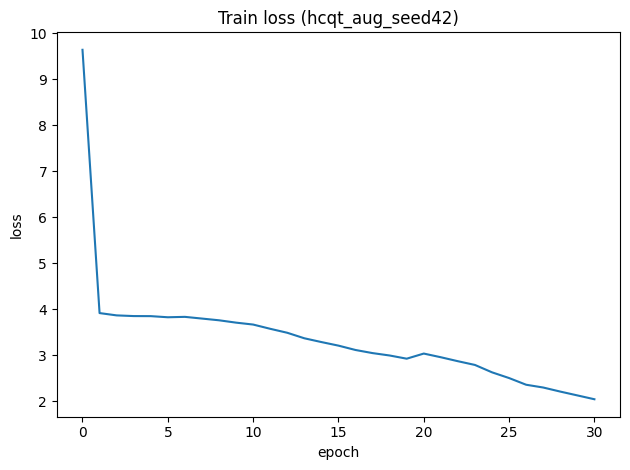

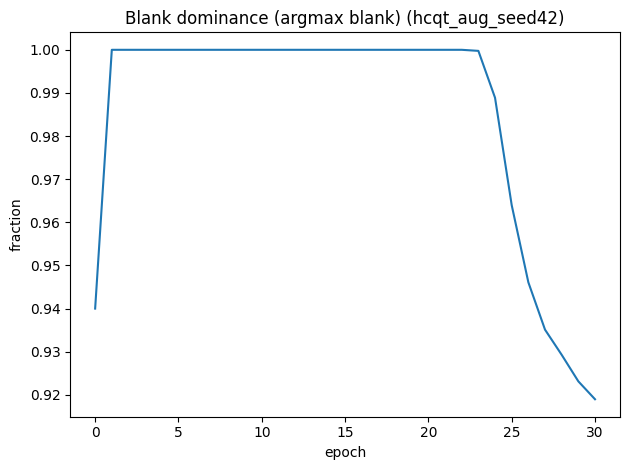

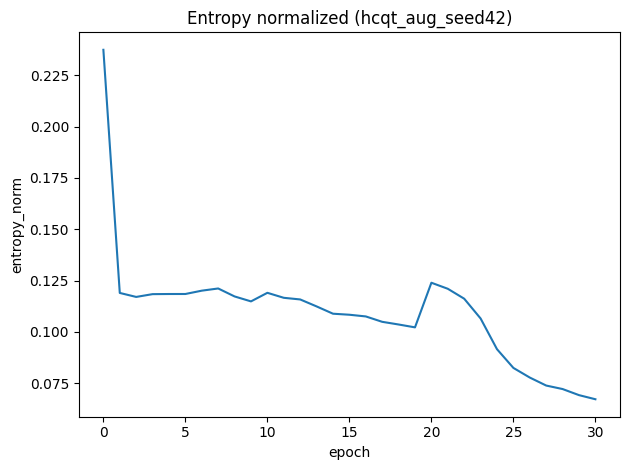


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.9635
Val F1:     0.5623
Val TER:    0.5795
Len Ratio:  0.695

BLANK DIAGNOSTICS:
  Frames blank (argmax):  91.5%
  Mean P(blank):          0.888
  Mean non-blank prob:    0.112
  Unique tokens (argmax): 40
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0374
  LSTM:           0.0230
  Classifier:     0.0289

PREDICTION CONFIDENCE:
  Entropy (norm): 0.065


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.8983
Val F1:     0.5739
Val TER:    0.5750
Len Ratio:  0.692

BLANK DIAGNOSTICS:
  Frames blank (argmax):  91.1%
  Mean P(blank):          0.887
  Mean non-blank prob:    0.113
  Unique tokens (argmax): 40
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0483
  LSTM:           0.0185
  Classifier:     0.0261

PREDICTION CONFIDENCE:
  Entropy (norm): 0.063


EPOCH

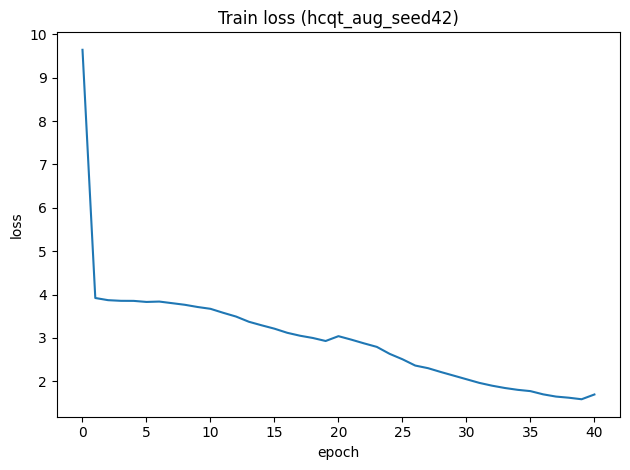

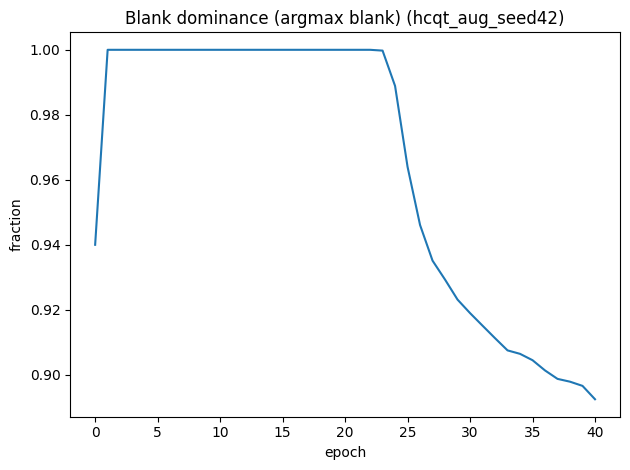

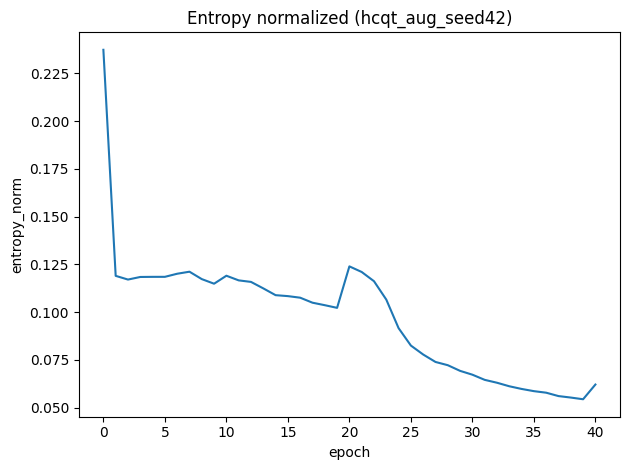


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       1.6765
Val F1:     0.6501
Val TER:    0.4878
Len Ratio:  0.717

BLANK DIAGNOSTICS:
  Frames blank (argmax):  89.2%
  Mean P(blank):          0.868
  Mean non-blank prob:    0.132
  Unique tokens (argmax): 43
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0560
  LSTM:           0.0154
  Classifier:     0.0416

PREDICTION CONFIDENCE:
  Entropy (norm): 0.062


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       1.6356
Val F1:     0.6694
Val TER:    0.4820
Len Ratio:  0.738

BLANK DIAGNOSTICS:
  Frames blank (argmax):  89.1%
  Mean P(blank):          0.868
  Mean non-blank prob:    0.132
  Unique tokens (argmax): 43
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1043
  LSTM:           0.0162
  Classifier:     0.0342

PREDICTION CONFIDENCE:
  Entropy (norm): 0.061


EPOCH 043

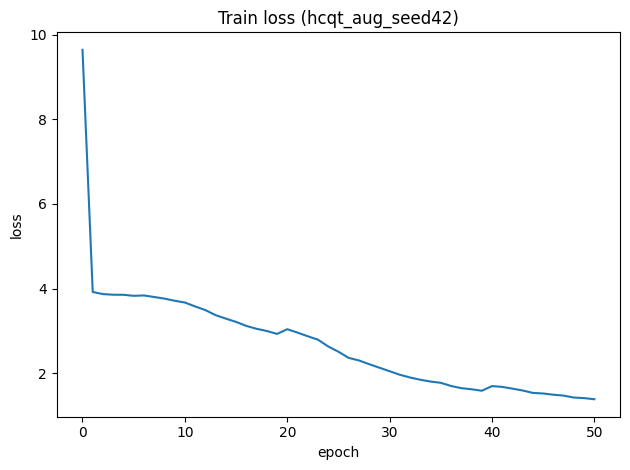

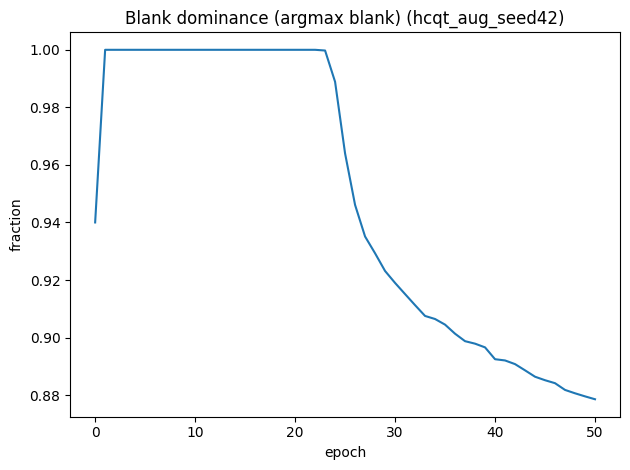

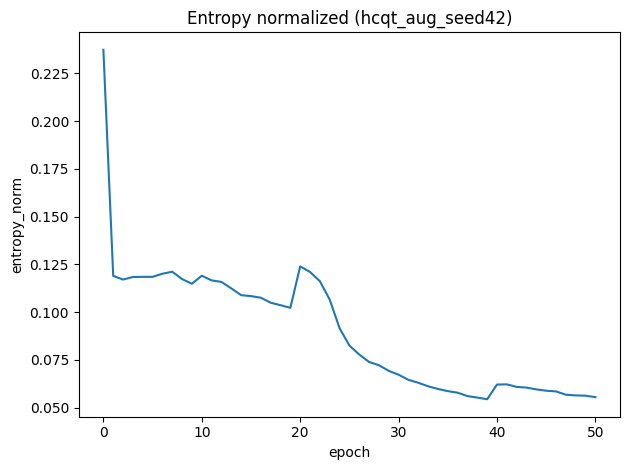


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       1.3393
Val F1:     0.6994
Val TER:    0.4473
Len Ratio:  0.764

BLANK DIAGNOSTICS:
  Frames blank (argmax):  87.6%
  Mean P(blank):          0.859
  Mean non-blank prob:    0.141
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0417
  LSTM:           0.0142
  Classifier:     0.0122

PREDICTION CONFIDENCE:
  Entropy (norm): 0.054


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       1.3226
Val F1:     0.6964
Val TER:    0.4431
Len Ratio:  0.736

BLANK DIAGNOSTICS:
  Frames blank (argmax):  87.5%
  Mean P(blank):          0.858
  Mean non-blank prob:    0.142
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0573
  LSTM:           0.0397
  Classifier:     0.0194

PREDICTION CONFIDENCE:
  Entropy (norm): 0.054


EPOCH 053

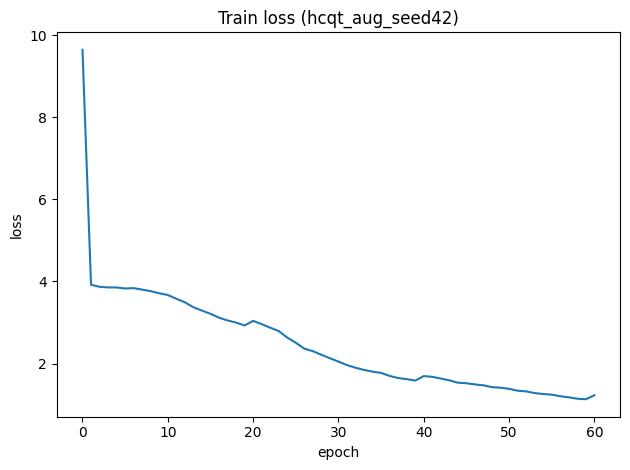

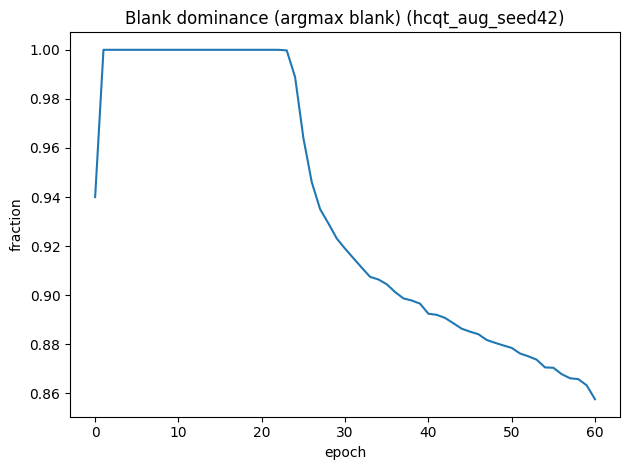

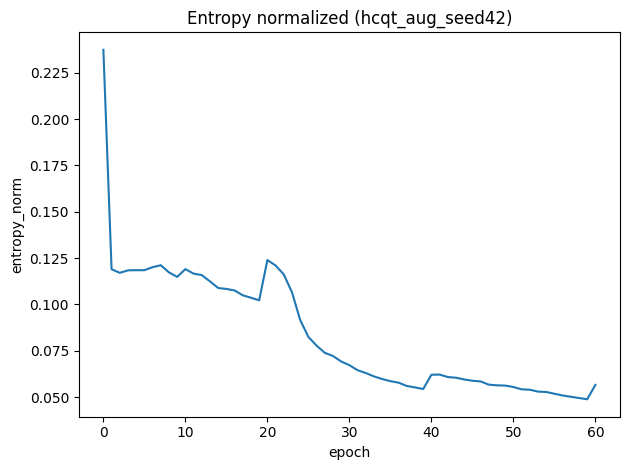


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       1.2121
Val F1:     0.7130
Val TER:    0.4289
Len Ratio:  0.776

BLANK DIAGNOSTICS:
  Frames blank (argmax):  85.7%
  Mean P(blank):          0.839
  Mean non-blank prob:    0.161
  Unique tokens (argmax): 46
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0739
  LSTM:           0.0234
  Classifier:     0.0230

PREDICTION CONFIDENCE:
  Entropy (norm): 0.057


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       1.1727
Val F1:     0.7176
Val TER:    0.4225
Len Ratio:  0.746

BLANK DIAGNOSTICS:
  Frames blank (argmax):  85.5%
  Mean P(blank):          0.837
  Mean non-blank prob:    0.163
  Unique tokens (argmax): 46
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0537
  LSTM:           0.0261
  Classifier:     0.0263

PREDICTION CONFIDENCE:
  Entropy (no

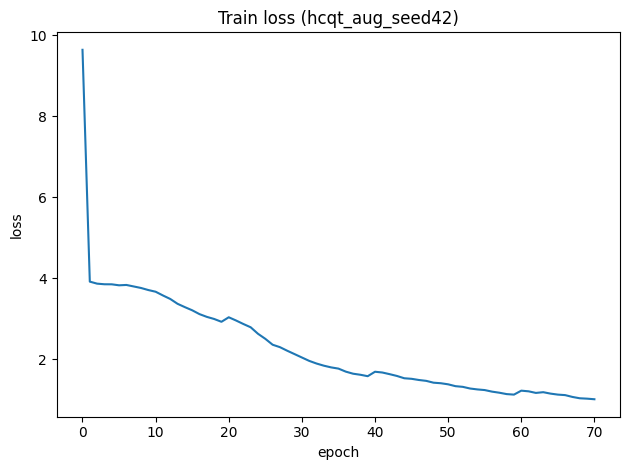

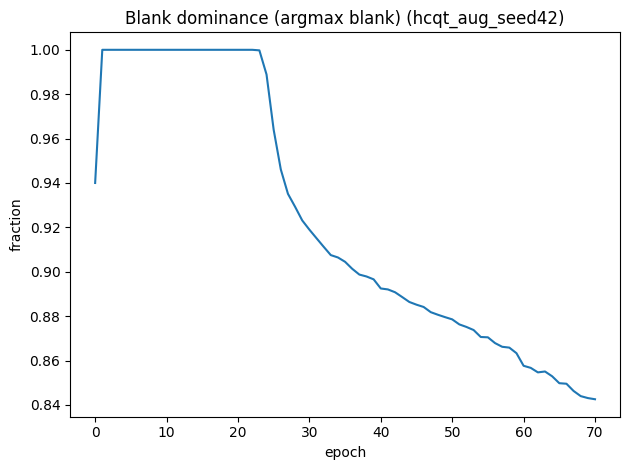

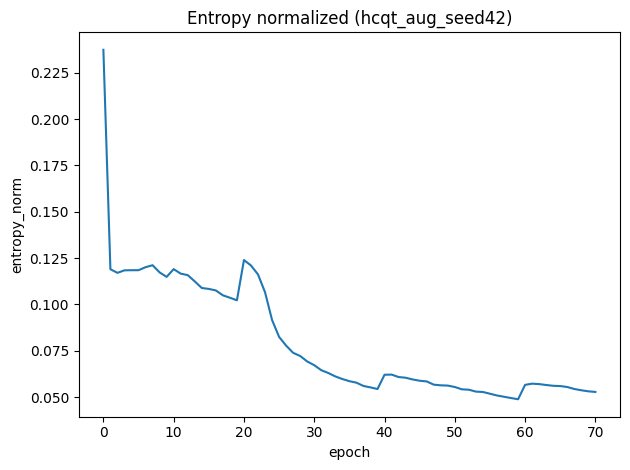


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       1.0003
Val F1:     0.7546
Val TER:    0.3967
Len Ratio:  0.811

BLANK DIAGNOSTICS:
  Frames blank (argmax):  84.1%
  Mean P(blank):          0.829
  Mean non-blank prob:    0.171
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0929
  LSTM:           0.0137
  Classifier:     0.0257

PREDICTION CONFIDENCE:
  Entropy (norm): 0.052


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.9816
Val F1:     0.7297
Val TER:    0.4159
Len Ratio:  0.814

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.9%
  Mean P(blank):          0.827
  Mean non-blank prob:    0.173
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0845
  LSTM:           0.0242
  Classifier:     0.0182

PREDICTION CONFIDENCE:
  Entropy (no

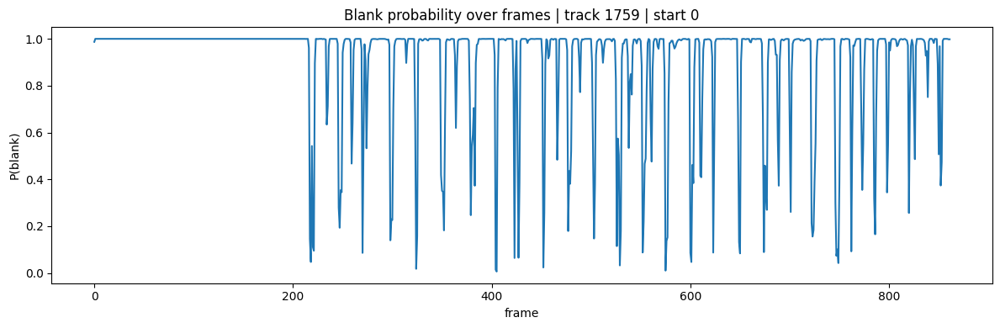

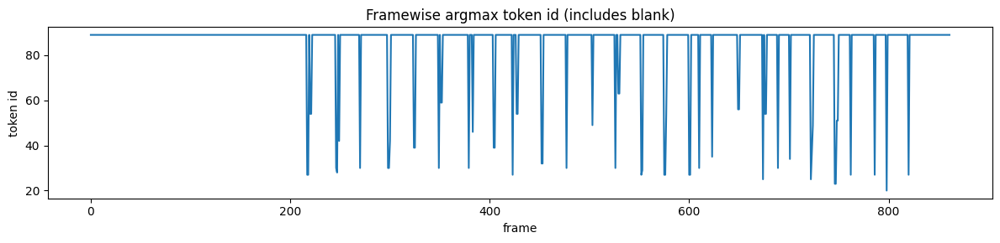

Target len: 95 | Pred len: 42
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [27, 54, 30, 28, 42, 30, 30, 42, 39, 30, 59, 30, 46, 39, 27, 54, 32, 30, 49, 30, 63, 27, 29, 27, 54, 27, 30, 35, 56, 25, 54, 30, 34, 25, 37, 49, 23, 51, 27, 27]

##########################################################################################
Running: cqt augment= True
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       11.4886
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.0%
  Mean P(blank):          0.805
  Mean non-blank prob:    0.195
  Unique tokens (argmax): 4
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0001
  L

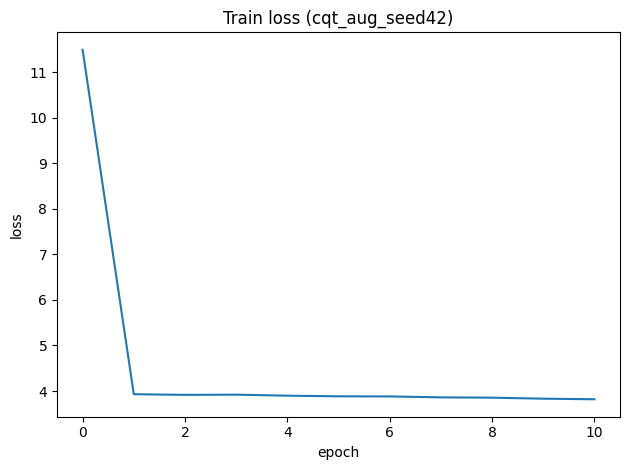

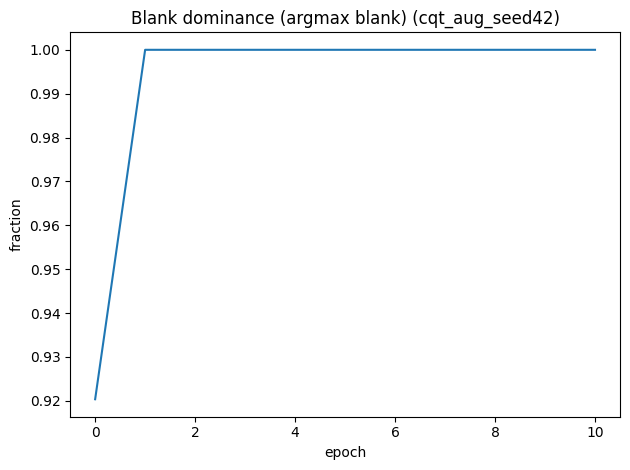

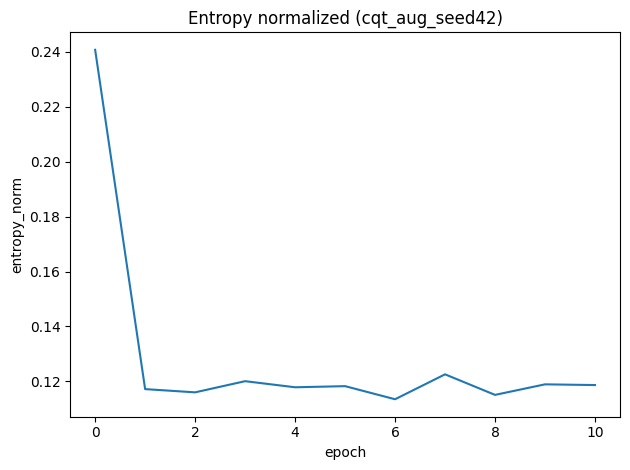


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.8095
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.924
  Mean non-blank prob:    0.076
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0132
  LSTM:           0.0071
  Classifier:     0.0926

PREDICTION CONFIDENCE:
  Entropy (norm): 0.120


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.7972
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.923
  Mean non-blank prob:    0.077
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0076
  LSTM:           0.0062
  Classifier:     0.0931

PREDICTION CONFIDENCE:
  Entropy (norm): 0.121


EPOCH 013 - Detailed Analysis
Cur

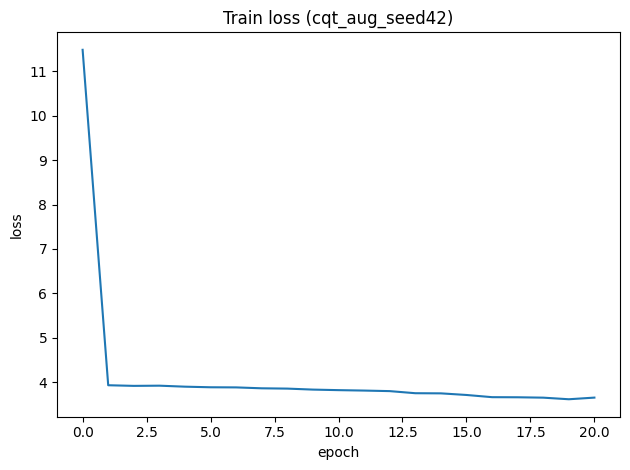

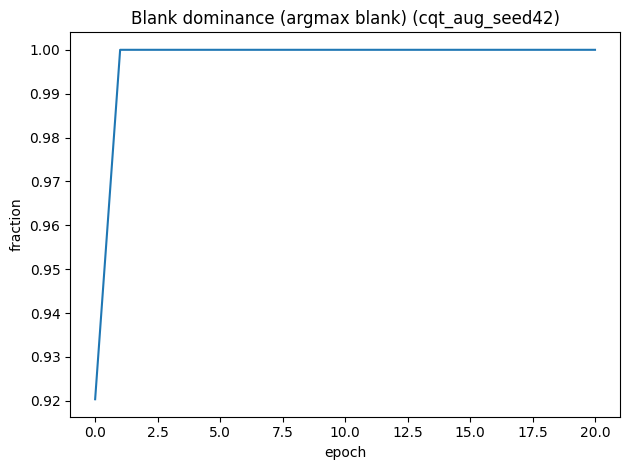

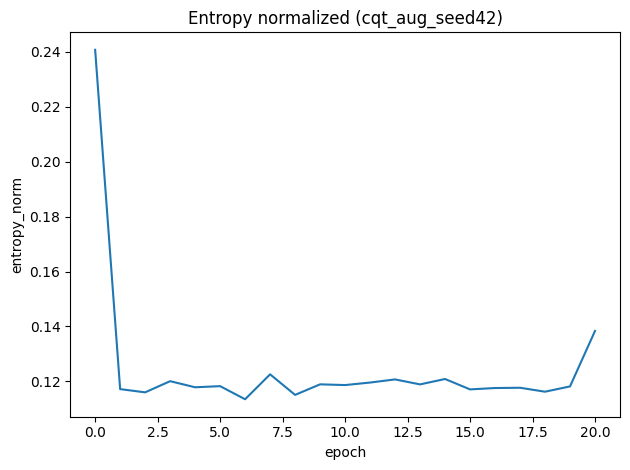


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       3.5801
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.904
  Mean non-blank prob:    0.096
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     0.8422
  CNN:            0.0197
  LSTM:           0.0100
  Classifier:     0.0818

PREDICTION CONFIDENCE:
  Entropy (norm): 0.139


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       3.5175
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.903
  Mean non-blank prob:    0.097
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0319
  LSTM:           0.0086
  Classifier:     0.1042

PREDICTION CONFIDENCE:
  Entropy (norm): 0.138


EPOCH 023 - Detailed Analysis
C

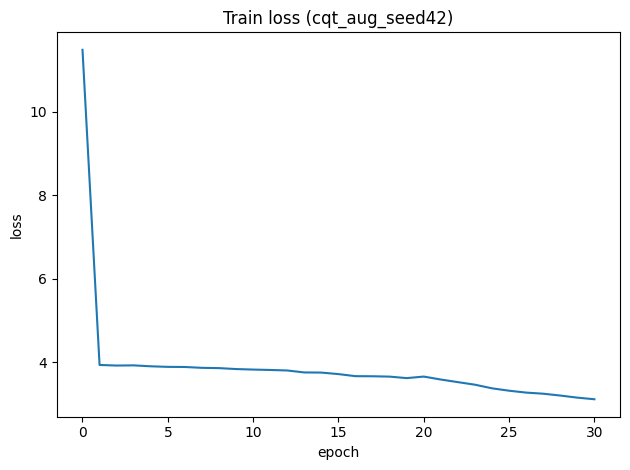

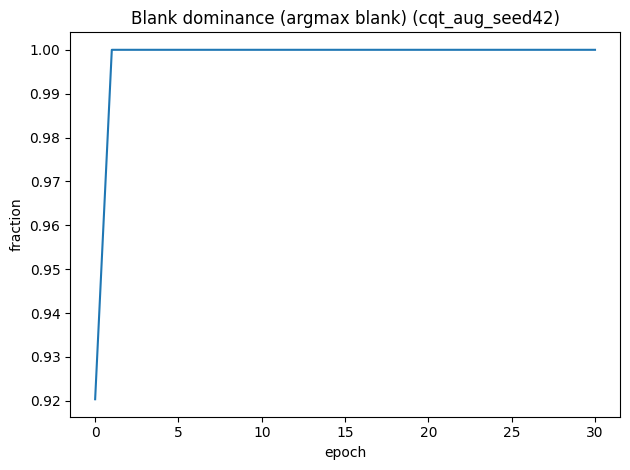

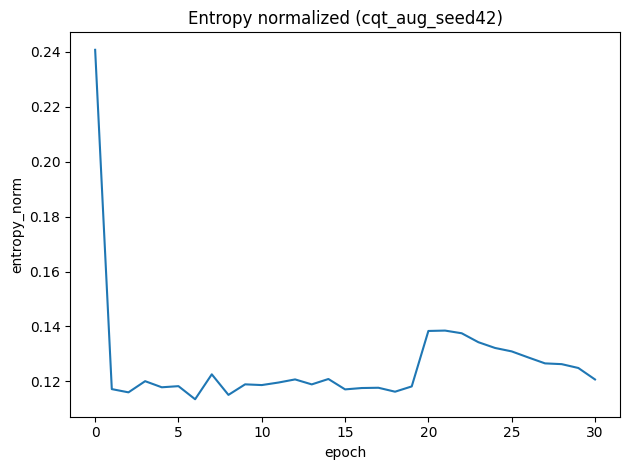


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       3.0718
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.902
  Mean non-blank prob:    0.098
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0381
  LSTM:           0.0121
  Classifier:     0.0490

PREDICTION CONFIDENCE:
  Entropy (norm): 0.118


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       3.0387
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.902
  Mean non-blank prob:    0.098
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0298
  LSTM:           0.0136
  Classifier:     0.0811

PREDICTION CONFIDENCE:
  Entropy (norm): 0.114


EPOCH 033 - Detailed Analysis
C

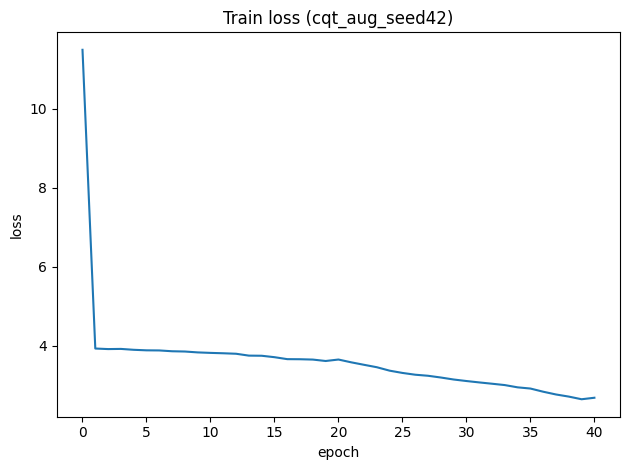

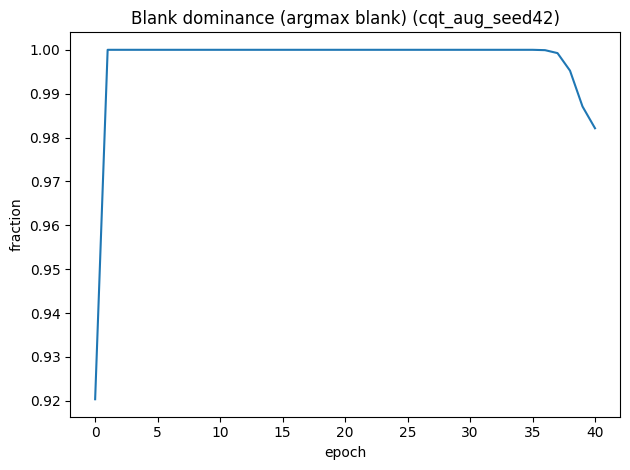

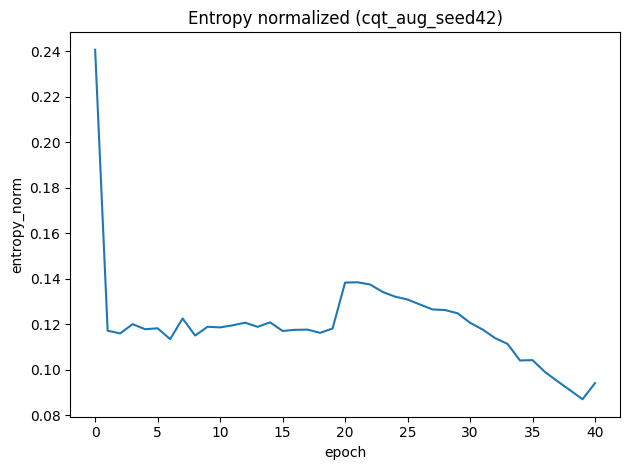


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       2.6424
Val F1:     0.3200
Val TER:    0.8046
Len Ratio:  0.347

BLANK DIAGNOSTICS:
  Frames blank (argmax):  97.4%
  Mean P(blank):          0.886
  Mean non-blank prob:    0.114
  Unique tokens (argmax): 27
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0542
  LSTM:           0.0111
  Classifier:     0.0373

PREDICTION CONFIDENCE:
  Entropy (norm): 0.094


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       2.5862
Val F1:     0.3319
Val TER:    0.7836
Len Ratio:  0.366

BLANK DIAGNOSTICS:
  Frames blank (argmax):  96.6%
  Mean P(blank):          0.886
  Mean non-blank prob:    0.114
  Unique tokens (argmax): 32
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0269
  LSTM:           0.0049
  Classifier:     0.0307

PREDICTION CONFIDENCE:
  Entropy (norm): 0.091


EPOCH 043 - Detailed Analysis
Curri

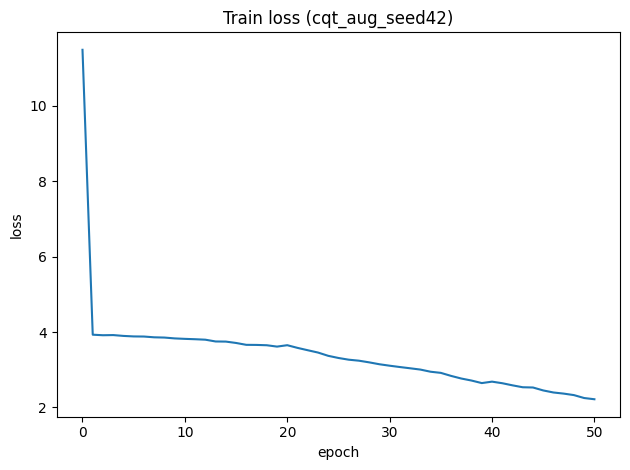

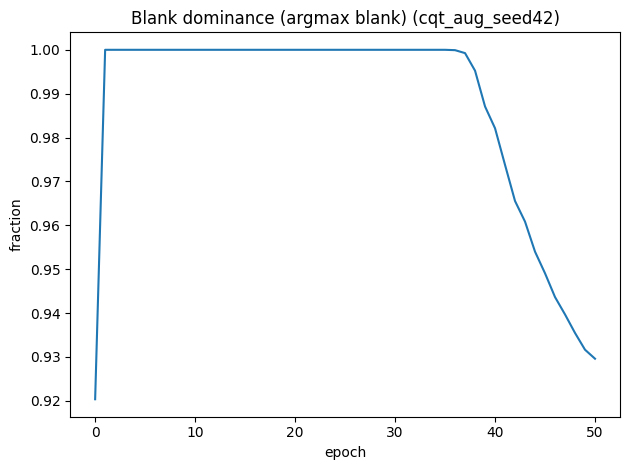

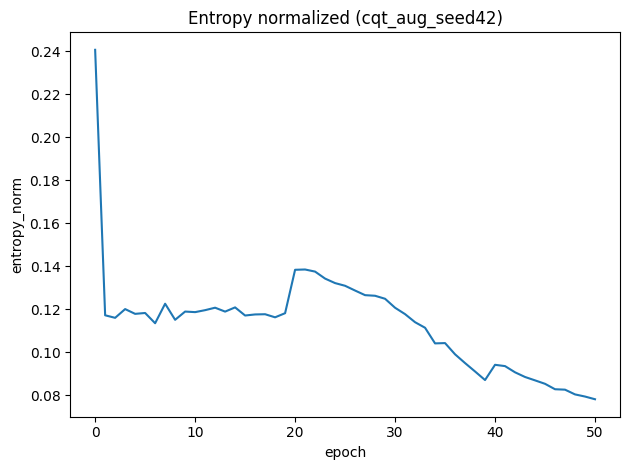


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       2.2104
Val F1:     0.5081
Val TER:    0.6215
Len Ratio:  0.640

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.9%
  Mean P(blank):          0.881
  Mean non-blank prob:    0.119
  Unique tokens (argmax): 40
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0883
  LSTM:           0.0131
  Classifier:     0.0670

PREDICTION CONFIDENCE:
  Entropy (norm): 0.077


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       2.1549
Val F1:     0.5531
Val TER:    0.5865
Len Ratio:  0.643

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.6%
  Mean P(blank):          0.880
  Mean non-blank prob:    0.120
  Unique tokens (argmax): 40
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0581
  LSTM:           0.0123
  Classifier:     0.0303

PREDICTION CONFIDENCE:
  Entropy (norm): 0.076


EPOCH 053

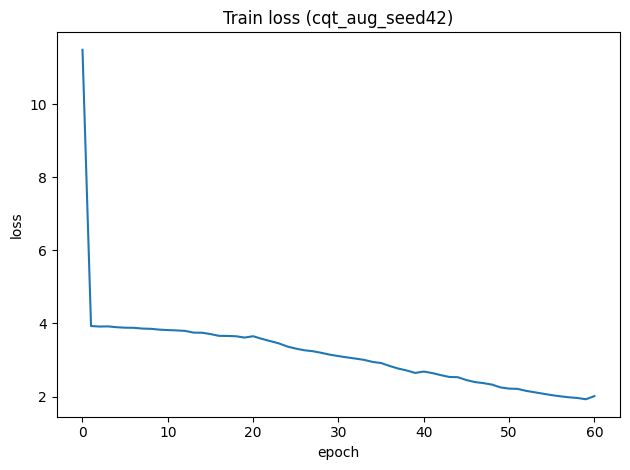

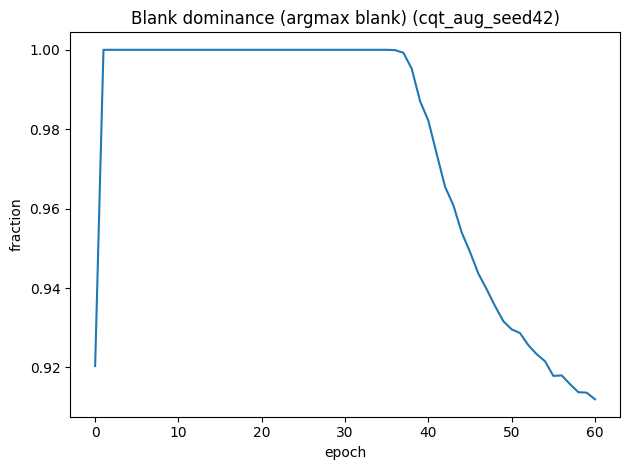

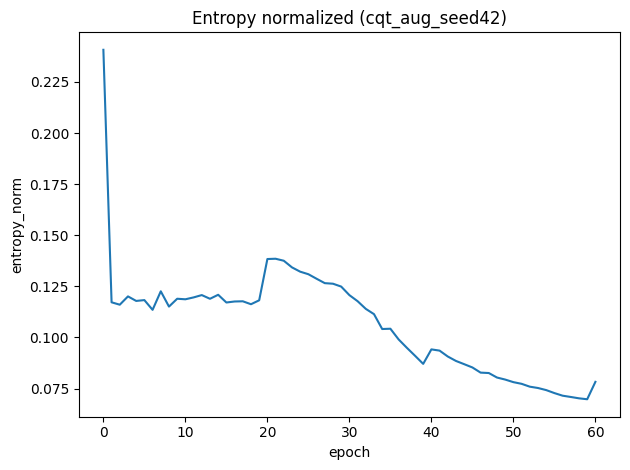


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       2.0177
Val F1:     0.5761
Val TER:    0.5561
Len Ratio:  0.708

BLANK DIAGNOSTICS:
  Frames blank (argmax):  91.4%
  Mean P(blank):          0.866
  Mean non-blank prob:    0.134
  Unique tokens (argmax): 42
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0717
  LSTM:           0.0192
  Classifier:     0.0515

PREDICTION CONFIDENCE:
  Entropy (norm): 0.079


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       1.9751
Val F1:     0.5861
Val TER:    0.5426
Len Ratio:  0.617

BLANK DIAGNOSTICS:
  Frames blank (argmax):  91.0%
  Mean P(blank):          0.864
  Mean non-blank prob:    0.136
  Unique tokens (argmax): 42
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0828
  LSTM:           0.0156
  Classifier:     0.0501

PREDICTION CONFIDENCE:
  Entropy (no

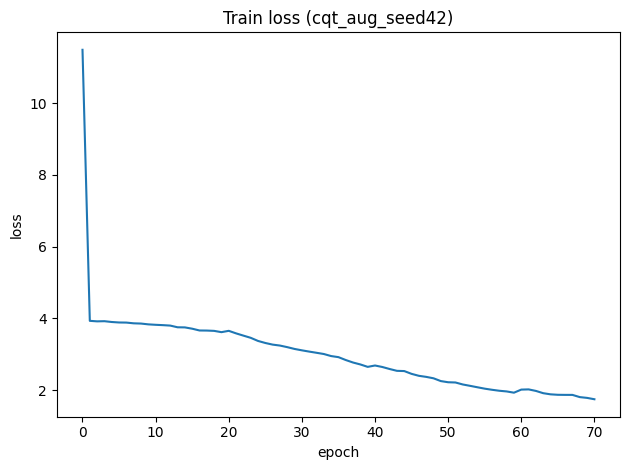

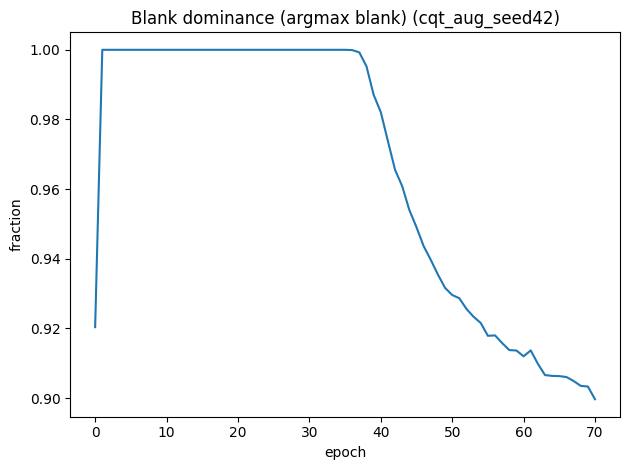

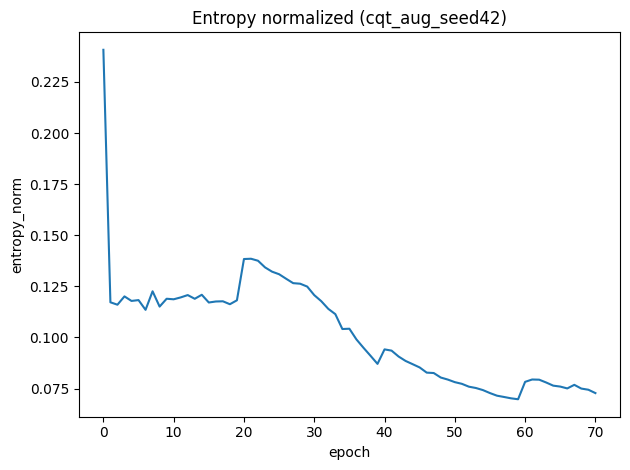


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       1.7361
Val F1:     0.6271
Val TER:    0.5052
Len Ratio:  0.668

BLANK DIAGNOSTICS:
  Frames blank (argmax):  89.9%
  Mean P(blank):          0.858
  Mean non-blank prob:    0.142
  Unique tokens (argmax): 44
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1063
  LSTM:           0.0251
  Classifier:     0.0371

PREDICTION CONFIDENCE:
  Entropy (norm): 0.074


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       1.7112
Val F1:     0.6303
Val TER:    0.5035
Len Ratio:  0.688

BLANK DIAGNOSTICS:
  Frames blank (argmax):  89.6%
  Mean P(blank):          0.857
  Mean non-blank prob:    0.143
  Unique tokens (argmax): 44
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0704
  LSTM:           0.0148
  Classifier:     0.0482

PREDICTION CONFIDENCE:
  Entropy (no

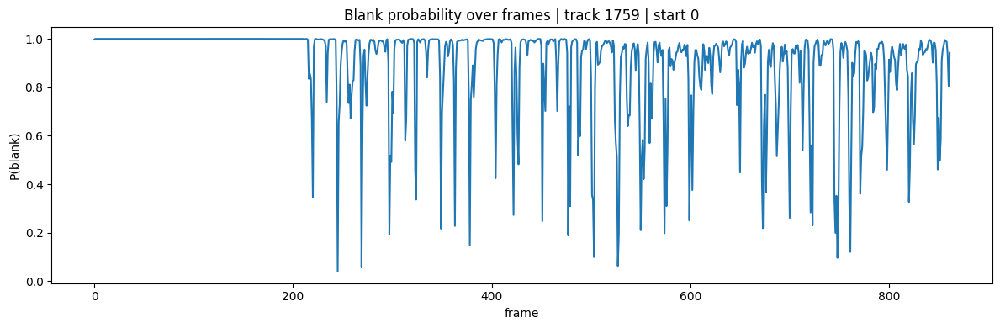

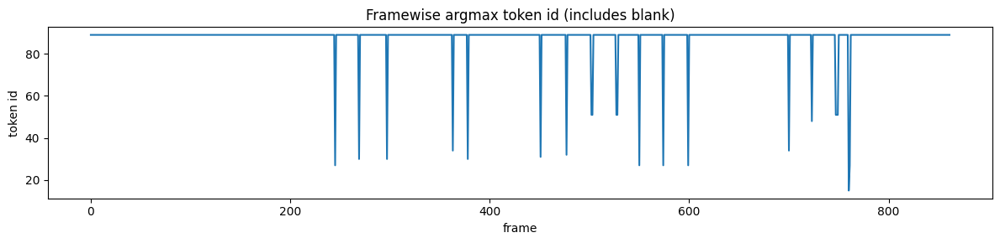

Target len: 95 | Pred len: 19
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [54, 27, 30, 30, 34, 30, 31, 32, 51, 51, 27, 27, 27, 34, 34, 48, 51, 15, 27]

##########################################################################################
Running: cqt augment= False
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       11.6598
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.1%
  Mean P(blank):          0.803
  Mean non-blank prob:    0.197
  Unique tokens (argmax): 4
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0002
  LSTM:           0.0026
  Classifier:     0.0674

PREDICTION CONFIDENCE:
  Entropy (n

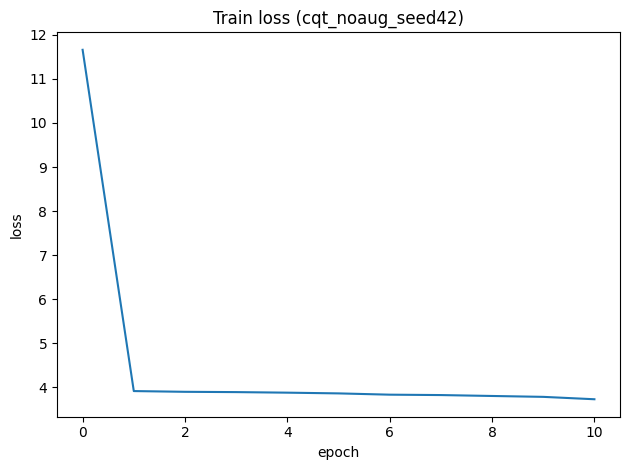

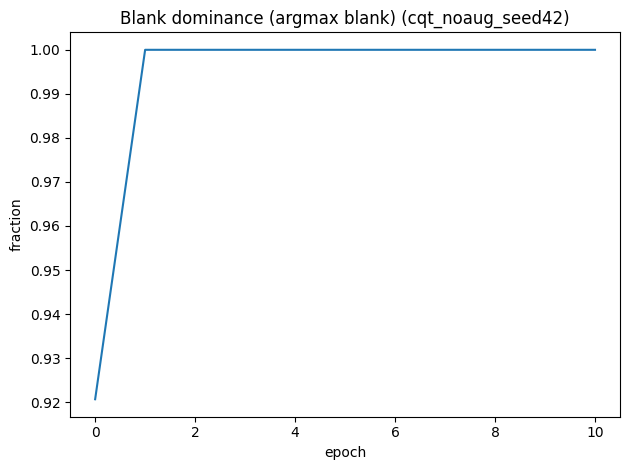

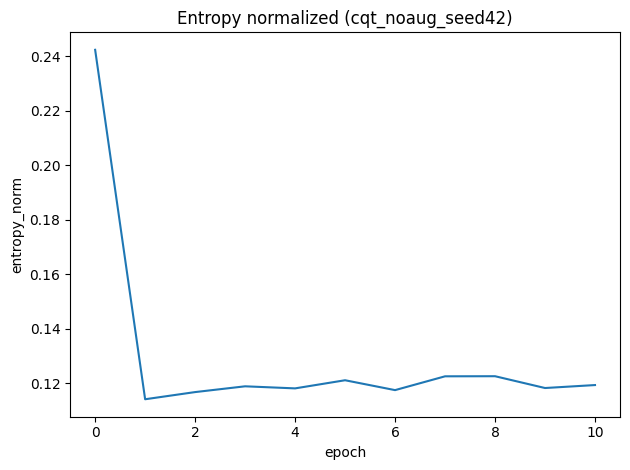


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.6737
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.923
  Mean non-blank prob:    0.077
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0175
  LSTM:           0.0057
  Classifier:     0.0898

PREDICTION CONFIDENCE:
  Entropy (norm): 0.118


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.6246
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.923
  Mean non-blank prob:    0.077
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0153
  LSTM:           0.0095
  Classifier:     0.0882

PREDICTION CONFIDENCE:
  Entropy (norm): 0.118


EPOCH 013 - Detailed Analysis
Cur

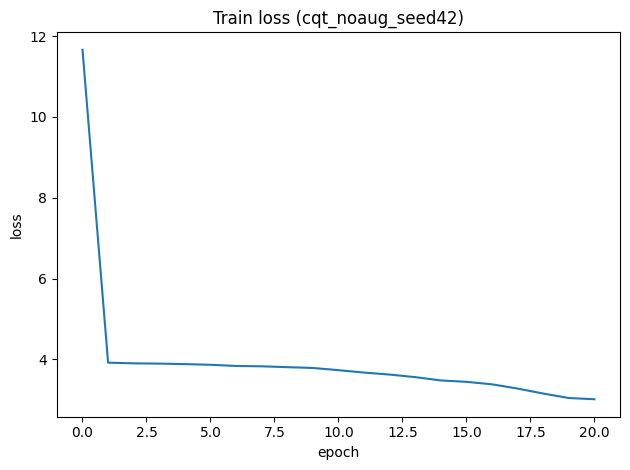

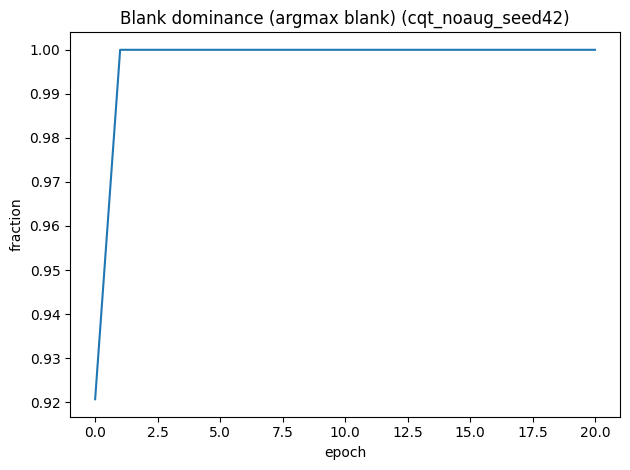

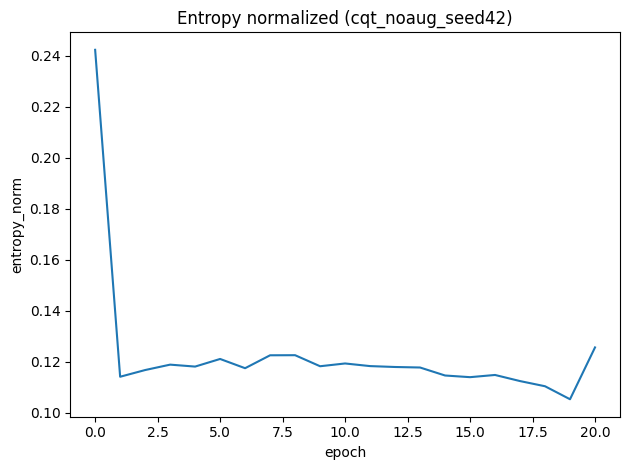


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       2.8207
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.905
  Mean non-blank prob:    0.095
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0399
  LSTM:           0.0113
  Classifier:     0.0910

PREDICTION CONFIDENCE:
  Entropy (norm): 0.118


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       2.5924
Val F1:     0.0452
Val TER:    0.9753
Len Ratio:  0.025

BLANK DIAGNOSTICS:
  Frames blank (argmax):  99.9%
  Mean P(blank):          0.900
  Mean non-blank prob:    0.100
  Unique tokens (argmax): 1
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0487
  LSTM:           0.0123
  Classifier:     0.0401

PREDICTION CONFIDENCE:
  Entropy (norm): 0.109


EPOCH 023 - Detailed Analysis
Cu

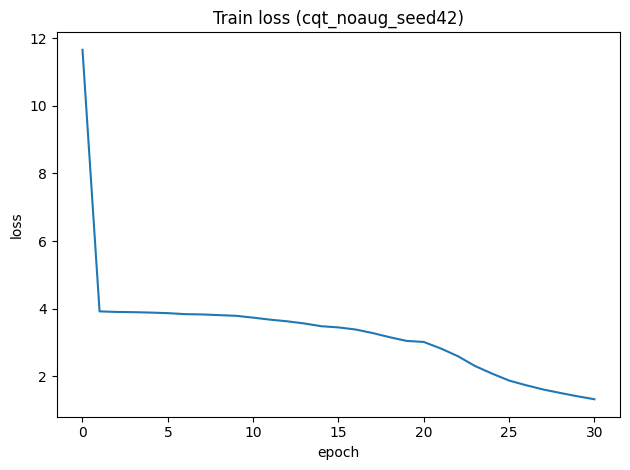

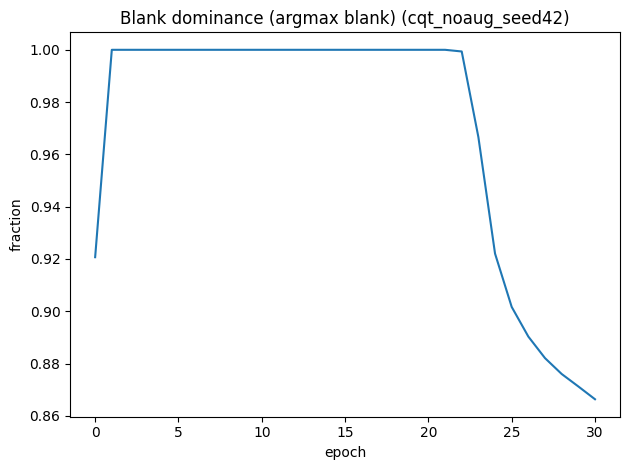

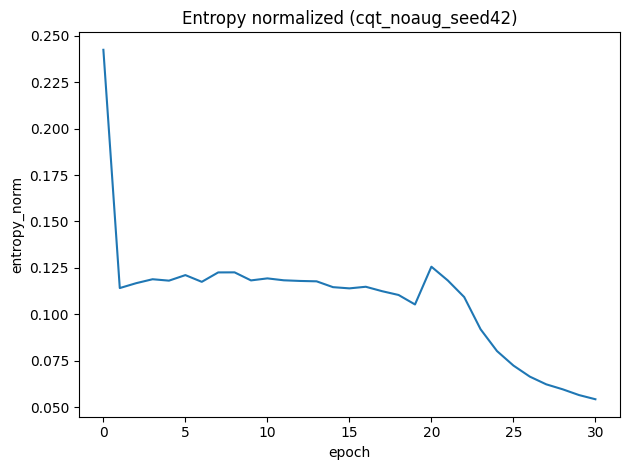


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.2565
Val F1:     0.7128
Val TER:    0.4455
Len Ratio:  0.644

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.3%
  Mean P(blank):          0.852
  Mean non-blank prob:    0.148
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0813
  LSTM:           0.0133
  Classifier:     0.0253

PREDICTION CONFIDENCE:
  Entropy (norm): 0.051


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.2135
Val F1:     0.7415
Val TER:    0.4168
Len Ratio:  0.736

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.0%
  Mean P(blank):          0.849
  Mean non-blank prob:    0.151
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0848
  LSTM:           0.0153
  Classifier:     0.0380

PREDICTION CONFIDENCE:
  Entropy (norm): 0.050


EPOCH

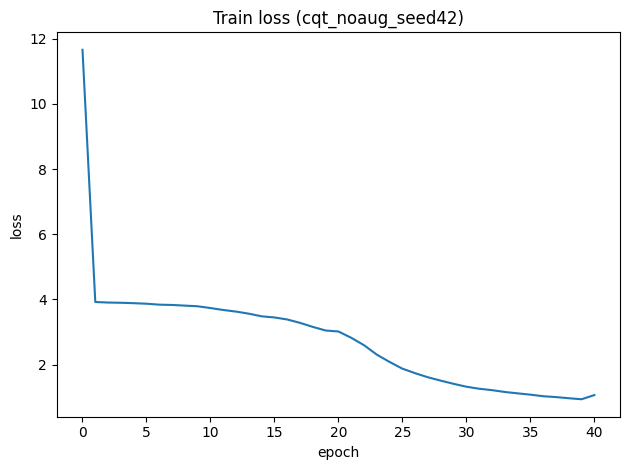

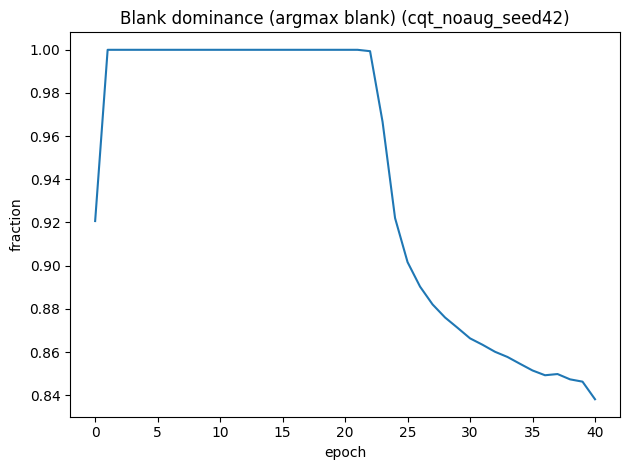

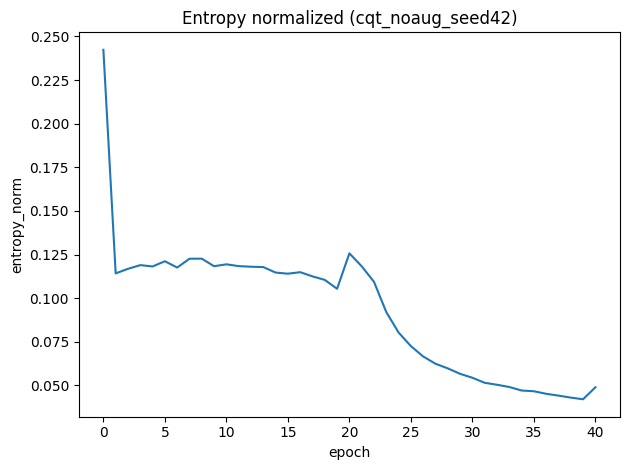


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       1.0079
Val F1:     0.7774
Val TER:    0.3891
Len Ratio:  0.800

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.6%
  Mean P(blank):          0.826
  Mean non-blank prob:    0.174
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1189
  LSTM:           0.0185
  Classifier:     0.0266

PREDICTION CONFIDENCE:
  Entropy (norm): 0.048


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.9796
Val F1:     0.7722
Val TER:    0.3845
Len Ratio:  0.749

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.5%
  Mean P(blank):          0.824
  Mean non-blank prob:    0.176
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0917
  LSTM:           0.0145
  Classifier:     0.0359

PREDICTION CONFIDENCE:
  Entropy (norm): 0.048


EPOCH 043

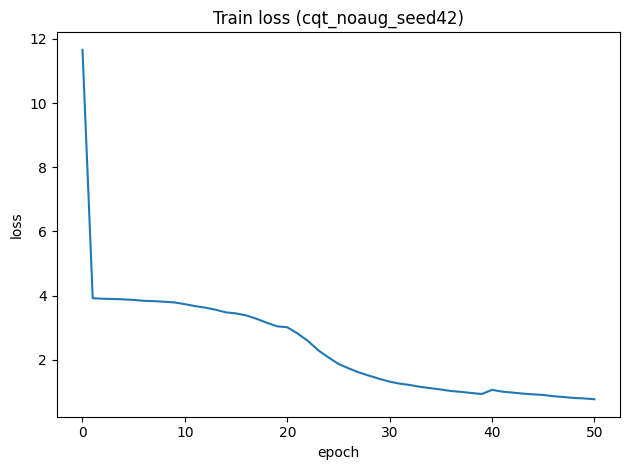

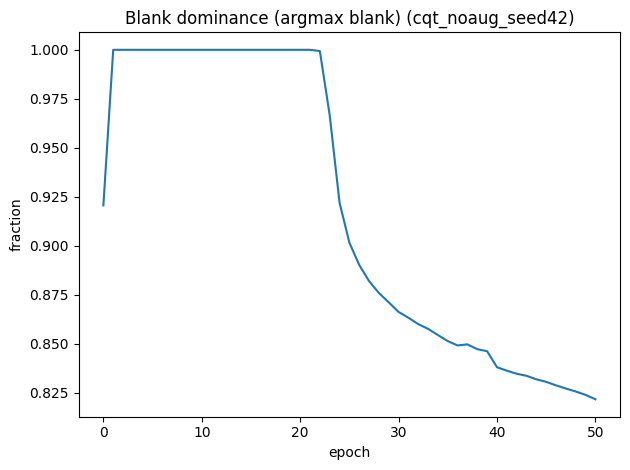

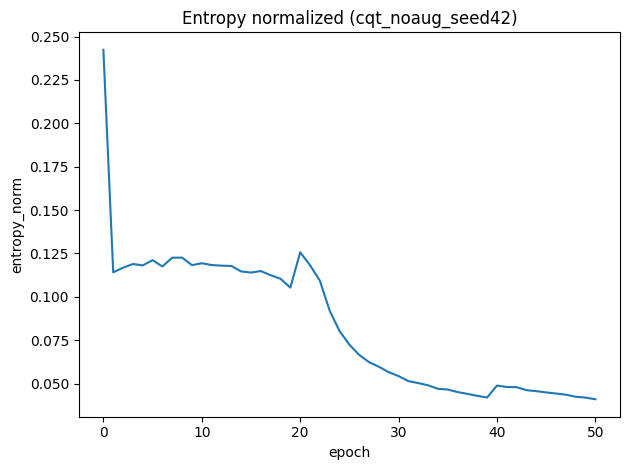


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.7532
Val F1:     0.7736
Val TER:    0.3821
Len Ratio:  0.744

BLANK DIAGNOSTICS:
  Frames blank (argmax):  82.2%
  Mean P(blank):          0.815
  Mean non-blank prob:    0.185
  Unique tokens (argmax): 46
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0687
  LSTM:           0.0132
  Classifier:     0.0203

PREDICTION CONFIDENCE:
  Entropy (norm): 0.040


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.7226
Val F1:     0.7967
Val TER:    0.3742
Len Ratio:  0.825

BLANK DIAGNOSTICS:
  Frames blank (argmax):  81.9%
  Mean P(blank):          0.813
  Mean non-blank prob:    0.187
  Unique tokens (argmax): 46
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1440
  LSTM:           0.0165
  Classifier:     0.0271

PREDICTION CONFIDENCE:
  Entropy (norm): 0.039


EPOCH 053

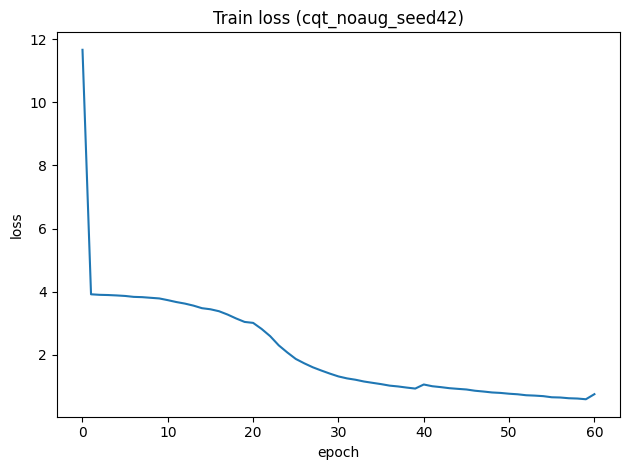

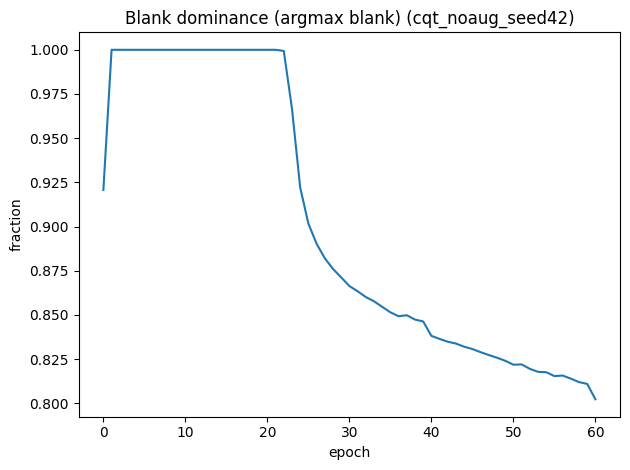

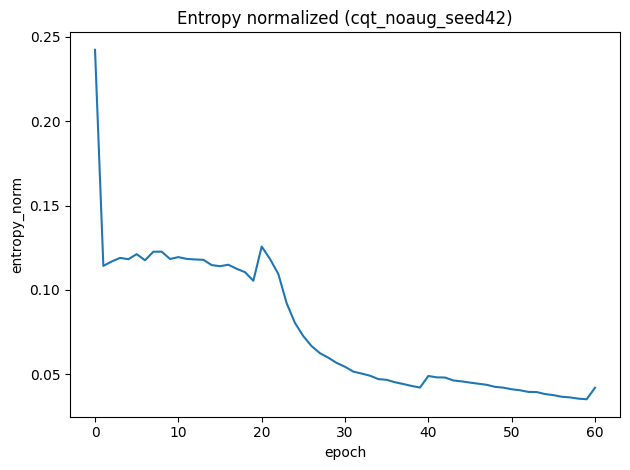


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.7267
Val F1:     0.7605
Val TER:    0.4009
Len Ratio:  0.711

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.2%
  Mean P(blank):          0.794
  Mean non-blank prob:    0.206
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0593
  LSTM:           0.0138
  Classifier:     0.0186

PREDICTION CONFIDENCE:
  Entropy (norm): 0.042


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.7279
Val F1:     0.7921
Val TER:    0.3755
Len Ratio:  0.789

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.1%
  Mean P(blank):          0.794
  Mean non-blank prob:    0.206
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0940
  LSTM:           0.0160
  Classifier:     0.0196

PREDICTION CONFIDENCE:
  Entropy (no

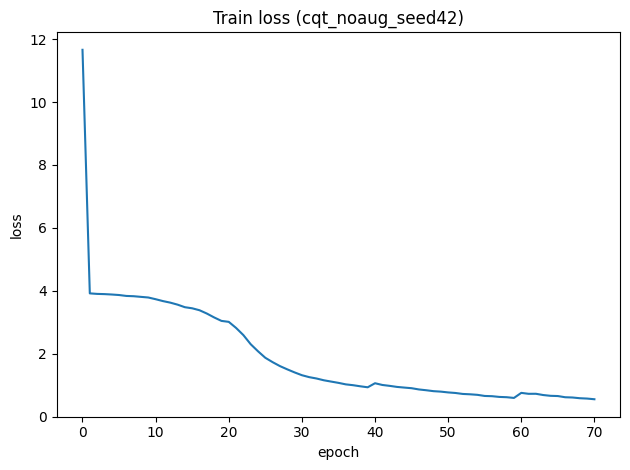

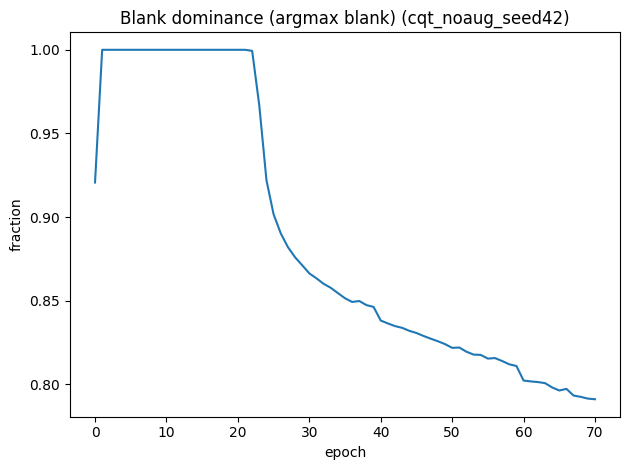

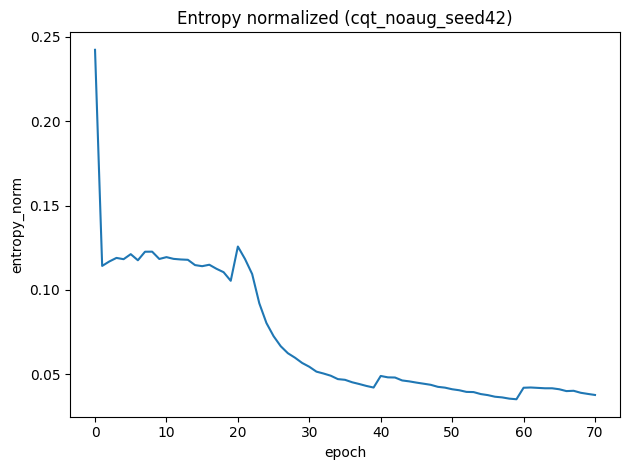


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.5485
Val F1:     0.7911
Val TER:    0.3791
Len Ratio:  0.795

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.9%
  Mean P(blank):          0.783
  Mean non-blank prob:    0.217
  Unique tokens (argmax): 48
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0506
  LSTM:           0.0081
  Classifier:     0.0124

PREDICTION CONFIDENCE:
  Entropy (norm): 0.038


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.5489
Val F1:     0.8161
Val TER:    0.3780
Len Ratio:  0.902

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.8%
  Mean P(blank):          0.782
  Mean non-blank prob:    0.218
  Unique tokens (argmax): 48
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1220
  LSTM:           0.0146
  Classifier:     0.0274

PREDICTION CONFIDENCE:
  Entropy (norm): 0.037


EPOCH 073 - Detailed Analys

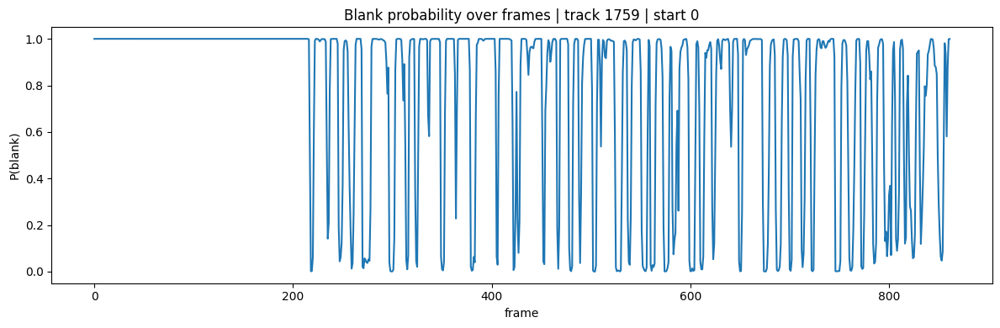

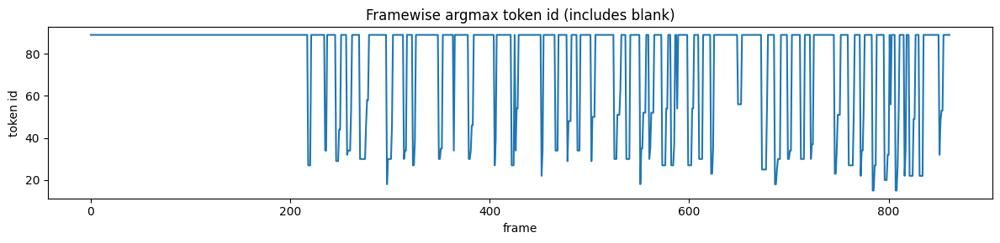

Target len: 95 | Pred len: 91
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [27, 34, 29, 44, 32, 34, 53, 30, 46, 58, 18, 30, 46, 30, 34, 27, 39, 30, 35, 34, 30, 34, 46, 27, 39, 27, 34, 54, 22, 34, 34, 29, 48, 34, 29, 50, 30, 51, 63, 30]


,run_name,feature,augment,seed,best_epoch,best_val_f1_primary,test_best_key,test_F1,test_TER,run_dir
0,hcqt_noaug_seed42,hcqt,False,42,67,0.822664,greedy_alpha0.05,0.722738,0.614135,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
1,hcqt_aug_seed42,hcqt,True,42,76,0.756942,greedy_alpha0.05,0.585701,0.658044,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
2,cqt_aug_seed42,cqt,True,42,77,0.656490,greedy_alpha0.05,0.478289,0.736451,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
3,cqt_noaug_seed42,cqt,False,42,72,0.816072,greedy_alpha0.05,0.705521,0.664758,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/main_experiments_summary.csv


In [19]:
# BLOCK 13: Main Experiments
CFG_TRAIN = TrainConfig(
    epochs=80,
    batch_size=8,
    lr=1e-3,
    weight_decay=1e-4,
    grad_clip=1.0,
    amp=True,
    decode_blank_alphas=(0.0, 0.05, 0.10, 0.15),
)

MAIN_EXPERIMENTS = [
    ("hcqt", False),  # Experiment 1: HCQT on Aug off
    ("hcqt", True),   # Experiment 2: HCQT on Aug on
    ("cqt",  True),   # Experiment 3: CQT  on Aug on
    ("cqt",  False),  # Experiment 4: CQT  on Aug off
]

SEED_MAIN = 42
main_rows = []
for feat, aug in MAIN_EXPERIMENTS:
    print("\n" + "#"*90)
    print("Running:", feat, "augment=", aug)
    print("#"*90)
    main_rows.append(train_one_experiment(feat, aug, seed=SEED_MAIN, cfg=CFG_TRAIN))

main_df = pd.DataFrame(main_rows)
display(main_df)

summary_path = OUT_ROOT / "runs_main_grid" / "main_experiments_summary.csv"
summary_path.parent.mkdir(parents=True, exist_ok=True)
main_df.to_csv(summary_path, index=False)
print("Saved:", summary_path)


### 5 seed Experiment for HCQT without Augmentation


##########################################################################################
CV run: feature=hcqt, augment=False, seed=11
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       10.0370
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.0%
  Mean P(blank):          0.806
  Mean non-blank prob:    0.194
  Unique tokens (argmax): 3
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0001
  LSTM:           0.0032
  Classifier:     0.0698

PREDICTION CONFIDENCE:
  Entropy (norm): 0.240


EPOCH 001 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.9063
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.926
  Mean non-blank prob:    0.074
  Unique toke

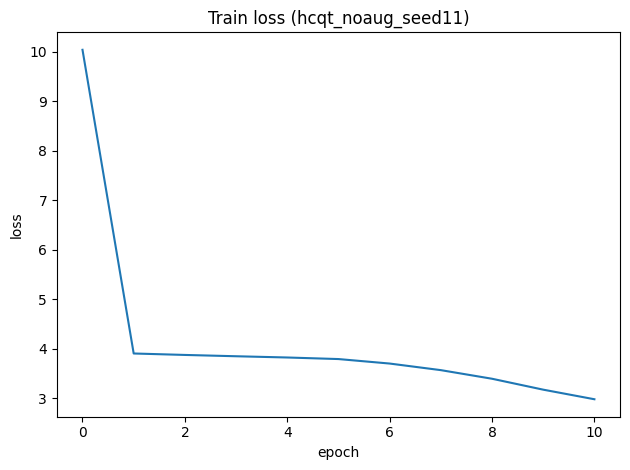

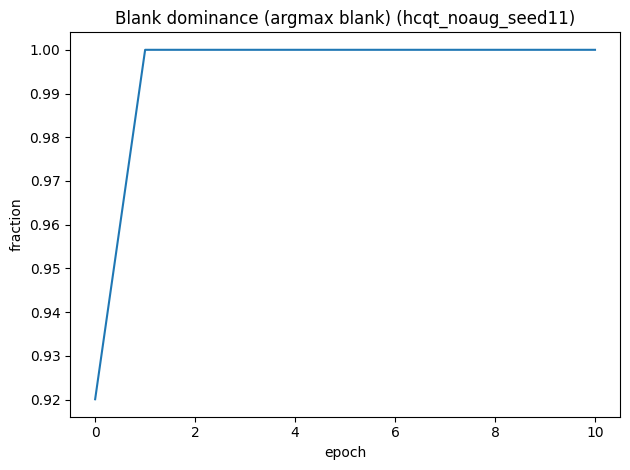

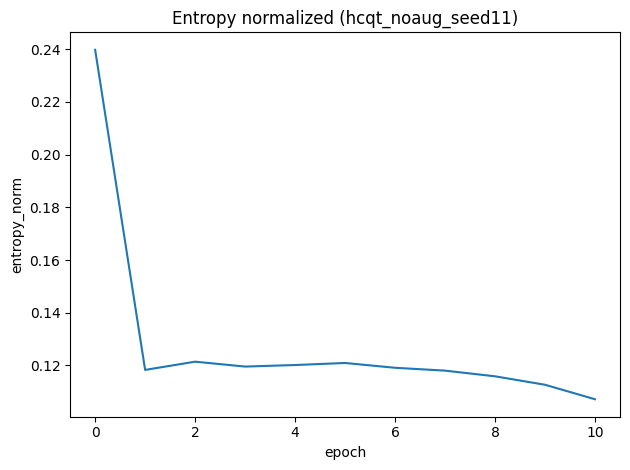


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       2.7608
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.922
  Mean non-blank prob:    0.078
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0133
  LSTM:           0.0147
  Classifier:     0.0699

PREDICTION CONFIDENCE:
  Entropy (norm): 0.102


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       2.5644
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.921
  Mean non-blank prob:    0.079
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0301
  LSTM:           0.0150
  Classifier:     0.0848

PREDICTION CONFIDENCE:
  Entropy (norm): 0.099


EPOCH 013 - Detailed Analysis
Cur

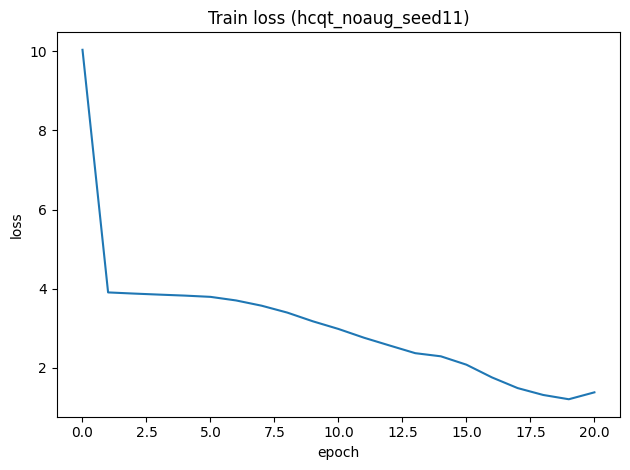

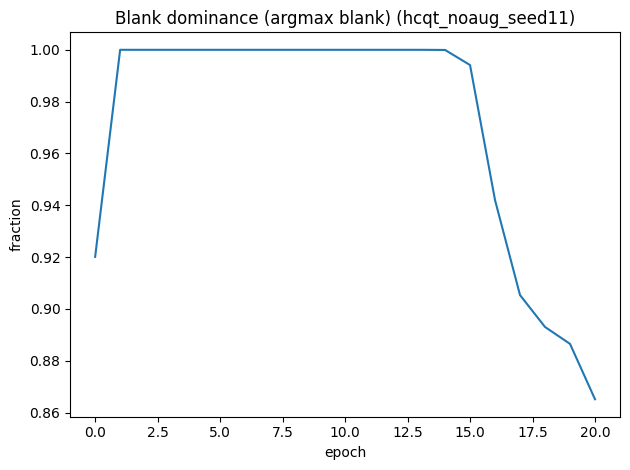

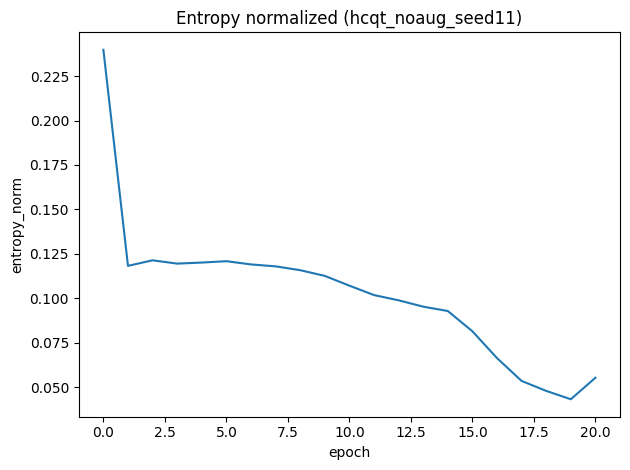


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.2480
Val F1:     0.7066
Val TER:    0.4373
Len Ratio:  0.635

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.2%
  Mean P(blank):          0.852
  Mean non-blank prob:    0.148
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0483
  LSTM:           0.0138
  Classifier:     0.0262

PREDICTION CONFIDENCE:
  Entropy (norm): 0.053


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.1635
Val F1:     0.7463
Val TER:    0.4020
Len Ratio:  0.730

BLANK DIAGNOSTICS:
  Frames blank (argmax):  85.8%
  Mean P(blank):          0.849
  Mean non-blank prob:    0.151
  Unique tokens (argmax): 42
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0710
  LSTM:           0.0138
  Classifier:     0.0212

PREDICTION CONFIDENCE:
  Entropy (norm): 0.050


EPOCH

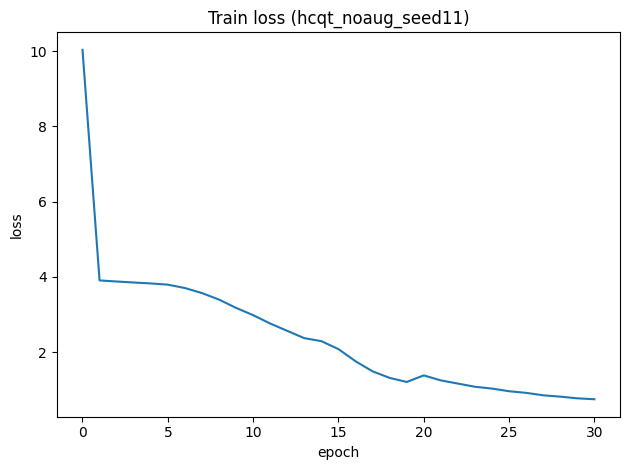

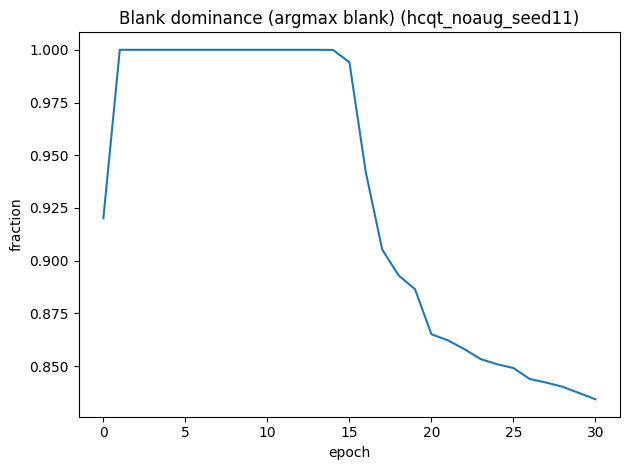

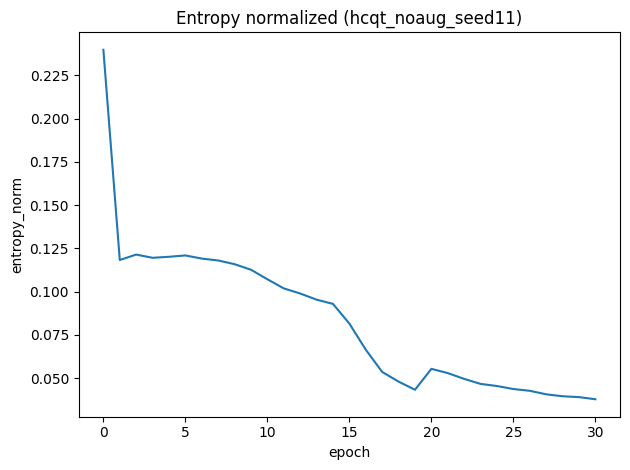


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.6905
Val F1:     0.7910
Val TER:    0.3596
Len Ratio:  0.807

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.3%
  Mean P(blank):          0.829
  Mean non-blank prob:    0.171
  Unique tokens (argmax): 46
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0415
  LSTM:           0.0084
  Classifier:     0.0106

PREDICTION CONFIDENCE:
  Entropy (norm): 0.036


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.6635
Val F1:     0.7664
Val TER:    0.3786
Len Ratio:  0.738

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.1%
  Mean P(blank):          0.827
  Mean non-blank prob:    0.173
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0647
  LSTM:           0.0124
  Classifier:     0.0181

PREDICTION CONFIDENCE:
  Entropy (norm): 0.035


EPOCH

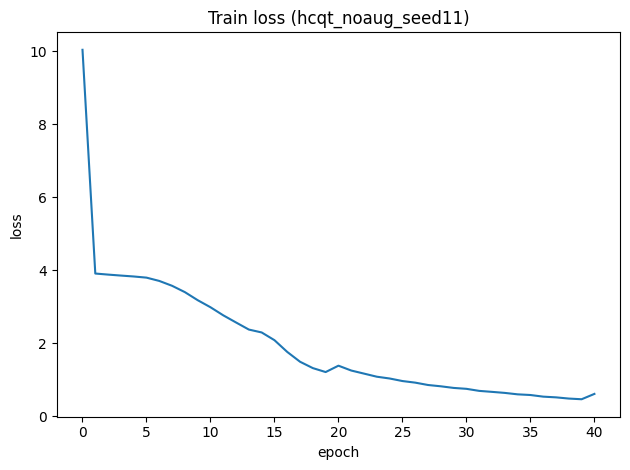

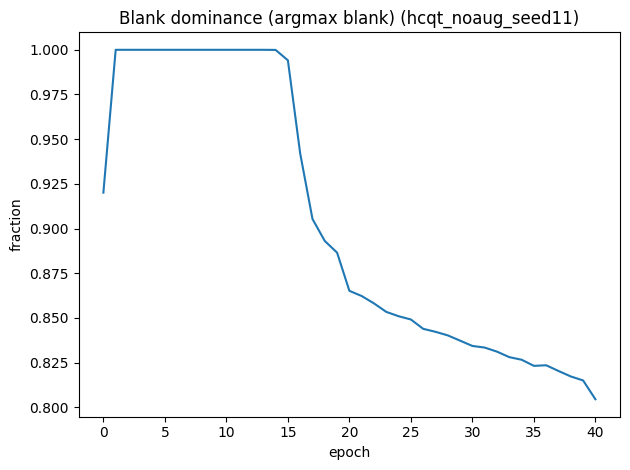

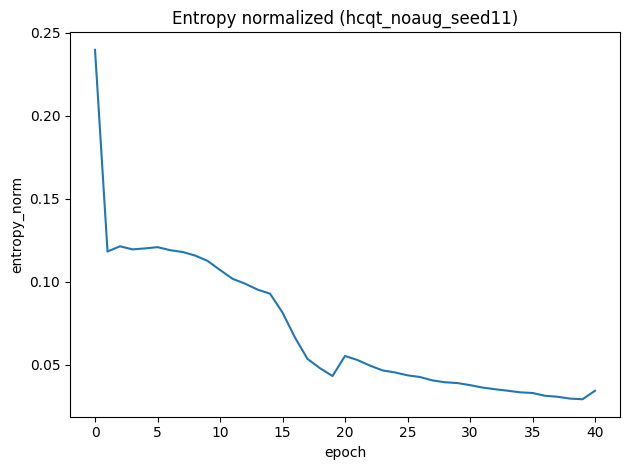


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5799
Val F1:     0.8027
Val TER:    0.3559
Len Ratio:  0.817

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.4%
  Mean P(blank):          0.799
  Mean non-blank prob:    0.201
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0843
  LSTM:           0.0140
  Classifier:     0.0190

PREDICTION CONFIDENCE:
  Entropy (norm): 0.034


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5315
Val F1:     0.7823
Val TER:    0.3633
Len Ratio:  0.762

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.1%
  Mean P(blank):          0.797
  Mean non-blank prob:    0.203
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     0.9379
  CNN:            0.0863
  LSTM:           0.0103
  Classifier:     0.0158

PREDICTION CONFIDENCE:
  Entropy (norm): 0.034


EPOCH 043

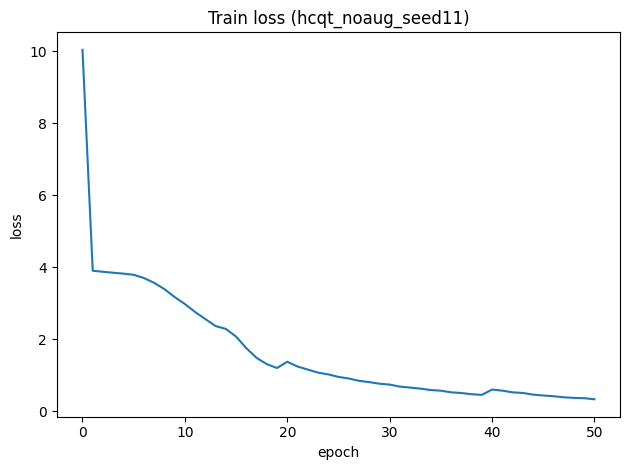

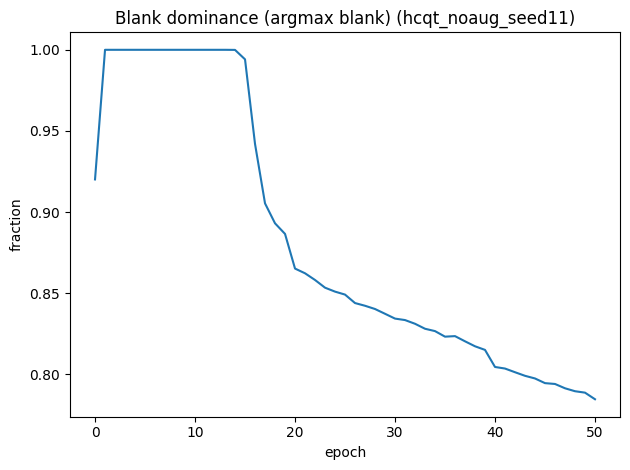

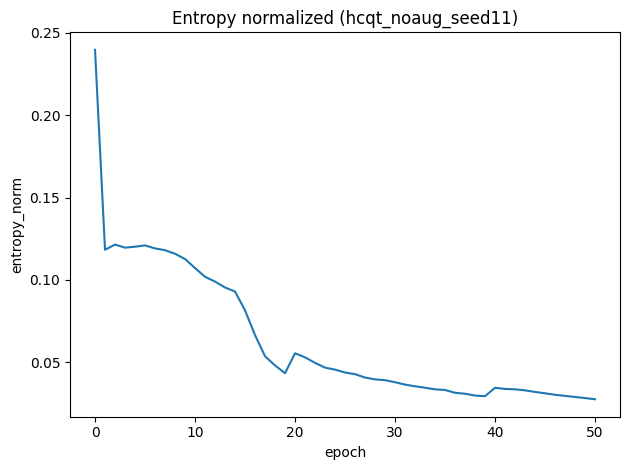


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.3129
Val F1:     0.7981
Val TER:    0.3608
Len Ratio:  0.823

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.4%
  Mean P(blank):          0.781
  Mean non-blank prob:    0.219
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0324
  LSTM:           0.0082
  Classifier:     0.0101

PREDICTION CONFIDENCE:
  Entropy (norm): 0.027


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.2997
Val F1:     0.8099
Val TER:    0.3732
Len Ratio:  0.898

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.2%
  Mean P(blank):          0.780
  Mean non-blank prob:    0.220
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     0.7031
  CNN:            0.0490
  LSTM:           0.0149
  Classifier:     0.0124

PREDICTION CONFIDENCE:
  Entropy (norm): 0.026


EPOCH 053 - Detailed Analysis
Curriculum: Phase 3

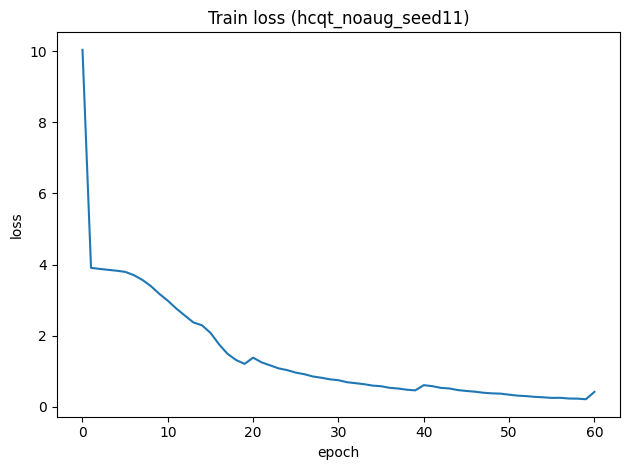

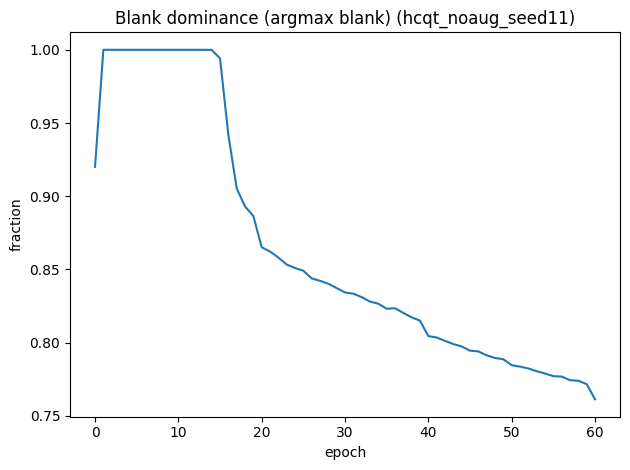

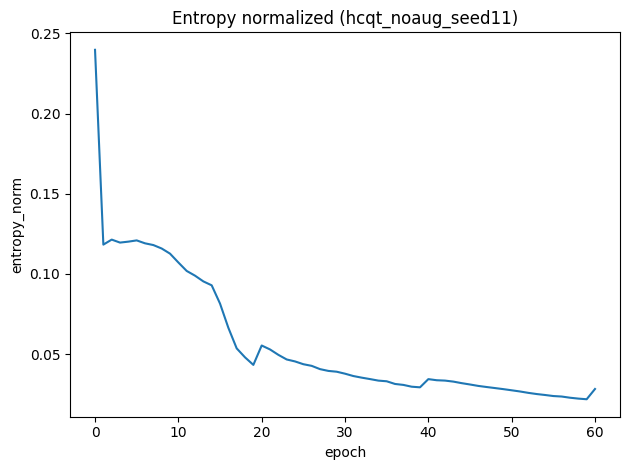


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3472
Val F1:     0.7997
Val TER:    0.3760
Len Ratio:  0.887

BLANK DIAGNOSTICS:
  Frames blank (argmax):  76.1%
  Mean P(blank):          0.758
  Mean non-blank prob:    0.242
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1304
  LSTM:           0.0079
  Classifier:     0.0098

PREDICTION CONFIDENCE:
  Entropy (norm): 0.028


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3266
Val F1:     0.8132
Val TER:    0.3868
Len Ratio:  0.966

BLANK DIAGNOSTICS:
  Frames blank (argmax):  75.9%
  Mean P(blank):          0.756
  Mean non-blank prob:    0.244
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0679
  LSTM:           0.0188
  Classifier:     0.0223

PREDICTION CONFIDENCE:
  Entropy (norm): 0.028


EPOCH 063 - Detailed Analys

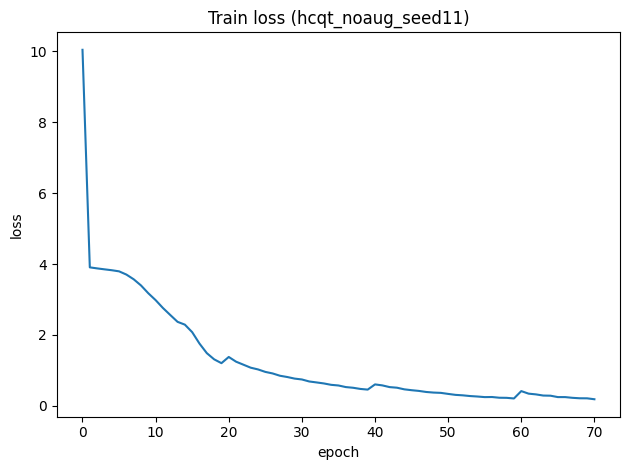

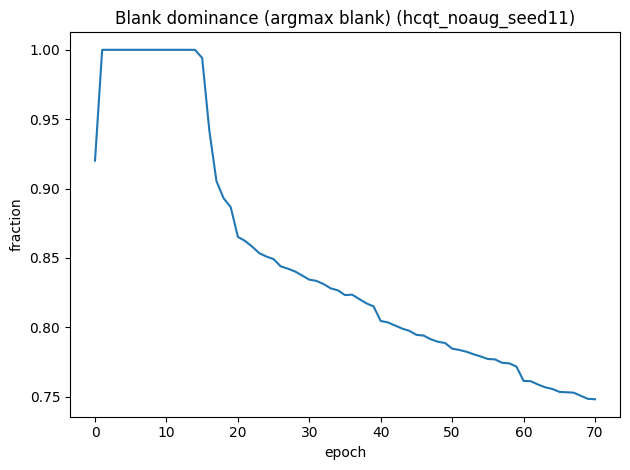

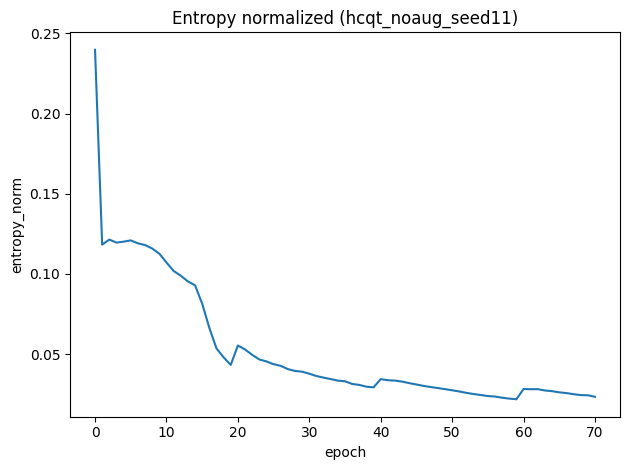


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1816
Val F1:     0.8051
Val TER:    0.3648
Len Ratio:  0.831

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.7%
  Mean P(blank):          0.745
  Mean non-blank prob:    0.255
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0456
  LSTM:           0.0119
  Classifier:     0.0101

PREDICTION CONFIDENCE:
  Entropy (norm): 0.023


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1824
Val F1:     0.7882
Val TER:    0.3728
Len Ratio:  0.778

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.4%
  Mean P(blank):          0.743
  Mean non-blank prob:    0.257
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1356
  LSTM:           0.0114
  Classifier:     0.0122

PREDICTION CONFIDENCE:
  Entropy (norm): 0.023


EPOCH 073 - Detailed Analys

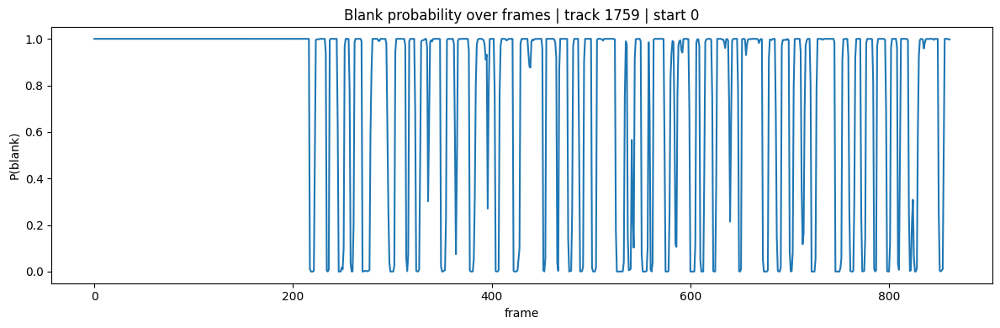

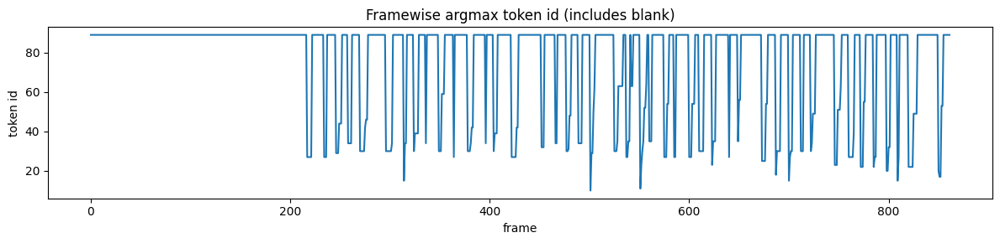

Target len: 95 | Pred len: 89
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [27, 27, 29, 44, 34, 30, 42, 46, 30, 34, 15, 34, 30, 39, 34, 30, 59, 27, 30, 34, 42, 34, 30, 39, 27, 42, 32, 34, 30, 31, 48, 34, 10, 29, 50, 62, 30, 35, 63, 27]

##########################################################################################
CV run: feature=hcqt, augment=False, seed=22
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       10.1565
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.0%
  Mean P(blank):          0.802
  Mean non-blank prob:    0.198
  Unique tokens (argmax): 3
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:    

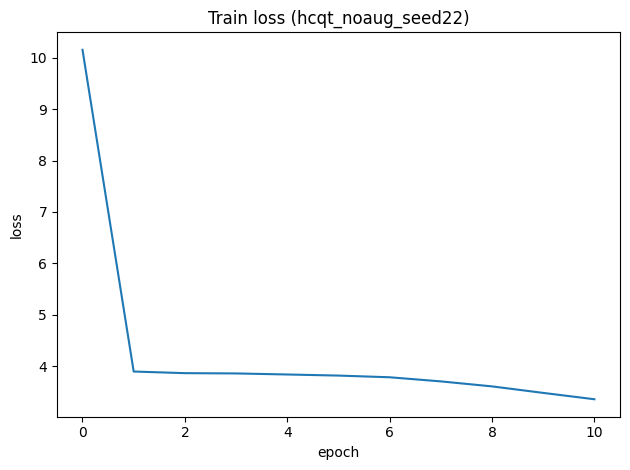

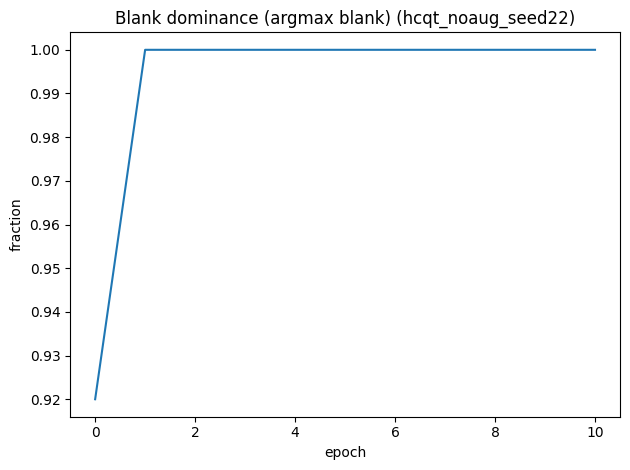

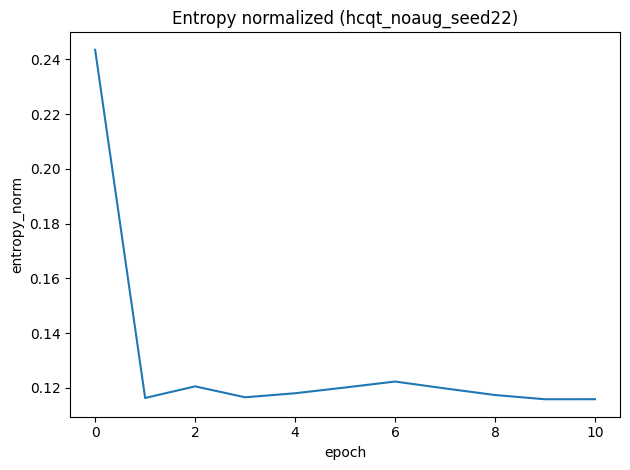


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.1193
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.922
  Mean non-blank prob:    0.078
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0284
  LSTM:           0.0105
  Classifier:     0.0891

PREDICTION CONFIDENCE:
  Entropy (norm): 0.110


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       2.9454
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.921
  Mean non-blank prob:    0.079
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0212
  LSTM:           0.0148
  Classifier:     0.0723

PREDICTION CONFIDENCE:
  Entropy (norm): 0.107


EPOCH 013 - Detailed Analysis
Cur

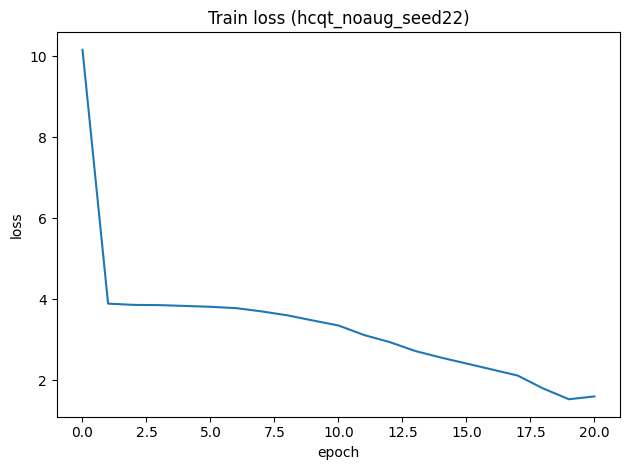

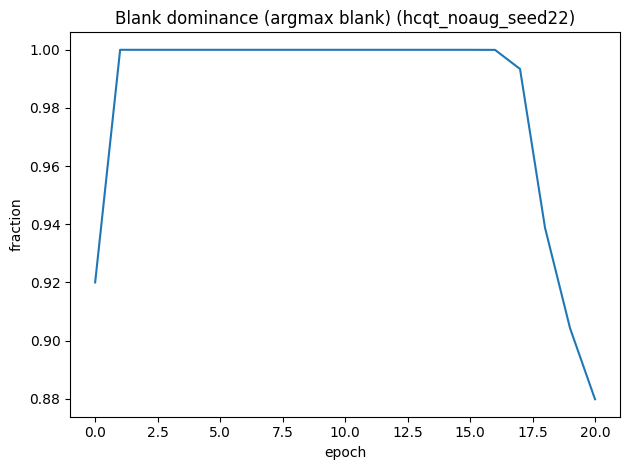

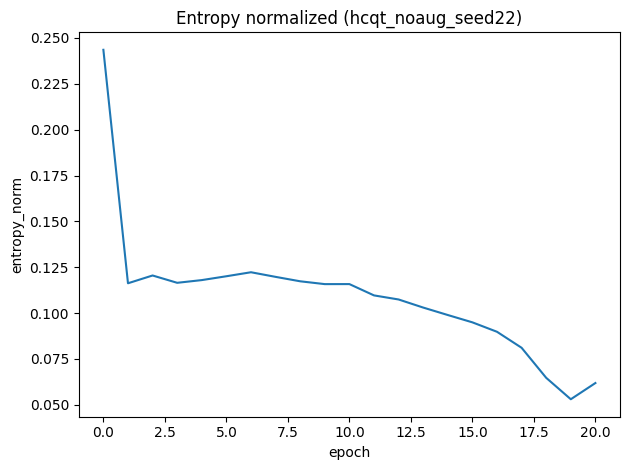


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.4051
Val F1:     0.7356
Val TER:    0.4272
Len Ratio:  0.732

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.9%
  Mean P(blank):          0.857
  Mean non-blank prob:    0.143
  Unique tokens (argmax): 40
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0427
  LSTM:           0.0263
  Classifier:     0.0503

PREDICTION CONFIDENCE:
  Entropy (norm): 0.057


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.2874
Val F1:     0.7395
Val TER:    0.4146
Len Ratio:  0.710

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.4%
  Mean P(blank):          0.853
  Mean non-blank prob:    0.147
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0780
  LSTM:           0.0204
  Classifier:     0.0410

PREDICTION CONFIDENCE:
  Entropy (norm): 0.052


EPOCH

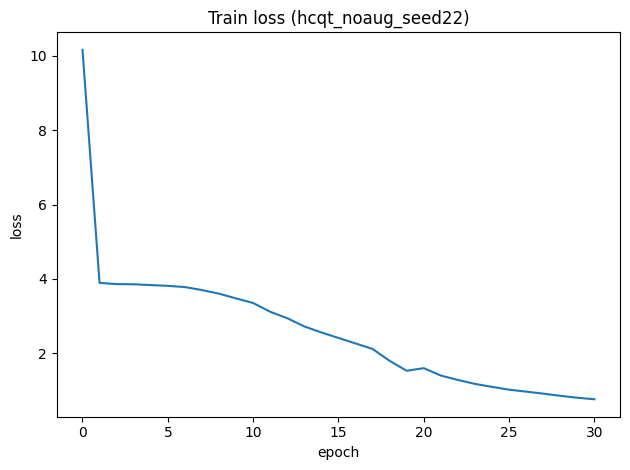

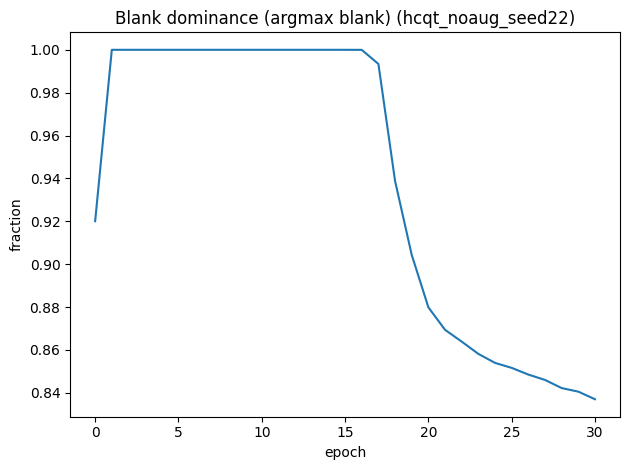

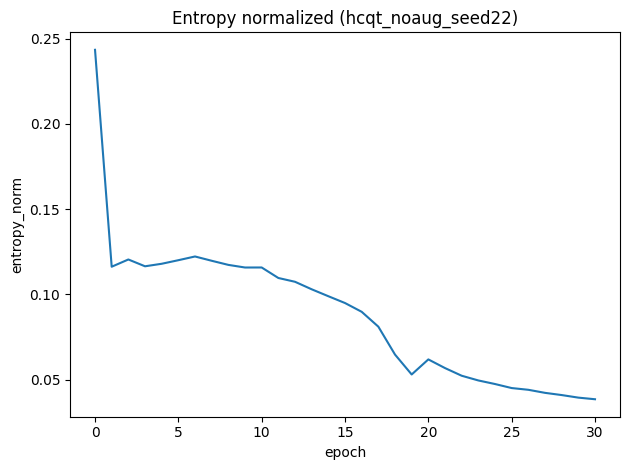


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.7459
Val F1:     0.7923
Val TER:    0.3671
Len Ratio:  0.796

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.4%
  Mean P(blank):          0.829
  Mean non-blank prob:    0.171
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0387
  LSTM:           0.0111
  Classifier:     0.0127

PREDICTION CONFIDENCE:
  Entropy (norm): 0.037


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.7100
Val F1:     0.7893
Val TER:    0.3650
Len Ratio:  0.781

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.4%
  Mean P(blank):          0.829
  Mean non-blank prob:    0.171
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0369
  LSTM:           0.0111
  Classifier:     0.0155

PREDICTION CONFIDENCE:
  Entropy (norm): 0.036


EPOCH

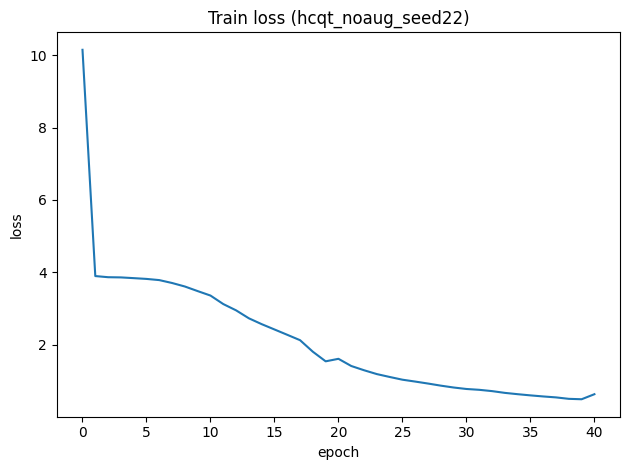

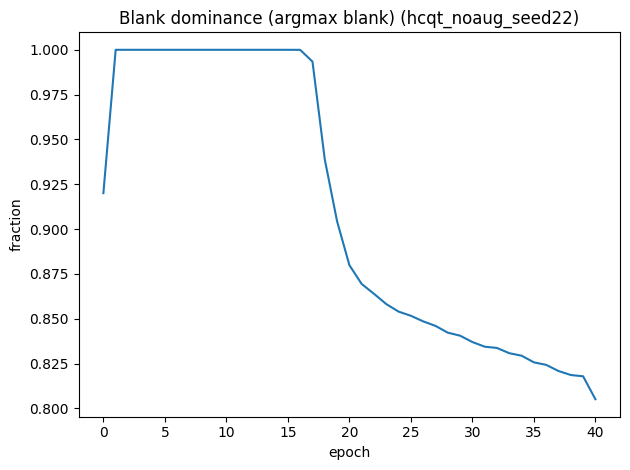

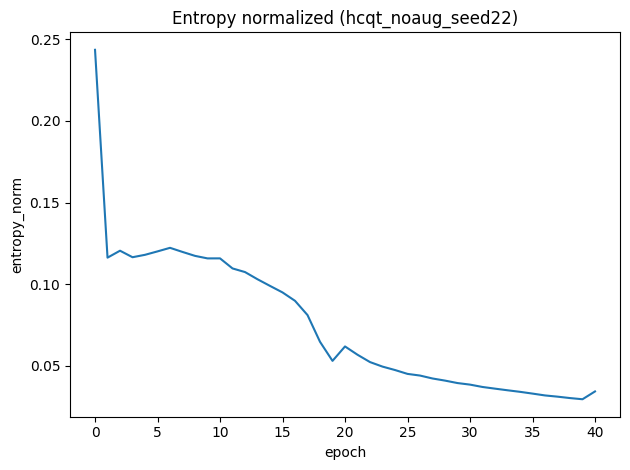


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5821
Val F1:     0.8237
Val TER:    0.3444
Len Ratio:  0.881

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.6%
  Mean P(blank):          0.802
  Mean non-blank prob:    0.198
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0364
  LSTM:           0.0160
  Classifier:     0.0164

PREDICTION CONFIDENCE:
  Entropy (norm): 0.034


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5381
Val F1:     0.8297
Val TER:    0.3693
Len Ratio:  0.963

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.3%
  Mean P(blank):          0.799
  Mean non-blank prob:    0.201
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1328
  LSTM:           0.0128
  Classifier:     0.0226

PREDICTION CONFIDENCE:
  Entropy (norm): 0.033


EPOCH 043

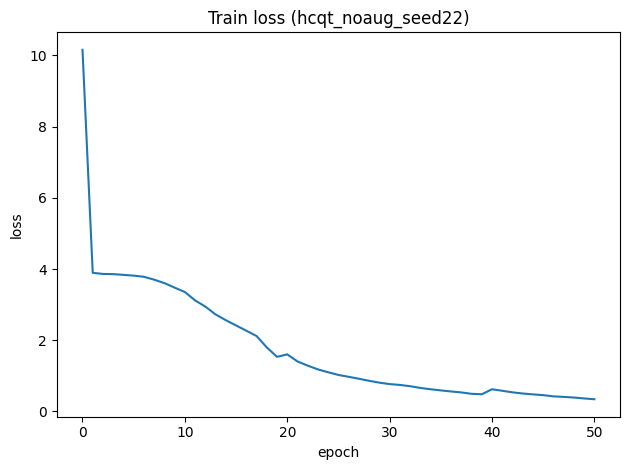

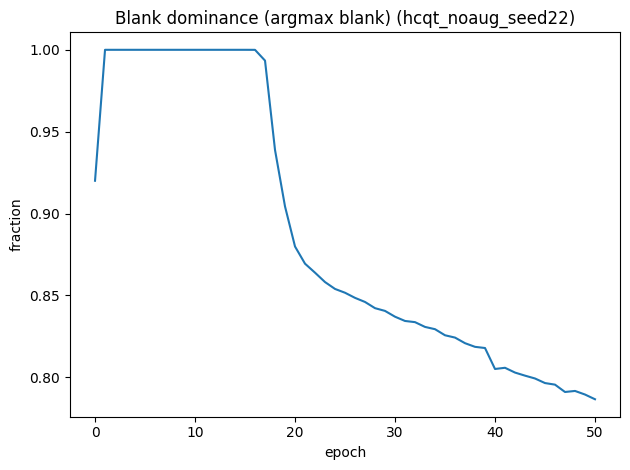

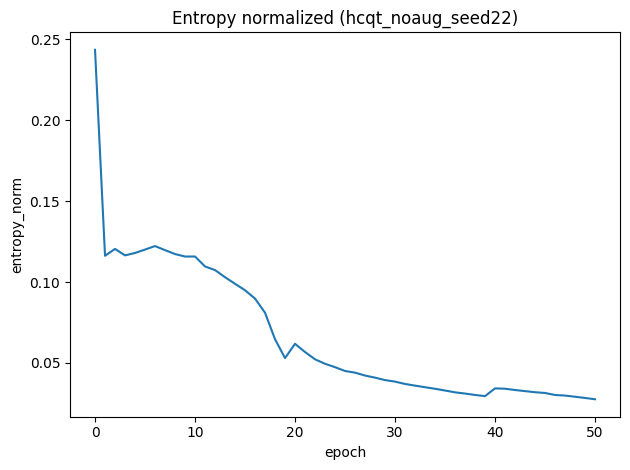


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.3267
Val F1:     0.8034
Val TER:    0.3559
Len Ratio:  0.798

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.5%
  Mean P(blank):          0.783
  Mean non-blank prob:    0.217
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0584
  LSTM:           0.0151
  Classifier:     0.0142

PREDICTION CONFIDENCE:
  Entropy (norm): 0.027


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.3161
Val F1:     0.8082
Val TER:    0.3547
Len Ratio:  0.808

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.4%
  Mean P(blank):          0.781
  Mean non-blank prob:    0.219
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0709
  LSTM:           0.0212
  Classifier:     0.0153

PREDICTION CONFIDENCE:
  Entropy (norm): 0.026


EPOCH 053 - Detailed Analysis
Curriculum: Phase 3

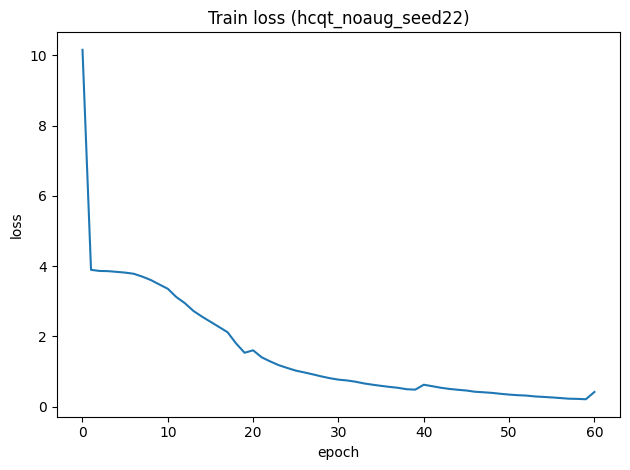

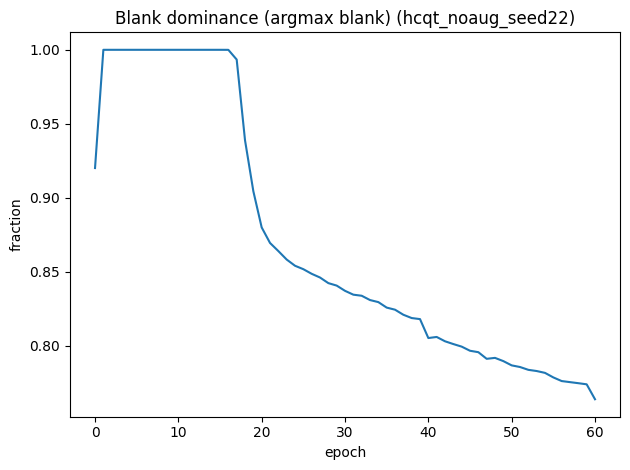

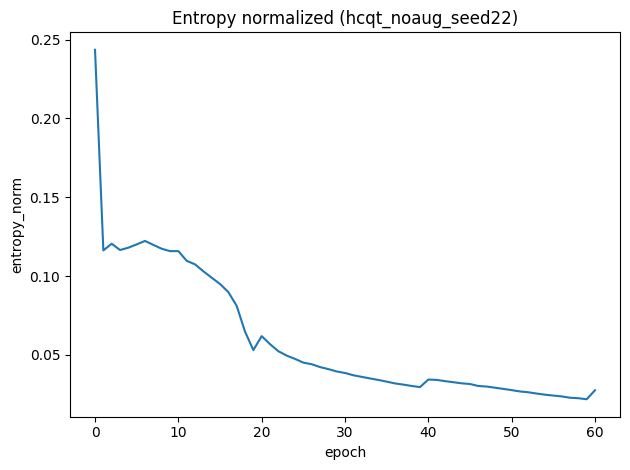


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3454
Val F1:     0.8338
Val TER:    0.3592
Len Ratio:  0.918

BLANK DIAGNOSTICS:
  Frames blank (argmax):  76.2%
  Mean P(blank):          0.759
  Mean non-blank prob:    0.241
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1128
  LSTM:           0.0138
  Classifier:     0.0137

PREDICTION CONFIDENCE:
  Entropy (norm): 0.028


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3148
Val F1:     0.8157
Val TER:    0.3621
Len Ratio:  0.837

BLANK DIAGNOSTICS:
  Frames blank (argmax):  76.1%
  Mean P(blank):          0.758
  Mean non-blank prob:    0.242
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0564
  LSTM:           0.0228
  Classifier:     0.0139

PREDICTION CONFIDENCE:
  Entropy (norm): 0.027


EPOCH 063 - Detailed Analys

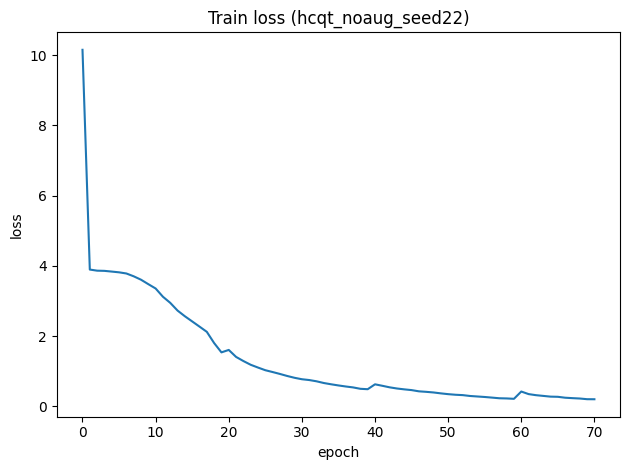

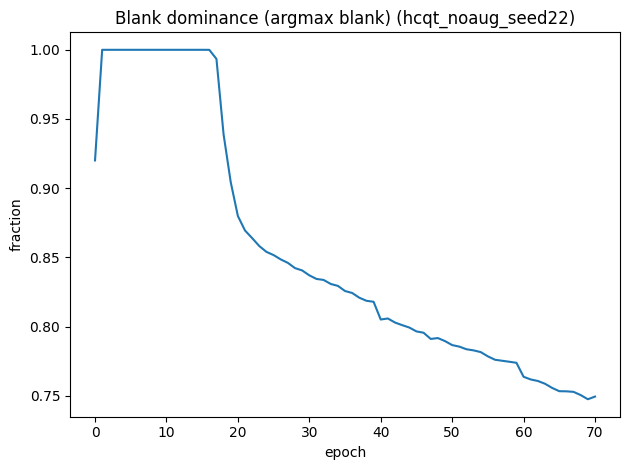

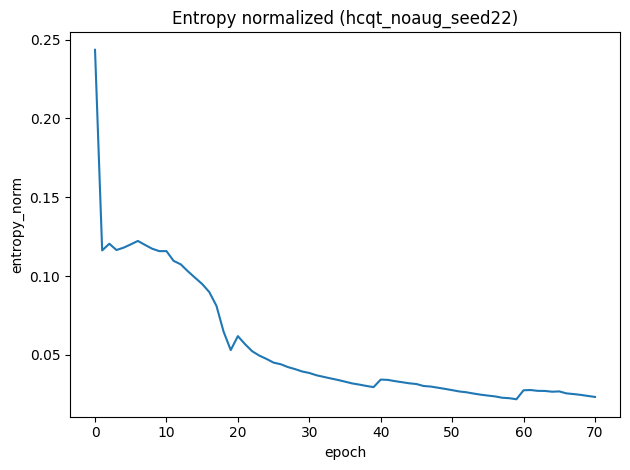


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1786
Val F1:     0.8270
Val TER:    0.3756
Len Ratio:  0.948

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.8%
  Mean P(blank):          0.747
  Mean non-blank prob:    0.253
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     0.5554
  CNN:            0.0158
  LSTM:           0.0028
  Classifier:     0.0037

PREDICTION CONFIDENCE:
  Entropy (norm): 0.023


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1745
Val F1:     0.8287
Val TER:    0.3808
Len Ratio:  0.947

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.6%
  Mean P(blank):          0.745
  Mean non-blank prob:    0.255
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0882
  LSTM:           0.0123
  Classifier:     0.0111

PREDICTION CONFIDENCE:
  Entropy (norm): 0.022


EPOCH 073 - Detailed Analys

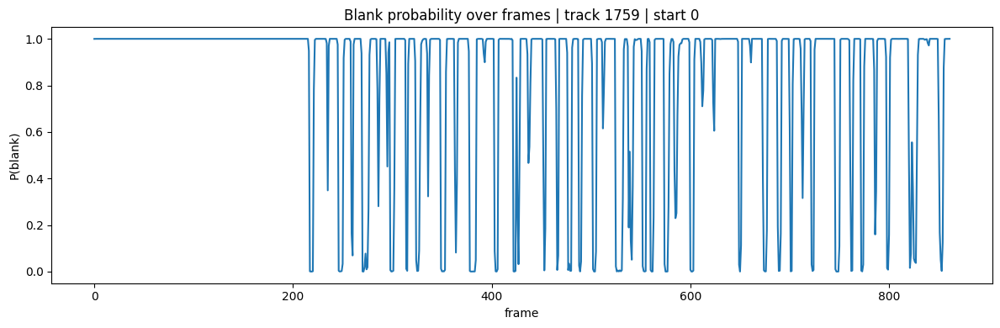

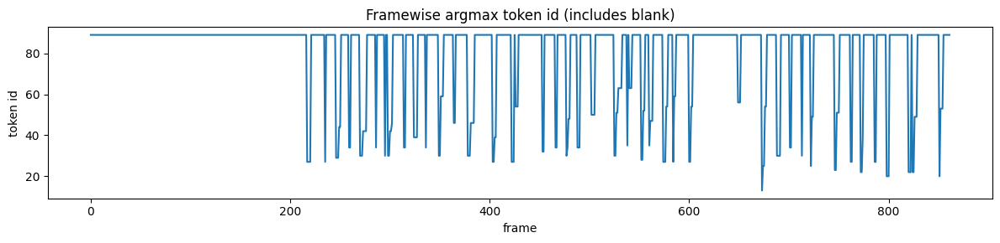

Target len: 95 | Pred len: 67
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [27, 27, 29, 44, 34, 30, 42, 34, 30, 30, 42, 46, 34, 39, 34, 30, 59, 46, 30, 46, 27, 39, 27, 54, 32, 34, 30, 34, 48, 34, 50, 30, 51, 63, 35, 63, 28, 52, 35, 47]

##########################################################################################
CV run: feature=hcqt, augment=False, seed=33
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       11.0360
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.5%
  Mean P(blank):          0.817
  Mean non-blank prob:    0.183
  Unique tokens (argmax): 4
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:    

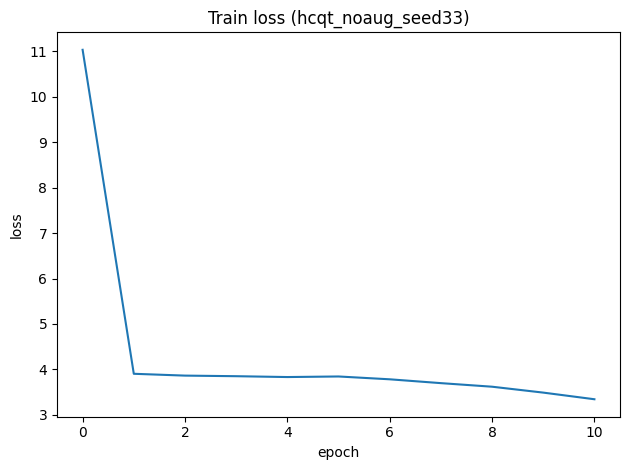

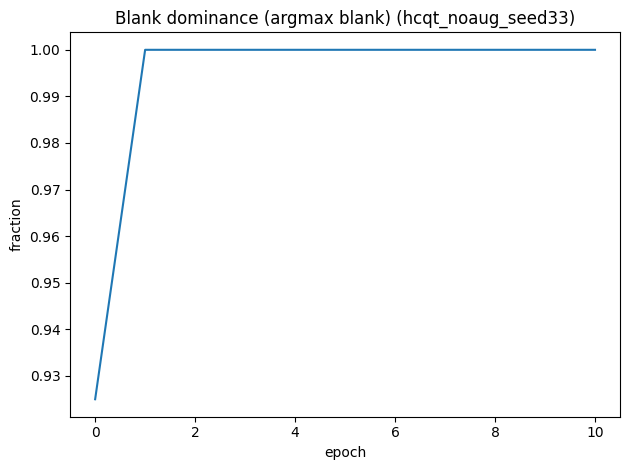

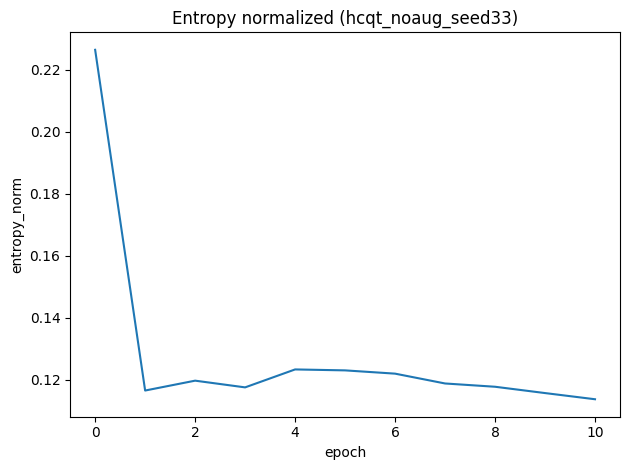


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.0656
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.923
  Mean non-blank prob:    0.077
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0176
  LSTM:           0.0095
  Classifier:     0.0848

PREDICTION CONFIDENCE:
  Entropy (norm): 0.109


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       2.8808
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.922
  Mean non-blank prob:    0.078
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0264
  LSTM:           0.0093
  Classifier:     0.0773

PREDICTION CONFIDENCE:
  Entropy (norm): 0.105


EPOCH 013 - Detailed Analysis
Cur

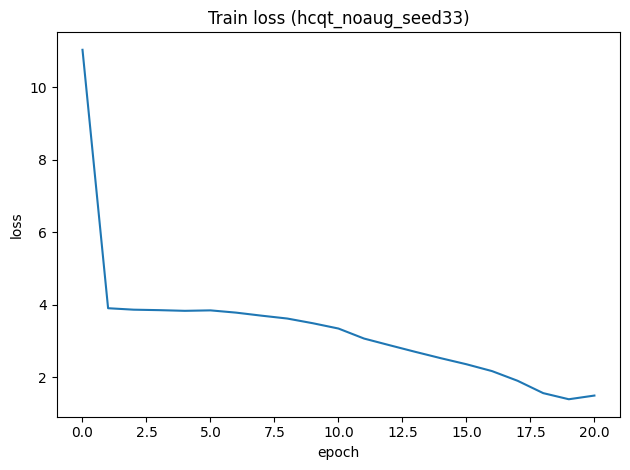

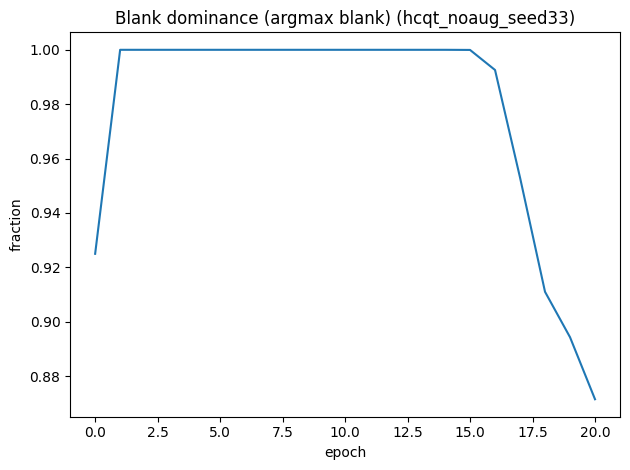

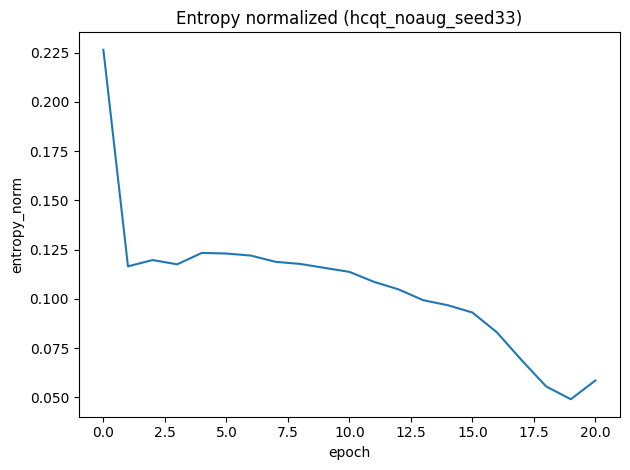


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.3254
Val F1:     0.7468
Val TER:    0.4109
Len Ratio:  0.723

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.5%
  Mean P(blank):          0.854
  Mean non-blank prob:    0.146
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0832
  LSTM:           0.0142
  Classifier:     0.0462

PREDICTION CONFIDENCE:
  Entropy (norm): 0.055


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.2128
Val F1:     0.7400
Val TER:    0.4190
Len Ratio:  0.711

BLANK DIAGNOSTICS:
  Frames blank (argmax):  85.9%
  Mean P(blank):          0.849
  Mean non-blank prob:    0.151
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0692
  LSTM:           0.0051
  Classifier:     0.0201

PREDICTION CONFIDENCE:
  Entropy (norm): 0.052


EPOCH

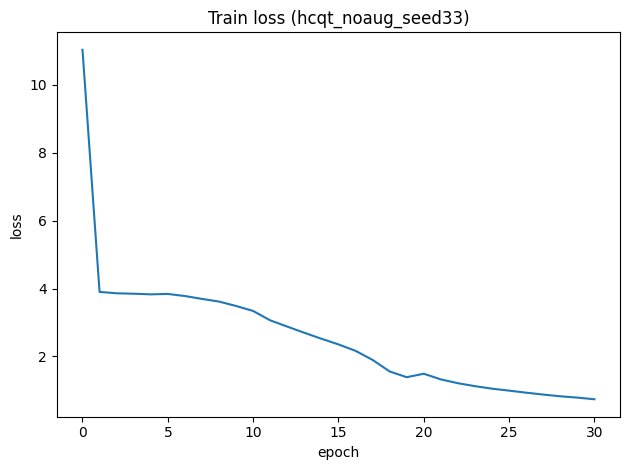

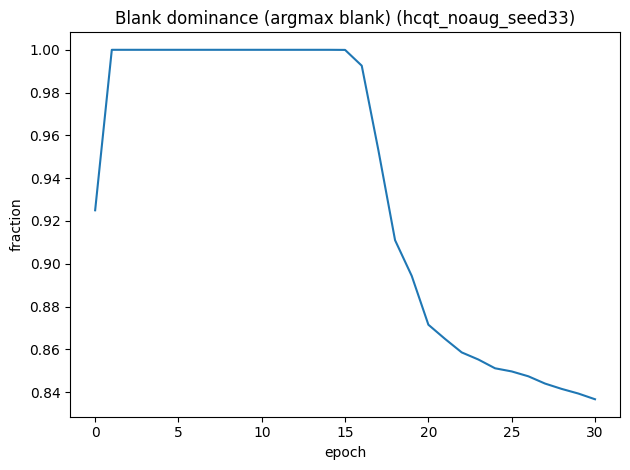

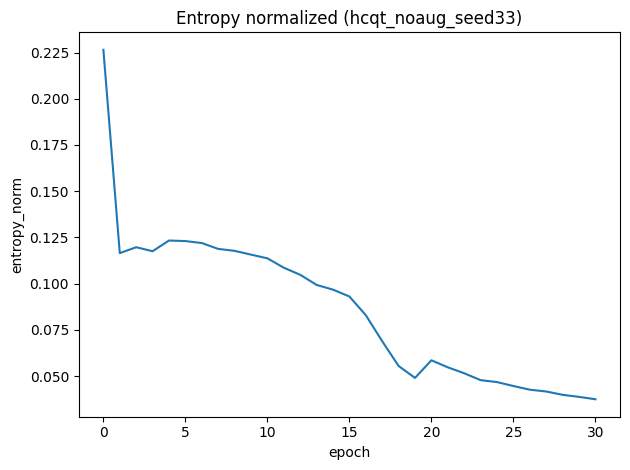


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.6983
Val F1:     0.7889
Val TER:    0.3678
Len Ratio:  0.787

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.5%
  Mean P(blank):          0.830
  Mean non-blank prob:    0.170
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1152
  LSTM:           0.0082
  Classifier:     0.0312

PREDICTION CONFIDENCE:
  Entropy (norm): 0.036


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.6630
Val F1:     0.7850
Val TER:    0.3679
Len Ratio:  0.767

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.2%
  Mean P(blank):          0.828
  Mean non-blank prob:    0.172
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0505
  LSTM:           0.0075
  Classifier:     0.0192

PREDICTION CONFIDENCE:
  Entropy (norm): 0.035


EPOCH

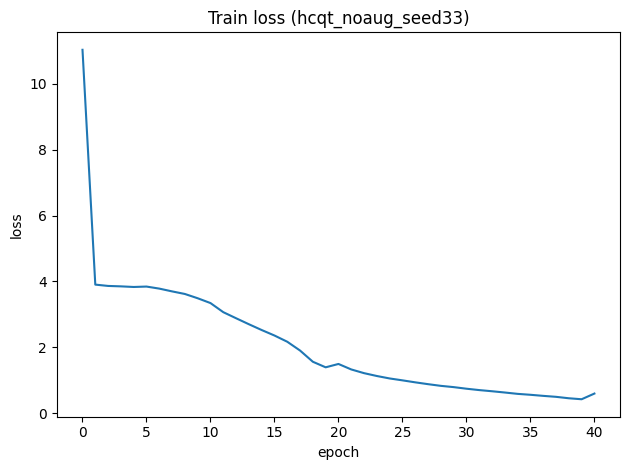

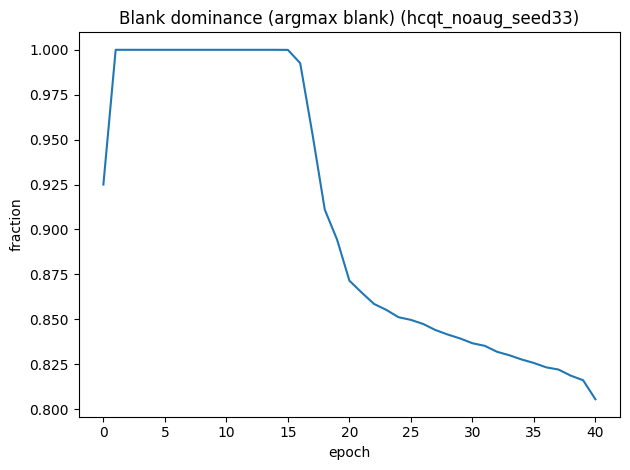

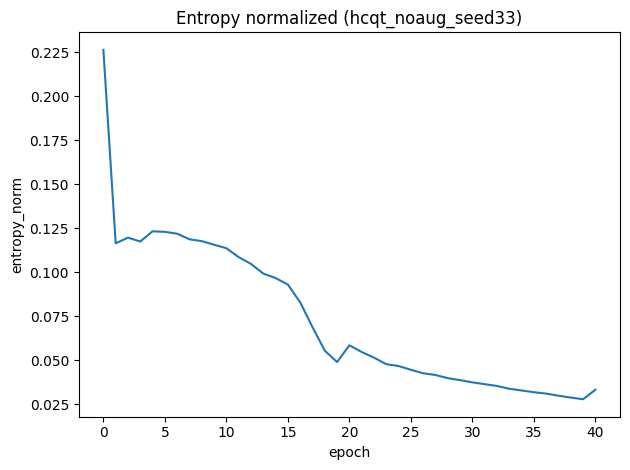


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5346
Val F1:     0.7922
Val TER:    0.3608
Len Ratio:  0.768

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.4%
  Mean P(blank):          0.800
  Mean non-blank prob:    0.200
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0385
  LSTM:           0.0124
  Classifier:     0.0154

PREDICTION CONFIDENCE:
  Entropy (norm): 0.033


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5032
Val F1:     0.8154
Val TER:    0.3547
Len Ratio:  0.836

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.2%
  Mean P(blank):          0.798
  Mean non-blank prob:    0.202
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1010
  LSTM:           0.0061
  Classifier:     0.0186

PREDICTION CONFIDENCE:
  Entropy (norm): 0.032


EPOCH 043

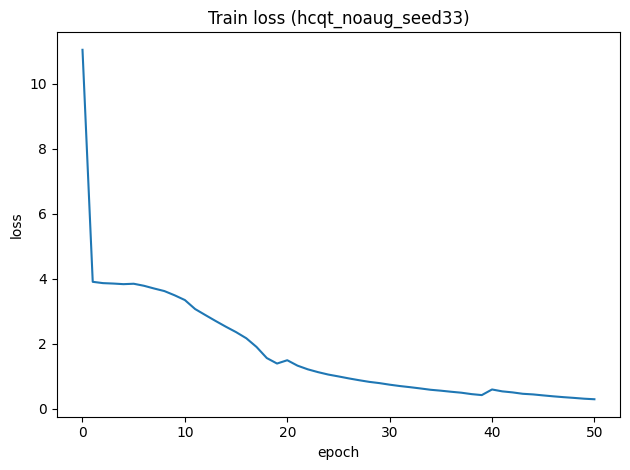

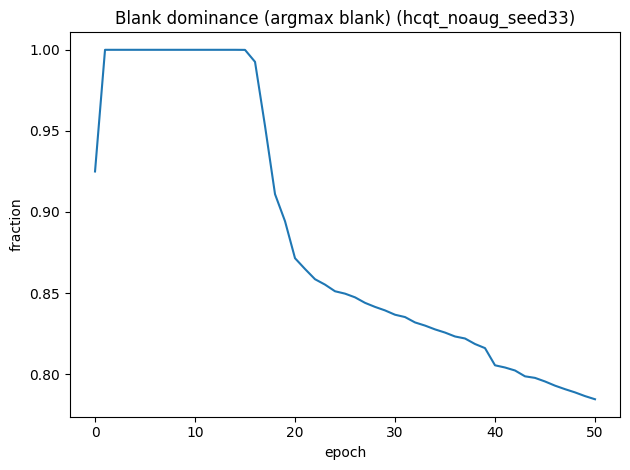

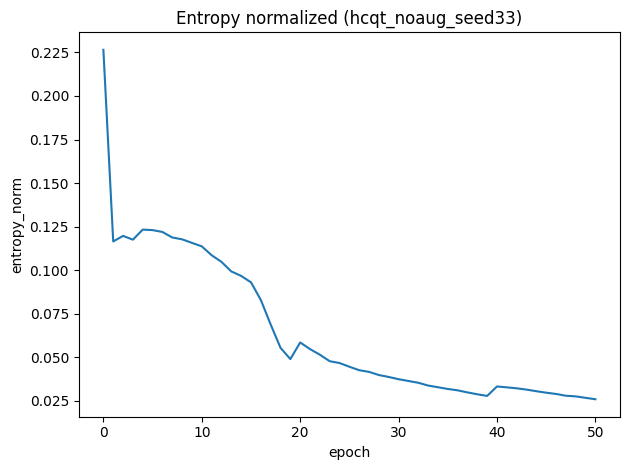


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.2657
Val F1:     0.8064
Val TER:    0.3585
Len Ratio:  0.819

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.3%
  Mean P(blank):          0.780
  Mean non-blank prob:    0.220
  Unique tokens (argmax): 48
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0851
  LSTM:           0.0078
  Classifier:     0.0124

PREDICTION CONFIDENCE:
  Entropy (norm): 0.025


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.2475
Val F1:     0.8313
Val TER:    0.3639
Len Ratio:  0.929

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.2%
  Mean P(blank):          0.780
  Mean non-blank prob:    0.220
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0734
  LSTM:           0.0127
  Classifier:     0.0157

PREDICTION CONFIDENCE:
  Entropy (norm): 0.024


EPOCH 053 - Detailed Analysis
Curriculum: Phase 3

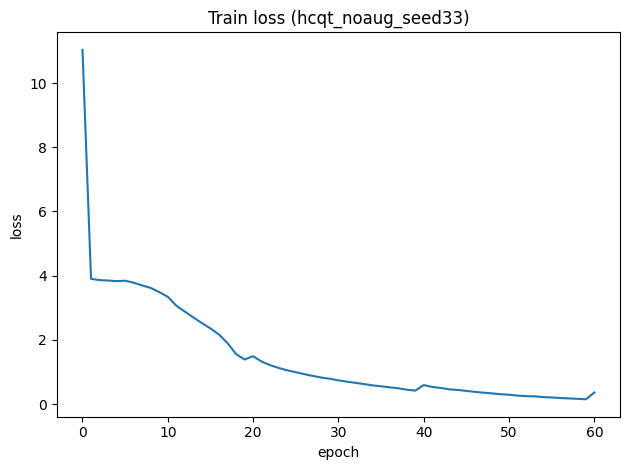

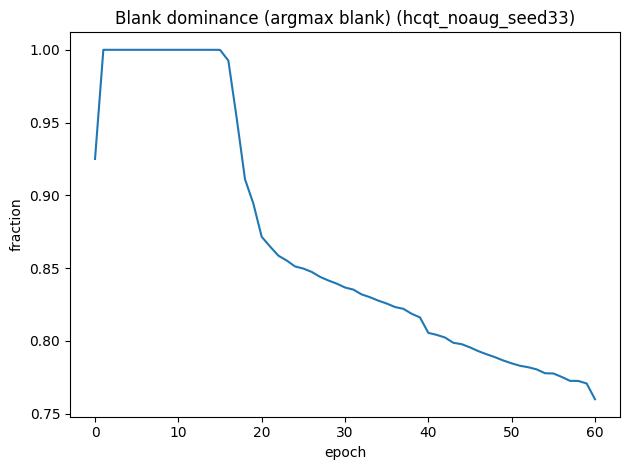

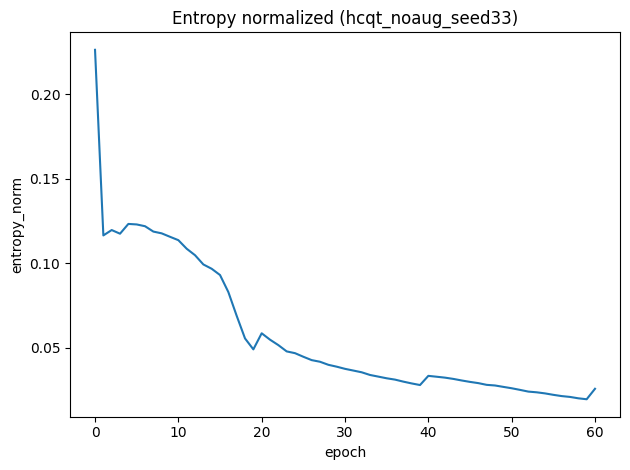


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3056
Val F1:     0.8265
Val TER:    0.3648
Len Ratio:  0.906

BLANK DIAGNOSTICS:
  Frames blank (argmax):  75.7%
  Mean P(blank):          0.755
  Mean non-blank prob:    0.245
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0387
  LSTM:           0.0121
  Classifier:     0.0122

PREDICTION CONFIDENCE:
  Entropy (norm): 0.026


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.2656
Val F1:     0.8181
Val TER:    0.3576
Len Ratio:  0.881

BLANK DIAGNOSTICS:
  Frames blank (argmax):  75.8%
  Mean P(blank):          0.756
  Mean non-blank prob:    0.244
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0728
  LSTM:           0.0078
  Classifier:     0.0125

PREDICTION CONFIDENCE:
  Entropy (norm): 0.025


EPOCH 063 - Detailed Analys

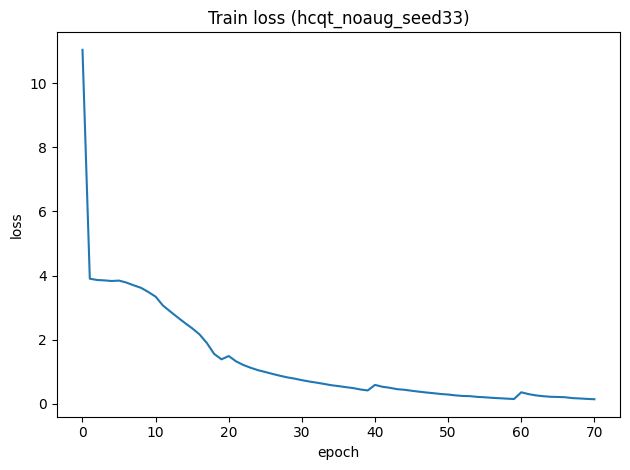

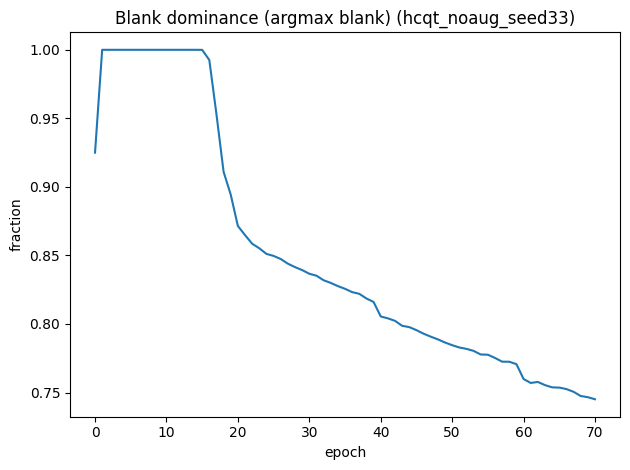

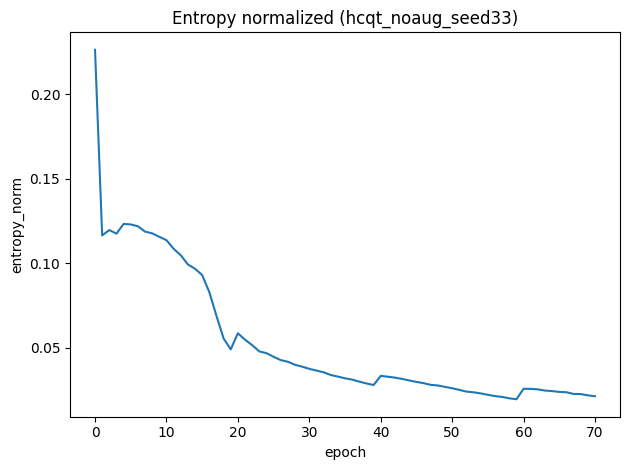


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1427
Val F1:     0.8260
Val TER:    0.3630
Len Ratio:  0.894

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.5%
  Mean P(blank):          0.744
  Mean non-blank prob:    0.256
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     0.1992
  CNN:            0.0083
  LSTM:           0.0019
  Classifier:     0.0021

PREDICTION CONFIDENCE:
  Entropy (norm): 0.021


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1290
Val F1:     0.8274
Val TER:    0.3674
Len Ratio:  0.920

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.3%
  Mean P(blank):          0.742
  Mean non-blank prob:    0.258
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0749
  LSTM:           0.0088
  Classifier:     0.0088

PREDICTION CONFIDENCE:
  Entropy (norm): 0.020


EPOCH 073 - Detailed Analys

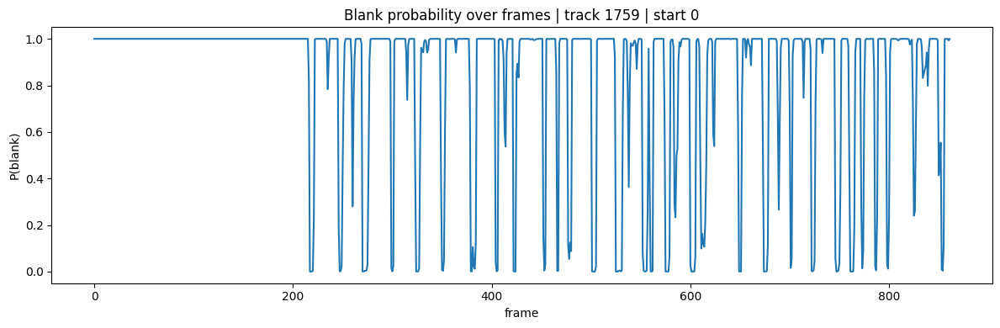

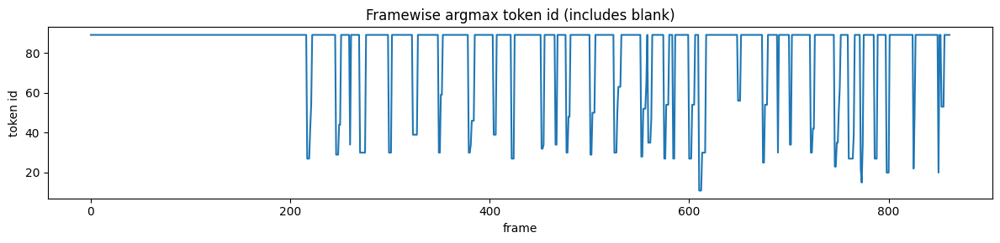

Target len: 95 | Pred len: 60
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [27, 42, 54, 29, 44, 34, 30, 30, 39, 30, 59, 30, 34, 46, 39, 27, 32, 34, 34, 30, 48, 29, 50, 30, 51, 63, 28, 52, 64, 35, 47, 27, 54, 27, 27, 54, 11, 30, 56, 25]

##########################################################################################
CV run: feature=hcqt, augment=False, seed=44
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       11.7308
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.0%
  Mean P(blank):          0.790
  Mean non-blank prob:    0.210
  Unique tokens (argmax): 4
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:    

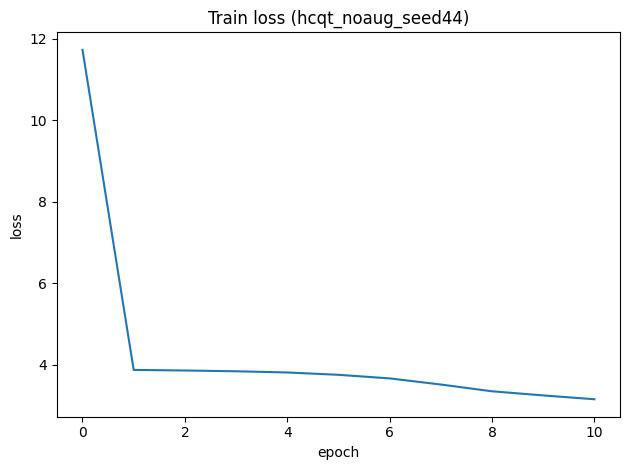

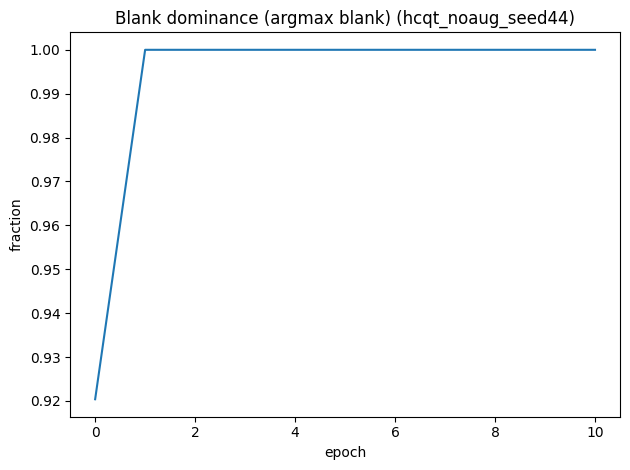

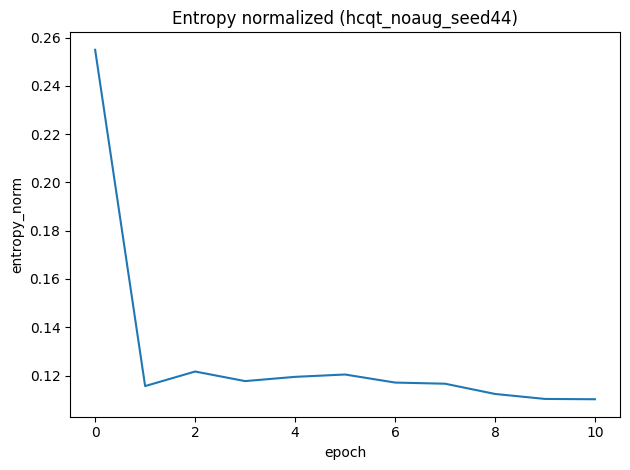


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       2.9909
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.922
  Mean non-blank prob:    0.078
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0147
  LSTM:           0.0088
  Classifier:     0.0814

PREDICTION CONFIDENCE:
  Entropy (norm): 0.106


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       2.8360
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.919
  Mean non-blank prob:    0.081
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0357
  LSTM:           0.0087
  Classifier:     0.0848

PREDICTION CONFIDENCE:
  Entropy (norm): 0.105


EPOCH 013 - Detailed Analysis
Cur

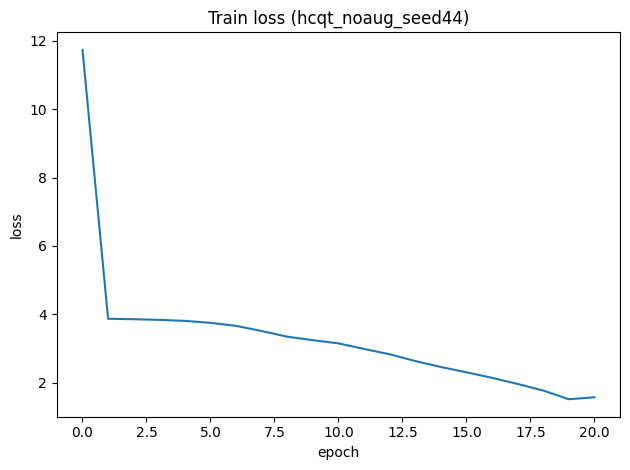

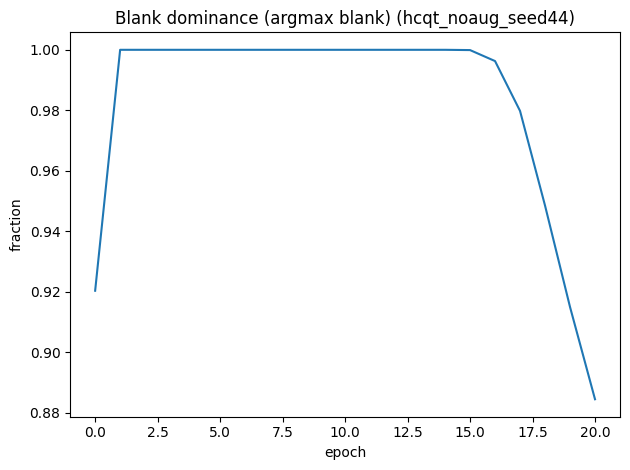

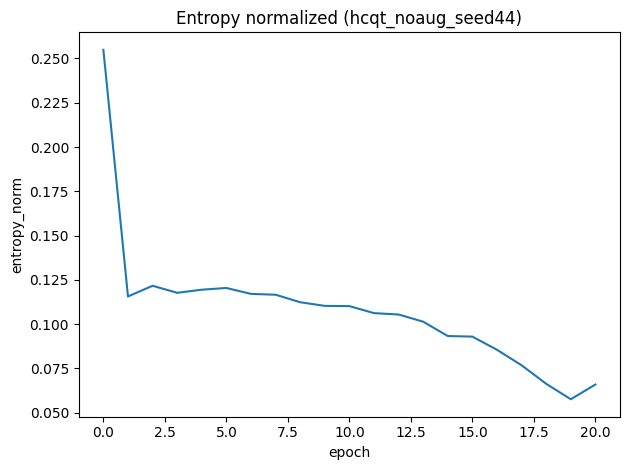


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.3671
Val F1:     0.7022
Val TER:    0.4568
Len Ratio:  0.633

BLANK DIAGNOSTICS:
  Frames blank (argmax):  87.3%
  Mean P(blank):          0.858
  Mean non-blank prob:    0.142
  Unique tokens (argmax): 40
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0244
  LSTM:           0.0095
  Classifier:     0.0127

PREDICTION CONFIDENCE:
  Entropy (norm): 0.059


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.2438
Val F1:     0.7369
Val TER:    0.4154
Len Ratio:  0.687

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.4%
  Mean P(blank):          0.851
  Mean non-blank prob:    0.149
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0666
  LSTM:           0.0133
  Classifier:     0.0270

PREDICTION CONFIDENCE:
  Entropy (norm): 0.054


EPOCH

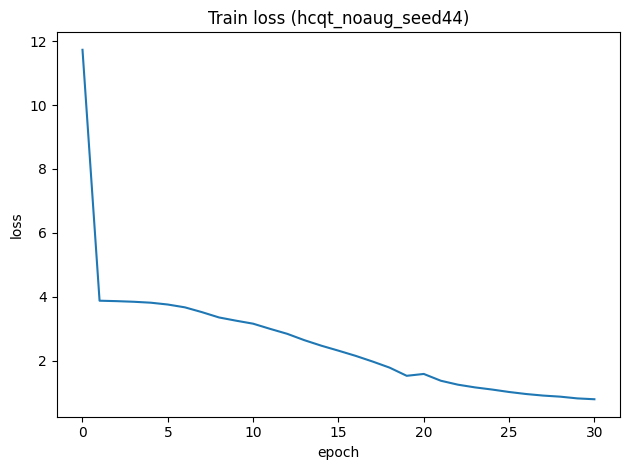

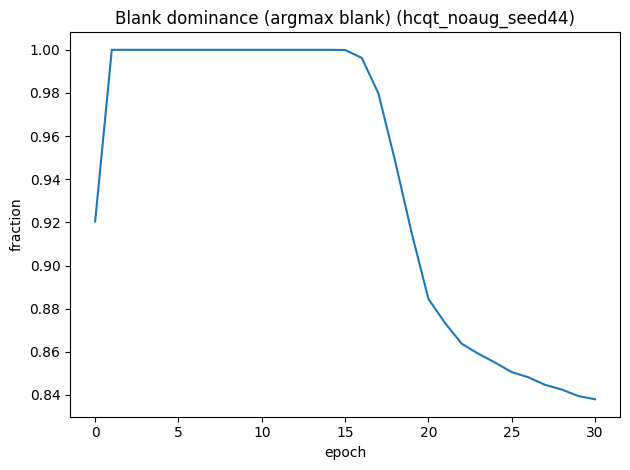

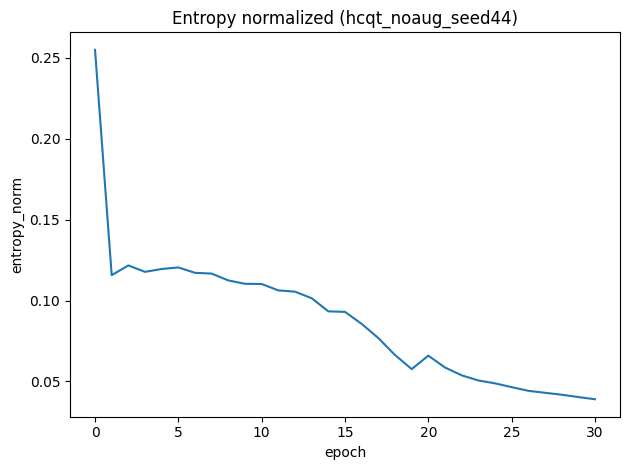


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.7385
Val F1:     0.7886
Val TER:    0.3674
Len Ratio:  0.790

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.5%
  Mean P(blank):          0.830
  Mean non-blank prob:    0.170
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0725
  LSTM:           0.0134
  Classifier:     0.0260

PREDICTION CONFIDENCE:
  Entropy (norm): 0.038


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.7020
Val F1:     0.7950
Val TER:    0.3734
Len Ratio:  0.853

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.5%
  Mean P(blank):          0.830
  Mean non-blank prob:    0.170
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0869
  LSTM:           0.0087
  Classifier:     0.0230

PREDICTION CONFIDENCE:
  Entropy (norm): 0.036


EPOCH

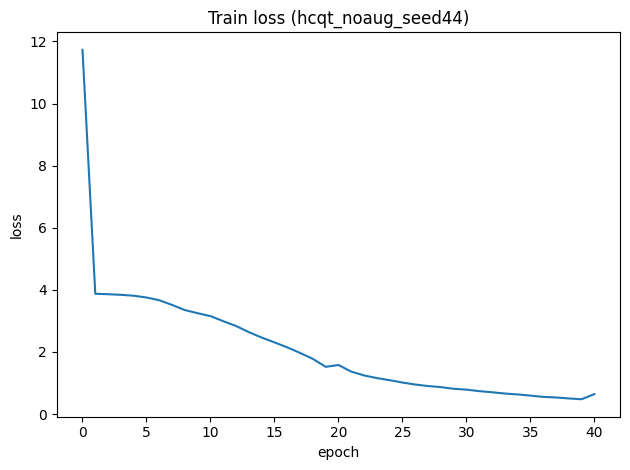

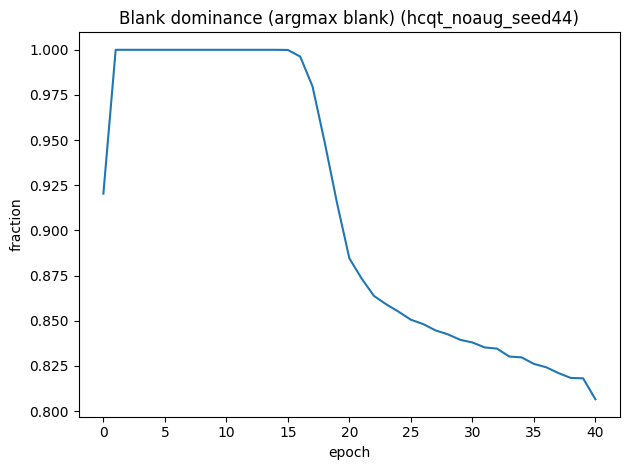

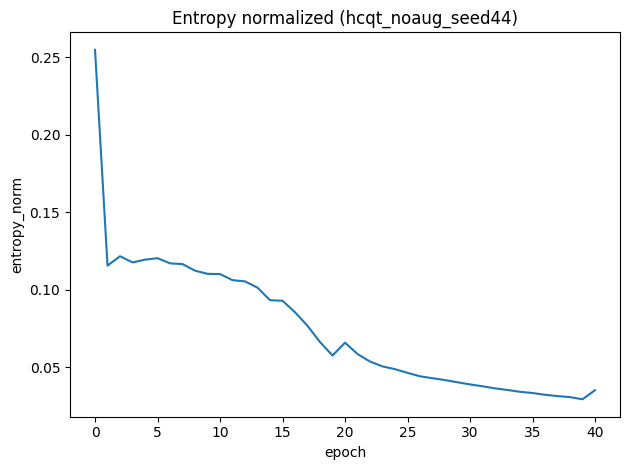


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.6081
Val F1:     0.7919
Val TER:    0.3602
Len Ratio:  0.793

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.5%
  Mean P(blank):          0.800
  Mean non-blank prob:    0.200
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0438
  LSTM:           0.0121
  Classifier:     0.0136

PREDICTION CONFIDENCE:
  Entropy (norm): 0.035


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5536
Val F1:     0.8091
Val TER:    0.3649
Len Ratio:  0.859

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.3%
  Mean P(blank):          0.798
  Mean non-blank prob:    0.202
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0321
  LSTM:           0.0107
  Classifier:     0.0107

PREDICTION CONFIDENCE:
  Entropy (norm): 0.034


EPOCH 043

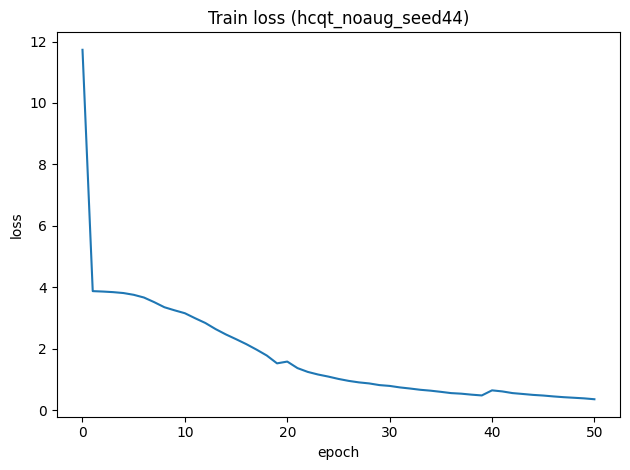

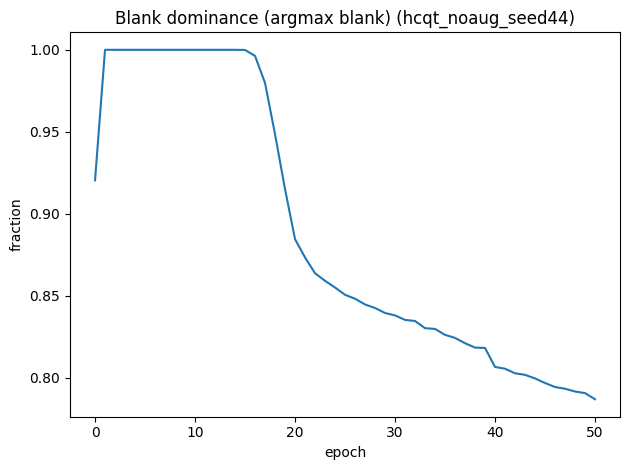

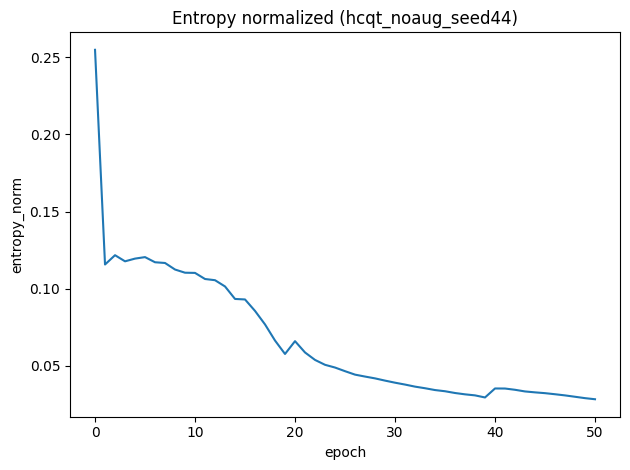


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.3422
Val F1:     0.7905
Val TER:    0.3812
Len Ratio:  0.852

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.7%
  Mean P(blank):          0.784
  Mean non-blank prob:    0.216
  Unique tokens (argmax): 48
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0474
  LSTM:           0.0164
  Classifier:     0.0139

PREDICTION CONFIDENCE:
  Entropy (norm): 0.027


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.3191
Val F1:     0.8021
Val TER:    0.3696
Len Ratio:  0.845

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.5%
  Mean P(blank):          0.782
  Mean non-blank prob:    0.218
  Unique tokens (argmax): 48
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0766
  LSTM:           0.0145
  Classifier:     0.0129

PREDICTION CONFIDENCE:
  Entropy (norm): 0.027


EPOCH 053 - Detailed Analysis
Curriculum: Phase 3

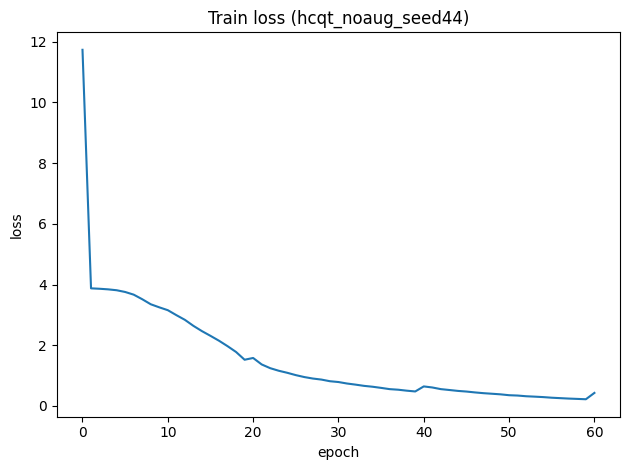

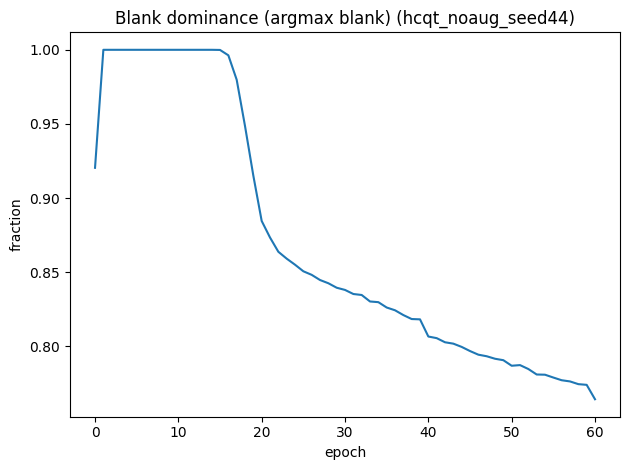

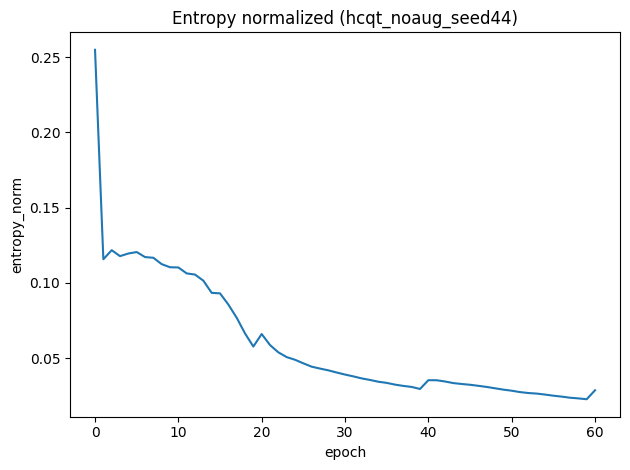


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3726
Val F1:     0.8101
Val TER:    0.3669
Len Ratio:  0.865

BLANK DIAGNOSTICS:
  Frames blank (argmax):  76.4%
  Mean P(blank):          0.761
  Mean non-blank prob:    0.239
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0422
  LSTM:           0.0142
  Classifier:     0.0106

PREDICTION CONFIDENCE:
  Entropy (norm): 0.029


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3393
Val F1:     0.7997
Val TER:    0.3731
Len Ratio:  0.840

BLANK DIAGNOSTICS:
  Frames blank (argmax):  76.0%
  Mean P(blank):          0.757
  Mean non-blank prob:    0.243
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0723
  LSTM:           0.0154
  Classifier:     0.0102

PREDICTION CONFIDENCE:
  Entropy (norm): 0.029


EPOCH 063 - Detailed Analys

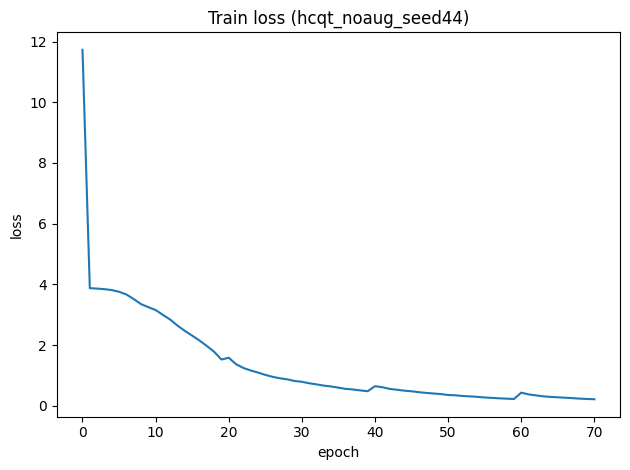

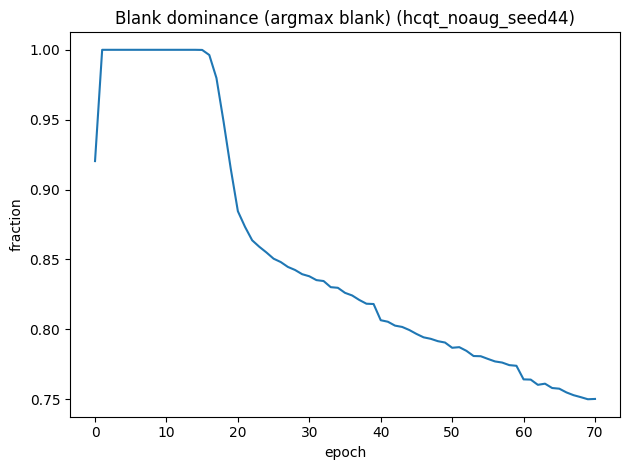

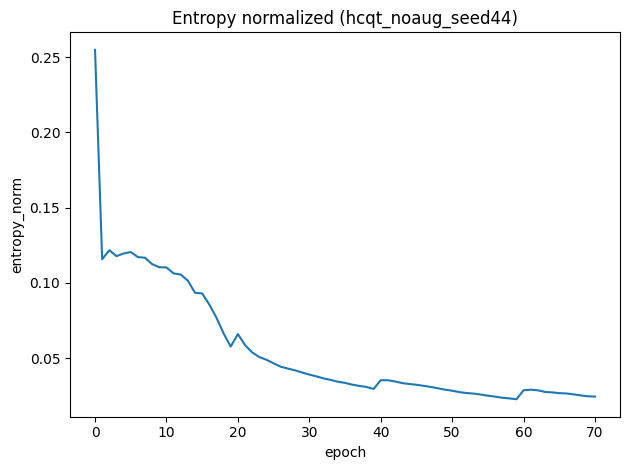


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1925
Val F1:     0.7931
Val TER:    0.3780
Len Ratio:  0.837

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.8%
  Mean P(blank):          0.746
  Mean non-blank prob:    0.254
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1097
  LSTM:           0.0083
  Classifier:     0.0107

PREDICTION CONFIDENCE:
  Entropy (norm): 0.023


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1916
Val F1:     0.7991
Val TER:    0.3797
Len Ratio:  0.878

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.6%
  Mean P(blank):          0.745
  Mean non-blank prob:    0.255
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1012
  LSTM:           0.0073
  Classifier:     0.0102

PREDICTION CONFIDENCE:
  Entropy (norm): 0.023


EPOCH 073 - Detailed Analys

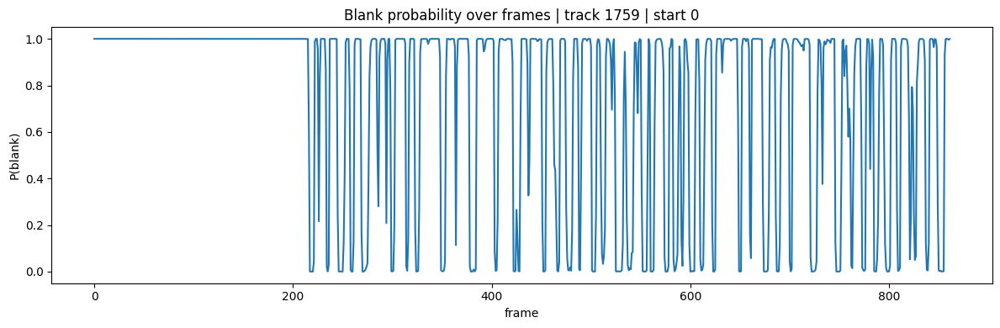

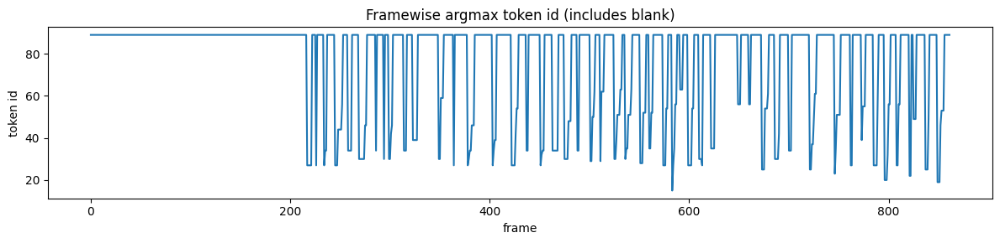

Target len: 95 | Pred len: 99
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [27, 27, 27, 34, 27, 44, 56, 34, 30, 46, 34, 30, 30, 42, 46, 34, 39, 30, 59, 27, 27, 30, 34, 46, 27, 34, 39, 27, 42, 54, 34, 27, 32, 34, 34, 30, 48, 34, 29, 50]

##########################################################################################
CV run: feature=hcqt, augment=False, seed=55
##########################################################################################

EPOCH 000 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       9.7499
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  92.0%
  Mean P(blank):          0.802
  Mean non-blank prob:    0.198
  Unique tokens (argmax): 3
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:     

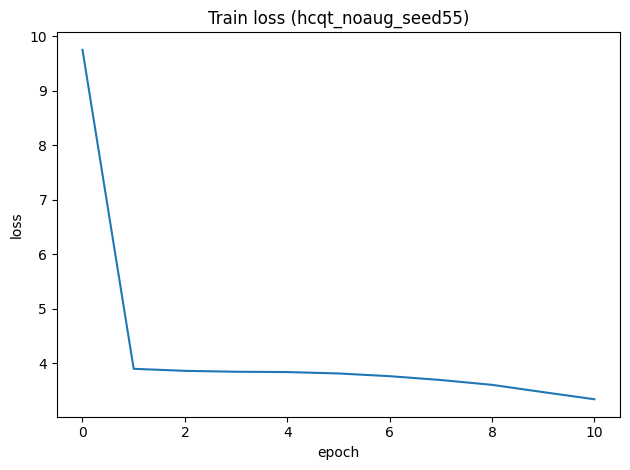

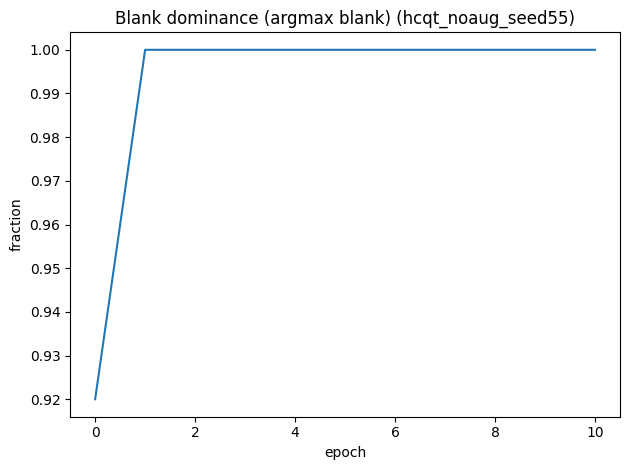

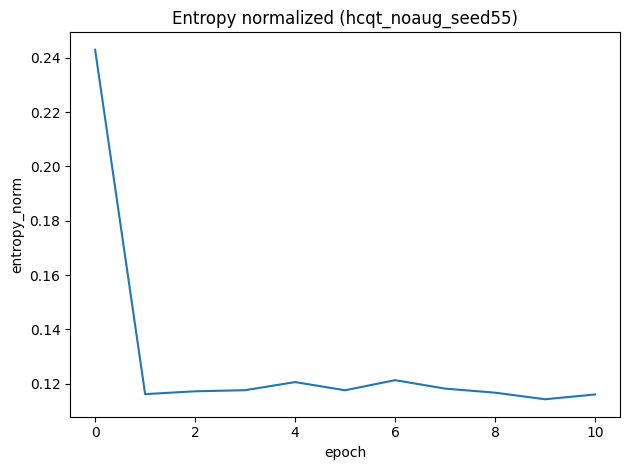


EPOCH 011 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       3.1074
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.922
  Mean non-blank prob:    0.078
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0188
  LSTM:           0.0071
  Classifier:     0.0846

PREDICTION CONFIDENCE:
  Entropy (norm): 0.109


EPOCH 012 - Detailed Analysis
Curriculum: Phase 1: Easy segments only
Loss:       2.8944
Val F1:     0.0000
Val TER:    1.0000
Len Ratio:  0.000

BLANK DIAGNOSTICS:
  Frames blank (argmax):  100.0%
  Mean P(blank):          0.923
  Mean non-blank prob:    0.077
  Unique tokens (argmax): 0
  Status: BLANK COLLAPSE

GRADIENT HEALTH:
  Total norm:     0.9773
  CNN:            0.0257
  LSTM:           0.0094
  Classifier:     0.0765

PREDICTION CONFIDENCE:
  Entropy (norm): 0.104


EPOCH 013 - Detailed Analysis
Cur

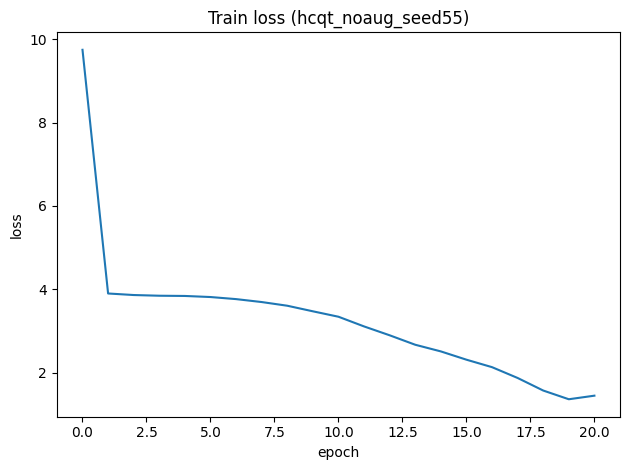

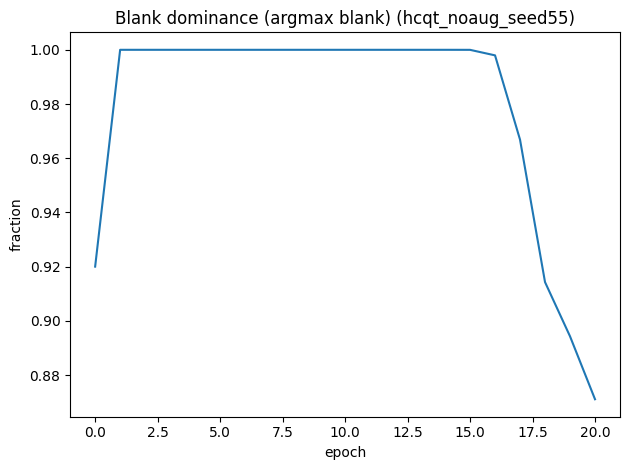

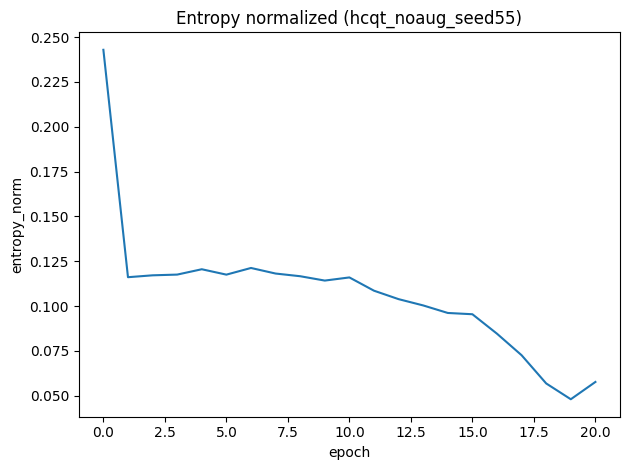


EPOCH 021 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.3042
Val F1:     0.7355
Val TER:    0.4155
Len Ratio:  0.701

BLANK DIAGNOSTICS:
  Frames blank (argmax):  86.4%
  Mean P(blank):          0.853
  Mean non-blank prob:    0.147
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0485
  LSTM:           0.0123
  Classifier:     0.0311

PREDICTION CONFIDENCE:
  Entropy (norm): 0.054


EPOCH 022 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       1.1859
Val F1:     0.7212
Val TER:    0.4232
Len Ratio:  0.659

BLANK DIAGNOSTICS:
  Frames blank (argmax):  85.9%
  Mean P(blank):          0.850
  Mean non-blank prob:    0.150
  Unique tokens (argmax): 41
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0586
  LSTM:           0.0131
  Classifier:     0.0286

PREDICTION CONFIDENCE:
  Entropy (norm): 0.051


EPOCH

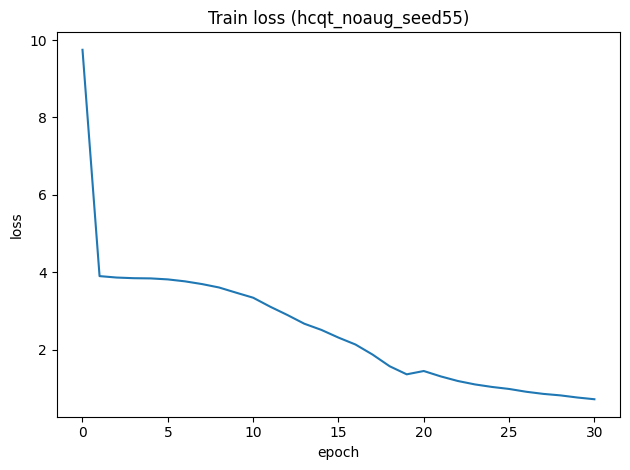

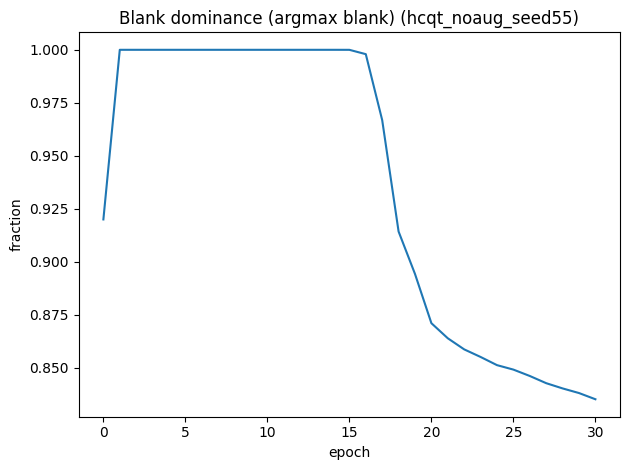

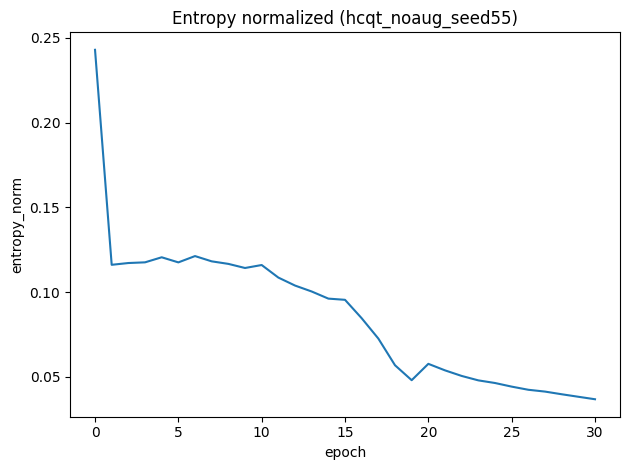


EPOCH 031 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.6652
Val F1:     0.7789
Val TER:    0.3769
Len Ratio:  0.803

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.4%
  Mean P(blank):          0.829
  Mean non-blank prob:    0.171
  Unique tokens (argmax): 45
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0470
  LSTM:           0.0088
  Classifier:     0.0167

PREDICTION CONFIDENCE:
  Entropy (norm): 0.036


EPOCH 032 - Detailed Analysis
Curriculum: Phase 2: Add medium segments
Loss:       0.6250
Val F1:     0.7920
Val TER:    0.3651
Len Ratio:  0.780

BLANK DIAGNOSTICS:
  Frames blank (argmax):  83.0%
  Mean P(blank):          0.826
  Mean non-blank prob:    0.174
  Unique tokens (argmax): 46
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0945
  LSTM:           0.0094
  Classifier:     0.0207

PREDICTION CONFIDENCE:
  Entropy (norm): 0.035


EPOCH

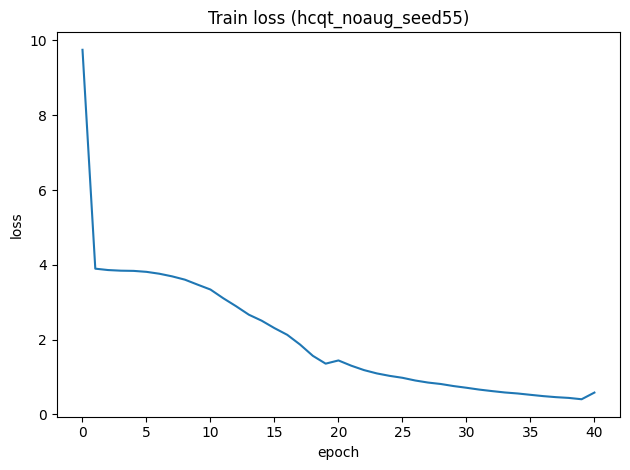

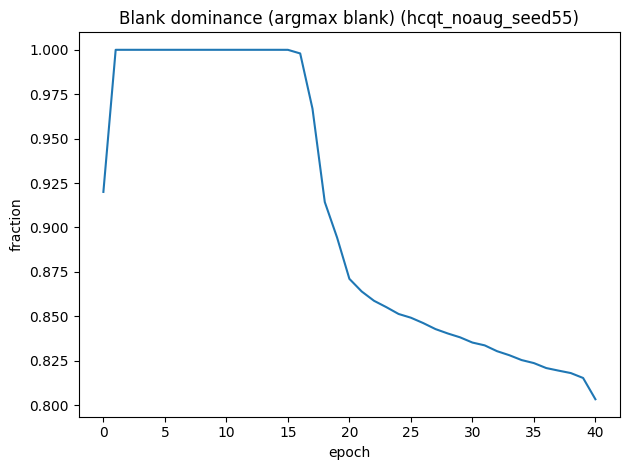

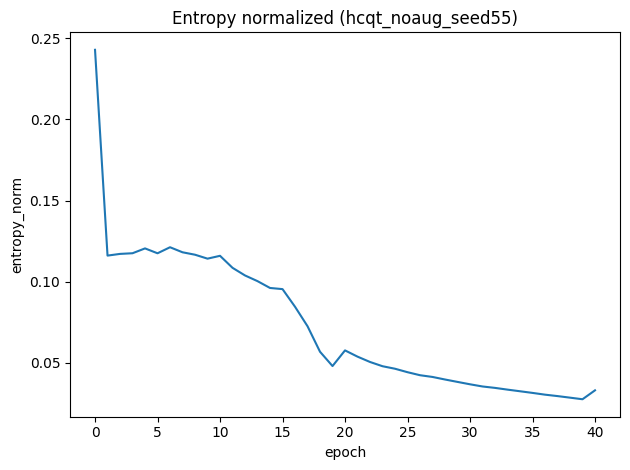


EPOCH 041 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.5296
Val F1:     0.8086
Val TER:    0.3685
Len Ratio:  0.886

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.3%
  Mean P(blank):          0.798
  Mean non-blank prob:    0.202
  Unique tokens (argmax): 47
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0490
  LSTM:           0.0148
  Classifier:     0.0182

PREDICTION CONFIDENCE:
  Entropy (norm): 0.033


EPOCH 042 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.4848
Val F1:     0.8087
Val TER:    0.3602
Len Ratio:  0.841

BLANK DIAGNOSTICS:
  Frames blank (argmax):  80.1%
  Mean P(blank):          0.797
  Mean non-blank prob:    0.203
  Unique tokens (argmax): 48
  Status: PARTIAL COLLAPSE / RECOVERY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0428
  LSTM:           0.0115
  Classifier:     0.0129

PREDICTION CONFIDENCE:
  Entropy (norm): 0.032


EPOCH 043

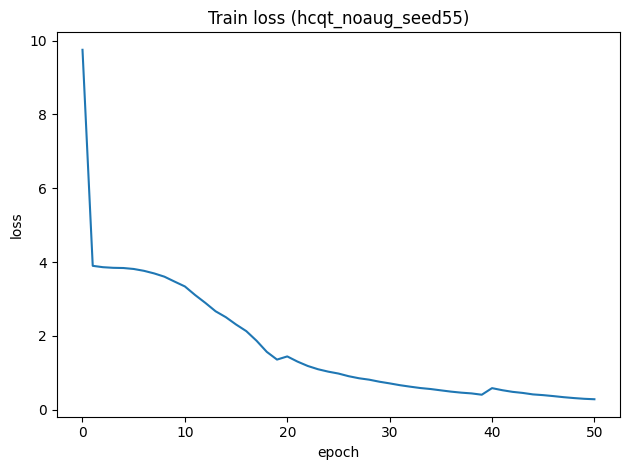

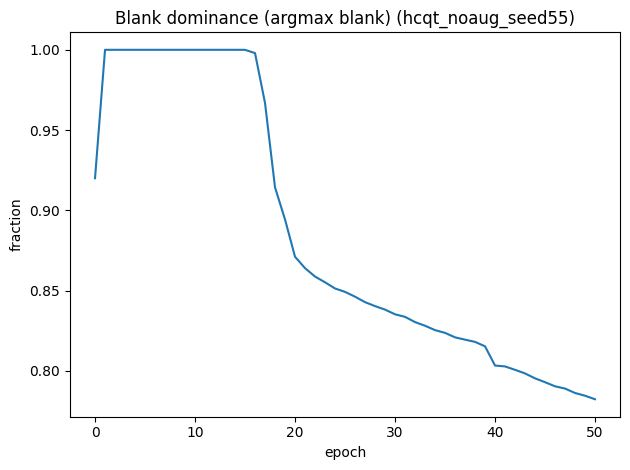

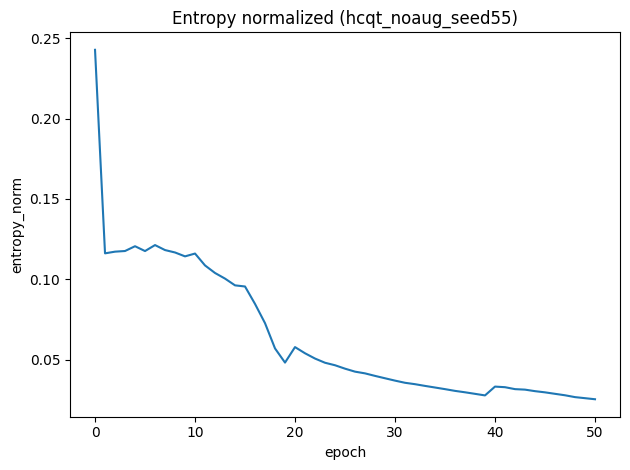


EPOCH 051 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.2647
Val F1:     0.7965
Val TER:    0.3607
Len Ratio:  0.792

BLANK DIAGNOSTICS:
  Frames blank (argmax):  78.1%
  Mean P(blank):          0.779
  Mean non-blank prob:    0.221
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0339
  LSTM:           0.0074
  Classifier:     0.0105

PREDICTION CONFIDENCE:
  Entropy (norm): 0.025


EPOCH 052 - Detailed Analysis
Curriculum: Phase 3: Add hard segments
Loss:       0.2442
Val F1:     0.8121
Val TER:    0.3633
Len Ratio:  0.869

BLANK DIAGNOSTICS:
  Frames blank (argmax):  77.8%
  Mean P(blank):          0.776
  Mean non-blank prob:    0.224
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0790
  LSTM:           0.0115
  Classifier:     0.0149

PREDICTION CONFIDENCE:
  Entropy (norm): 0.024


EPOCH 053 - Detailed Analysis
Curriculum: Phase 3

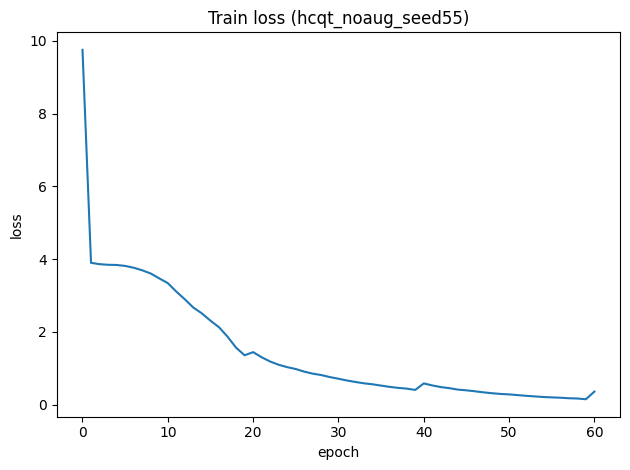

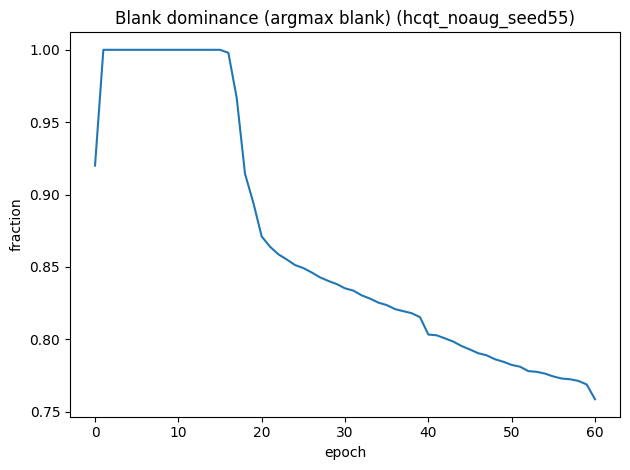

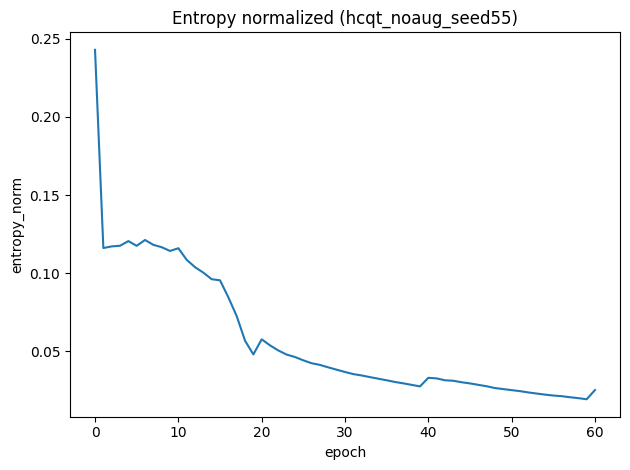


EPOCH 061 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.3073
Val F1:     0.8152
Val TER:    0.3958
Len Ratio:  0.961

BLANK DIAGNOSTICS:
  Frames blank (argmax):  75.8%
  Mean P(blank):          0.756
  Mean non-blank prob:    0.244
  Unique tokens (argmax): 49
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.1088
  LSTM:           0.0106
  Classifier:     0.0166

PREDICTION CONFIDENCE:
  Entropy (norm): 0.025


EPOCH 062 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.2774
Val F1:     0.8092
Val TER:    0.3686
Len Ratio:  0.838

BLANK DIAGNOSTICS:
  Frames blank (argmax):  75.5%
  Mean P(blank):          0.753
  Mean non-blank prob:    0.247
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0629
  LSTM:           0.0116
  Classifier:     0.0112

PREDICTION CONFIDENCE:
  Entropy (norm): 0.025


EPOCH 063 - Detailed Analys

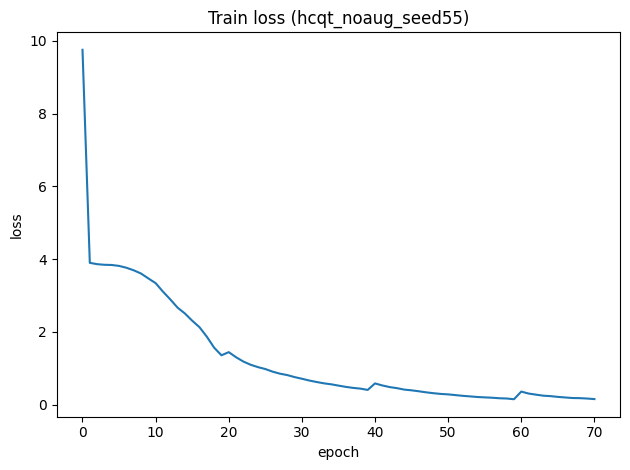

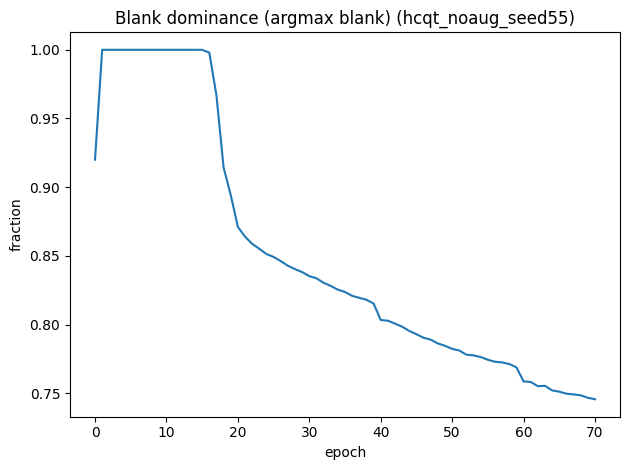

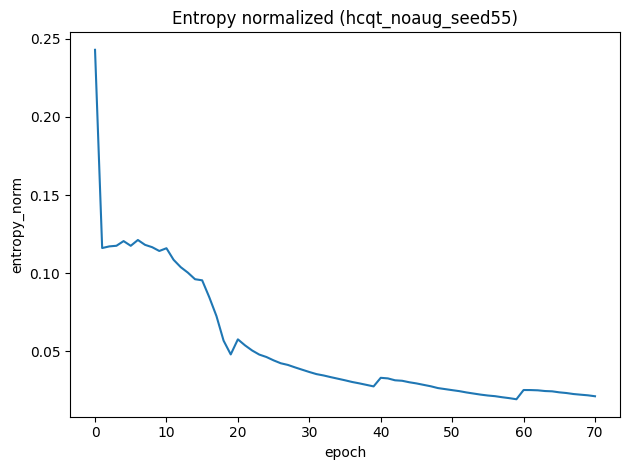


EPOCH 071 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1366
Val F1:     0.8247
Val TER:    0.3750
Len Ratio:  0.935

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.6%
  Mean P(blank):          0.745
  Mean non-blank prob:    0.255
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     0.9249
  CNN:            0.0871
  LSTM:           0.0064
  Classifier:     0.0087

PREDICTION CONFIDENCE:
  Entropy (norm): 0.021


EPOCH 072 - Detailed Analysis
Curriculum: Phase 4: All data including very hard
Loss:       0.1326
Val F1:     0.8161
Val TER:    0.3643
Len Ratio:  0.862

BLANK DIAGNOSTICS:
  Frames blank (argmax):  74.3%
  Mean P(blank):          0.741
  Mean non-blank prob:    0.259
  Unique tokens (argmax): 50
  Status: HEALTHY

GRADIENT HEALTH:
  Total norm:     1.0000
  CNN:            0.0681
  LSTM:           0.0054
  Classifier:     0.0074

PREDICTION CONFIDENCE:
  Entropy (norm): 0.020


EPOCH 073 - Detailed Analys

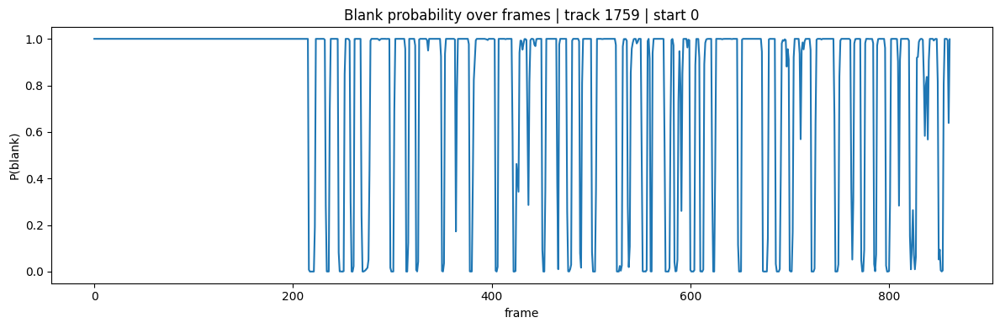

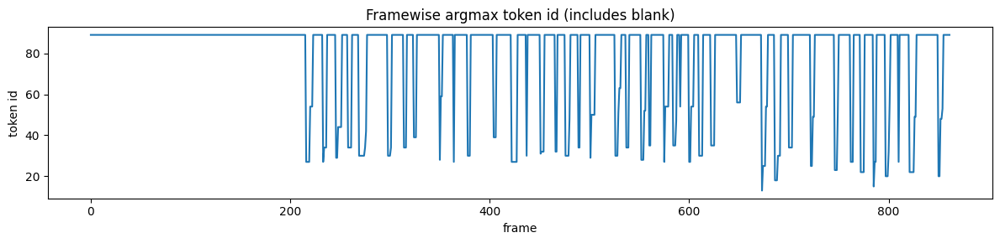

Target len: 95 | Pred len: 70
Target (first 40): [27, 42, 54, 34, 29, 44, 56, 34, 30, 46, 58, 34, 30, 46, 58, 34, 39, 34, 29, 47, 59, 34, 30, 46, 58, 34, 39, 34, 27, 42, 54, 34, 32, 46, 58, 34, 30, 48, 60, 34]
Pred   (first 40): [27, 54, 27, 34, 29, 44, 34, 30, 34, 42, 30, 34, 34, 39, 28, 59, 27, 30, 34, 39, 27, 30, 31, 32, 32, 30, 48, 34, 29, 50, 30, 51, 63, 34, 28, 52, 35, 27, 54, 35]


,run_name,feature,augment,seed,best_epoch,best_val_f1_primary,test_best_key,test_F1,test_TER,run_dir
0,hcqt_noaug_seed11,hcqt,False,11,79,0.825899,greedy_alpha0.05,0.721366,0.664193,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
1,hcqt_noaug_seed22,hcqt,False,22,67,0.836133,greedy_alpha0.05,0.727236,0.630186,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
2,hcqt_noaug_seed33,hcqt,False,33,74,0.836994,greedy_alpha0.05,0.715007,0.696886,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
3,hcqt_noaug_seed44,hcqt,False,44,60,0.816902,greedy_alpha0.05,0.684144,0.799689,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
4,hcqt_noaug_seed55,hcqt,False,55,75,0.825586,greedy_alpha0.05,0.724785,0.638066,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...


Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/seed_runs_summary.csv


,config,F1_mean,F1_std,F1_ci_low,F1_ci_high,TER_mean,TER_std,TER_ci_low,TER_ci_high
0,hcqt_noaug,0.714507,0.017585,0.692677,0.736338,0.685804,0.068797,0.600395,0.771213


Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/aggregate_test_metrics.csv
Best epoch stats: {'best_epoch_mean': 71.0, 'best_epoch_std': 7.516648189186454, 'best_epoch_min': 60, 'best_epoch_max': 79}
Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/best_epoch_stats.json


In [21]:
# BLOCK 14
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json
import math

assert "train_one_experiment" in globals(), "train_one_experiment not found. Run earlier blocks defining training."
assert "TrainConfig" in globals(), "TrainConfig not found."
assert "OUT_ROOT" in globals(), "OUT_ROOT not found."
assert "FIG_DIR" in globals(), "FIG_DIR not found."

# Fixed best configuration
BEST_FEATURE = "hcqt"
BEST_AUGMENT = False

# Output folder for CV analysis
CV_OUT = OUT_ROOT / "cv_hcqt_noaug_5seeds"
CV_OUT.mkdir(parents=True, exist_ok=True)
(CV_OUT / "figs").mkdir(parents=True, exist_ok=True)

try:
    cfg_train = CFG_TRAIN
except NameError:
    cfg_train = TrainConfig(
        epochs=80,
        batch_size=8,
        lr=1e-3,
        weight_decay=1e-4,
        grad_clip=1.0,
        amp=True,
        decode_blank_alphas=(0.0, 0.05, 0.10, 0.15),
    )

# Seeds
SEEDS_5 = [11, 22, 33, 44, 55]

# Helper: mean/std/95% CI (t for n=5)
def mean_std_ci(x):
    x = np.asarray(x, dtype=np.float64)
    n = len(x)
    mu = float(np.mean(x))
    sd = float(np.std(x, ddof=1)) if n > 1 else 0.0
    se = sd / max(1, math.sqrt(n))
    tcrit = 2.776 if n == 5 else 1.96
    return {
        "mean": mu,
        "std": sd,
        "ci_low": mu - tcrit * se,
        "ci_high": mu + tcrit * se
    }

# Run the 5 seeds
cv_rows = []
for s in SEEDS_5:
    print("\n" + "#"*90)
    print(f"CV run: feature={BEST_FEATURE}, augment={BEST_AUGMENT}, seed={s}")
    print("#"*90)
    out = train_one_experiment(BEST_FEATURE, BEST_AUGMENT, seed=s, cfg=cfg_train)
    cv_rows.append(out)

cv_df = pd.DataFrame(cv_rows)
display(cv_df)

# Save per-seed summary
cv_df.to_csv(CV_OUT / "seed_runs_summary.csv", index=False)
print("Saved:", CV_OUT / "seed_runs_summary.csv")

# Aggregate metrics across seeds (test F1/TER)
F1s  = cv_df["test_F1"].astype(float).tolist()
TERs = cv_df["test_TER"].astype(float).tolist()

agg = {
    "config": f"{BEST_FEATURE}_{'aug' if BEST_AUGMENT else 'noaug'}",
    **{f"F1_{k}": v for k, v in mean_std_ci(F1s).items()},
    **{f"TER_{k}": v for k, v in mean_std_ci(TERs).items()},
}

agg_df = pd.DataFrame([agg])
display(agg_df)

agg_df.to_csv(CV_OUT / "aggregate_test_metrics.csv", index=False)
print("Saved:", CV_OUT / "aggregate_test_metrics.csv")


# Best_epoch distribution
best_epochs = cv_df["best_epoch"].astype(int).tolist()
best_epoch_stats = {
    "best_epoch_mean": float(np.mean(best_epochs)),
    "best_epoch_std": float(np.std(best_epochs, ddof=1)) if len(best_epochs) > 1 else 0.0,
    "best_epoch_min": int(np.min(best_epochs)),
    "best_epoch_max": int(np.max(best_epochs)),
}
print("Best epoch stats:", best_epoch_stats)
(Path(CV_OUT / "best_epoch_stats.json")).write_text(json.dumps(best_epoch_stats, indent=2), encoding="utf-8")
print("Saved:", CV_OUT / "best_epoch_stats.json")


### 5 Seed Experiment Table Summary and Analysis

Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/all_histories_concat.csv
Loaded baseline history: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed42/history.csv


,seed,run_name,best_epoch,best_val_f1_primary,test_F1,test_TER,test_best_key,run_dir
0,11,hcqt_noaug_seed11,79,0.825899,0.721366,0.664193,greedy_alpha0.05,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
1,22,hcqt_noaug_seed22,67,0.836133,0.727236,0.630186,greedy_alpha0.05,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
2,33,hcqt_noaug_seed33,74,0.836994,0.715007,0.696886,greedy_alpha0.05,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
3,44,hcqt_noaug_seed44,60,0.816902,0.684144,0.799689,greedy_alpha0.05,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...
4,55,hcqt_noaug_seed55,75,0.825586,0.724785,0.638066,greedy_alpha0.05,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...


Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/seed_level_table.csv


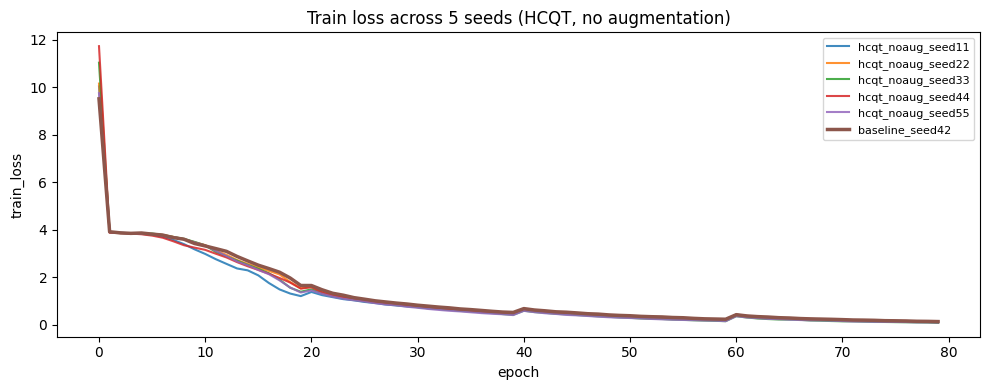

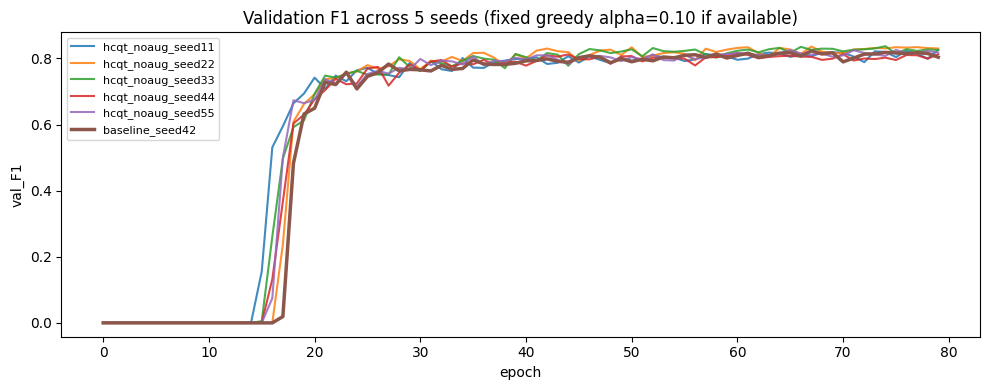

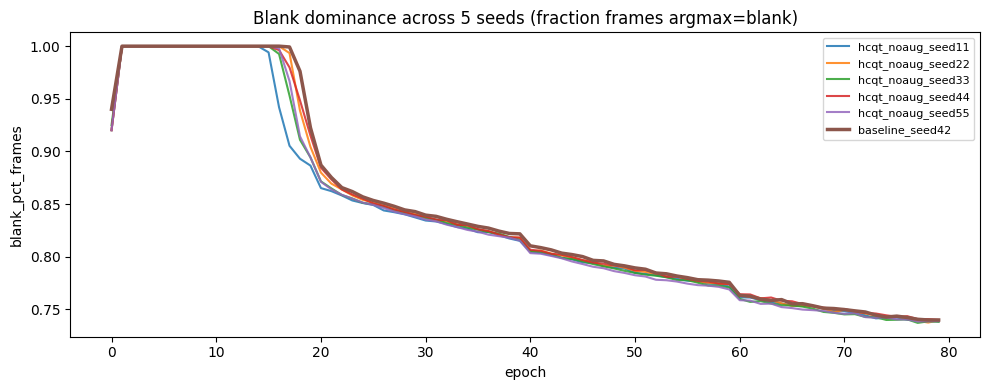

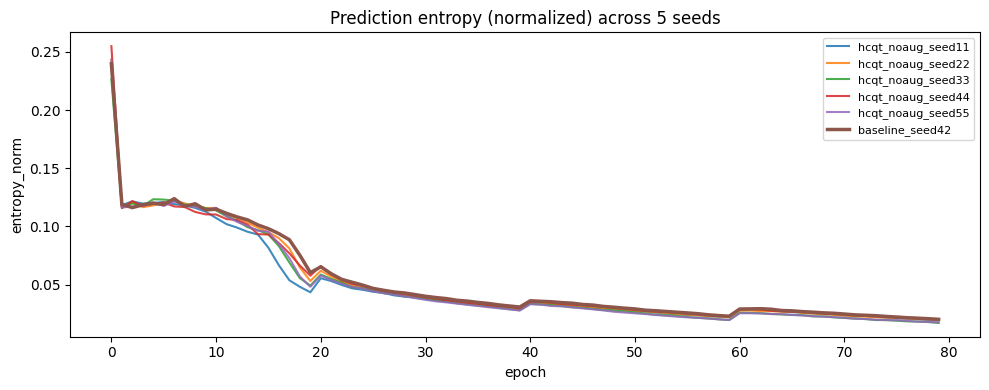

,seed,run_name,final_train_loss,final_blank_pct,final_entropy,final_grad_total,best_epoch_proxy,best_blank_pct,best_entropy,best_grad_total
0,11,hcqt_noaug_seed11,0.111885,0.739132,0.019033,0.999999,79,0.739132,0.019033,0.999999
1,22,hcqt_noaug_seed22,0.120931,0.739508,0.019433,0.999999,67,0.752754,0.025099,1.000000
2,33,hcqt_noaug_seed33,0.079051,0.737956,0.017022,0.802157,74,0.739806,0.019434,0.999999
3,44,hcqt_noaug_seed44,0.136257,0.739928,0.020071,0.999999,60,0.764242,0.028533,1.000000
4,55,hcqt_noaug_seed55,0.091799,0.738633,0.017357,0.449147,75,0.740337,0.019317,1.000000


Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/diagnostics_seed_table.csv


,note,F1_mean,F1_std,P_mean,R_mean,tp_sum,fn_sum,fp_sum
8,29,0.0,0.0,0.0,0.0,0,10,0
9,30,0.0,0.0,0.0,0.0,0,60,0
78,99,0.0,0.0,0.0,0.0,0,0,0
79,100,0.0,0.0,0.0,0.0,0,0,0
72,93,0.0,0.0,0.0,0.0,0,60,1
73,94,0.0,0.0,0.0,0.0,0,110,0
74,95,0.0,0.0,0.0,0.0,0,40,0
75,96,0.0,0.0,0.0,0.0,0,0,0
76,97,0.0,0.0,0.0,0.0,0,0,0
77,98,0.0,0.0,0.0,0.0,0,0,0


,note,F1_mean,F1_std,P_mean,R_mean,tp_sum,fn_sum,fp_sum
50,71,0.815423,0.018439,0.797875,0.846059,2737,498,752
27,48,0.793670,0.021535,0.779771,0.820319,2059,451,630
49,70,0.778401,0.012502,0.694588,0.886457,3240,415,1433
48,69,0.778144,0.019232,0.687026,0.904551,3677,388,1720
44,65,0.774103,0.032384,0.787562,0.762025,4214,1316,1141
37,58,0.773033,0.024646,0.778385,0.772719,4277,1258,1258
52,73,0.772621,0.050398,0.716100,0.851803,2598,452,1111
45,66,0.770999,0.033764,0.753647,0.805723,2534,611,921
53,74,0.763001,0.037097,0.663852,0.903091,4529,486,2360
46,67,0.759811,0.072187,0.688191,0.881438,4535,610,2425


Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/per_pitch_aggregate_5seeds.csv


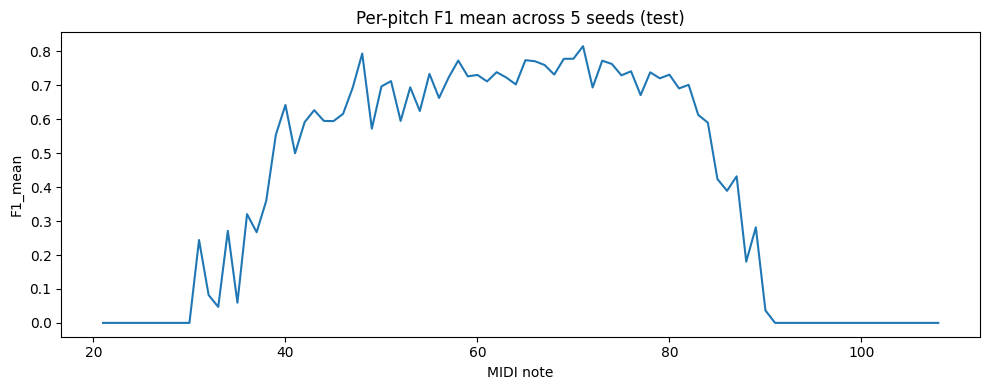

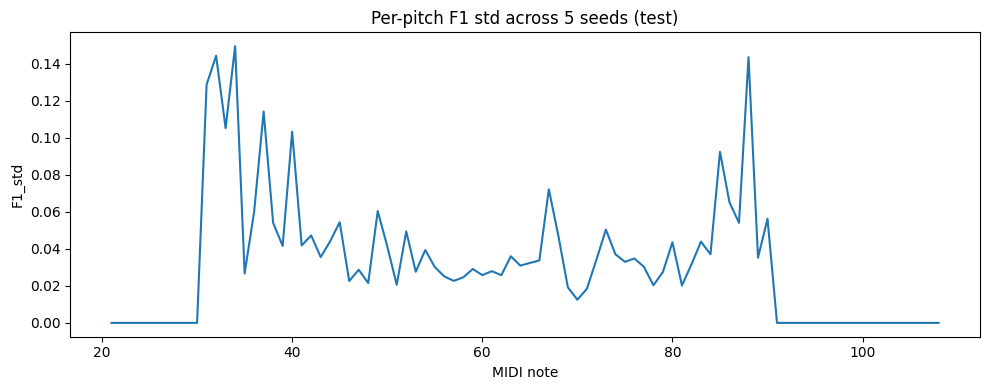

Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/final_report.json


,config,n_seeds,F1_mean,F1_std,F1_ci_low,F1_ci_high,TER_mean,TER_std,TER_ci_low,TER_ci_high
0,hcqt_noaug,5,0.714507,0.017585,0.692677,0.736338,0.685804,0.068797,0.600395,0.771213


Saved: /home/jovyan/shared/s0599003/ctc_runs/cv_hcqt_noaug_5seeds/final_report_table.csv


In [22]:
# BLOCK 15: 5 seed Experiment: Tables + visuals + aggregated per-pitch analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

assert "cv_df" in globals(), "cv_df not found. Run Block 14 first."
assert "OUT_ROOT" in globals(), "OUT_ROOT not found."
assert "CV_OUT" in globals(), "CV_OUT not found."

# -------------------------------------------------------------------
# Helpers
# -------------------------------------------------------------------
def load_history(run_dir: str) -> pd.DataFrame:
    p = Path(run_dir) / "history.csv"
    if not p.exists():
        raise FileNotFoundError(f"Missing history.csv at: {p}")
    return pd.read_csv(p)

def safe_col(df: pd.DataFrame, col: str) -> bool:
    return col in df.columns

# -------------------------------------------------------------------
# Load histories for all 5 seeds
# -------------------------------------------------------------------
histories = {}
for _, r in cv_df.iterrows():
    run_name = r["run_name"]
    run_dir  = r["run_dir"]
    h = load_history(run_dir)
    h["run_name"] = run_name
    h["seed"] = int(r["seed"])
    histories[run_name] = h

all_hist = pd.concat(list(histories.values()), axis=0, ignore_index=True)
all_hist.to_csv(CV_OUT / "all_histories_concat.csv", index=False)
print("Saved:", CV_OUT / "all_histories_concat.csv")

# -------------------------------------------------------------------
# Also load the main best run (seed 42) for reference if it exists
# (from block 13: run_name should be 'hcqt_noaug_seed42')
# -------------------------------------------------------------------
baseline_run_name = "hcqt_noaug_seed42"
baseline_dir = OUT_ROOT / "runs_main_grid" / baseline_run_name
baseline_hist = None
if (baseline_dir / "history.csv").exists():
    baseline_hist = pd.read_csv(baseline_dir / "history.csv")
    baseline_hist["run_name"] = baseline_run_name
    baseline_hist["seed"] = 42
    print("Loaded baseline history:", baseline_dir / "history.csv")
else:
    print("Baseline run not found (optional):", baseline_dir)

# -------------------------------------------------------------------
# 1) Seed-level final table: test metrics + best epoch
# -------------------------------------------------------------------
seed_table = cv_df[["seed", "run_name", "best_epoch", "best_val_f1_primary", "test_F1", "test_TER", "test_best_key", "run_dir"]].copy()
seed_table = seed_table.sort_values("seed")
display(seed_table)

seed_table.to_csv(CV_OUT / "seed_level_table.csv", index=False)
print("Saved:", CV_OUT / "seed_level_table.csv")

# -------------------------------------------------------------------
# 2) Curves: Train loss overlay
# -------------------------------------------------------------------
plt.figure(figsize=(10, 4))
for run_name, h in histories.items():
    h = h.sort_values("epoch")
    plt.plot(h["epoch"], h["train_loss"], label=run_name, alpha=0.85)
if baseline_hist is not None:
    baseline_hist = baseline_hist.sort_values("epoch")
    plt.plot(baseline_hist["epoch"], baseline_hist["train_loss"], label="baseline_seed42", linewidth=2.5)
plt.title("Train loss across 5 seeds (HCQT, no augmentation)")
plt.xlabel("epoch"); plt.ylabel("train_loss")
plt.legend(fontsize=8)
plt.tight_layout()
plt.savefig(CV_OUT / "figs" / "curve_train_loss_5seeds.png", dpi=160)
plt.show()

# -------------------------------------------------------------------
# 3) Curves: Validation F1 (choose a fixed alpha column for comparability)
# We use alpha=0.10 if available; else fallback to best_val_f1.
# -------------------------------------------------------------------
val_f1_col = "val_greedy_alpha0.10_F1"
use_best_curve = False
for h in histories.values():
    if not safe_col(h, val_f1_col):
        use_best_curve = True
        break

plt.figure(figsize=(10, 4))
for run_name, h in histories.items():
    h = h.sort_values("epoch")
    if use_best_curve:
        plt.plot(h["epoch"], h["best_val_f1"], label=run_name, alpha=0.85)
    else:
        plt.plot(h["epoch"], h[val_f1_col], label=run_name, alpha=0.85)
if baseline_hist is not None:
    baseline_hist = baseline_hist.sort_values("epoch")
    if use_best_curve or (val_f1_col not in baseline_hist.columns):
        plt.plot(baseline_hist["epoch"], baseline_hist["best_val_f1"], label="baseline_seed42", linewidth=2.5)
    else:
        plt.plot(baseline_hist["epoch"], baseline_hist[val_f1_col], label="baseline_seed42", linewidth=2.5)

plt.title("Validation F1 across 5 seeds (fixed greedy alpha=0.10 if available)")
plt.xlabel("epoch"); plt.ylabel("val_F1")
plt.legend(fontsize=8)
plt.tight_layout()
plt.savefig(CV_OUT / "figs" / "curve_val_f1_5seeds.png", dpi=160)
plt.show()

# -------------------------------------------------------------------
# 4) Curves: Blank dominance overlay (argmax blank %)
# -------------------------------------------------------------------
plt.figure(figsize=(10, 4))
for run_name, h in histories.items():
    h = h.sort_values("epoch")
    plt.plot(h["epoch"], h["blank_pct_frames"], label=run_name, alpha=0.85)
if baseline_hist is not None and "blank_pct_frames" in baseline_hist.columns:
    baseline_hist = baseline_hist.sort_values("epoch")
    plt.plot(baseline_hist["epoch"], baseline_hist["blank_pct_frames"], label="baseline_seed42", linewidth=2.5)
plt.title("Blank dominance across 5 seeds (fraction frames argmax=blank)")
plt.xlabel("epoch"); plt.ylabel("blank_pct_frames")
plt.legend(fontsize=8)
plt.tight_layout()
plt.savefig(CV_OUT / "figs" / "curve_blank_dominance_5seeds.png", dpi=160)
plt.show()

# -------------------------------------------------------------------
# 5) Curves: Entropy normalized overlay
# -------------------------------------------------------------------
plt.figure(figsize=(10, 4))
for run_name, h in histories.items():
    h = h.sort_values("epoch")
    plt.plot(h["epoch"], h["entropy_norm"], label=run_name, alpha=0.85)
if baseline_hist is not None and "entropy_norm" in baseline_hist.columns:
    baseline_hist = baseline_hist.sort_values("epoch")
    plt.plot(baseline_hist["epoch"], baseline_hist["entropy_norm"], label="baseline_seed42", linewidth=2.5)
plt.title("Prediction entropy (normalized) across 5 seeds")
plt.xlabel("epoch"); plt.ylabel("entropy_norm")
plt.legend(fontsize=8)
plt.tight_layout()
plt.savefig(CV_OUT / "figs" / "curve_entropy_5seeds.png", dpi=160)
plt.show()

# -------------------------------------------------------------------
# 6) Summary stats for diagnostics at final epoch and best epoch
# -------------------------------------------------------------------
diag_rows = []
for _, r in cv_df.iterrows():
    run_name = r["run_name"]
    h = histories[run_name].sort_values("epoch").reset_index(drop=True)
    last = h.iloc[-1].to_dict()
    # row where best_val_f1 was achieved (proxy: max best_val_f1)
    best_row = h.loc[h["best_val_f1"].idxmax()].to_dict()
    diag_rows.append({
        "seed": int(r["seed"]),
        "run_name": run_name,
        "final_train_loss": float(last.get("train_loss", np.nan)),
        "final_blank_pct": float(last.get("blank_pct_frames", np.nan)),
        "final_entropy": float(last.get("entropy_norm", np.nan)),
        "final_grad_total": float(last.get("grad_total", np.nan)),
        "best_epoch_proxy": int(best_row.get("epoch", -1)),
        "best_blank_pct": float(best_row.get("blank_pct_frames", np.nan)),
        "best_entropy": float(best_row.get("entropy_norm", np.nan)),
        "best_grad_total": float(best_row.get("grad_total", np.nan)),
    })

diag_df = pd.DataFrame(diag_rows).sort_values("seed")
display(diag_df)

diag_df.to_csv(CV_OUT / "diagnostics_seed_table.csv", index=False)
print("Saved:", CV_OUT / "diagnostics_seed_table.csv")

# -------------------------------------------------------------------
# 7) Aggregate per-pitch metrics across seeds (mean/std of per-pitch F1)
# Each run produced per_pitch_pr_test.csv inside its run_dir.
# -------------------------------------------------------------------
per_pitch_dfs = []
for _, r in cv_df.iterrows():
    run_dir = Path(r["run_dir"])
    p = run_dir / "per_pitch_pr_test.csv"
    if not p.exists():
        raise FileNotFoundError(f"Missing per_pitch_pr_test.csv at {p}")
    dfp = pd.read_csv(p)
    dfp["seed"] = int(r["seed"])
    per_pitch_dfs.append(dfp)

pp = pd.concat(per_pitch_dfs, axis=0, ignore_index=True)

pp_agg = pp.groupby("note").agg(
    F1_mean=("F1", "mean"),
    F1_std=("F1", "std"),
    P_mean=("P", "mean"),
    R_mean=("R", "mean"),
    tp_sum=("tp", "sum"),
    fn_sum=("fn", "sum"),
    fp_sum=("fp", "sum"),
).reset_index()

pp_agg["F1_std"] = pp_agg["F1_std"].fillna(0.0)
display(pp_agg.sort_values("F1_mean").head(15))
display(pp_agg.sort_values("F1_mean", ascending=False).head(15))

pp_agg.to_csv(CV_OUT / "per_pitch_aggregate_5seeds.csv", index=False)
print("Saved:", CV_OUT / "per_pitch_aggregate_5seeds.csv")

plt.figure(figsize=(10,4))
plt.plot(pp_agg["note"].values, pp_agg["F1_mean"].values)
plt.title("Per-pitch F1 mean across 5 seeds (test)")
plt.xlabel("MIDI note"); plt.ylabel("F1_mean")
plt.tight_layout()
plt.savefig(CV_OUT / "figs" / "per_pitch_f1_mean_5seeds.png", dpi=160)
plt.show()

plt.figure(figsize=(10,4))
plt.plot(pp_agg["note"].values, pp_agg["F1_std"].values)
plt.title("Per-pitch F1 std across 5 seeds (test)")
plt.xlabel("MIDI note"); plt.ylabel("F1_std")
plt.tight_layout()
plt.savefig(CV_OUT / "figs" / "per_pitch_f1_std_5seeds.png", dpi=160)
plt.show()

# -------------------------------------------------------------------
# 8) Final compact report table (mean/std/CI) saved as JSON too
# -------------------------------------------------------------------
F1s  = cv_df["test_F1"].astype(float).values
TERs = cv_df["test_TER"].astype(float).values

def mean_std_ci(x):
    x = np.asarray(x, dtype=np.float64)
    n = len(x)
    mu = float(np.mean(x))
    sd = float(np.std(x, ddof=1)) if n > 1 else 0.0
    se = sd / max(1, np.sqrt(n))
    tcrit = 2.776 if n == 5 else 1.96
    return {"mean": mu, "std": sd, "ci_low": mu - tcrit*se, "ci_high": mu + tcrit*se}

final_report = {
    "config": "hcqt_noaug",
    "n_seeds": int(len(cv_df)),
    "test_F1": mean_std_ci(F1s),
    "test_TER": mean_std_ci(TERs),
    "seeds": cv_df["seed"].astype(int).tolist(),
}

(Path(CV_OUT / "final_report.json")).write_text(json.dumps(final_report, indent=2), encoding="utf-8")
print("Saved:", CV_OUT / "final_report.json")

final_report_df = pd.DataFrame([{
    "config": final_report["config"],
    "n_seeds": final_report["n_seeds"],
    "F1_mean": final_report["test_F1"]["mean"],
    "F1_std": final_report["test_F1"]["std"],
    "F1_ci_low": final_report["test_F1"]["ci_low"],
    "F1_ci_high": final_report["test_F1"]["ci_high"],
    "TER_mean": final_report["test_TER"]["mean"],
    "TER_std": final_report["test_TER"]["std"],
    "TER_ci_low": final_report["test_TER"]["ci_low"],
    "TER_ci_high": final_report["test_TER"]["ci_high"],
}])
display(final_report_df)

final_report_df.to_csv(CV_OUT / "final_report_table.csv", index=False)
print("Saved:", CV_OUT / "final_report_table.csv")


RUN_DIR: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33


,run_name,feature,augment,seed,best_epoch,best_val_f1_primary,test_best_key,test_F1,test_TER,run_dir
0,hcqt_noaug_seed33,hcqt,False,33,74,0.836994,greedy_alpha0.05,0.715007,0.696886,/home/jovyan/shared/s0599003/ctc_runs/runs_mai...


,epoch,train_loss,best_val_f1,blank_pct_frames,blank_prob_mean,non_blank_prob_mean,entropy_norm,grad_total,curriculum_max_tokens,val_greedy_alpha0.00_F1,...,val_greedy_alpha0.00_len_ratio,val_greedy_alpha0.05_F1,val_greedy_alpha0.05_TER,val_greedy_alpha0.05_len_ratio,val_greedy_alpha0.10_F1,val_greedy_alpha0.10_TER,val_greedy_alpha0.10_len_ratio,val_greedy_alpha0.15_F1,val_greedy_alpha0.15_TER,val_greedy_alpha0.15_len_ratio
75,75,0.110361,0.836994,0.739999,0.739195,0.260805,0.018873,0.999999,366,0.813787,...,0.853773,0.813894,0.360574,0.855149,0.813991,0.360900,0.856241,0.814349,0.361067,0.857963
76,76,0.105931,0.836994,0.740372,0.739742,0.260258,0.018352,0.999999,366,0.827710,...,0.943668,0.827830,0.373514,0.945333,0.827873,0.374065,0.947348,0.827795,0.374632,0.948930
77,77,0.097945,0.836994,0.737033,0.736416,0.263584,0.018170,0.999999,366,0.822222,...,0.881625,0.822486,0.363353,0.883388,0.822570,0.363723,0.885033,0.822742,0.364174,0.886597
78,78,0.093262,0.836994,0.738478,0.737921,0.262079,0.017734,0.519376,366,0.827193,...,0.922558,0.827044,0.367613,0.924405,0.827067,0.367942,0.926266,0.827257,0.367707,0.927514
79,79,0.079051,0.836994,0.737956,0.737411,0.262589,0.017022,0.802157,366,0.825404,...,0.924928,0.825590,0.369314,0.926454,0.825790,0.369859,0.927900,0.826082,0.369861,0.929701


,note,P,R,F1,tp,fp,fn
0,21,0.0,0.0,0.0,0,0,0
1,22,0.0,0.0,0.0,0,0,0
2,23,0.0,0.0,0.0,0,0,0
3,24,0.0,0.0,0.0,0,0,0
4,25,0.0,0.0,0.0,0,0,0


,run_name,feature,augment,seed,best_epoch,best_val_f1_primary,test_best_key,test_F1,test_TER,final_train_loss,final_blank_pct,final_entropy_norm,final_grad_total,best_blank_pct,best_entropy_norm,best_grad_total,curriculum_max_tokens_final
0,hcqt_noaug_seed33,hcqt,False,33,74,0.836994,greedy_alpha0.05,0.715007,0.696886,0.079051,0.737956,0.017022,0.802157,0.739806,0.019434,0.999999,366.0


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/single_run_report_table.csv
Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/single_run_report.json


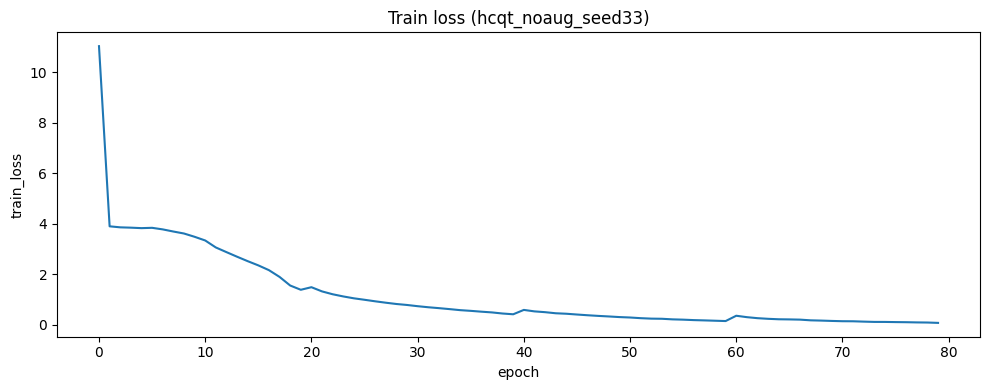

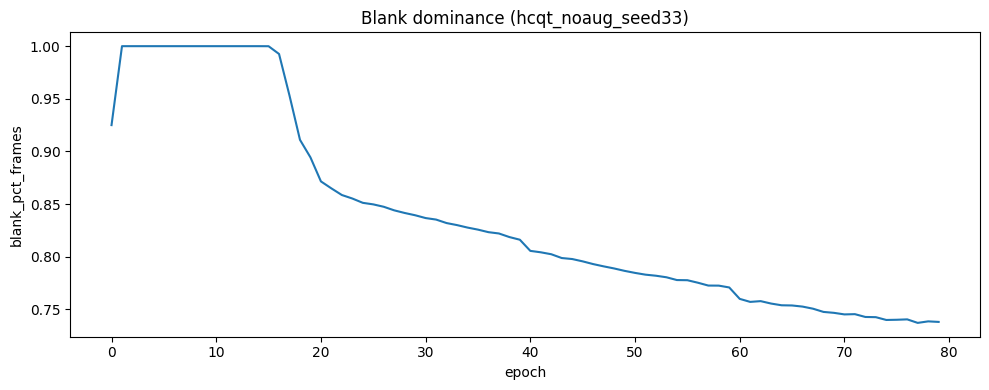

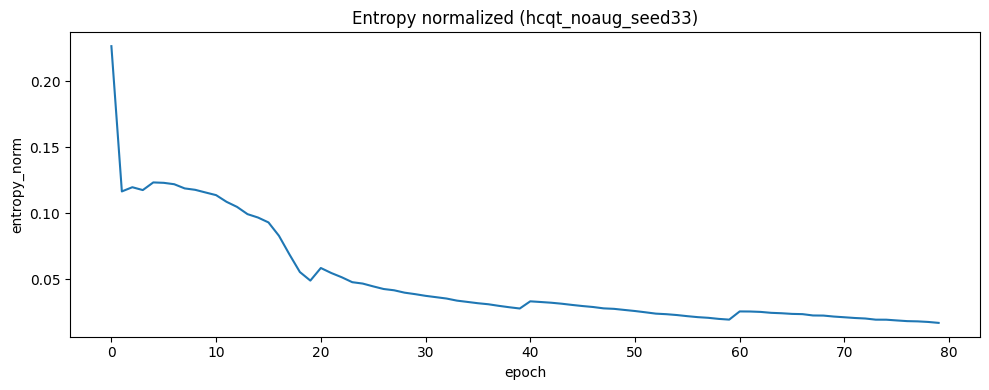

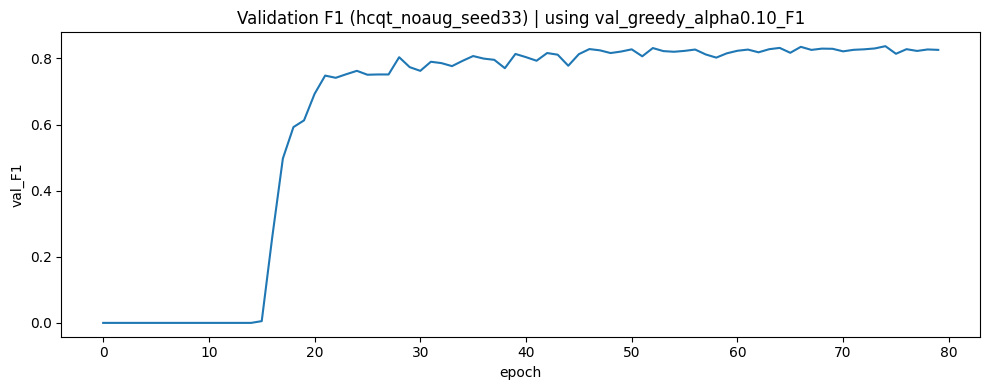

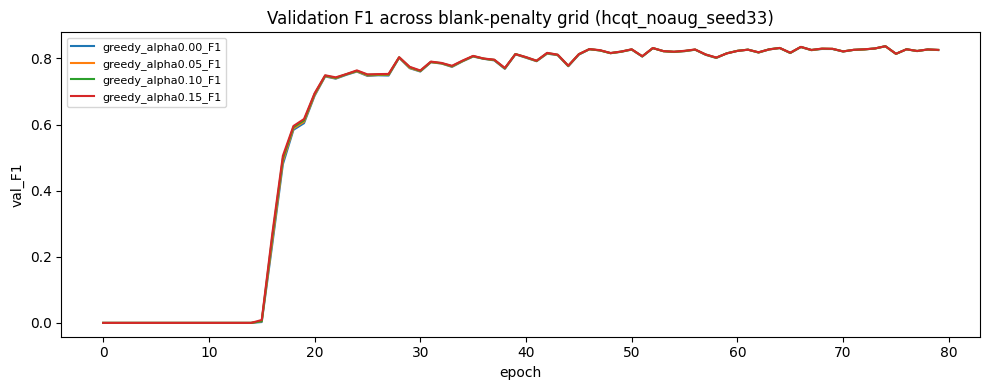

,note,P,R,F1,tp,fp,fn
8,29,0.0,0.0,0.0,0,0,2
9,30,0.0,0.0,0.0,0,0,12
11,32,0.0,0.0,0.0,0,9,4
12,33,0.0,0.0,0.0,0,1,13
72,93,0.0,0.0,0.0,0,0,12
73,94,0.0,0.0,0.0,0,0,22
74,95,0.0,0.0,0.0,0,0,8
75,96,0.0,0.0,0.0,0,0,0
76,97,0.0,0.0,0.0,0,0,0
77,98,0.0,0.0,0.0,0,0,0


,note,P,R,F1,tp,fp,fn
37,58,0.817685,0.810298,0.813975,897,200,210
50,71,0.751316,0.882535,0.811656,571,189,76
27,48,0.902439,0.737052,0.811404,370,40,132
45,66,0.831579,0.753577,0.790659,474,96,155
49,70,0.721719,0.872777,0.790093,638,246,93
48,69,0.754802,0.821648,0.786808,668,217,145
42,63,0.807256,0.756642,0.781130,712,170,229
52,73,0.682324,0.904918,0.778013,552,257,58
55,76,0.735938,0.788945,0.761520,471,169,126
53,74,0.649536,0.907278,0.757072,910,491,93


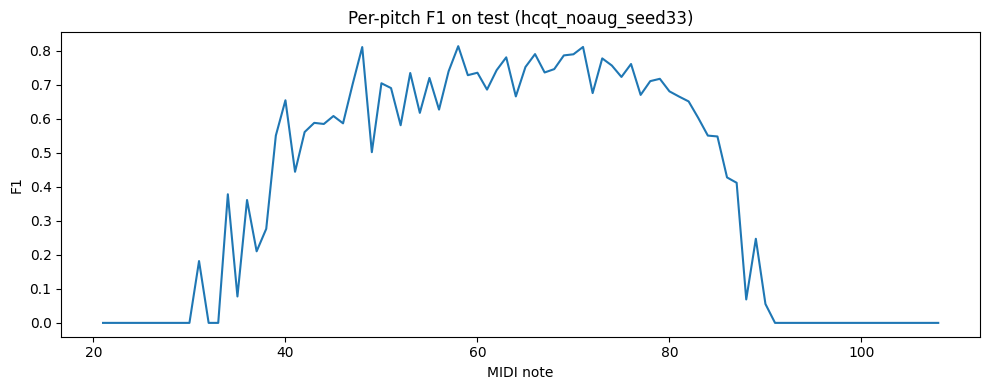

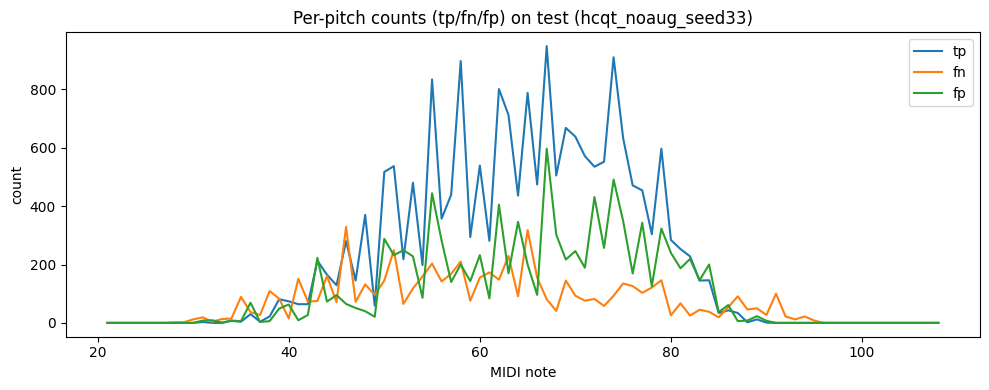

Done. All single-run reports and figures saved under: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33


In [23]:
# ============================================
# BLOCK 15 single-run reporting only for HCQT no Augmentation: seed33
# tables + curves + per-pitch plot + alignment figs already saved in run_dir/figs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json

assert "OUT_ROOT" in globals(), "OUT_ROOT not found."
assert "FIG_DIR" in globals(), "FIG_DIR not found."

RUN_NAME = "hcqt_noaug_seed33"
RUN_DIR  = OUT_ROOT / "runs_main_grid" / RUN_NAME

assert RUN_DIR.exists(), f"RUN_DIR not found: {RUN_DIR}"
(RUN_DIR / "figs").mkdir(parents=True, exist_ok=True)

print("RUN_DIR:", RUN_DIR)

hist_path = RUN_DIR / "history.csv"
sum_path  = RUN_DIR / "summary.json"
pp_path   = RUN_DIR / "per_pitch_pr_test.csv"

assert hist_path.exists(), f"Missing: {hist_path}"
assert sum_path.exists(),  f"Missing: {sum_path}"
assert pp_path.exists(),   f"Missing: {pp_path}"

hist = pd.read_csv(hist_path).sort_values("epoch").reset_index(drop=True)
summary = json.loads(sum_path.read_text(encoding="utf-8"))
per_pitch = pd.read_csv(pp_path)

display(pd.DataFrame([summary]))
display(hist.tail(5))
display(per_pitch.head())


# Best epoch diagnostic row (based on best_val_f1 track)
best_idx = int(hist["best_val_f1"].idxmax())
best_row = hist.loc[best_idx].to_dict()

final_row = hist.iloc[-1].to_dict()

report_table = pd.DataFrame([{
    "run_name": RUN_NAME,
    "feature": summary.get("feature", "hcqt"),
    "augment": summary.get("augment", False),
    "seed": summary.get("seed", 33),
    "best_epoch": summary.get("best_epoch", best_row.get("epoch", None)),
    "best_val_f1_primary": summary.get("best_val_f1_primary", best_row.get("best_val_f1", None)),
    "test_best_key": summary.get("test_best_key", None),
    "test_F1": summary.get("test_F1", None),
    "test_TER": summary.get("test_TER", None),
    "final_train_loss": final_row.get("train_loss", None),
    "final_blank_pct": final_row.get("blank_pct_frames", None),
    "final_entropy_norm": final_row.get("entropy_norm", None),
    "final_grad_total": final_row.get("grad_total", None),
    "best_blank_pct": best_row.get("blank_pct_frames", None),
    "best_entropy_norm": best_row.get("entropy_norm", None),
    "best_grad_total": best_row.get("grad_total", None),
    "curriculum_max_tokens_final": final_row.get("curriculum_max_tokens", None),
}])

display(report_table)

# Save single-run summary tables into run_dir
report_table.to_csv(RUN_DIR / "single_run_report_table.csv", index=False)
print("Saved:", RUN_DIR / "single_run_report_table.csv")

# Save a compact JSON report too
single_report = report_table.iloc[0].to_dict()
(Path(RUN_DIR / "single_run_report.json")).write_text(json.dumps(single_report, indent=2), encoding="utf-8")
print("Saved:", RUN_DIR / "single_run_report.json")

# Curves (loss, blank%, entropy, val F1)
plt.figure(figsize=(10, 4))
plt.plot(hist["epoch"], hist["train_loss"])
plt.title(f"Train loss ({RUN_NAME})")
plt.xlabel("epoch"); plt.ylabel("train_loss")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "curve_train_loss.png", dpi=160)
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(hist["epoch"], hist["blank_pct_frames"])
plt.title(f"Blank dominance ({RUN_NAME})")
plt.xlabel("epoch"); plt.ylabel("blank_pct_frames")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "curve_blank_dominance.png", dpi=160)
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(hist["epoch"], hist["entropy_norm"])
plt.title(f"Entropy normalized ({RUN_NAME})")
plt.xlabel("epoch"); plt.ylabel("entropy_norm")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "curve_entropy.png", dpi=160)
plt.show()

# Validation F1 curve
val_f1_col = "val_greedy_alpha0.10_F1"
use_col = val_f1_col if val_f1_col in hist.columns else "best_val_f1"

plt.figure(figsize=(10, 4))
plt.plot(hist["epoch"], hist[use_col])
plt.title(f"Validation F1 ({RUN_NAME}) | using {use_col}")
plt.xlabel("epoch"); plt.ylabel("val_F1")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "curve_val_f1.png", dpi=160)
plt.show()

# How different alpha settings behaved
alpha_cols = [c for c in hist.columns if c.startswith("val_greedy_alpha") and c.endswith("_F1")]
if len(alpha_cols) > 1:
    plt.figure(figsize=(10, 4))
    for c in sorted(alpha_cols):
        plt.plot(hist["epoch"], hist[c], label=c.replace("val_", ""))
    plt.title(f"Validation F1 across blank-penalty grid ({RUN_NAME})")
    plt.xlabel("epoch"); plt.ylabel("val_F1")
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig(RUN_DIR / "figs" / "curve_val_f1_blank_grid.png", dpi=160)
    plt.show()


# Per-pitch analysis
display(per_pitch.sort_values("F1").head(15))
display(per_pitch.sort_values("F1", ascending=False).head(15))

plt.figure(figsize=(10, 4))
plt.plot(per_pitch["note"].values, per_pitch["F1"].values)
plt.title(f"Per-pitch F1 on test ({RUN_NAME})")
plt.xlabel("MIDI note"); plt.ylabel("F1")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "per_pitch_f1.png", dpi=160)
plt.show()

# Counts to diagnose imbalance-driven failures
plt.figure(figsize=(10, 4))
plt.plot(per_pitch["note"].values, per_pitch["tp"].values, label="tp")
plt.plot(per_pitch["note"].values, per_pitch["fn"].values, label="fn")
plt.plot(per_pitch["note"].values, per_pitch["fp"].values, label="fp")
plt.title(f"Per-pitch counts (tp/fn/fp) on test ({RUN_NAME})")
plt.xlabel("MIDI note"); plt.ylabel("count")
plt.legend()
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "per_pitch_counts.png", dpi=160)
plt.show()

print("Done. All single-run reports and figures saved under:", RUN_DIR)


Using test decoding alpha: 0.05


,track_id,seg_start_samp,n_tokens,pred_len,TER,F1,len_ratio
0,1759,0,95,60,0.536842,0.722581,0.631579
1,1759,220500,127,103,0.543307,0.747826,0.811024
2,1759,441000,129,107,0.550388,0.754237,0.829457
3,1759,661500,128,103,0.492188,0.805195,0.804688
4,1759,882000,119,95,0.605042,0.757009,0.798319


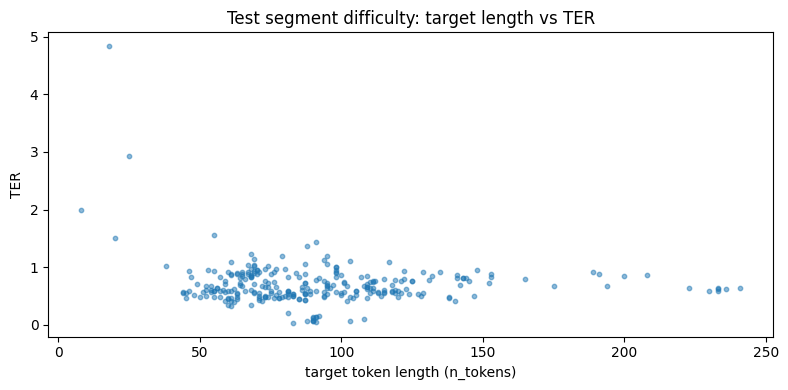

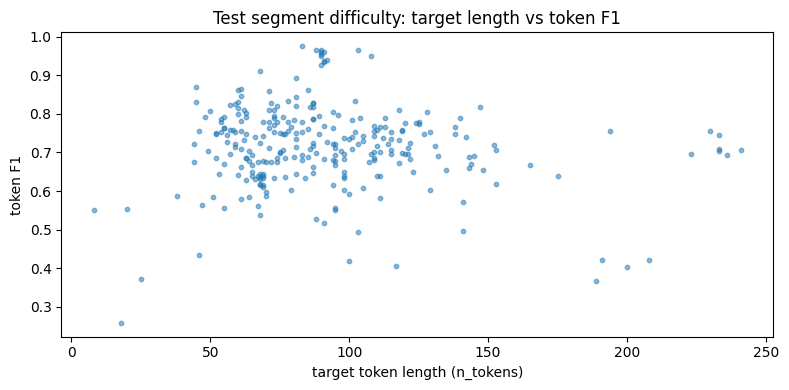

/tmp/ipykernel_14396/3550632586.py:85: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_table = df.groupby("len_bin").agg(


,len_bin,n,F1_mean,TER_mean,len_ratio_mean
0,"(0, 40]",5,0.464566,2.455930,3.052099
1,"(40, 80]",117,0.717837,0.696699,1.280167
2,"(80, 120]",114,0.737746,0.612166,1.097391
3,"(120, 160]",30,0.703497,0.720359,1.141856
4,"(160, 220]",7,0.525135,0.804556,0.922599
5,"(220, 400]",7,0.715455,0.615011,0.774644


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/test_performance_by_length_bin.csv


In [24]:
#Performance vs target length
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals(), "Run the single-run Block 15 first."
assert "BEST_FEATURE" in globals() or True  # not required

import json
summary = json.loads((RUN_DIR / "summary.json").read_text(encoding="utf-8"))
test_key = summary.get("test_best_key", "greedy_alpha0.10")
alpha = float(test_key.replace("greedy_alpha", ""))

print("Using test decoding alpha:", alpha)

ckpt = torch.load(RUN_DIR / "checkpoints" / "best.pt", map_location="cpu")
in_channels = ckpt["in_channels"]
n_freq_bins = ckpt["n_freq_bins"]

model = CTCTranscriber(in_channels=in_channels, n_freq_bins=n_freq_bins).to(DEVICE)
model.load_state_dict(ckpt["model"])
model.eval()

# Build test loader for HCQT
test_ds  = MusicNetNPZDataset(test_hcqt, AUG_OFF, seed=123)
test_loader = make_loader(test_ds, batch_size=8, shuffle=False)

rows = []
with torch.no_grad():
    for X, x_lens, y_pad, y_lens, metas in test_loader:
        X = X.to(DEVICE, non_blocking=True)
        x_lens = x_lens.to(DEVICE)
        log_probs, out_lens = model(X, x_lens)

        for i in range(log_probs.shape[0]):
            tgt = y_pad[i, :y_lens[i]].cpu().tolist()
            pred = greedy_decode(log_probs[i], int(out_lens[i].item()), CTC_BLANK_ID, alpha=alpha)
            m = eval_sequence_metrics(pred, tgt)
            rows.append({
                "track_id": metas[i]["track_id"],
                "seg_start_samp": metas[i]["seg_start_samp"],
                "n_tokens": len(tgt),
                "pred_len": len(pred),
                "TER": m["TER"],
                "F1": m["token_F1"],
                "len_ratio": m["len_ratio"],
            })

df = pd.DataFrame(rows)
display(df.head())

# Scatter: length vs TER
plt.figure(figsize=(8,4))
plt.scatter(df["n_tokens"], df["TER"], s=10, alpha=0.5)
plt.title("Test segment difficulty: target length vs TER")
plt.xlabel("target token length (n_tokens)")
plt.ylabel("TER")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "test_len_vs_ter.png", dpi=160)
plt.show()

# Scatter: length vs F1
plt.figure(figsize=(8,4))
plt.scatter(df["n_tokens"], df["F1"], s=10, alpha=0.5)
plt.title("Test segment difficulty: target length vs token F1")
plt.xlabel("target token length (n_tokens)")
plt.ylabel("token F1")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "test_len_vs_f1.png", dpi=160)
plt.show()

# Binned table
bins = [0, 40, 80, 120, 160, 220, 400]
df["len_bin"] = pd.cut(df["n_tokens"], bins=bins, right=True)
bin_table = df.groupby("len_bin").agg(
    n=("F1","count"),
    F1_mean=("F1","mean"),
    TER_mean=("TER","mean"),
    len_ratio_mean=("len_ratio","mean"),
).reset_index()

display(bin_table)
bin_table.to_csv(RUN_DIR / "test_performance_by_length_bin.csv", index=False)
print("Saved:", RUN_DIR / "test_performance_by_length_bin.csv")


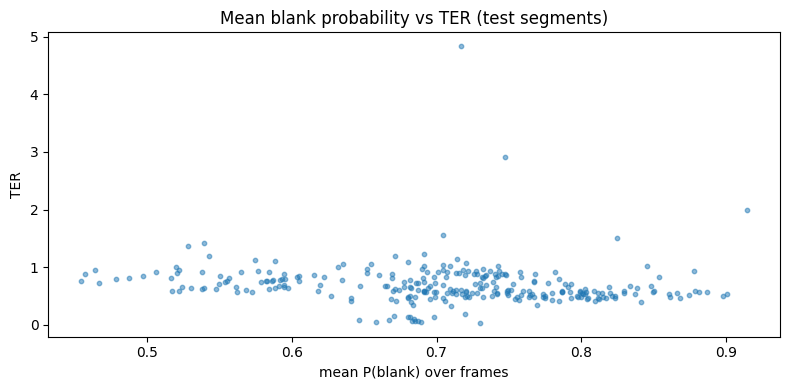

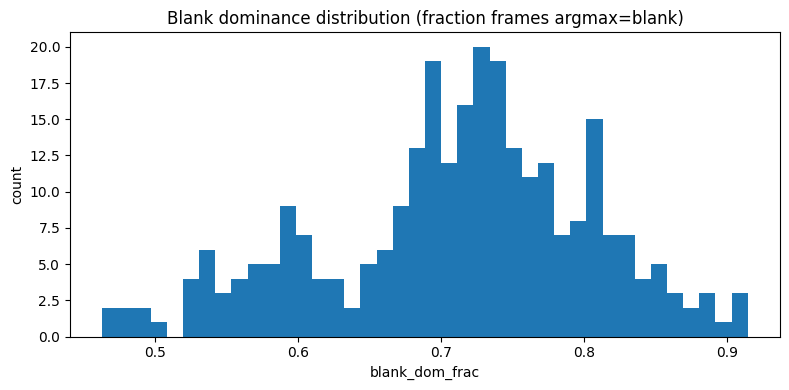

/tmp/ipykernel_14396/3967195007.py:57: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tab = cal.groupby("blank_bin").agg(n=("TER","count"), TER_mean=("TER","mean"), F1_mean=("F1","mean")).reset_index()


,blank_bin,n,TER_mean,F1_mean
0,"(0.0, 0.5]",6,0.828748,0.685667
1,"(0.5, 0.7]",106,0.687851,0.712075
2,"(0.7, 0.85]",151,0.697177,0.721974
3,"(0.85, 0.95]",17,0.704100,0.681750
4,"(0.95, 1.0]",0,NaN,NaN


In [25]:
# Blank prob vs errors (calibration-style diagnostics)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

rows = []
with torch.no_grad():
    for X, x_lens, y_pad, y_lens, metas in test_loader:
        X = X.to(DEVICE, non_blocking=True)
        x_lens = x_lens.to(DEVICE)
        log_probs, out_lens = model(X, x_lens)

        probs = torch.exp(log_probs)
        for i in range(log_probs.shape[0]):
            ol = int(out_lens[i].item())
            tgt = y_pad[i, :y_lens[i]].cpu().tolist()
            pred = greedy_decode(log_probs[i], ol, CTC_BLANK_ID, alpha=alpha)
            m = eval_sequence_metrics(pred, tgt)

            blank_p = probs[i, :ol, CTC_BLANK_ID].mean().item()
            argmax = torch.argmax(log_probs[i, :ol], dim=-1)
            blank_dom = (argmax == CTC_BLANK_ID).float().mean().item()

            rows.append({
                "n_tokens": len(tgt),
                "F1": m["token_F1"],
                "TER": m["TER"],
                "blank_prob_mean": float(blank_p),
                "blank_dom_frac": float(blank_dom),
            })

cal = pd.DataFrame(rows)

plt.figure(figsize=(8,4))
plt.scatter(cal["blank_prob_mean"], cal["TER"], s=10, alpha=0.5)
plt.title("Mean blank probability vs TER (test segments)")
plt.xlabel("mean P(blank) over frames")
plt.ylabel("TER")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "blankprob_vs_ter.png", dpi=160)
plt.show()

plt.figure(figsize=(8,4))
plt.hist(cal["blank_dom_frac"], bins=40)
plt.title("Blank dominance distribution (fraction frames argmax=blank)")
plt.xlabel("blank_dom_frac")
plt.ylabel("count")
plt.tight_layout()
plt.savefig(RUN_DIR / "figs" / "blank_dominance_hist_test.png", dpi=160)
plt.show()

# Table: performance by blank dominance bin
cal["blank_bin"] = pd.cut(cal["blank_dom_frac"], bins=[0,0.5,0.7,0.85,0.95,1.0])
tab = cal.groupby("blank_bin").agg(n=("TER","count"), TER_mean=("TER","mean"), F1_mean=("F1","mean")).reset_index()
display(tab)
tab.to_csv(RUN_DIR / "blank_dominance_bins_test.csv", index=False)


,track_id,seg_start_samp,n_tokens,pred_len,TER,F1,len_ratio,len_bin
104,2106,7276500,18,98,4.833333,0.258621,5.444444,"(0, 40]"
103,2106,7056000,25,88,2.920000,0.371681,3.520000,"(0, 40]"
179,2303,3528000,8,21,2.000000,0.551724,2.625000,"(0, 40]"
105,2106,7497000,55,107,1.563636,0.555556,1.945455,"(40, 80]"
133,2191,3969000,20,45,1.500000,0.553846,2.250000,"(0, 40]"
268,2628,2425500,91,184,1.428571,0.516364,2.021978,"(80, 120]"
269,2628,2646000,88,178,1.375000,0.526316,2.022727,"(80, 120]"
162,2298,6174000,68,122,1.235294,0.536842,1.794118,"(40, 80]"
83,2106,2646000,79,133,1.202532,0.603774,1.683544,"(40, 80]"
270,2628,2866500,95,164,1.189474,0.555985,1.726316,"(80, 120]"


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/worst_20_test_segments.csv


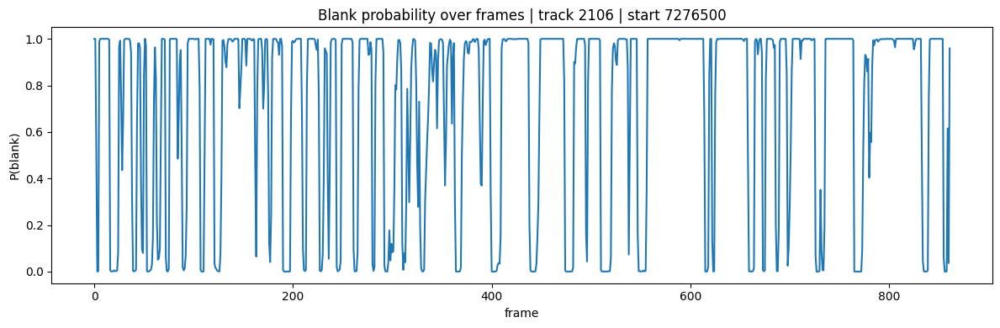

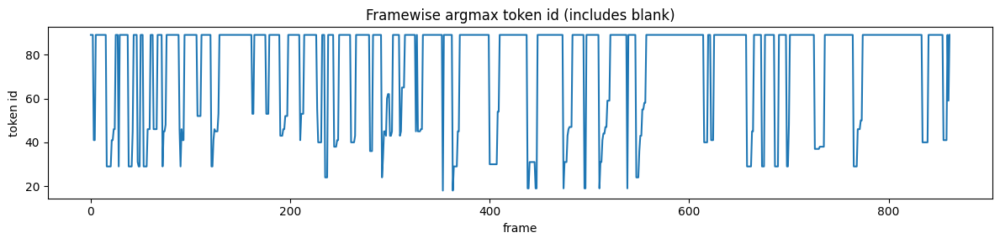

Target len: 18 | Pred len: 98
Target (first 40): [29, 34, 40, 43, 41, 45, 29, 34, 43, 46, 45, 48, 29, 34, 46, 50, 43, 52]
Pred   (first 40): [41, 29, 41, 46, 29, 29, 45, 31, 29, 29, 46, 46, 29, 45, 48, 46, 29, 46, 41, 52, 29, 41, 46, 45, 53, 53, 53, 43, 46, 52, 41, 53, 55, 40, 24, 38, 41, 40, 43, 36]


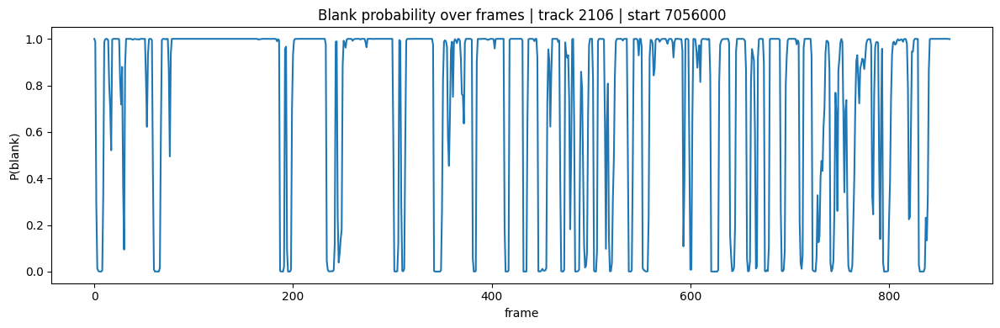

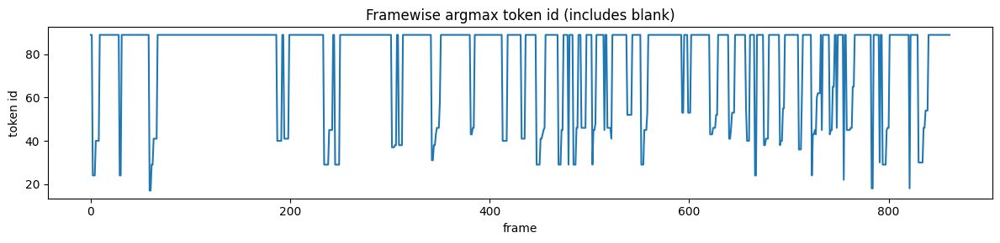

Target len: 25 | Pred len: 88
Target (first 40): [24, 43, 17, 36, 41, 40, 41, 29, 33, 36, 45, 48, 37, 38, 29, 34, 38, 43, 46, 40, 41, 29, 34, 40, 43]
Pred   (first 40): [24, 40, 24, 17, 29, 41, 60, 40, 41, 29, 45, 29, 37, 38, 38, 31, 38, 43, 46, 58, 43, 46, 40, 41, 29, 41, 43, 45, 46, 29, 45, 29, 29, 46, 46, 29, 45, 48, 45, 46]


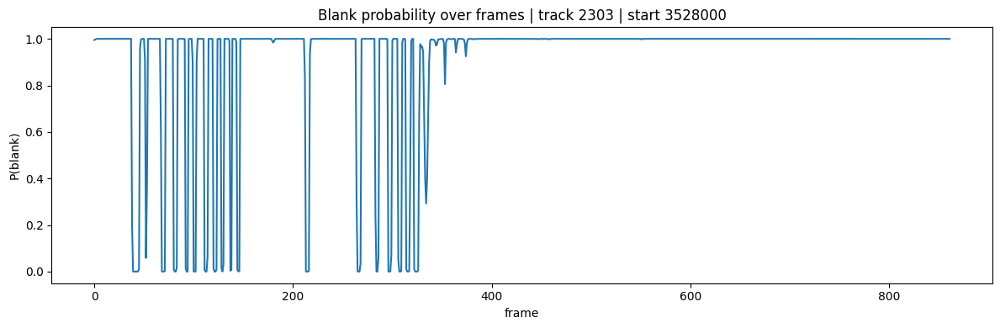

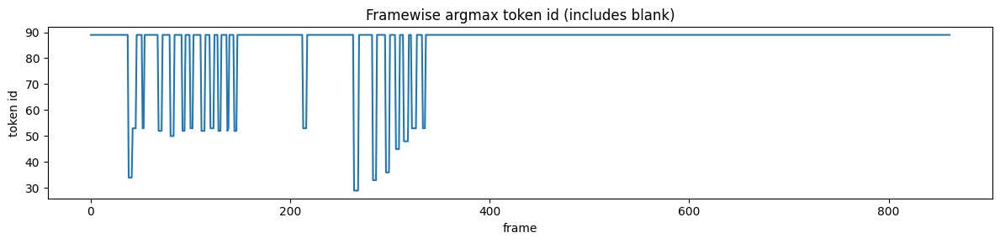

Target len: 8 | Pred len: 21
Target (first 40): [52, 34, 45, 48, 53, 29, 33, 36]
Pred   (first 40): [34, 53, 53, 52, 50, 52, 53, 52, 53, 52, 52, 53, 52, 53, 29, 33, 36, 45, 48, 53, 53]


In [26]:
# Worst-case qualitative audit (top failures)
df_eval = df.copy()  # from Block A
worst = df_eval.sort_values("TER", ascending=False).head(20)
display(worst)

worst.to_csv(RUN_DIR / "worst_20_test_segments.csv", index=False)
print("Saved:", RUN_DIR / "worst_20_test_segments.csv")

# Visualizing 3 worst alignments
N_SHOW = 3
worst3 = worst.head(N_SHOW)

for _, row in worst3.iterrows():
    tid = int(row["track_id"])
    ss  = int(row["seg_start_samp"])

    found = False
    with torch.no_grad():
        for X, x_lens, y_pad, y_lens, metas in test_loader:
            for i, m in enumerate(metas):
                if int(m["track_id"]) == tid and int(m["seg_start_samp"]) == ss:
                    X1 = X[i:i+1].to(DEVICE)
                    xl = x_lens[i:i+1].to(DEVICE)
                    lp, ol = model(X1, xl)
                    lp1 = lp[0]
                    ol1 = int(ol[0].item())
                    tgt = y_pad[i, :y_lens[i]].cpu().tolist()
                    pred = greedy_decode(lp1, ol1, CTC_BLANK_ID, alpha=alpha)

                    outdir = RUN_DIR / "figs" / f"worst_tid{tid}_start{ss}"
                    plot_alignment_sanity(lp1, ol1, m, tgt, pred, save_dir=outdir)
                    found = True
                    break
            if found:
                break


In [27]:
#BLOCK D: Train vs Test distribution shift (JS divergence + top shifted pitches)
import numpy as np
import pandas as pd

# Requires pitch_df from earlier dataset analysis block
assert "pitch_df" in globals(), "pitch_df not found. Run dataset analysis block earlier."

def js_divergence(p, q, eps=1e-12):
    p = np.asarray(p, dtype=np.float64) + eps
    q = np.asarray(q, dtype=np.float64) + eps
    p = p / p.sum()
    q = q / q.sum()
    m = 0.5*(p+q)
    kl_pm = np.sum(p * np.log(p/m))
    kl_qm = np.sum(q * np.log(q/m))
    return float(0.5*(kl_pm + kl_qm))

js_train_test = js_divergence(pitch_df["train_pct"].values, pitch_df["test_pct"].values)
js_train_val  = js_divergence(pitch_df["train_pct"].values, pitch_df["val_pct"].values)
print("JS(train||test):", js_train_test)
print("JS(train||val) :", js_train_val)

shift = pitch_df.copy()
shift["delta_test_minus_train"] = shift["test_pct"] - shift["train_pct"]
display(shift.sort_values("delta_test_minus_train", ascending=False).head(12))
display(shift.sort_values("delta_test_minus_train", ascending=True).head(12))

shift.to_csv(RUN_DIR / "pitch_shift_train_test.csv", index=False)
(Path(RUN_DIR / "js_divergence_pitch.json")).write_text(
    json.dumps({"js_train_test": js_train_test, "js_train_val": js_train_val}, indent=2),
    encoding="utf-8"
)


JS(train||test): 0.013538126732889639
JS(train||val) : 0.01722441432515938


,note,train_count,val_count,test_count,train_pct,val_pct,test_pct,delta_test_minus_train
44,65,1073,438,591,0.028697,0.044413,0.043491,0.014794
37,58,1132,231,605,0.030275,0.023423,0.044521,0.014247
25,46,440,123,319,0.011768,0.012472,0.023475,0.011707
34,55,1104,403,559,0.029526,0.040864,0.041136,0.011610
30,51,832,252,431,0.022251,0.025553,0.031717,0.009465
42,63,1068,250,499,0.028563,0.025350,0.036721,0.008158
41,62,1141,347,505,0.030515,0.035186,0.037162,0.006647
58,79,842,219,385,0.022519,0.022206,0.028332,0.005813
23,44,331,68,180,0.008852,0.006895,0.013246,0.004394
53,74,1281,413,520,0.034260,0.041878,0.038266,0.004007


,note,train_count,val_count,test_count,train_pct,val_pct,test_pct,delta_test_minus_train
31,52,785,203,146,0.020994,0.020584,0.010744,-0.010250
51,72,1263,509,322,0.033778,0.051612,0.023696,-0.010083
33,54,834,129,186,0.022305,0.013081,0.013688,-0.008617
38,59,840,184,197,0.022465,0.018657,0.014497,-0.007968
28,49,482,106,80,0.012891,0.010748,0.005887,-0.007004
47,68,1019,257,277,0.027253,0.026060,0.020384,-0.006868
43,64,997,217,274,0.026664,0.022004,0.020163,-0.006501
36,57,1076,247,318,0.028777,0.025046,0.023401,-0.005376
35,56,905,244,258,0.024204,0.024741,0.018986,-0.005218
26,47,502,56,115,0.013426,0.005678,0.008463,-0.004963


82

Decoded segments: 280


,true_note,pred_note,count,true_id,pred_id
0,46,58,34,25,37
1,65,74,31,44,53
2,61,62,28,40,41
3,66,67,27,45,46
4,39,51,25,18,30
5,55,67,25,34,46
6,46,74,25,25,53
7,51,72,22,30,51
8,41,53,22,20,32
9,58,67,21,37,46


,pred_note,count,pred_id
0,67,379,46
1,74,339,53
2,55,323,34
3,72,296,51
4,77,281,56
5,62,279,41
6,79,242,58
7,75,240,54
8,64,223,43
9,58,222,37


,true_note,count,true_id
0,65,170,44
1,55,161,34
2,58,159,37
3,63,150,42
4,60,134,39
5,51,131,30
6,62,121,41
7,79,111,58
8,46,104,25
9,69,95,48


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/top_token_substitutions.csv
Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/top_token_insertions.csv
Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/top_token_deletions.csv


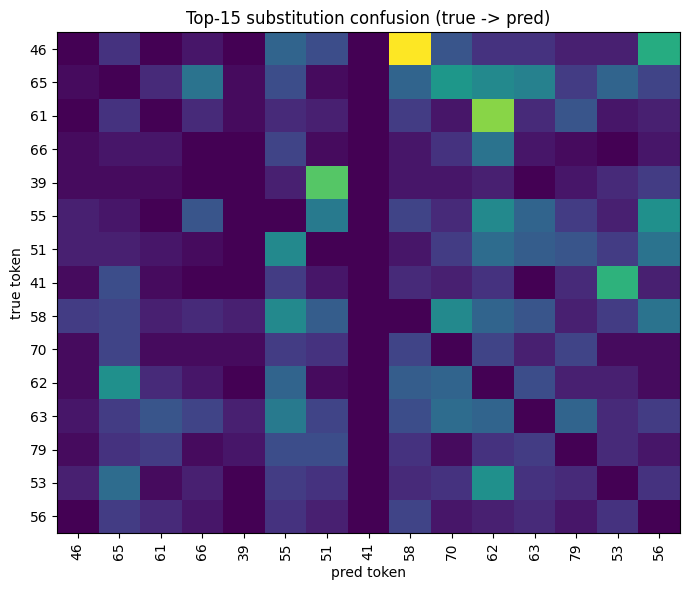

In [29]:
# Token error taxonomy via Levenshtein backtrace
# - Substitutions: true_note -> predicted_note
# - Insertions: predicted_note (extra emissions)
# - Deletions: true_note (missed targets)
# Saves top tables + optional top-confusion matrix plot
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from pathlib import Path

assert "RUN_DIR" in globals(), "RUN_DIR not found. Run your single-run reporting block first."
assert "model" in globals(), "model not found. Run Block A/B that loads the checkpoint into model."
assert "test_loader" in globals(), "test_loader not found. Run Block A/B that builds the test_loader."
assert "alpha" in globals(), "alpha not found. Run Block A/B that defines decoding alpha."
assert "greedy_decode" in globals(), "greedy_decode not found."
assert "CTC_BLANK_ID" in globals(), "CTC_BLANK_ID not found."
assert "N_PITCH" in globals(), "N_PITCH not found."
assert "id_to_note" in globals(), "id_to_note not found."
assert "DEVICE" in globals(), "DEVICE not found."

OUT_DIR = RUN_DIR
(OUT_DIR / "figs").mkdir(parents=True, exist_ok=True)

# Levenshtein backtrace to extract edit operations
def levenshtein_ops(a, b):
    a = list(a)
    b = list(b)
    n, m = len(a), len(b)

    dp = np.zeros((n+1, m+1), dtype=np.int32)
    for i in range(n+1):
        dp[i, 0] = i
    for j in range(m+1):
        dp[0, j] = j

    for i in range(1, n+1):
        ai = a[i-1]
        for j in range(1, m+1):
            bj = b[j-1]
            cost = 0 if ai == bj else 1
            dp[i, j] = min(
                dp[i-1, j] + 1,        # deletion
                dp[i, j-1] + 1,        # insertion
                dp[i-1, j-1] + cost    # sub/eq
            )

    # Backtrace
    ops = []
    i, j = n, m
    while i > 0 or j > 0:
        if i > 0 and dp[i, j] == dp[i-1, j] + 1:
            # deletion: a[i-1] deleted
            ops.append(("del", a[i-1], None))
            i -= 1
        elif j > 0 and dp[i, j] == dp[i, j-1] + 1:
            # insertion: b[j-1] inserted
            ops.append(("ins", None, b[j-1]))
            j -= 1
        else:
            # diag: eq or sub
            ai = a[i-1] if i > 0 else None
            bj = b[j-1] if j > 0 else None
            if ai == bj:
                ops.append(("eq", ai, bj))
            else:
                ops.append(("sub", ai, bj))
            i -= 1
            j -= 1

    ops.reverse()
    return ops

# Decode test set once
model.eval()

pred_seqs = []
tgt_seqs  = []

with torch.no_grad():
    for X, x_lens, y_pad, y_lens, metas in test_loader:
        X = X.to(DEVICE, non_blocking=True)
        x_lens = x_lens.to(DEVICE)
        log_probs, out_lens = model(X, x_lens)

        for i in range(log_probs.shape[0]):
            tgt = y_pad[i, :y_lens[i]].cpu().tolist()
            pred = greedy_decode(log_probs[i], int(out_lens[i].item()), CTC_BLANK_ID, alpha=float(alpha))

            # keep only pitch tokens
            tgt = [t for t in tgt if 0 <= t < N_PITCH]
            pred = [p for p in pred if 0 <= p < N_PITCH]

            tgt_seqs.append(tgt)
            pred_seqs.append(pred)

print("Decoded segments:", len(tgt_seqs))

# Count edit operations
subs = Counter()  # (true_id, pred_id)
ins  = Counter()  # pred_id
dels = Counter()  # true_id

for tgt, pred in zip(tgt_seqs, pred_seqs):
    ops = levenshtein_ops(tgt, pred)
    for op, a_tok, b_tok in ops:
        if op == "sub" and a_tok is not None and b_tok is not None:
            subs[(a_tok, b_tok)] += 1
        elif op == "ins" and b_tok is not None:
            ins[b_tok] += 1
        elif op == "del" and a_tok is not None:
            dels[a_tok] += 1

# Save top tables
top_subs = subs.most_common(50)
rows_sub = [{
    "true_note": id_to_note(t),
    "pred_note": id_to_note(p),
    "count": int(c),
    "true_id": int(t),
    "pred_id": int(p)
} for (t, p), c in top_subs]
subs_df = pd.DataFrame(rows_sub)

top_ins = ins.most_common(50)
ins_df = pd.DataFrame([{
    "pred_note": id_to_note(p),
    "count": int(c),
    "pred_id": int(p)
} for p, c in top_ins])

top_dels = dels.most_common(50)
dels_df = pd.DataFrame([{
    "true_note": id_to_note(t),
    "count": int(c),
    "true_id": int(t)
} for t, c in top_dels])

display(subs_df.head(20))
display(ins_df.head(20))
display(dels_df.head(20))

subs_df.to_csv(OUT_DIR / "top_token_substitutions.csv", index=False)
ins_df.to_csv(OUT_DIR / "top_token_insertions.csv", index=False)
dels_df.to_csv(OUT_DIR / "top_token_deletions.csv", index=False)

print("Saved:", OUT_DIR / "top_token_substitutions.csv")
print("Saved:", OUT_DIR / "top_token_insertions.csv")
print("Saved:", OUT_DIR / "top_token_deletions.csv")


# Confusion matrix for top-K tokens involved in substitutions

K = 15
top_true = [tp[0][0] for tp in subs.most_common(200)]
top_pred = [tp[0][1] for tp in subs.most_common(200)]
top_tokens = list(dict.fromkeys(top_true + top_pred))[:K]  # unique keep order

if len(top_tokens) >= 5:
    idx = {t:i for i,t in enumerate(top_tokens)}
    M = np.zeros((len(top_tokens), len(top_tokens)), dtype=np.int32)

    for (t, p), c in subs.items():
        if t in idx and p in idx:
            M[idx[t], idx[p]] += int(c)

    plt.figure(figsize=(7,6))
    plt.imshow(M, aspect="auto", origin="upper")
    plt.title(f"Top-{len(top_tokens)} substitution confusion (true -> pred)")
    plt.xlabel("pred token"); plt.ylabel("true token")
    plt.xticks(range(len(top_tokens)), [id_to_note(t) for t in top_tokens], rotation=90)
    plt.yticks(range(len(top_tokens)), [id_to_note(t) for t in top_tokens])
    plt.tight_layout()
    plt.savefig(OUT_DIR / "figs" / "top_substitution_confusion.png", dpi=160)
    plt.show()
else:
    print("Not enough substitution diversity to plot a top confusion matrix.")


Total aligned eq+sub counts: 22292


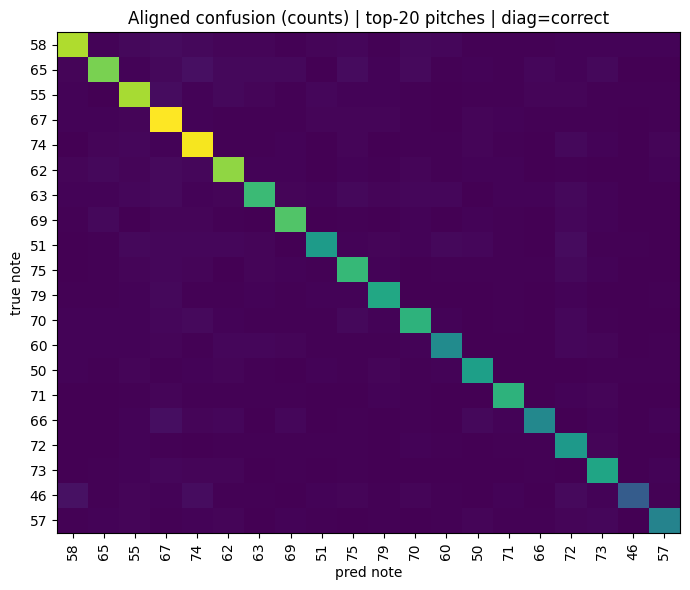

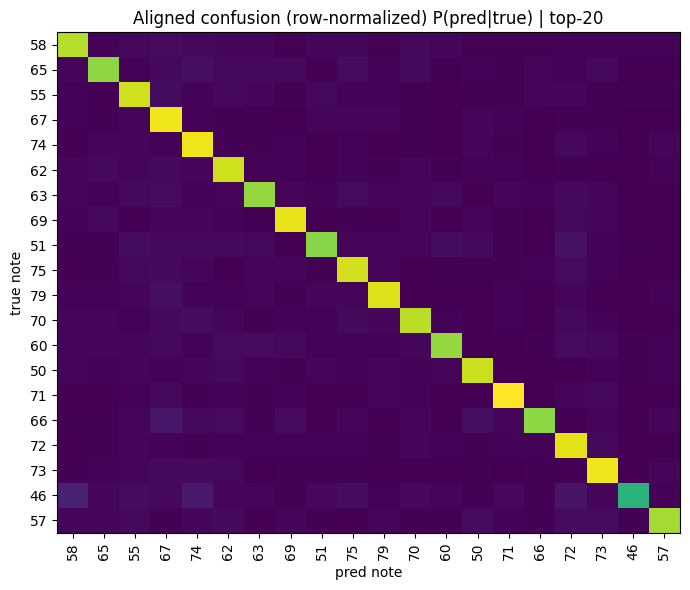

,note,eq_correct,subs_out,del,subs_in,ins,aligned_recall,aligned_precision
8,29,0,1,1,0,0,0.0,0.0
9,30,0,9,3,0,0,0.0,0.0
11,32,0,4,0,6,3,0.0,0.0
12,33,0,10,3,0,1,0.0,0.0
73,94,0,13,9,0,0,0.0,0.0
72,93,0,5,7,0,0,0.0,0.0
75,96,0,0,0,0,0,0.0,0.0
69,90,0,19,9,7,1,0.0,0.0
70,91,0,60,40,0,0,0.0,0.0
71,92,0,19,3,0,0,0.0,0.0


,note,eq_correct,subs_out,del,subs_in,ins,aligned_recall,aligned_precision
19,40,74,9,6,36,27,0.831461,0.540146
59,80,243,42,25,114,167,0.783871,0.463740
50,71,493,95,59,134,133,0.761978,0.648684
53,74,750,181,72,312,339,0.747757,0.535332
61,82,188,40,25,107,152,0.743083,0.420582
46,67,761,177,91,405,379,0.739553,0.492557
52,73,447,115,48,215,147,0.732787,0.552534
47,68,396,87,63,199,212,0.725275,0.490706
48,69,555,163,95,166,164,0.682657,0.627119
62,83,129,38,23,68,94,0.678947,0.443299


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/aligned_per_pitch_metrics.csv


In [30]:
# Correct predictions matrix (alignment confusion)
# Diagonal = correct matches ("eq")
# Off-diagonal = substitutions ("sub")
# Also outputs per-pitch aligned accuracy/precision/recall.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from pathlib import Path

assert "RUN_DIR" in globals(), "RUN_DIR not found."
assert "model" in globals(), "model not found (load checkpoint first)."
assert "test_loader" in globals(), "test_loader not found."
assert "alpha" in globals(), "alpha not found."
assert "greedy_decode" in globals(), "greedy_decode not found."
assert "CTC_BLANK_ID" in globals(), "CTC_BLANK_ID not found."
assert "N_PITCH" in globals(), "N_PITCH not found."
assert "id_to_note" in globals(), "id_to_note not found."
assert "DEVICE" in globals(), "DEVICE not found."

( Path(RUN_DIR) / "figs").mkdir(parents=True, exist_ok=True)

def levenshtein_ops(a, b):
    a = list(a); b = list(b)
    n, m = len(a), len(b)
    dp = np.zeros((n+1, m+1), dtype=np.int32)
    dp[:, 0] = np.arange(n+1, dtype=np.int32)
    dp[0, :] = np.arange(m+1, dtype=np.int32)

    for i in range(1, n+1):
        ai = a[i-1]
        for j in range(1, m+1):
            bj = b[j-1]
            cost = 0 if ai == bj else 1
            dp[i, j] = min(
                dp[i-1, j] + 1,       # del
                dp[i, j-1] + 1,       # ins
                dp[i-1, j-1] + cost   # eq/sub
            )

    ops = []
    i, j = n, m
    while i > 0 or j > 0:
        if i > 0 and dp[i, j] == dp[i-1, j] + 1:
            ops.append(("del", a[i-1], None))
            i -= 1
        elif j > 0 and dp[i, j] == dp[i, j-1] + 1:
            ops.append(("ins", None, b[j-1]))
            j -= 1
        else:
            ai = a[i-1] if i > 0 else None
            bj = b[j-1] if j > 0 else None
            if ai == bj:
                ops.append(("eq", ai, bj))
            else:
                ops.append(("sub", ai, bj))
            i -= 1; j -= 1

    ops.reverse()
    return ops

# Decode + collect aligned counts
model.eval()

# Confusion counts only for (eq + sub): true_id -> pred_id
conf = np.zeros((N_PITCH, N_PITCH), dtype=np.int64)

# Also keep deletions/insertions for per-pitch recall/precision
del_counts = np.zeros(N_PITCH, dtype=np.int64)   # true token deleted
ins_counts = np.zeros(N_PITCH, dtype=np.int64)   # predicted token inserted

tgt_freq = np.zeros(N_PITCH, dtype=np.int64)
pred_freq = np.zeros(N_PITCH, dtype=np.int64)

with torch.no_grad():
    for X, x_lens, y_pad, y_lens, metas in test_loader:
        X = X.to(DEVICE, non_blocking=True)
        x_lens = x_lens.to(DEVICE)

        log_probs, out_lens = model(X, x_lens)

        for i in range(log_probs.shape[0]):
            tgt = y_pad[i, :y_lens[i]].cpu().tolist()
            pred = greedy_decode(log_probs[i], int(out_lens[i].item()), CTC_BLANK_ID, alpha=float(alpha))

            tgt = [t for t in tgt if 0 <= t < N_PITCH]
            pred = [p for p in pred if 0 <= p < N_PITCH]

            for t in tgt: tgt_freq[t] += 1
            for p in pred: pred_freq[p] += 1

            ops = levenshtein_ops(tgt, pred)
            for op, a_tok, b_tok in ops:
                if op in ("eq", "sub") and a_tok is not None and b_tok is not None:
                    conf[a_tok, b_tok] += 1
                elif op == "del" and a_tok is not None:
                    del_counts[a_tok] += 1
                elif op == "ins" and b_tok is not None:
                    ins_counts[b_tok] += 1

print("Total aligned eq+sub counts:", int(conf.sum()))

# Choose Top-K pitches by target frequency for readability
K = 20
top_true = np.argsort(-tgt_freq)[:K]
top_true = [int(x) for x in top_true if tgt_freq[int(x)] > 0]

# Include top predicted if you want a symmetric set
top_pred = np.argsort(-pred_freq)[:K]
top_pred = [int(x) for x in top_pred if pred_freq[int(x)] > 0]

# Union set (keeps order roughly by target prominence first)
top_tokens = list(dict.fromkeys(top_true + top_pred))
top_tokens = top_tokens[:K]

labels = [id_to_note(t) for t in top_tokens]
M = conf[np.ix_(top_tokens, top_tokens)]

# Plot 1: Raw count confusion matrix
plt.figure(figsize=(7,6))
plt.imshow(M, aspect="auto", origin="upper")
plt.title(f"Aligned confusion (counts) | top-{len(top_tokens)} pitches | diag=correct")
plt.xlabel("pred note"); plt.ylabel("true note")
plt.xticks(range(len(labels)), labels, rotation=90)
plt.yticks(range(len(labels)), labels)
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "confusion_counts_topK.png", dpi=160)
plt.show()

# Plot 2: Row-normalized confusion matrix P(pred | true)
row_sums = M.sum(axis=1, keepdims=True)
M_row = np.divide(M, np.maximum(row_sums, 1), dtype=np.float64)

plt.figure(figsize=(7,6))
plt.imshow(M_row, aspect="auto", origin="upper", vmin=0.0, vmax=np.max(M_row))
plt.title(f"Aligned confusion (row-normalized) P(pred|true) | top-{len(top_tokens)}")
plt.xlabel("pred note"); plt.ylabel("true note")
plt.xticks(range(len(labels)), labels, rotation=90)
plt.yticks(range(len(labels)), labels)
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "confusion_row_normalized_topK.png", dpi=160)
plt.show()

# ---------------------------------------------------------
# Per-pitch aligned metrics:
# Recall-ish: eq / (eq + del + subs_outgoing)
# Precision-ish: eq / (eq + ins + subs_incoming)
# Accuracy-ish (conditional on true): eq / (eq + del + subs_outgoing)
# ---------------------------------------------------------
eq = np.diag(conf).astype(np.int64)
subs_out = (conf.sum(axis=1) - eq).astype(np.int64)   # true -> wrong pred
subs_in  = (conf.sum(axis=0) - eq).astype(np.int64)   # wrong true -> pred

recall = eq / np.maximum(eq + subs_out + del_counts, 1)
precision = eq / np.maximum(eq + subs_in + ins_counts, 1)

metrics_df = pd.DataFrame({
    "note": [id_to_note(i) for i in range(N_PITCH)],
    "eq_correct": eq,
    "subs_out": subs_out,
    "del": del_counts,
    "subs_in": subs_in,
    "ins": ins_counts,
    "aligned_recall": recall,
    "aligned_precision": precision,
})
display(metrics_df.sort_values("aligned_recall").head(15))
display(metrics_df.sort_values("aligned_recall", ascending=False).head(15))

metrics_df.to_csv(Path(RUN_DIR) / "aligned_per_pitch_metrics.csv", index=False)
print("Saved:", Path(RUN_DIR) / "aligned_per_pitch_metrics.csv")


Run: hcqt_noaug_seed33 | test key: greedy_alpha0.05 | alpha: 0.05


,track_id,seg_start_samp,seg_end_samp,n_tokens,pred_len,F1,TER,len_ratio
count,280.000000,2.800000e+02,2.800000e+02,280.000000,280.000000,280.000000,280.000000,280.000000
mean,2202.867857,3.229538e+06,3.670538e+06,92.239286,104.675000,0.715007,0.696886,1.200997
std,285.921262,2.199778e+06,2.199778e+06,38.277752,37.090388,0.107964,0.380019,0.411920
min,1759.000000,0.000000e+00,4.410000e+05,8.000000,21.000000,0.258621,0.036145,0.631579
25%,1819.000000,1.488375e+06,1.929375e+06,67.750000,81.000000,0.665865,0.530678,0.966497
50%,2298.000000,2.976750e+06,3.417750e+06,86.500000,97.000000,0.719826,0.639234,1.136529
75%,2416.000000,4.630500e+06,5.071500e+06,109.000000,123.000000,0.776341,0.837010,1.386489
max,2628.000000,9.481500e+06,9.922500e+06,241.000000,212.000000,0.975610,4.833333,5.444444


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/best_segments_scores_all_test.csv


,track_id,seg_start_samp,seg_end_samp,n_tokens,pred_len,F1,TER,len_ratio
0,2303,0,441000,83,81,0.975610,0.036145,0.975904
1,2303,661500,1102500,90,88,0.966292,0.066667,0.977778
2,2303,2425500,2866500,103,100,0.965517,0.058252,0.970874
3,2303,1984500,2425500,88,84,0.965116,0.068182,0.954545
4,2303,220500,661500,91,88,0.960894,0.054945,0.967033
5,2303,2205000,2646000,90,85,0.960000,0.066667,0.944444
6,2303,1764000,2205000,90,86,0.954545,0.088889,0.955556
7,2303,2646000,3087000,108,109,0.949309,0.092593,1.009259
8,2303,882000,1323000,90,87,0.949153,0.111111,0.966667
9,2303,1543500,1984500,92,93,0.940541,0.152174,1.010870


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/best_segments_top10.csv


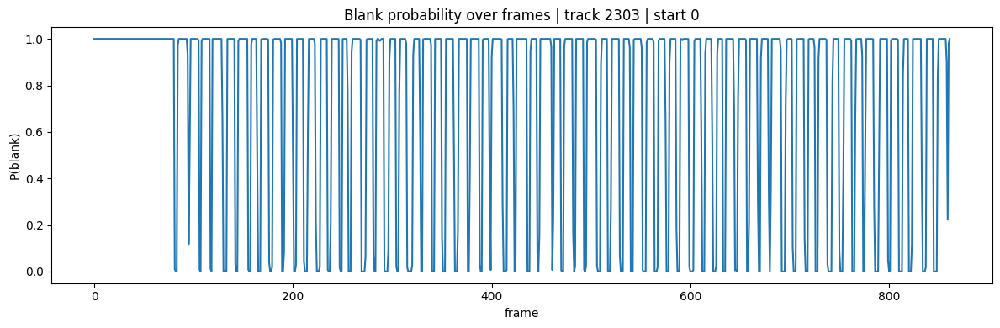

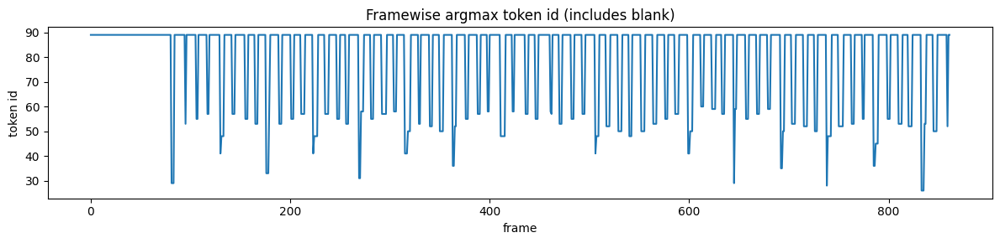

Target len: 83 | Pred len: 81
Target (first 40): [29, 53, 55, 57, 41, 48, 57, 55, 53, 33, 60, 53, 55, 57, 41, 48, 57, 55, 53, 31, 58, 55, 57, 58, 41, 50, 53, 52, 50, 36, 52, 55, 57, 58, 40, 48, 58, 57, 55, 29]
Pred   (first 40): [29, 53, 55, 57, 41, 48, 57, 55, 53, 33, 60, 53, 55, 57, 41, 48, 57, 55, 53, 31, 58, 55, 57, 58, 41, 50, 53, 52, 50, 36, 52, 55, 57, 58, 48, 58, 57, 55, 58, 57]
RANK 1/10
track_id=2303 start_samp=0 end_samp=441000
F1=0.9756 TER=0.0361 len_ratio=0.976
tgt_len=83 pred_len=81
TARGET (first 60): 29 53 55 57 41 48 57 55 53 33 60 53 55 57 41 48 57 55 53 31 58 55 57 58 41 50 53 52 50 36 52 55 57 58 40 48 58 57 55 29 57 53 55 57 41 48 52 50 48 29 50 53 55 57 41 50 60 59 57 29
PRED   (first 60): 29 53 55 57 41 48 57 55 53 33 60 53 55 57 41 48 57 55 53 31 58 55 57 58 41 50 53 52 50 36 52 55 57 58 48 58 57 55 58 57 53 55 57 41 48 52 50 48 50 53 55 57 41 50 60 59 57 29 59 55
--------------------------------------------------------------------------------


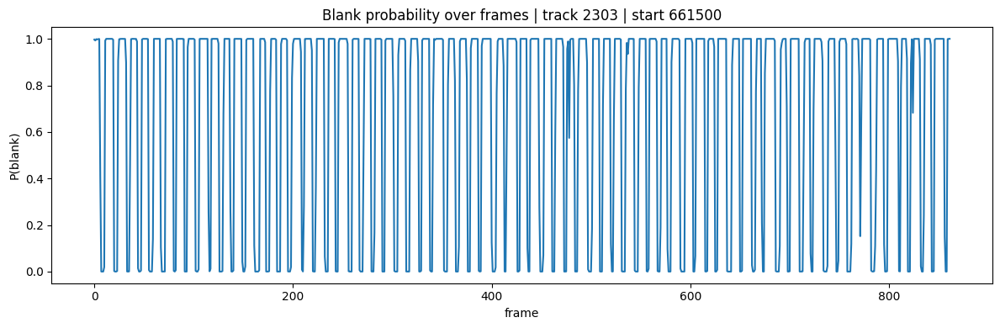

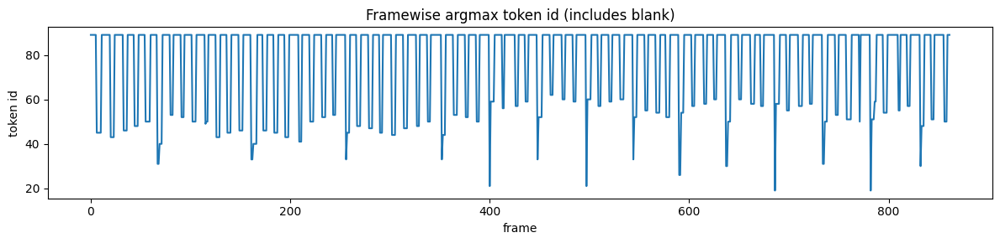

Target len: 90 | Pred len: 88
Target (first 40): [45, 22, 43, 46, 48, 50, 31, 40, 53, 52, 50, 21, 49, 43, 45, 46, 33, 40, 46, 45, 43, 21, 41, 50, 52, 53, 33, 45, 48, 47, 45, 21, 44, 47, 48, 50, 33, 44, 53, 52]
Pred   (first 40): [45, 43, 46, 48, 50, 31, 40, 53, 52, 50, 49, 50, 43, 45, 46, 33, 40, 46, 45, 43, 41, 50, 52, 53, 33, 45, 48, 47, 45, 44, 47, 48, 50, 33, 44, 53, 52, 50, 21, 59]
RANK 2/10
track_id=2303 start_samp=661500 end_samp=1102500
F1=0.9663 TER=0.0667 len_ratio=0.978
tgt_len=90 pred_len=88
TARGET (first 60): 45 22 43 46 48 50 31 40 53 52 50 21 49 43 45 46 33 40 46 45 43 21 41 50 52 53 33 45 48 47 45 21 44 47 48 50 33 44 53 52 50 21 59 56 57 59 33 52 62 60 59 21 60 57 59 60 33 52 55 54
PRED   (first 60): 45 43 46 48 50 31 40 53 52 50 49 50 43 45 46 33 40 46 45 43 41 50 52 53 33 45 48 47 45 44 47 48 50 33 44 53 52 50 21 59 56 57 59 33 52 62 60 59 21 60 57 59 60 33 52 55 54 52 26 54
--------------------------------------------------------------------------------


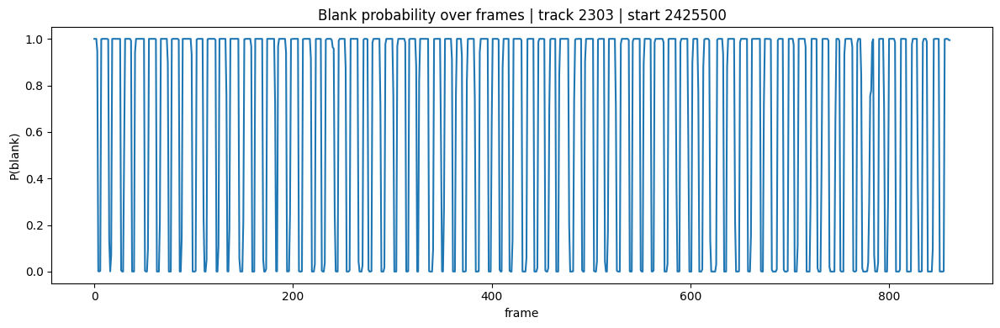

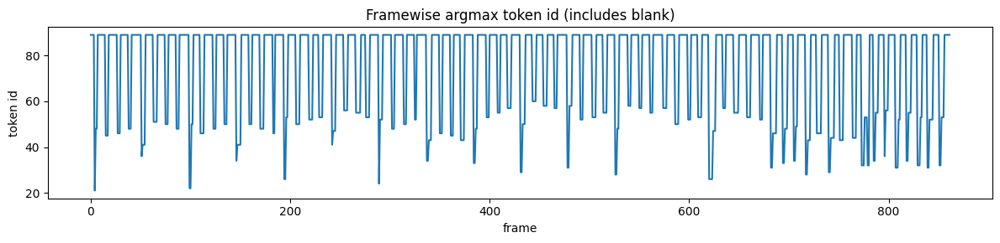

Target len: 103 | Pred len: 100
Target (first 40): [21, 48, 45, 46, 48, 36, 41, 51, 50, 48, 22, 50, 46, 48, 50, 34, 41, 50, 48, 46, 26, 53, 50, 51, 53, 41, 47, 56, 55, 53, 24, 52, 48, 50, 52, 34, 43, 46, 45, 43]
Pred   (first 40): [21, 48, 45, 46, 48, 36, 41, 51, 50, 48, 22, 50, 46, 48, 50, 34, 41, 50, 48, 46, 26, 53, 50, 52, 53, 41, 47, 56, 55, 53, 24, 52, 48, 50, 52, 34, 43, 46, 45, 43]
RANK 3/10
track_id=2303 start_samp=2425500 end_samp=2866500
F1=0.9655 TER=0.0583 len_ratio=0.971
tgt_len=103 pred_len=100
TARGET (first 60): 21 48 45 46 48 36 41 51 50 48 22 50 46 48 50 34 41 50 48 46 26 53 50 51 53 41 47 56 55 53 24 52 48 50 52 34 43 46 45 43 33 48 53 55 57 29 50 60 58 57 31 58 52 53 55 28 48 58 57 55
PRED   (first 60): 21 48 45 46 48 36 41 51 50 48 22 50 46 48 50 34 41 50 48 46 26 53 50 52 53 41 47 56 55 53 24 52 48 50 52 34 43 46 45 43 33 48 53 55 57 29 50 60 58 57 31 58 52 53 55 28 48 58 57 55
--------------------------------------------------------------------------------


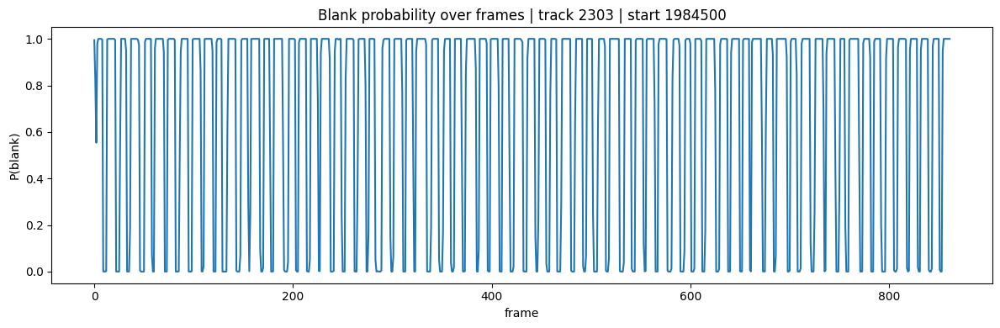

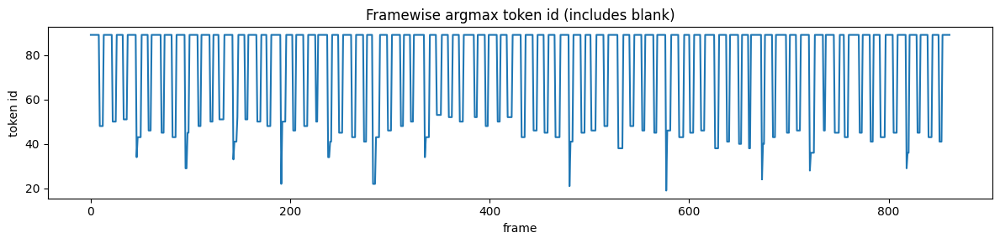

Target len: 88 | Pred len: 84
Target (first 40): [48, 50, 51, 34, 43, 46, 45, 43, 29, 45, 48, 50, 51, 33, 41, 51, 50, 48, 22, 50, 46, 48, 50, 34, 41, 45, 43, 41, 22, 43, 46, 48, 50, 34, 43, 53, 52, 50, 22, 52]
Pred   (first 40): [48, 50, 51, 34, 43, 46, 45, 43, 29, 45, 48, 50, 51, 33, 41, 52, 51, 50, 48, 22, 50, 46, 48, 50, 34, 41, 45, 43, 41, 22, 43, 46, 48, 50, 34, 43, 53, 52, 50, 52]
RANK 4/10
track_id=2303 start_samp=1984500 end_samp=2425500
F1=0.9651 TER=0.0682 len_ratio=0.955
tgt_len=88 pred_len=84
TARGET (first 60): 48 50 51 34 43 46 45 43 29 45 48 50 51 33 41 51 50 48 22 50 46 48 50 34 41 45 43 41 22 43 46 48 50 34 43 53 52 50 22 52 48 50 52 28 43 46 45 43 21 41 45 46 48 29 38 48 46 45 19 46
PRED   (first 60): 48 50 51 34 43 46 45 43 29 45 48 50 51 33 41 52 51 50 48 22 50 46 48 50 34 41 45 43 41 22 43 46 48 50 34 43 53 52 50 52 48 50 52 43 46 45 43 21 41 45 46 48 38 48 46 45 19 46 43 45
--------------------------------------------------------------------------------


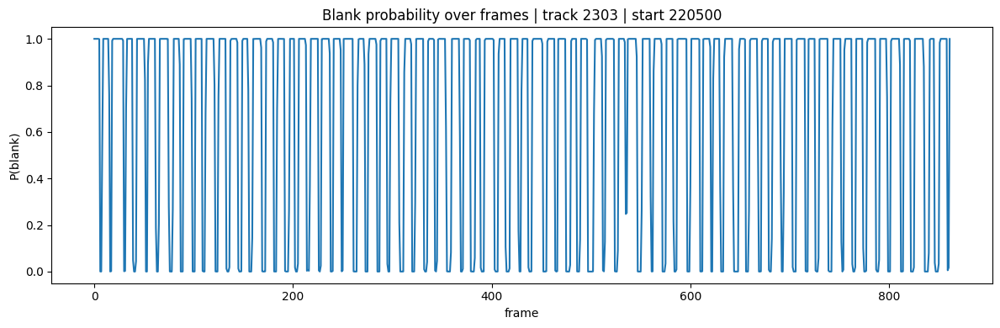

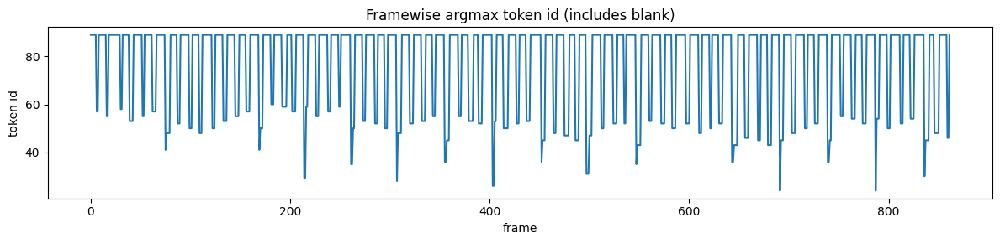

Target len: 91 | Pred len: 88
Target (first 40): [57, 55, 29, 57, 53, 55, 57, 41, 48, 52, 50, 48, 29, 50, 53, 55, 57, 41, 50, 60, 59, 57, 29, 59, 55, 57, 59, 35, 50, 53, 52, 50, 28, 48, 52, 53, 55, 36, 45, 55]
Pred   (first 40): [57, 55, 58, 53, 55, 57, 41, 48, 52, 50, 48, 50, 53, 55, 57, 41, 50, 60, 59, 57, 29, 59, 55, 57, 59, 35, 50, 53, 52, 50, 28, 48, 52, 53, 55, 36, 45, 55, 53, 52]
RANK 5/10
track_id=2303 start_samp=220500 end_samp=661500
F1=0.9609 TER=0.0549 len_ratio=0.967
tgt_len=91 pred_len=88
TARGET (first 60): 57 55 29 57 53 55 57 41 48 52 50 48 29 50 53 55 57 41 50 60 59 57 29 59 55 57 59 35 50 53 52 50 28 48 52 53 55 36 45 55 53 52 26 53 50 52 53 36 45 48 47 45 31 47 50 52 53 35 43 53
PRED   (first 60): 57 55 58 53 55 57 41 48 52 50 48 50 53 55 57 41 50 60 59 57 29 59 55 57 59 35 50 53 52 50 28 48 52 53 55 36 45 55 53 52 26 53 50 52 53 36 45 48 47 45 31 47 50 52 52 35 43 53 52 50
--------------------------------------------------------------------------------


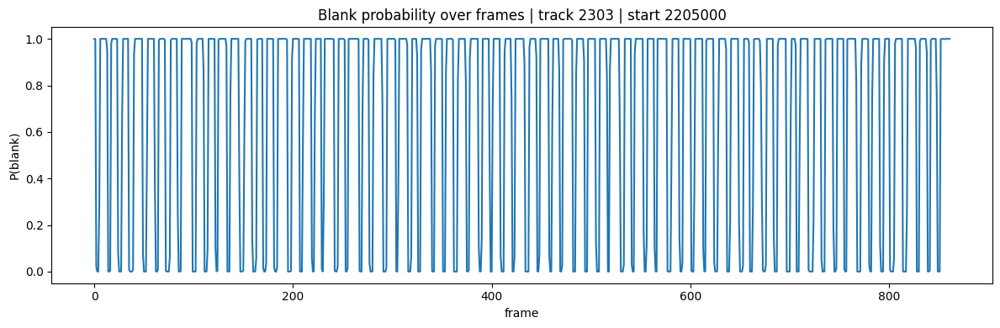

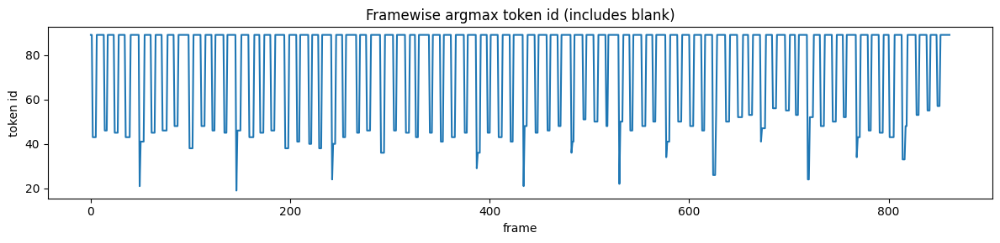

Target len: 90 | Pred len: 85
Target (first 40): [28, 43, 46, 45, 43, 21, 41, 45, 46, 48, 29, 38, 48, 46, 45, 19, 46, 43, 45, 46, 29, 38, 41, 40, 38, 24, 40, 43, 45, 46, 28, 36, 46, 45, 43, 17, 45, 41, 43, 45]
Pred   (first 40): [43, 46, 45, 43, 21, 41, 45, 46, 48, 38, 48, 46, 45, 19, 46, 43, 45, 46, 38, 41, 40, 38, 24, 40, 43, 45, 46, 36, 46, 45, 43, 45, 41, 43, 45, 29, 36, 45, 43, 41]
RANK 6/10
track_id=2303 start_samp=2205000 end_samp=2646000
F1=0.9600 TER=0.0667 len_ratio=0.944
tgt_len=90 pred_len=85
TARGET (first 60): 28 43 46 45 43 21 41 45 46 48 29 38 48 46 45 19 46 43 45 46 29 38 41 40 38 24 40 43 45 46 28 36 46 45 43 17 45 41 43 45 29 36 45 43 41 21 48 45 46 48 36 41 51 50 48 22 50 46 48 50
PRED   (first 60): 43 46 45 43 21 41 45 46 48 38 48 46 45 19 46 43 45 46 38 41 40 38 24 40 43 45 46 36 46 45 43 45 41 43 45 29 36 45 43 41 21 48 45 46 48 36 41 51 50 48 22 50 46 48 50 34 41 50 48 46
--------------------------------------------------------------------------------


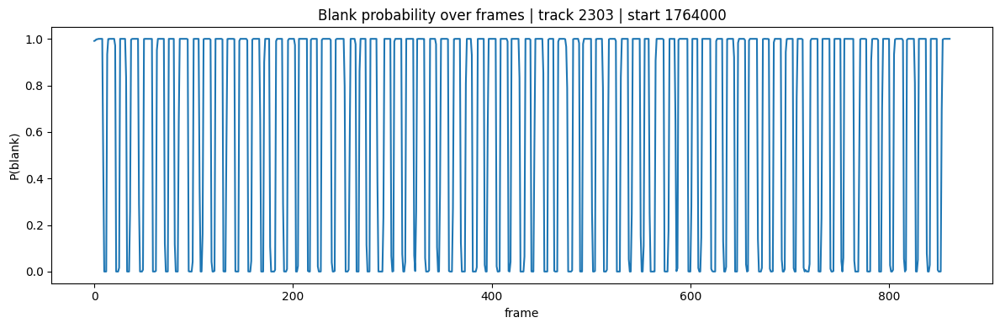

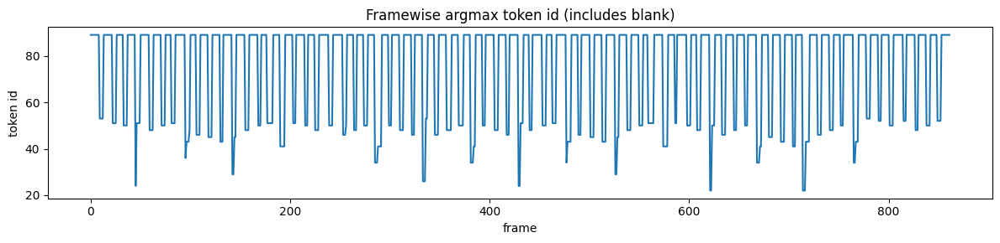

Target len: 90 | Pred len: 86
Target (first 40): [35, 43, 53, 51, 50, 24, 51, 48, 50, 51, 36, 43, 46, 45, 43, 29, 45, 48, 50, 51, 33, 41, 51, 50, 48, 22, 50, 46, 48, 50, 34, 41, 50, 48, 46, 26, 53, 46, 48, 50]
Pred   (first 40): [53, 51, 50, 24, 51, 48, 50, 51, 36, 43, 48, 46, 45, 43, 29, 45, 48, 50, 51, 41, 51, 50, 48, 50, 46, 50, 48, 50, 34, 41, 50, 48, 46, 26, 53, 46, 48, 50, 34, 41]
RANK 7/10
track_id=2303 start_samp=1764000 end_samp=2205000
F1=0.9545 TER=0.0889 len_ratio=0.956
tgt_len=90 pred_len=86
TARGET (first 60): 35 43 53 51 50 24 51 48 50 51 36 43 46 45 43 29 45 48 50 51 33 41 51 50 48 22 50 46 48 50 34 41 50 48 46 26 53 46 48 50 34 41 50 48 46 24 51 48 50 51 34 43 46 45 43 29 45 48 50 51
PRED   (first 60): 53 51 50 24 51 48 50 51 36 43 48 46 45 43 29 45 48 50 51 41 51 50 48 50 46 50 48 50 34 41 50 48 46 26 53 46 48 50 34 41 50 48 46 24 51 48 50 51 34 43 46 45 43 29 45 48 50 51 41 51
--------------------------------------------------------------------------------


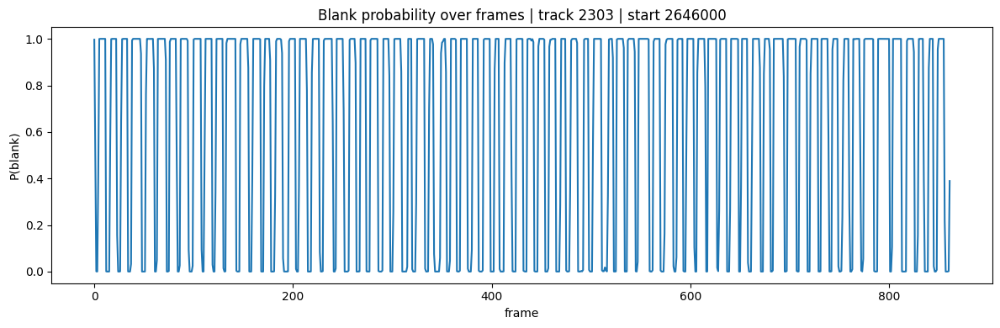

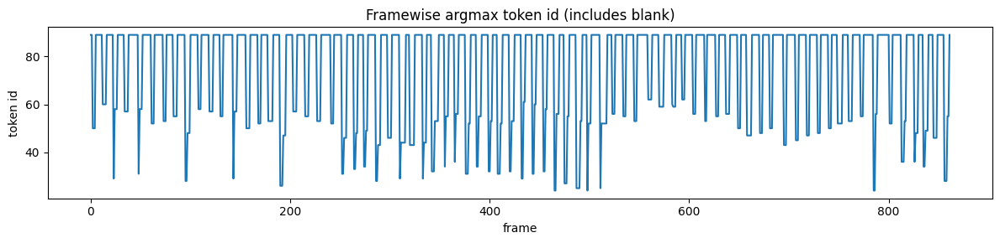

Target len: 108 | Pred len: 109
Target (first 40): [29, 50, 60, 58, 57, 31, 58, 52, 53, 55, 28, 48, 58, 57, 55, 29, 57, 50, 52, 53, 26, 47, 57, 55, 53, 52, 31, 46, 33, 48, 34, 49, 28, 43, 31, 46, 29, 44, 28, 43]
Pred   (first 40): [50, 60, 29, 58, 57, 31, 58, 52, 53, 55, 28, 48, 58, 57, 55, 29, 57, 50, 52, 53, 26, 47, 57, 55, 53, 52, 31, 46, 33, 48, 34, 49, 28, 43, 46, 29, 44, 43, 29, 44]
RANK 8/10
track_id=2303 start_samp=2646000 end_samp=3087000
F1=0.9493 TER=0.0926 len_ratio=1.009
tgt_len=108 pred_len=109
TARGET (first 60): 29 50 60 58 57 31 58 52 53 55 28 48 58 57 55 29 57 50 52 53 26 47 57 55 53 52 31 46 33 48 34 49 28 43 31 46 29 44 28 43 29 44 32 53 34 55 36 56 31 52 34 55 32 53 31 52 32 53 29 61
PRED   (first 60): 50 60 29 58 57 31 58 52 53 55 28 48 58 57 55 29 57 50 52 53 26 47 57 55 53 52 31 46 33 48 34 49 28 43 46 29 44 43 29 44 32 53 34 55 36 56 31 52 34 55 32 53 31 52 32 53 29 61 31 60
--------------------------------------------------------------------------------


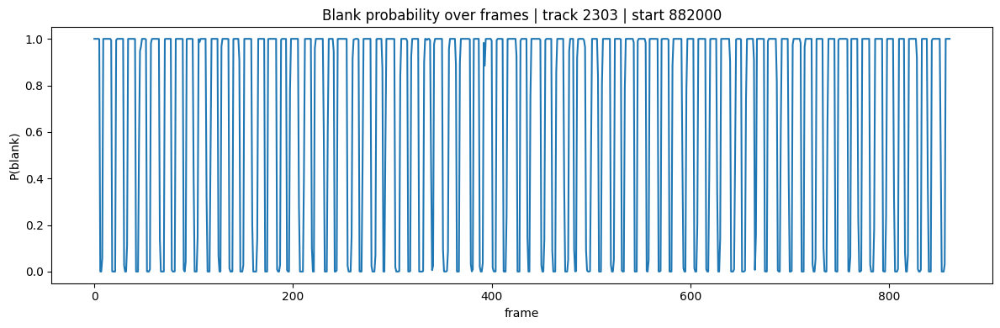

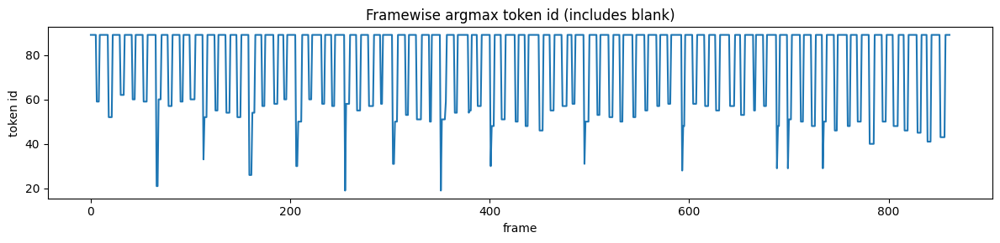

Target len: 90 | Pred len: 87
Target (first 40): [59, 33, 52, 62, 60, 59, 21, 60, 57, 59, 60, 33, 52, 55, 54, 52, 26, 54, 57, 58, 60, 30, 50, 60, 58, 57, 19, 58, 55, 57, 58, 31, 50, 53, 51, 50, 19, 51, 54, 55]
Pred   (first 40): [59, 52, 62, 60, 59, 21, 60, 57, 59, 60, 33, 52, 55, 54, 52, 26, 54, 57, 58, 60, 30, 50, 60, 58, 57, 19, 58, 55, 57, 58, 31, 50, 53, 51, 50, 19, 51, 59, 54, 54]
RANK 9/10
track_id=2303 start_samp=882000 end_samp=1323000
F1=0.9492 TER=0.1111 len_ratio=0.967
tgt_len=90 pred_len=87
TARGET (first 60): 59 33 52 62 60 59 21 60 57 59 60 33 52 55 54 52 26 54 57 58 60 30 50 60 58 57 19 58 55 57 58 31 50 53 51 50 19 51 54 55 57 30 48 51 50 48 19 46 55 57 58 31 50 53 52 50 24 52 55 57
PRED   (first 60): 59 52 62 60 59 21 60 57 59 60 33 52 55 54 52 26 54 57 58 60 30 50 60 58 57 19 58 55 57 58 31 50 53 51 50 19 51 59 54 54 55 57 30 48 51 50 48 46 55 57 58 31 50 53 52 50 52 55 57 58
--------------------------------------------------------------------------------


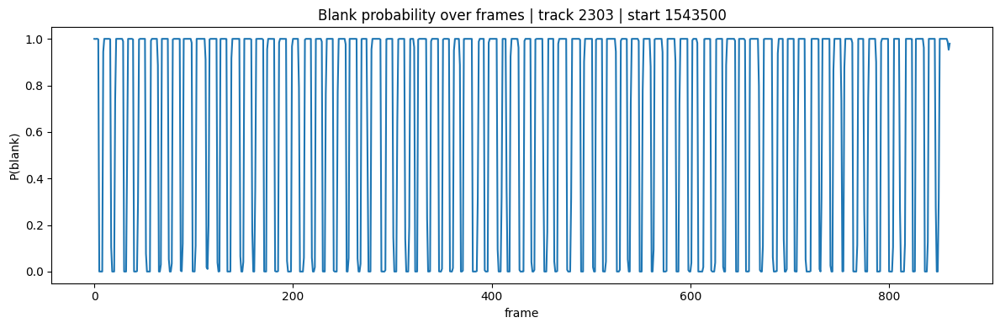

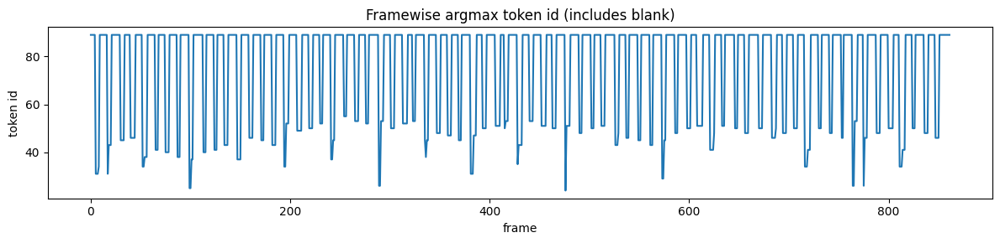

Target len: 92 | Pred len: 93
Target (first 40): [31, 34, 43, 45, 46, 34, 38, 41, 40, 38, 26, 37, 40, 41, 43, 31, 37, 46, 45, 43, 34, 52, 49, 50, 52, 37, 45, 55, 53, 52, 26, 53, 50, 52, 53, 38, 45, 48, 47, 45]
Pred   (first 40): [31, 34, 31, 43, 45, 46, 34, 38, 41, 40, 38, 25, 37, 40, 41, 43, 37, 46, 45, 43, 34, 52, 49, 50, 52, 37, 45, 55, 53, 52, 26, 53, 50, 52, 53, 45, 38, 45, 48, 47]
RANK 10/10
track_id=2303 start_samp=1543500 end_samp=1984500
F1=0.9405 TER=0.1522 len_ratio=1.011
tgt_len=92 pred_len=93
TARGET (first 60): 31 34 43 45 46 34 38 41 40 38 26 37 40 41 43 31 37 46 45 43 34 52 49 50 52 37 45 55 53 52 26 53 50 52 53 38 45 48 47 45 31 47 50 51 53 35 43 53 51 50 24 51 48 50 51 36 43 46 45 43
PRED   (first 60): 31 34 31 43 45 46 34 38 41 40 38 25 37 40 41 43 37 46 45 43 34 52 49 50 52 37 45 55 53 52 26 53 50 52 53 45 38 45 48 47 45 31 47 50 51 50 53 35 43 53 51 50 24 51 48 50 51 43 48 46
--------------------------------------------------------------------------------
Best-segme

In [31]:
# BEST SEGMENTS BLOCK: qualitative gallery of good outputs
# - Finds top-N test segments by token F1 (or lowest TER)
# - Saves alignment plots + prints compact target vs pred
# - Uses greedy decoding with the run's chosen alpha
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json

# Preconditions
assert "RUN_DIR" in globals(), "RUN_DIR not found."
assert "model" in globals(), "model not found (load checkpoint first)."
assert "test_loader" in globals(), "test_loader not found."
assert "alpha" in globals(), "alpha not found."
assert "greedy_decode" in globals(), "greedy_decode not found."
assert "CTC_BLANK_ID" in globals(), "CTC_BLANK_ID not found."
assert "DEVICE" in globals(), "DEVICE not found."
assert "eval_sequence_metrics" in globals(), "eval_sequence_metrics not found."
assert "plot_alignment_sanity" in globals(), "plot_alignment_sanity not found."

GOOD_DIR = Path(RUN_DIR) / "figs" / "best_segments"
GOOD_DIR.mkdir(parents=True, exist_ok=True)

# Read run summary to confirm alpha/key
summary = json.loads((Path(RUN_DIR) / "summary.json").read_text(encoding="utf-8"))
print("Run:", summary.get("run_name", "unknown"), "| test key:", summary.get("test_best_key", None), "| alpha:", alpha)

# Decode test set and compute per-segment metrics
model.eval()

rows = []
bank = []  # store minimal data to later re-plot exact segments without re-decoding whole dataset

with torch.no_grad():
    for X, x_lens, y_pad, y_lens, metas in test_loader:
        X_dev = X.to(DEVICE, non_blocking=True)
        x_lens_dev = x_lens.to(DEVICE)

        log_probs, out_lens = model(X_dev, x_lens_dev)

        for i in range(log_probs.shape[0]):
            ol = int(out_lens[i].item())
            tgt = y_pad[i, :y_lens[i]].cpu().tolist()
            pred = greedy_decode(log_probs[i], ol, CTC_BLANK_ID, alpha=float(alpha))
            m = eval_sequence_metrics(pred, tgt)

            meta = metas[i]
            row = {
                "track_id": int(meta["track_id"]),
                "seg_start_samp": int(meta["seg_start_samp"]),
                "seg_end_samp": int(meta["seg_end_samp"]),
                "n_tokens": int(len(tgt)),
                "pred_len": int(len(pred)),
                "F1": float(m["token_F1"]),
                "TER": float(m["TER"]),
                "len_ratio": float(m["len_ratio"]),
            }
            rows.append(row)

            # store enough to reproduce plots later
            bank.append({
                "meta": meta,
                "log_probs": log_probs[i].detach().cpu(),   # (T,V)
                "out_len": ol,
                "tgt": tgt,
                "pred": pred
            })

df_seg = pd.DataFrame(rows)
display(df_seg.describe())

df_seg.to_csv(Path(RUN_DIR) / "best_segments_scores_all_test.csv", index=False)
print("Saved:", Path(RUN_DIR) / "best_segments_scores_all_test.csv")

# -------------------------------------------------------------------
# Selecting best segments
# Criteria: highest F1, tie-breaker lowest TER, then closest len_ratio to 1
# -------------------------------------------------------------------
N_SHOW = 10
best = df_seg.sort_values(["F1", "TER", "len_ratio"], ascending=[False, True, True]).head(N_SHOW).reset_index(drop=True)
display(best)

best.to_csv(Path(RUN_DIR) / "best_segments_top10.csv", index=False)
print("Saved:", Path(RUN_DIR) / "best_segments_top10.csv")

# -------------------------------------------------------------------
# Utility: find bank entry by (track_id, seg_start_samp)
# -------------------------------------------------------------------
def find_bank_entry(track_id: int, seg_start_samp: int):
    for e in bank:
        m = e["meta"]
        if int(m["track_id"]) == int(track_id) and int(m["seg_start_samp"]) == int(seg_start_samp):
            return e
    return None

# -------------------------------------------------------------------
# Create qualitative gallery
# - For each best segment: saving blank prob plot, argmax plot, and printing sequences
# -------------------------------------------------------------------
for k in range(len(best)):
    tid = int(best.loc[k, "track_id"])
    ss  = int(best.loc[k, "seg_start_samp"])

    entry = find_bank_entry(tid, ss)
    if entry is None:
        print("Could not find segment in bank:", tid, ss)
        continue

    meta = entry["meta"]
    lp1 = entry["log_probs"]
    out_len = int(entry["out_len"])
    tgt = entry["tgt"]
    pred = entry["pred"]

    seg_dir = GOOD_DIR / f"rank{k+1:02d}_tid{tid}_start{ss}"
    seg_dir.mkdir(parents=True, exist_ok=True)

    # Saving alignment sanity plots + print sequences (also saves blank prob/argmax figs)
    plot_alignment_sanity(lp1, out_len, meta, tgt, pred, save_dir=seg_dir)

    # Additionally: plot "agreement" view (token stream comparison in compact form)
    # We show first 60 tokens of tgt/pred (pitch ids)
    tgt_short = tgt[:60]
    pred_short = pred[:60]

    txt = []
    txt.append(f"RANK {k+1}/{len(best)}")
    txt.append(f"track_id={tid} start_samp={ss} end_samp={int(meta['seg_end_samp'])}")
    txt.append(f"F1={best.loc[k,'F1']:.4f} TER={best.loc[k,'TER']:.4f} len_ratio={best.loc[k,'len_ratio']:.3f}")
    txt.append(f"tgt_len={len(tgt)} pred_len={len(pred)}")
    txt.append("TARGET (first 60): " + " ".join(map(str, tgt_short)))
    txt.append("PRED   (first 60): " + " ".join(map(str, pred_short)))

    (seg_dir / "summary.txt").write_text("\n".join(txt), encoding="utf-8")
    print("\n".join(txt))
    print("-"*80)

print("Best-segment gallery saved under:", GOOD_DIR)


,track_id,seg_start_samp,seg_end_samp,n_tokens,pred_len,F1,TER,len_ratio,composer,composition
0,1759,0,441000,95,60,0.722581,0.536842,0.631579,Schubert,Piano Sonata in C minor
1,1759,220500,661500,127,103,0.747826,0.543307,0.811024,Schubert,Piano Sonata in C minor
2,1759,441000,882000,129,107,0.754237,0.550388,0.829457,Schubert,Piano Sonata in C minor
3,1759,661500,1102500,128,103,0.805195,0.492188,0.804688,Schubert,Piano Sonata in C minor
4,1759,882000,1323000,119,95,0.757009,0.605042,0.798319,Schubert,Piano Sonata in C minor


,composer,n_segments,F1_mean,F1_std,TER_mean,n_tokens_mean
4,Schubert,37,0.766641,0.049465,0.534383,90.486486
0,Bach,65,0.761222,0.129964,0.617312,66.230769
3,Mozart,34,0.758410,0.053833,0.612297,70.470588
2,Haydn,44,0.679474,0.097944,0.946564,88.409091
1,Beethoven,100,0.666739,0.099738,0.727637,118.880000


,composer,n_segments,F1_mean,F1_std,TER_mean,n_tokens_mean
4,Schubert,37,0.766641,0.049465,0.534383,90.486486
0,Bach,65,0.761222,0.129964,0.617312,66.230769
3,Mozart,34,0.758410,0.053833,0.612297,70.470588
2,Haydn,44,0.679474,0.097944,0.946564,88.409091
1,Beethoven,100,0.666739,0.099738,0.727637,118.880000


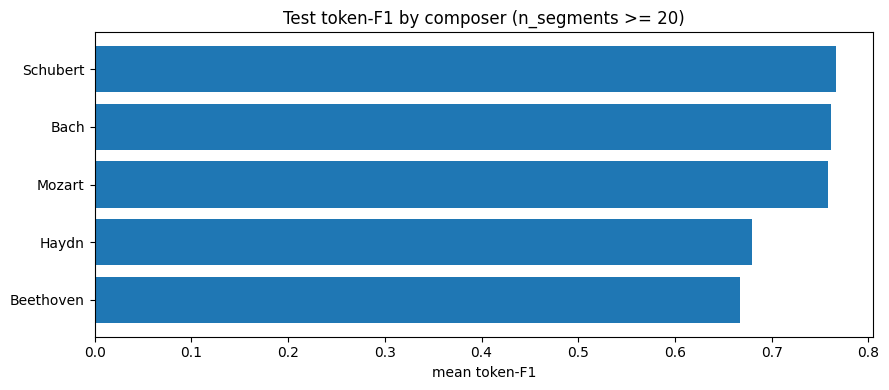

,composer,composition,n_segments,F1_mean,TER_mean
2,Bach,"WTK I, No. 5: Prelude and Fugue in D major",17,0.918009,0.252647
1,Bach,Violin Partita No 3 in E major,19,0.786126,0.566089
9,Schubert,Piano Sonata in C minor,37,0.766641,0.534383
8,Mozart,Serenade in E-flat major,34,0.758410,0.612297
3,Beethoven,Piano Sonata No 30 in E major,29,0.717257,0.530805
4,Beethoven,Sextet in E-flat major for Winds,26,0.696041,0.723771
7,Haydn,Quartet No 53 in D major,44,0.679474,0.946564
0,Bach,Cello Suite 4,29,0.652997,0.864640
6,Beethoven,Violin Sonata No 10 in G major,23,0.649306,0.929802
5,Beethoven,String Quartet No 13 in B-flat major,22,0.583742,0.780315


,composer,composition,n_segments,F1_mean,TER_mean
2,Bach,"WTK I, No. 5: Prelude and Fugue in D major",17,0.918009,0.252647
1,Bach,Violin Partita No 3 in E major,19,0.786126,0.566089
9,Schubert,Piano Sonata in C minor,37,0.766641,0.534383
8,Mozart,Serenade in E-flat major,34,0.758410,0.612297
3,Beethoven,Piano Sonata No 30 in E major,29,0.717257,0.530805
4,Beethoven,Sextet in E-flat major for Winds,26,0.696041,0.723771
7,Haydn,Quartet No 53 in D major,44,0.679474,0.946564
0,Bach,Cello Suite 4,29,0.652997,0.864640
6,Beethoven,Violin Sonata No 10 in G major,23,0.649306,0.929802
5,Beethoven,String Quartet No 13 in B-flat major,22,0.583742,0.780315


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/composer_segment_summary.csv /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/work_segment_summary.csv /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/worst_30_segments_with_composer.csv /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/best_30_segments_with_composer.csv


In [32]:
# Composer / work breakdown on TEST segments
# - Joins segment-level scores with metadata (composer/composition)
# - Reports best/worst composers and works
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals(), "RUN_DIR not found."
assert "META_PATH" in globals(), "META_PATH not found."

scores_path = Path(RUN_DIR) / "best_segments_scores_all_test.csv"
assert scores_path.exists(), f"Missing: {scores_path}. Run best-segments block (or Block A) first."

seg = pd.read_csv(scores_path)
meta = pd.read_csv(META_PATH)

# robust columns
meta["id"] = meta["id"].astype(int)
if "composer" not in meta.columns:
    meta["composer"] = "UNKNOWN_COMPOSER"
if "composition" not in meta.columns:
    meta["composition"] = meta["id"].astype(str)

seg["track_id"] = seg["track_id"].astype(int)
joined = seg.merge(meta[["id","composer","composition"]], left_on="track_id", right_on="id", how="left")
joined.drop(columns=["id"], inplace=True)

display(joined.head())

# Composer summary (require enough segments for stability)
min_n = 20
comp = joined.groupby("composer").agg(
    n_segments=("F1","count"),
    F1_mean=("F1","mean"),
    F1_std=("F1","std"),
    TER_mean=("TER","mean"),
    n_tokens_mean=("n_tokens","mean")
).reset_index()

comp = comp.sort_values("F1_mean", ascending=False)
display(comp.head(15))
display(comp.tail(15))

comp.to_csv(Path(RUN_DIR) / "composer_segment_summary.csv", index=False)

# Plot composers with enough segments
comp_plot = comp[comp["n_segments"] >= min_n].copy().sort_values("F1_mean", ascending=True)

plt.figure(figsize=(9, max(4, 0.25*len(comp_plot))))
plt.barh(comp_plot["composer"], comp_plot["F1_mean"].values)
plt.title(f"Test token-F1 by composer (n_segments >= {min_n})")
plt.xlabel("mean token-F1")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "composer_f1_bar.png", dpi=160)
plt.show()

# Work-level (composition) best/worst
work = joined.groupby(["composer","composition"]).agg(
    n_segments=("F1","count"),
    F1_mean=("F1","mean"),
    TER_mean=("TER","mean"),
).reset_index()

work = work[work["n_segments"] >= 10].sort_values("F1_mean", ascending=False)
display(work.head(15))
display(work.tail(15))

work.to_csv(Path(RUN_DIR) / "work_segment_summary.csv", index=False)

# Worst segments with composer annotation (report table)
worst = joined.sort_values("TER", ascending=False).head(30)
best  = joined.sort_values(["F1","TER"], ascending=[False, True]).head(30)

worst.to_csv(Path(RUN_DIR) / "worst_30_segments_with_composer.csv", index=False)
best.to_csv(Path(RUN_DIR) / "best_30_segments_with_composer.csv", index=False)

print("Saved:",
      Path(RUN_DIR) / "composer_segment_summary.csv",
      Path(RUN_DIR) / "work_segment_summary.csv",
      Path(RUN_DIR) / "worst_30_segments_with_composer.csv",
      Path(RUN_DIR) / "best_30_segments_with_composer.csv")


,track_id,seg_start_samp,seg_end_samp,n_tokens,pred_len,F1,TER,len_ratio,n_events,onset_density,instrument_count,pitch_min,pitch_max,pitch_span,pc_entropy_norm,poly_mean,poly_p95,poly_max,chord_mean,chord_max
count,280.000000,2.800000e+02,2.800000e+02,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000
mean,2202.867857,3.229538e+06,3.670538e+06,92.239286,104.675000,0.715007,0.696886,1.200997,93.946429,9.394643,1.950000,41.400000,81.257143,39.857143,0.806869,2.153854,3.773214,4.200000,2.097356,3.903571
std,285.921262,2.199778e+06,2.199778e+06,38.277752,37.090388,0.107964,0.380019,0.411920,38.469100,3.846910,0.941478,7.375052,8.441977,11.612360,0.057869,0.815146,1.605484,1.878763,0.728638,1.613559
min,1759.000000,0.000000e+00,4.410000e+05,8.000000,21.000000,0.258621,0.036145,0.631579,8.000000,0.800000,1.000000,28.000000,58.000000,14.000000,0.599387,0.784810,1.000000,1.000000,1.000000,1.000000
25%,1819.000000,1.488375e+06,1.929375e+06,67.750000,81.000000,0.665865,0.530678,0.966497,68.000000,6.800000,1.000000,38.000000,79.000000,35.750000,0.768684,1.656501,3.000000,4.000000,1.535377,3.000000
50%,2298.000000,2.976750e+06,3.417750e+06,86.500000,97.000000,0.719826,0.639234,1.136529,88.000000,8.800000,2.000000,39.000000,83.000000,41.000000,0.812419,2.208735,4.000000,4.000000,2.092624,4.000000
75%,2416.000000,4.630500e+06,5.071500e+06,109.000000,123.000000,0.776341,0.837010,1.386489,110.250000,11.025000,3.000000,44.000000,84.500000,46.000000,0.844921,2.603226,4.000000,5.000000,2.609064,5.000000
max,2628.000000,9.481500e+06,9.922500e+06,241.000000,212.000000,0.975610,4.833333,5.444444,244.000000,24.400000,3.000000,65.000000,95.000000,67.000000,0.935179,5.000000,8.000000,10.000000,4.000000,9.000000


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/segment_features_with_scores.csv
onset_density    | Spearman rho(F1)=-0.042 | rho(TER)=-0.006
poly_p95         | Spearman rho(F1)=+0.016 | rho(TER)=-0.009
chord_max        | Spearman rho(F1)=+0.015 | rho(TER)=-0.019
instrument_count | Spearman rho(F1)=-0.264 | rho(TER)=+0.381
pitch_span       | Spearman rho(F1)=-0.065 | rho(TER)=-0.037
pc_entropy_norm  | Spearman rho(F1)=+0.060 | rho(TER)=-0.013


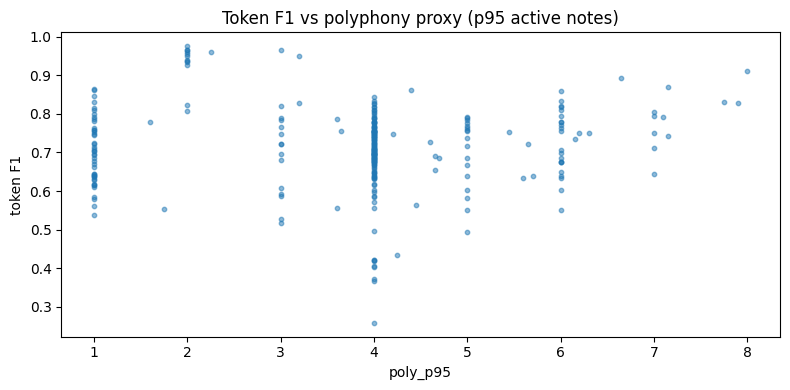

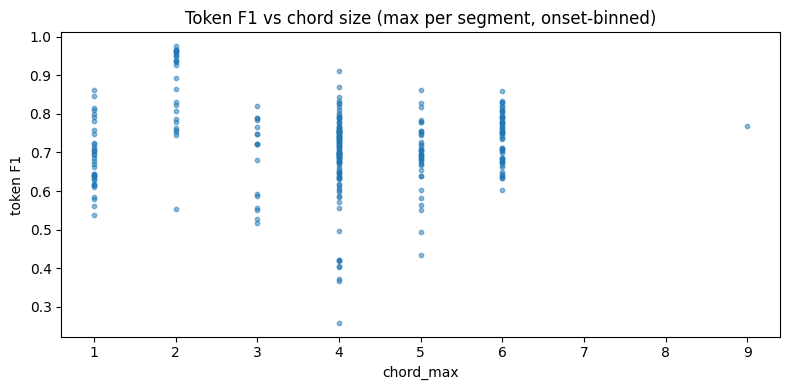

/tmp/ipykernel_14396/1932017169.py:176: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bins = [g["F1"].values for _, g in joined.groupby("poly_bin")]


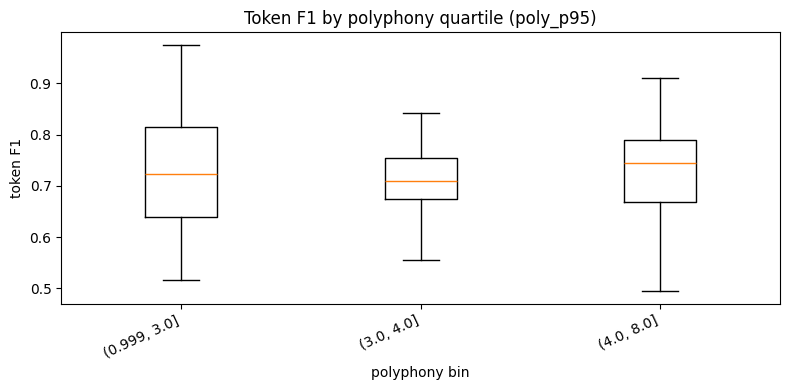

In [38]:
# Segment-level musical complexity vs performance
# - Computes polyphony proxy, chord-size stats, onset density, pitch span, pitch-class entropy, instrument count
# - Correlates with F1/TER and plots key relationships
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from collections import Counter

assert "RUN_DIR" in globals()
assert "TEST_LABEL_DIR" in globals()
assert "CFG" in globals() and hasattr(CFG, "sr"), "CFG.sr required"
assert "read_label_csv" in globals(), "read_label_csv required"

scores_path = Path(RUN_DIR) / "best_segments_scores_all_test.csv"
seg = pd.read_csv(scores_path)

SR = int(CFG.sr)
SEG_DUR_S = 10.0  # the segmentation
TOL_MS = 20       # chord onset bin tolerance
TOL_SAMP = int((TOL_MS / 1000.0) * SR)

def polyphony_stats_segment(df_seg: pd.DataFrame) -> dict:
    # sweep over event boundaries in this segment
    events = []
    for s in df_seg["start_time"].values:
        events.append((int(s), +1))
    for e in df_seg["end_time"].values:
        events.append((int(e), -1))
    events.sort(key=lambda x: (x[0], -x[1]))

    active = 0
    active_vals = []
    last_t = None
    for t, d in events:
        if last_t is not None and t != last_t:
            active_vals.append(active)
        active += d
        last_t = t

    if not active_vals:
        return {"poly_mean": 0.0, "poly_p95": 0.0, "poly_max": 0.0}
    arr = np.asarray(active_vals, dtype=np.float32)
    return {
        "poly_mean": float(arr.mean()),
        "poly_p95": float(np.percentile(arr, 95)),
        "poly_max": float(arr.max()),
    }

def chord_size_stats(df_seg: pd.DataFrame, tol_samp: int) -> dict:
    if len(df_seg) == 0:
        return {"chord_mean": 0.0, "chord_max": 0.0}
    # bin onsets by tolerance window
    bins = (df_seg["start_time"].astype(int) // max(1, tol_samp)).values
    counts = Counter(bins)
    sizes = np.asarray(list(counts.values()), dtype=np.float32)
    return {"chord_mean": float(sizes.mean()), "chord_max": float(sizes.max())}

def pitch_class_entropy(notes: np.ndarray, eps: float = 1e-12) -> float:
    """
    Normalized pitch-class entropy in [0,1].
    Stable for zeros (no log(0) warnings).
    """
    if len(notes) == 0:
        return 0.0

    pcs = (notes % 12).astype(int)
    h = np.bincount(pcs, minlength=12).astype(np.float64)
    total = h.sum()
    if total <= 0:
        return 0.0

    p = h / total

    # Mask zeros to avoid log(0) warnings
    mask = p > 0
    ent = -(p[mask] * np.log(p[mask])).sum()

    # Normalize by max entropy log(12)
    ent_norm = ent / np.log(12.0)

    # Defensive: avoid returning nan due to numerical edge cases
    if not np.isfinite(ent_norm):
        return 0.0
    return float(ent_norm)


rows = []
for _, r in seg.iterrows():
    tid = int(r["track_id"])
    ss  = int(r["seg_start_samp"])
    ee  = int(r["seg_end_samp"])

    lab_path = Path(TEST_LABEL_DIR) / f"{tid}.csv"
    df = read_label_csv(lab_path)

    # events whose onset is in segment
    dseg = df[(df["start_time"] >= ss) & (df["start_time"] < ee)].copy()

    n_events = int(len(dseg))
    density = float(n_events / max(1e-9, SEG_DUR_S))

    instruments = dseg["instrument"].unique().tolist() if n_events else []
    inst_count = int(len(instruments))

    # polyphony uses start/end within segment window
    dseg_clip = df[(df["end_time"] > ss) & (df["start_time"] < ee)].copy()
    # clip for sweep stability
    dseg_clip["start_time"] = np.maximum(dseg_clip["start_time"].values, ss)
    dseg_clip["end_time"]   = np.minimum(dseg_clip["end_time"].values, ee)

    poly = polyphony_stats_segment(dseg_clip)
    chord = chord_size_stats(dseg, TOL_SAMP)

    notes = dseg["note"].values.astype(int) if n_events else np.asarray([], dtype=int)
    pitch_min = int(notes.min()) if n_events else -1
    pitch_max = int(notes.max()) if n_events else -1
    pitch_span = float(pitch_max - pitch_min) if n_events else 0.0
    pc_ent = pitch_class_entropy(notes) if n_events else 0.0

    rows.append({
        "track_id": tid,
        "seg_start_samp": ss,
        "n_events": n_events,
        "onset_density": density,
        "instrument_count": inst_count,
        "pitch_min": pitch_min,
        "pitch_max": pitch_max,
        "pitch_span": pitch_span,
        "pc_entropy_norm": pc_ent,
        **poly,
        **chord,
    })

feat = pd.DataFrame(rows)
joined = seg.merge(feat, on=["track_id","seg_start_samp"], how="left")

display(joined.describe())

joined.to_csv(Path(RUN_DIR) / "segment_features_with_scores.csv", index=False)
print("Saved:", Path(RUN_DIR) / "segment_features_with_scores.csv")

# Correlations (Spearman, robust for nonlinearity)
def spearman(a, b):
    a = pd.Series(a).rank()
    b = pd.Series(b).rank()
    return float(np.corrcoef(a, b)[0,1])

for col in ["onset_density","poly_p95","chord_max","instrument_count","pitch_span","pc_entropy_norm"]:
    rho_f1 = spearman(joined[col], joined["F1"])
    rho_ter = spearman(joined[col], joined["TER"])
    print(f"{col:16s} | Spearman rho(F1)={rho_f1:+.3f} | rho(TER)={rho_ter:+.3f}")

# Key plots: F1 vs polyphony p95
plt.figure(figsize=(8,4))
plt.scatter(joined["poly_p95"], joined["F1"], s=10, alpha=0.5)
plt.title("Token F1 vs polyphony proxy (p95 active notes)")
plt.xlabel("poly_p95"); plt.ylabel("token F1")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "f1_vs_poly_p95.png", dpi=160)
plt.show()

# F1 vs chord max (simultaneous onset size)
plt.figure(figsize=(8,4))
plt.scatter(joined["chord_max"], joined["F1"], s=10, alpha=0.5)
plt.title("Token F1 vs chord size (max per segment, onset-binned)")
plt.xlabel("chord_max"); plt.ylabel("token F1")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "f1_vs_chord_max.png", dpi=160)
plt.show()

# Binned boxplot by polyphony quartiles
joined["poly_bin"] = pd.qcut(joined["poly_p95"], q=4, duplicates="drop")
bins = [g["F1"].values for _, g in joined.groupby("poly_bin")]

plt.figure(figsize=(8,4))
plt.boxplot(bins, labels=[str(x) for x in joined["poly_bin"].cat.categories], showfliers=False)
plt.title("Token F1 by polyphony quartile (poly_p95)")
plt.xlabel("polyphony bin"); plt.ylabel("token F1")
plt.xticks(rotation=25, ha="right")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "f1_box_by_poly_quartile.png", dpi=160)
plt.show()


In [41]:
#Best vs worst segments with composer + complexity metrics
# - Handles column name variations (F1 vs token_F1 vs F1_x, TER vs TER_x, etc.)
import pandas as pd
from pathlib import Path

assert "RUN_DIR" in globals()
assert "META_PATH" in globals()

scores_path = Path(RUN_DIR) / "best_segments_scores_all_test.csv"
feat_path   = Path(RUN_DIR) / "segment_features_with_scores.csv"

assert scores_path.exists(), f"Missing: {scores_path}"
assert feat_path.exists(),   f"Missing: {feat_path}"

scores = pd.read_csv(scores_path)
feat   = pd.read_csv(feat_path)
meta   = pd.read_csv(META_PATH)

# ---- helper: pick first existing column name ----
def pick_col(df, candidates):
    for c in candidates:
        if c in df.columns:
            return c
    return None

# Merge
meta["id"] = meta["id"].astype(int)
if "composer" not in meta.columns: meta["composer"] = "UNKNOWN_COMPOSER"
if "composition" not in meta.columns: meta["composition"] = meta["id"].astype(str)

df = scores.merge(feat, on=["track_id","seg_start_samp"], how="left").merge(
    meta[["id","composer","composition"]], left_on="track_id", right_on="id", how="left"
).drop(columns=["id"])

# ---- standardize metric columns to F1 / TER ----
f1_col = pick_col(df, ["F1", "token_F1", "token_f1", "F1_x", "token_F1_x"])
ter_col = pick_col(df, ["TER", "TER_x", "token_TER", "token_ter"])

if f1_col is None or ter_col is None:
    print("Available columns:\n", list(df.columns))
    raise KeyError(f"Could not find F1/TER columns. Found f1_col={f1_col}, ter_col={ter_col}")

if f1_col != "F1":
    df.rename(columns={f1_col: "F1"}, inplace=True)
if ter_col != "TER":
    df.rename(columns={ter_col: "TER"}, inplace=True)

# Ensure numeric
df["F1"]  = pd.to_numeric(df["F1"], errors="coerce")
df["TER"] = pd.to_numeric(df["TER"], errors="coerce")

# Columns for report table
cols = [
    "composer","composition","track_id","seg_start_samp",
    "F1","TER","n_tokens",
    "onset_density","poly_p95","chord_max","instrument_count","pitch_span","pc_entropy_norm"
]
cols = [c for c in cols if c in df.columns]  # keep only existing

best  = df.sort_values(["F1","TER"], ascending=[False, True]).head(25)[cols]
worst = df.sort_values("TER", ascending=False).head(25)[cols]

display(best)
display(worst)

best.to_csv(Path(RUN_DIR) / "best_25_annotated.csv", index=False)
worst.to_csv(Path(RUN_DIR) / "worst_25_annotated.csv", index=False)
print("Saved:", Path(RUN_DIR) / "best_25_annotated.csv")
print("Saved:", Path(RUN_DIR) / "worst_25_annotated.csv")


,composer,composition,track_id,seg_start_samp,F1,TER,onset_density,poly_p95,chord_max,instrument_count,pitch_span,pc_entropy_norm
163,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,0,0.975610,0.036145,8.3,2.00,2.0,1,34.0,0.789789
166,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,661500,0.966292,0.066667,9.0,2.00,2.0,1,43.0,0.917372
174,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,2425500,0.965517,0.058252,10.3,3.00,2.0,1,39.0,0.880713
172,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,1984500,0.965116,0.068182,8.8,2.00,2.0,1,36.0,0.806404
164,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,220500,0.960894,0.054945,9.1,2.00,2.0,1,36.0,0.837953
173,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,2205000,0.960000,0.066667,9.0,2.25,2.0,1,40.0,0.826618
171,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,1764000,0.954545,0.088889,9.0,2.00,2.0,1,31.0,0.808103
175,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,2646000,0.949309,0.092593,10.8,3.20,2.0,1,39.0,0.906508
167,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,882000,0.949153,0.111111,9.0,2.00,2.0,1,45.0,0.886320
170,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,1543500,0.940541,0.152174,9.2,2.00,2.0,1,33.0,0.881686


,composer,composition,track_id,seg_start_samp,F1,TER,onset_density,poly_p95,chord_max,instrument_count,pitch_span,pc_entropy_norm
104,Haydn,Quartet No 53 in D major,2106,7276500,0.258621,4.833333,1.8,4.00,4.0,3,23.0,0.723611
103,Haydn,Quartet No 53 in D major,2106,7056000,0.371681,2.920000,2.5,4.00,4.0,3,31.0,0.783052
179,Bach,"WTK I, No. 5: Prelude and Fugue in D major",2303,3528000,0.551724,2.000000,0.8,6.00,3.0,1,24.0,0.627622
105,Haydn,Quartet No 53 in D major,2106,7497000,0.555556,1.563636,5.6,4.00,4.0,3,49.0,0.793743
133,Bach,Violin Partita No 3 in E major,2191,3969000,0.553846,1.500000,2.1,1.75,2.0,1,19.0,0.732149
268,Beethoven,Violin Sonata No 10 in G major,2628,2425500,0.516364,1.428571,9.2,3.00,3.0,2,55.0,0.739891
269,Beethoven,Violin Sonata No 10 in G major,2628,2646000,0.526316,1.375000,8.9,3.00,3.0,2,51.0,0.739707
162,Bach,Cello Suite 4,2298,6174000,0.536842,1.235294,6.8,1.00,1.0,1,20.0,0.797116
83,Haydn,Quartet No 53 in D major,2106,2646000,0.603774,1.202532,8.0,4.00,4.0,3,40.0,0.879006
270,Beethoven,Violin Sonata No 10 in G major,2628,2866500,0.555985,1.189474,9.5,3.60,3.0,2,51.0,0.746149


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/best_25_annotated.csv
Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/worst_25_annotated.csv


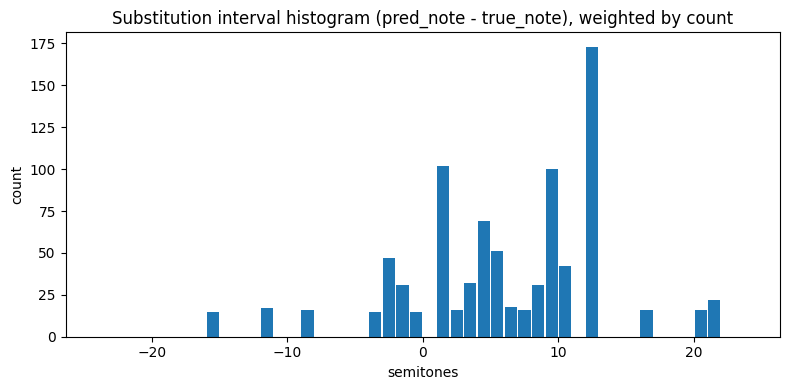

,near_neighbor_rate_(|Δ|<=2),"octave_error_rate_(|Δ| in {12,24})",perfect_fifth_rate_(|Δ|==7),n_weighted_substitutions
0,0.178067,0.206298,0.017372,921


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/substitution_interval_summary.csv


In [42]:
# Interval error profile from substitution table
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals()
subs_path = Path(RUN_DIR) / "top_token_substitutions.csv"
assert subs_path.exists(), f"Missing: {subs_path}. Run fixed Block E first."

subs = pd.read_csv(subs_path)

# Compute semitone deltas (pred - true)
subs["delta_semitones"] = subs["pred_note"].astype(int) - subs["true_note"].astype(int)

# Weight by counts
deltas = np.repeat(subs["delta_semitones"].values, subs["count"].values.astype(int))

plt.figure(figsize=(8,4))
plt.hist(deltas, bins=np.arange(-24, 25, 1), rwidth=0.9)
plt.title("Substitution interval histogram (pred_note - true_note), weighted by count")
plt.xlabel("semitones"); plt.ylabel("count")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "substitution_interval_hist.png", dpi=160)
plt.show()

# Octave / fifth / near-neighbor rates
total = len(deltas)
near = np.mean(np.abs(deltas) <= 2) if total else 0.0
octv = np.mean(np.isin(np.abs(deltas), [12, 24])) if total else 0.0
fifth = np.mean(np.abs(deltas) == 7) if total else 0.0

summary = pd.DataFrame([{
    "near_neighbor_rate_(|Δ|<=2)": float(near),
    "octave_error_rate_(|Δ| in {12,24})": float(octv),
    "perfect_fifth_rate_(|Δ|==7)": float(fifth),
    "n_weighted_substitutions": int(total),
}])

display(summary)
summary.to_csv(Path(RUN_DIR) / "substitution_interval_summary.csv", index=False)
print("Saved:", Path(RUN_DIR) / "substitution_interval_summary.csv")


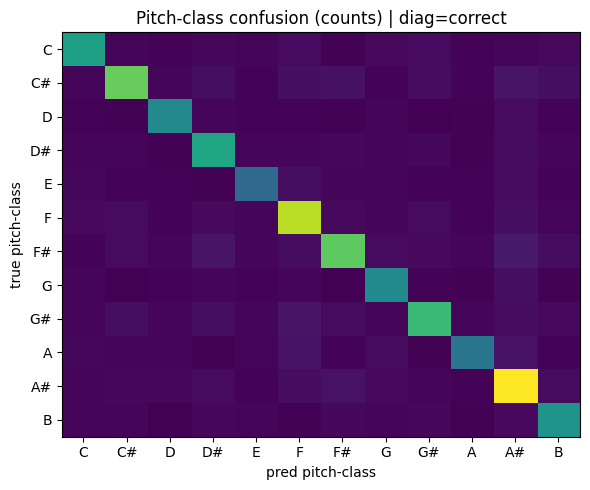

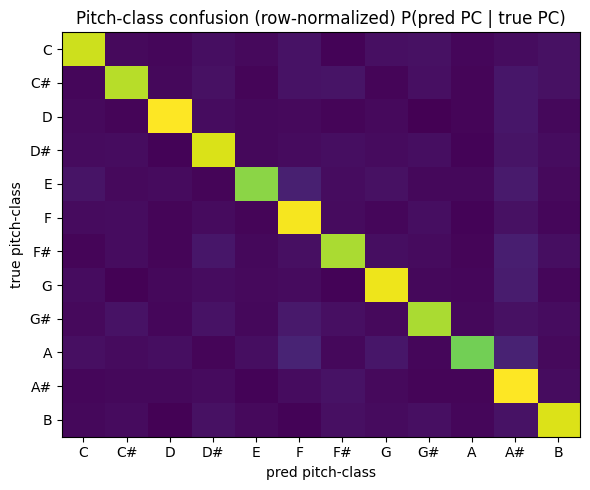

In [43]:
# Pitch-class confusion (12x12) from aligned confusion matrix
# - Diagonal = correct pitch-class
# - Off-diagonal = pitch-class confusions
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals()
assert "conf" in globals(), "Run Block F first (it creates 'conf' pitch confusion)."
assert "N_PITCH" in globals()

# Reduce pitch->pitch confusion to pitch-class confusion
pc_conf = np.zeros((12, 12), dtype=np.int64)
for t in range(N_PITCH):
    for p in range(N_PITCH):
        pc_conf[t % 12, p % 12] += int(conf[t, p])

# Row-normalize
row = pc_conf.sum(axis=1, keepdims=True)
pc_conf_row = pc_conf / np.maximum(row, 1)

labels = ["C","C#","D","D#","E","F","F#","G","G#","A","A#","B"]

plt.figure(figsize=(6,5))
plt.imshow(pc_conf, aspect="auto", origin="upper")
plt.title("Pitch-class confusion (counts) | diag=correct")
plt.xlabel("pred pitch-class"); plt.ylabel("true pitch-class")
plt.xticks(range(12), labels, rotation=0)
plt.yticks(range(12), labels)
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "pitchclass_conf_counts.png", dpi=160)
plt.show()

plt.figure(figsize=(6,5))
plt.imshow(pc_conf_row, aspect="auto", origin="upper", vmin=0.0, vmax=float(pc_conf_row.max()))
plt.title("Pitch-class confusion (row-normalized) P(pred PC | true PC)")
plt.xlabel("pred pitch-class"); plt.ylabel("true pitch-class")
plt.xticks(range(12), labels, rotation=0)
plt.yticks(range(12), labels)
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "pitchclass_conf_row_norm.png", dpi=160)
plt.show()


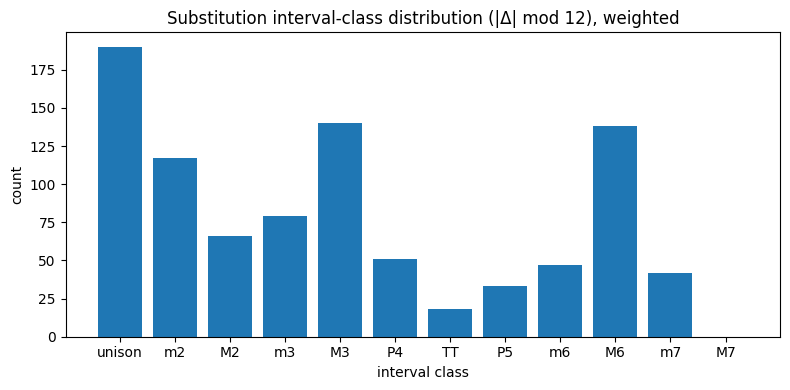

Octave-error rate (weighted, ±12/±24 among top substitutions): 0.20629750271444083


In [44]:
# Interval-class confusion profile from Levenshtein substitutions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals()
subs_path = Path(RUN_DIR) / "top_token_substitutions.csv"
assert subs_path.exists(), "Run Block E (fixed) first."

subs = pd.read_csv(subs_path)

# Using numeric MIDI ids stored in the CSV
# If your CSV stores human labels instead of ints, adapt accordingly.
true_ids = subs["true_id"].astype(int).values if "true_id" in subs.columns else subs["true_note"].astype(int).values
pred_ids = subs["pred_id"].astype(int).values if "pred_id" in subs.columns else subs["pred_note"].astype(int).values
counts = subs["count"].astype(int).values

delta = pred_ids - true_ids
abs_delta = np.abs(delta)

# Interval class mapping (mod 12) for harmonic interpretation
ic = abs_delta % 12

ic_names = {
    0:"unison",
    1:"m2", 2:"M2", 3:"m3", 4:"M3",
    5:"P4", 6:"TT", 7:"P5",
    8:"m6", 9:"M6", 10:"m7", 11:"M7"
}

ic_weight = np.zeros(12, dtype=np.int64)
for i in range(len(ic)):
    ic_weight[int(ic[i])] += int(counts[i])

labels = [ic_names[i] for i in range(12)]

plt.figure(figsize=(8,4))
plt.bar(range(12), ic_weight)
plt.title("Substitution interval-class distribution (|Δ| mod 12), weighted")
plt.xticks(range(12), labels, rotation=0)
plt.xlabel("interval class"); plt.ylabel("count")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "interval_class_substitutions.png", dpi=160)
plt.show()

# Octave-specific rate (±12, ±24)
oct_rate = float(np.sum(counts[np.isin(abs_delta, [12,24])]) / max(1, counts.sum()))
print("Octave-error rate (weighted, ±12/±24 among top substitutions):", oct_rate)


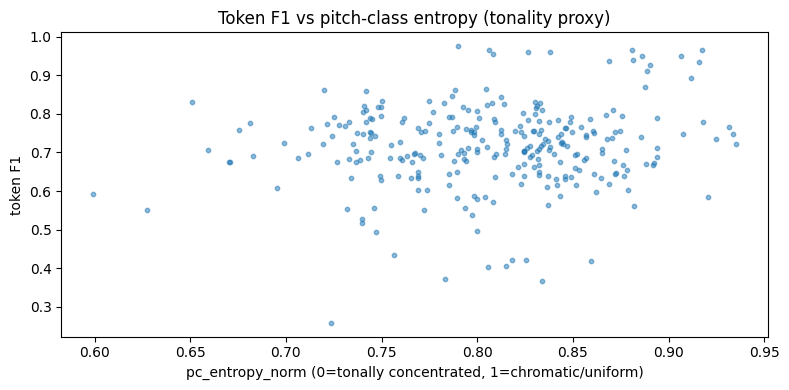

,pc_bin,n,F1_mean,TER_mean
0,"(0.598, 0.754]",56,0.708515,0.777222
1,"(0.754, 0.797]",56,0.704790,0.740135
2,"(0.797, 0.828]",56,0.706638,0.661887
3,"(0.828, 0.853]",56,0.710856,0.682187
4,"(0.853, 0.935]",56,0.744234,0.623000


In [45]:
#Tonality proxy vs performance (pc_entropy_norm)
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals()
p = Path(RUN_DIR) / "segment_features_with_scores.csv"
assert p.exists(), "Run Block H first."

df = pd.read_csv(p)

# Ensure needed columns
assert "pc_entropy_norm" in df.columns
# F1/TER might be token_F1 or F1 depending on your version
if "F1" not in df.columns:
    if "token_F1" in df.columns: df.rename(columns={"token_F1":"F1"}, inplace=True)
if "TER" not in df.columns:
    if "token_TER" in df.columns: df.rename(columns={"token_TER":"TER"}, inplace=True)

plt.figure(figsize=(8,4))
plt.scatter(df["pc_entropy_norm"], df["F1"], s=10, alpha=0.5)
plt.title("Token F1 vs pitch-class entropy (tonality proxy)")
plt.xlabel("pc_entropy_norm (0=tonally concentrated, 1=chromatic/uniform)")
plt.ylabel("token F1")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "f1_vs_pc_entropy.png", dpi=160)
plt.show()

# Bin and summarize
df["pc_bin"] = pd.qcut(df["pc_entropy_norm"], q=5, duplicates="drop")
tab = df.groupby("pc_bin", observed=True).agg(n=("F1","count"), F1_mean=("F1","mean"), TER_mean=("TER","mean")).reset_index()
display(tab)
tab.to_csv(Path(RUN_DIR) / "pc_entropy_bins_vs_perf.csv", index=False)


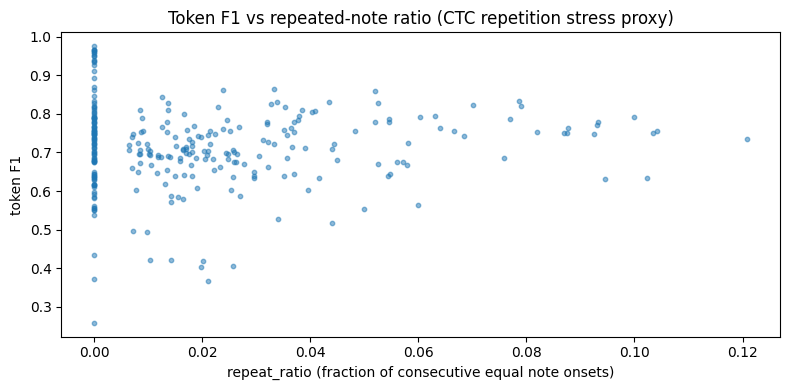

,rep_bin,n,F1_mean,TER_mean
0,"(-0.001, 0.05]",244,0.711067,0.705274
1,"(0.05, 0.1]",32,0.744630,0.636650
2,"(0.1, 0.2]",4,0.718357,0.667140


In [46]:
# Repetition/ornamentation proxy vs performance
# - Measures repeated-note ratio in target tokens per segment
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals()
assert "TEST_LABEL_DIR" in globals()
assert "read_label_csv" in globals()
assert "CFG" in globals() and hasattr(CFG, "sr")

scores = pd.read_csv(Path(RUN_DIR) / "best_segments_scores_all_test.csv")
SR = int(CFG.sr)

def repeat_ratio(notes):
    if len(notes) < 2:
        return 0.0
    notes = np.asarray(notes, dtype=int)
    return float(np.mean(notes[1:] == notes[:-1]))

rows = []
for _, r in scores.iterrows():
    tid = int(r["track_id"])
    ss  = int(r["seg_start_samp"])
    ee  = int(r["seg_end_samp"])
    df = read_label_csv(Path(TEST_LABEL_DIR) / f"{tid}.csv")

    dseg = df[(df["start_time"] >= ss) & (df["start_time"] < ee)].copy()
    notes = dseg["note"].astype(int).values if len(dseg) else np.asarray([], dtype=int)

    rows.append({
        "track_id": tid,
        "seg_start_samp": ss,
        "repeat_ratio": repeat_ratio(notes),
        "n_events": int(len(notes))
    })

rep = pd.DataFrame(rows)
joined = scores.merge(rep, on=["track_id","seg_start_samp"], how="left")

# F1 column handling
if "F1" not in joined.columns and "token_F1" in joined.columns:
    joined.rename(columns={"token_F1":"F1"}, inplace=True)

plt.figure(figsize=(8,4))
plt.scatter(joined["repeat_ratio"], joined["F1"], s=10, alpha=0.5)
plt.title("Token F1 vs repeated-note ratio (CTC repetition stress proxy)")
plt.xlabel("repeat_ratio (fraction of consecutive equal note onsets)")
plt.ylabel("token F1")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "f1_vs_repeat_ratio.png", dpi=160)
plt.show()

# Bin table
joined["rep_bin"] = pd.cut(joined["repeat_ratio"], bins=[0,0.05,0.10,0.20,0.40,1.0], include_lowest=True)
tab = joined.groupby("rep_bin", observed=True).agg(n=("F1","count"), F1_mean=("F1","mean"), TER_mean=("TER","mean")).reset_index()
display(tab)
tab.to_csv(Path(RUN_DIR) / "repeat_ratio_bins_vs_perf.csv", index=False)


In [50]:
import pandas as pd
from pathlib import Path

meta = pd.read_csv(META_PATH)
meta_ids = set(meta["id"].astype(int).tolist())

train_ids = {int(p.stem) for p in Path(TRAIN_LABEL_DIR).glob("*.csv")}
test_ids  = {int(p.stem) for p in Path(TEST_LABEL_DIR).glob("*.csv")}
subset_ids = sorted(train_ids | test_ids)

missing = [tid for tid in subset_ids if tid not in meta_ids]
print("Subset tracks:", len(subset_ids))
print("Missing from metadata:", len(missing))
print("Example missing IDs:", missing[:20])

import pandas as pd

meta = pd.read_csv(META_PATH)
if "ensemble" not in meta.columns:
    print("No ensemble column in metadata.")
else:
    # Only for your subset:
    subset = meta[meta["id"].astype(int).isin(subset_ids)].copy()
    print("Subset ensemble NaNs:", subset["ensemble"].isna().sum(), "out of", len(subset))
    print(subset["ensemble"].value_counts(dropna=False).head(20))



Subset tracks: 50
Missing from metadata: 0
Example missing IDs: []
Subset ensemble NaNs: 0 out of 50
ensemble
Solo Piano                     38
String Quartet                  3
Pairs Clarinet-Horn-Bassoon     2
Solo Violin                     2
Accompanied Violin              2
String Sextet                   1
Solo Cello                      1
Wind Octet                      1
Name: count, dtype: int64


,split,ensemble,n_tracks,total_minutes
3,test,Solo Piano,3,7.283333
1,test,Pairs Clarinet-Horn-Bassoon,2,5.266667
5,test,String Quartet,2,5.716667
0,test,Accompanied Violin,1,2.066667
2,test,Solo Cello,1,2.550000
4,test,Solo Violin,1,1.700000
7,train,Solo Piano,28,50.816667
6,train,Accompanied Violin,1,3.200000
8,train,Solo Violin,1,1.800000
9,train,String Quartet,1,3.216667


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/ensemble_coverage_by_split.csv


<Figure size 1000x400 with 0 Axes>

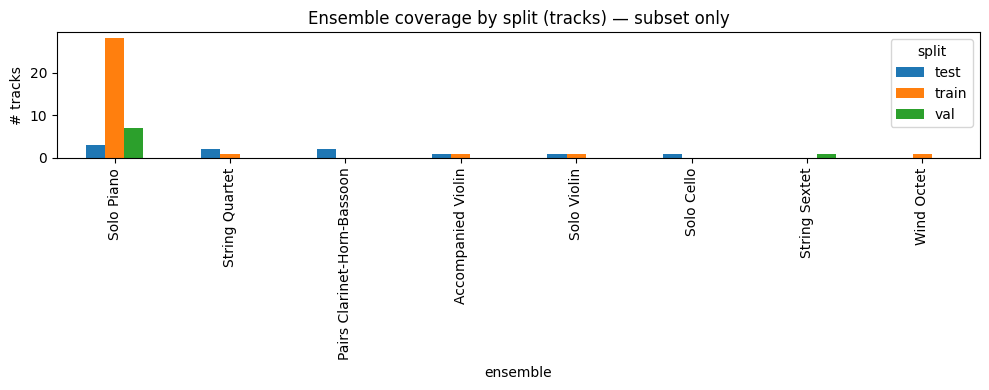

Split counts (subset):
split
train    32
test     10
val       8
Name: count, dtype: int64


In [51]:
# Ensemble coverage by split (track-level)
# - Robust split assignment (handles string/int IDs)
# - No "unknown" unless a track truly isn't in any split list
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json

assert "RUN_DIR" in globals(), "RUN_DIR not found."
assert "META_PATH" in globals(), "META_PATH not found."
assert "SPLITS_PATH" in globals(), "SPLITS_PATH not found."

# Load metadata + splits
meta = pd.read_csv(META_PATH)
with open(SPLITS_PATH, "r", encoding="utf-8") as f:
    splits = json.load(f)

# Robust sets (cast to int)
train_set = set(map(int, splits["train_ids"]))
val_set   = set(map(int, splits["val_ids"]))
test_set  = set(map(int, splits["test_ids"]))

def split_of(tid: int) -> str:
    tid = int(tid)
    if tid in train_set:
        return "train"
    if tid in val_set:
        return "val"
    if tid in test_set:
        return "test"
    return "unknown"

# Ensure types + fill missing strings defensively
meta["id"] = meta["id"].astype(int)
if "ensemble" not in meta.columns:
    meta["ensemble"] = "UNKNOWN_ENSEMBLE"
else:
    meta["ensemble"] = meta["ensemble"].fillna("UNKNOWN_ENSEMBLE")

# Add split column
meta["split"] = meta["id"].apply(split_of)

# Restrict to your subset only (train/val/test IDs)
subset_ids = sorted(train_set | val_set | test_set)
meta_sub = meta[meta["id"].isin(subset_ids)].copy()

# Duration
if "seconds" in meta_sub.columns:
    meta_sub["seconds"] = pd.to_numeric(meta_sub["seconds"], errors="coerce").fillna(0.0)
else:
    meta_sub["seconds"] = 0.0

# Table
tab = meta_sub.groupby(["split", "ensemble"], observed=True).agg(
    n_tracks=("id", "count"),
    total_minutes=("seconds", lambda x: float(x.sum() / 60.0))
).reset_index().sort_values(["split", "n_tracks"], ascending=[True, False])

display(tab)
tab.to_csv(Path(RUN_DIR) / "ensemble_coverage_by_split.csv", index=False)
print("Saved:", Path(RUN_DIR) / "ensemble_coverage_by_split.csv")

# Plot
pivot = tab.pivot_table(index="ensemble", columns="split", values="n_tracks", fill_value=0)

# Order ensembles by total tracks
pivot["total"] = pivot.sum(axis=1)
pivot = pivot.sort_values("total", ascending=False).drop(columns=["total"])

plt.figure(figsize=(10, 4))
pivot.plot(kind="bar", figsize=(10, 4))
plt.title("Ensemble coverage by split (tracks) — subset only")
plt.xlabel("ensemble")
plt.ylabel("# tracks")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "ensemble_coverage_by_split.png", dpi=160)
plt.show()

# Sanity print
print("Split counts (subset):")
print(meta_sub["split"].value_counts(dropna=False))


,split,track_id,instrument_id,n_events,note_time_mass_samp,note_min,note_max
0,val,2156,41,1597,15318018,57,96
1,val,2156,42,1219,12569598,48,79
2,val,2156,43,718,5560828,36,67
3,train,2194,1,499,8334849,37,84
4,train,2195,1,1442,16087544,37,84


,split,instrument_id,n_events,note_time_mass_samp,note_min,note_max,n_tracks,pitch_span,note_time_mass_sec
0,test,1,5049,64357864,28,95,4,67,1459.361995
1,test,41,3238,29971474,57,94,4,37,679.625261
3,test,43,1753,14849032,37,65,3,28,336.712744
6,test,72,1277,16202756,55,84,2,29,367.409433
5,test,71,873,13241355,39,68,2,29,300.257483
2,test,42,842,8784396,48,78,2,30,199.192653
4,test,61,557,8322053,45,70,2,25,188.708685
7,train,1,28938,376330726,29,94,29,65,8533.576553
8,train,41,3617,23368205,55,96,3,41,529.891270
9,train,42,1105,7462410,48,76,1,28,169.215646


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/instrument_imbalance_by_split.csv


,split,n_instruments,gini_events,top_instrument_event_share
0,train,8,0.717208,0.773930
1,val,4,0.436220,0.641655
2,test,7,0.402595,0.371551


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/instrument_imbalance_summary.csv


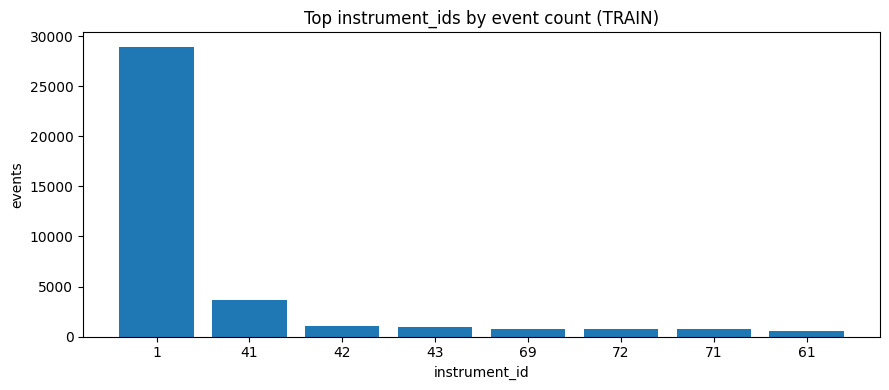

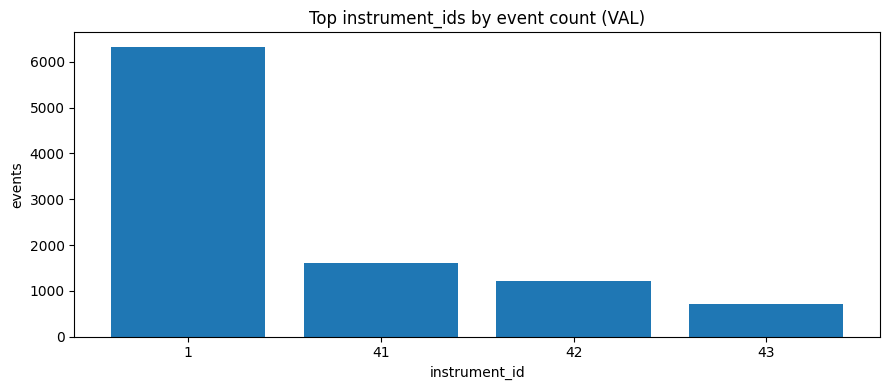

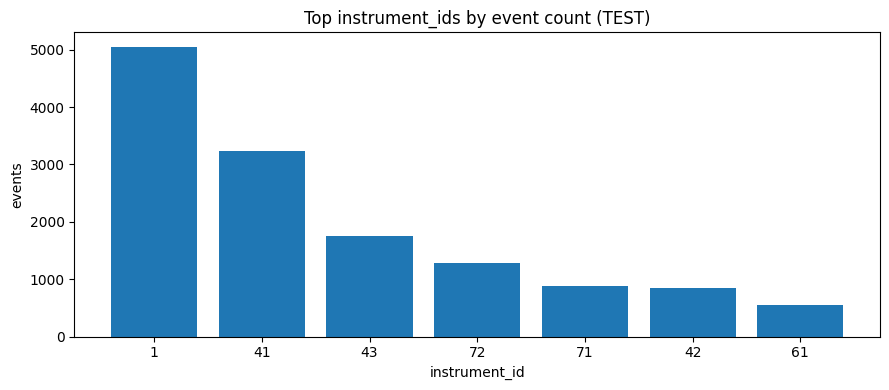

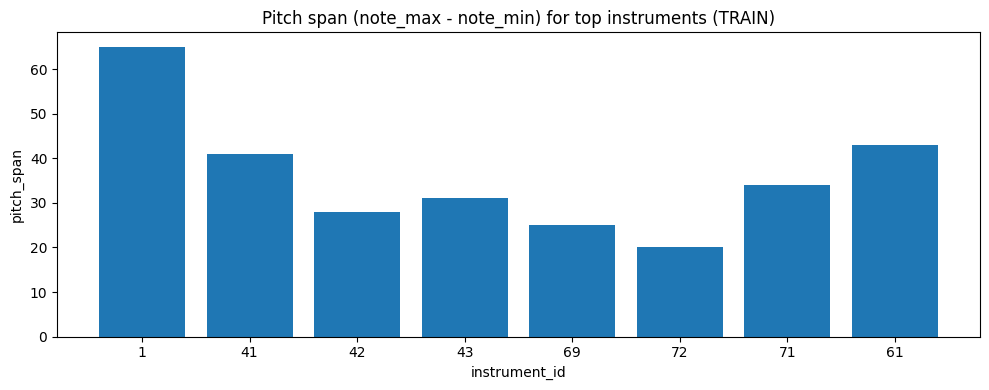

In [52]:
# Instrument imbalance from label CSVs
# - event counts, note-time mass (duration sum), pitch range per instrument_id
# - aggregated by split (train/val/test)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import json

assert "RUN_DIR" in globals(), "RUN_DIR not found."
assert "SPLITS_PATH" in globals(), "SPLITS_PATH not found."
assert "TRAIN_LABEL_DIR" in globals(), "TRAIN_LABEL_DIR not found."
assert "TEST_LABEL_DIR" in globals(), "TEST_LABEL_DIR not found."
assert "read_label_csv" in globals(), "read_label_csv not found."
assert "CFG" in globals() and hasattr(CFG, "sr"), "CFG.sr not found."

SR = int(CFG.sr)

with open(SPLITS_PATH, "r", encoding="utf-8") as f:
    splits = json.load(f)

train_set = set(map(int, splits["train_ids"]))
val_set   = set(map(int, splits["val_ids"]))
test_set  = set(map(int, splits["test_ids"]))

def split_of(tid: int) -> str:
    tid = int(tid)
    if tid in train_set: return "train"
    if tid in val_set:   return "val"
    if tid in test_set:  return "test"
    return "unknown"

def gini(x):
    x = np.asarray(x, dtype=np.float64)
    x = x[x >= 0]
    if x.size == 0 or np.allclose(x.sum(), 0):
        return 0.0
    x = np.sort(x)
    n = x.size
    cumx = np.cumsum(x)
    return float((n + 1 - 2 * np.sum(cumx) / cumx[-1]) / n)

# Scan label files from your subset dirs (train pool + test dir)
rows = []
for lbl_dir in [Path(TRAIN_LABEL_DIR), Path(TEST_LABEL_DIR)]:
    for p in sorted(lbl_dir.glob("*.csv")):
        tid = int(p.stem)
        sp = split_of(tid)
        df = read_label_csv(p)
        if len(df) == 0:
            continue

        # duration per event in samples (overlaps allowed; fine as "note-time mass")
        dur = (df["end_time"] - df["start_time"]).clip(lower=0).astype(int)

        for inst, g in df.groupby("instrument"):
            inst = int(inst)
            dsum = int((g["end_time"] - g["start_time"]).clip(lower=0).sum())
            rows.append({
                "split": sp,
                "track_id": tid,
                "instrument_id": inst,
                "n_events": int(len(g)),
                "note_time_mass_samp": dsum,
                "note_min": int(g["note"].min()),
                "note_max": int(g["note"].max()),
            })

inst_df = pd.DataFrame(rows)
display(inst_df.head())

# Aggregate
agg = inst_df.groupby(["split","instrument_id"], observed=True).agg(
    n_events=("n_events","sum"),
    note_time_mass_samp=("note_time_mass_samp","sum"),
    note_min=("note_min","min"),
    note_max=("note_max","max"),
    n_tracks=("track_id","nunique")
).reset_index()

agg["pitch_span"] = agg["note_max"] - agg["note_min"]
agg["note_time_mass_sec"] = agg["note_time_mass_samp"] / float(SR)

display(agg.sort_values(["split","n_events"], ascending=[True, False]).head(25))

agg.to_csv(Path(RUN_DIR) / "instrument_imbalance_by_split.csv", index=False)
print("Saved:", Path(RUN_DIR) / "instrument_imbalance_by_split.csv")

# Imbalance summary per split (Gini + top share)
summary = []
for sp in ["train","val","test"]:
    a = agg[agg["split"] == sp].copy()
    if len(a) == 0:
        continue
    counts = a["n_events"].values.astype(np.float64)
    top_share = float(np.max(counts) / np.sum(counts)) if np.sum(counts) > 0 else 0.0
    summary.append({
        "split": sp,
        "n_instruments": int(a["instrument_id"].nunique()),
        "gini_events": gini(counts),
        "top_instrument_event_share": top_share
    })
sum_df = pd.DataFrame(summary)
display(sum_df)

sum_df.to_csv(Path(RUN_DIR) / "instrument_imbalance_summary.csv", index=False)
print("Saved:", Path(RUN_DIR) / "instrument_imbalance_summary.csv")

# Plot: top instruments by event count per split
for sp in ["train","val","test"]:
    top = agg[agg["split"] == sp].sort_values("n_events", ascending=False).head(15)
    if len(top) == 0:
        continue
    plt.figure(figsize=(9,4))
    plt.bar([str(x) for x in top["instrument_id"]], top["n_events"].values)
    plt.title(f"Top instrument_ids by event count ({sp.upper()})")
    plt.xlabel("instrument_id"); plt.ylabel("events")
    plt.tight_layout()
    plt.savefig(Path(RUN_DIR) / "figs" / f"top_instruments_{sp}_events.png", dpi=160)
    plt.show()

# Plot: pitch range per instrument (train split only, top by events)
train_top = agg[agg["split"]=="train"].sort_values("n_events", ascending=False).head(20)
if len(train_top) > 0:
    plt.figure(figsize=(10,4))
    plt.bar([str(x) for x in train_top["instrument_id"]],
            train_top["pitch_span"].values)
    plt.title("Pitch span (note_max - note_min) for top instruments (TRAIN)")
    plt.xlabel("instrument_id"); plt.ylabel("pitch_span")
    plt.tight_layout()
    plt.savefig(Path(RUN_DIR) / "figs" / "instrument_pitch_span_train_top.png", dpi=160)
    plt.show()


,ensemble,n_segments,F1_mean,F1_std,TER_mean,onset_density_mean,poly_p95_mean,chord_max_mean,instrument_count_mean
4,Solo Violin,19,0.786126,0.066578,0.566089,5.657895,1.176316,1.578947,1.00
3,Solo Piano,83,0.780389,0.099427,0.475428,9.167470,3.857229,3.963855,1.00
1,Pairs Clarinet-Horn-Bassoon,60,0.731383,0.061911,0.660603,8.700000,5.464167,5.366667,2.85
2,Solo Cello,29,0.652997,0.052243,0.864640,6.417241,1.000000,1.000000,1.00
0,Accompanied Violin,23,0.649306,0.080915,0.929802,12.108696,4.126087,4.347826,2.00
5,String Quartet,66,0.647564,0.120069,0.891148,11.750000,3.973485,4.287879,3.00


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/performance_by_ensemble.csv


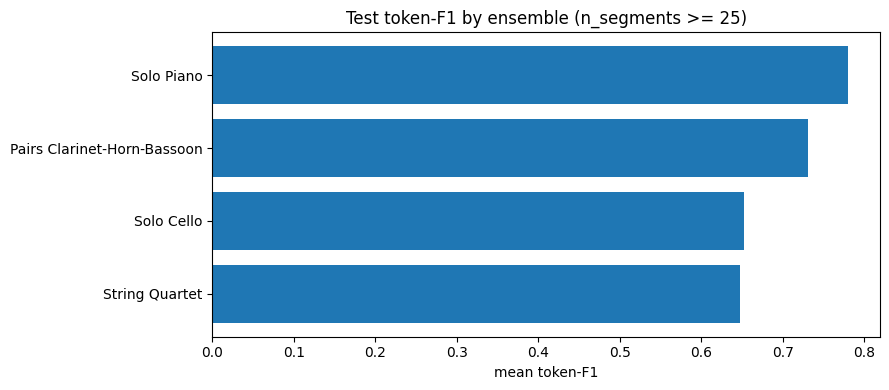

,inst_bin,n,F1_mean,F1_std,TER_mean,poly_p95_mean,chord_max_mean,onset_density_mean
0,"(-0.001, 1.0]",131,0.753020,0.101526,0.574739,2.835878,2.961832,8.049618
1,"(1.0, 2.0]",32,0.668214,0.079227,0.856874,4.059375,4.218750,11.187500
2,"(2.0, 3.0]",117,0.685243,0.108060,0.789892,4.744444,4.871795,10.410256


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/performance_by_instrument_count_bin.csv


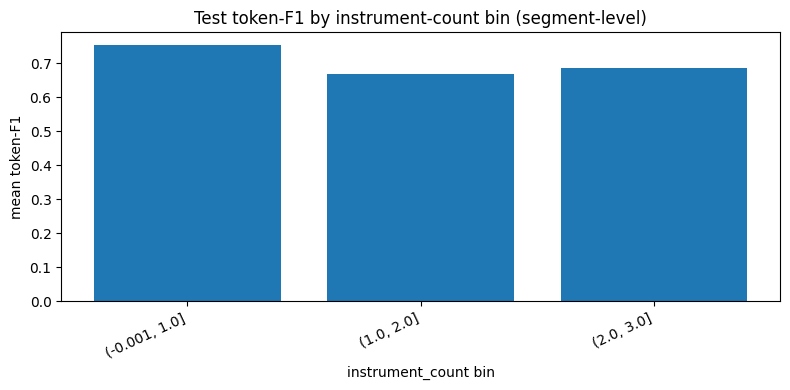

Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/performance_by_composer_and_ensemble.csv


,composer,ensemble,n,F1_mean,TER_mean
1,Bach,Solo Piano,17,0.918009,0.252647
2,Bach,Solo Violin,19,0.786126,0.566089
9,Schubert,Solo Piano,37,0.766641,0.534383
8,Mozart,Pairs Clarinet-Horn-Bassoon,34,0.758410,0.612297
5,Beethoven,Solo Piano,29,0.717257,0.530805
4,Beethoven,Pairs Clarinet-Horn-Bassoon,26,0.696041,0.723771
7,Haydn,String Quartet,44,0.679474,0.946564
0,Bach,Solo Cello,29,0.652997,0.864640
3,Beethoven,Accompanied Violin,23,0.649306,0.929802
6,Beethoven,String Quartet,22,0.583742,0.780315


In [54]:
# Which ensembles / textures are easiest vs hardest (performance stratified)
# - Auto-detects F1/TER column names
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals(), "RUN_DIR not found."
assert "META_PATH" in globals(), "META_PATH not found."

scores_path = Path(RUN_DIR) / "best_segments_scores_all_test.csv"
feat_path   = Path(RUN_DIR) / "segment_features_with_scores.csv"

assert scores_path.exists(), f"Missing: {scores_path}"
assert feat_path.exists(),   f"Missing: {feat_path}"

scores = pd.read_csv(scores_path)
feat   = pd.read_csv(feat_path)
meta   = pd.read_csv(META_PATH)

def pick_col(df, candidates):
    for c in candidates:
        if c in df.columns:
            return c
    return None

# Merge segment scores + features
df = scores.merge(feat, on=["track_id","seg_start_samp"], how="left")

# Merge metadata (track-level)
meta["id"] = meta["id"].astype(int)
meta["ensemble"] = meta["ensemble"].fillna("UNKNOWN_ENSEMBLE") if "ensemble" in meta.columns else "UNKNOWN_ENSEMBLE"
meta["composer"] = meta["composer"].fillna("UNKNOWN_COMPOSER") if "composer" in meta.columns else "UNKNOWN_COMPOSER"
meta["composition"] = (
    meta["composition"].fillna(meta["id"].astype(str))
    if "composition" in meta.columns else meta["id"].astype(str)
)

df = df.merge(
    meta[["id","ensemble","composer","composition"]],
    left_on="track_id", right_on="id", how="left"
).drop(columns=["id"])

# --- detect and standardize metric columns ---
f1_col = pick_col(df, ["F1", "token_F1", "token_f1", "f1", "F1_x", "token_F1_x", "token_f1_x"])
ter_col = pick_col(df, ["TER", "token_TER", "token_ter", "ter", "TER_x", "token_TER_x", "token_ter_x"])

if f1_col is None or ter_col is None:
    print("Available columns:\n", df.columns.tolist())
    raise KeyError(f"Could not find F1/TER columns. Found f1_col={f1_col}, ter_col={ter_col}")

if f1_col != "F1":
    df.rename(columns={f1_col: "F1"}, inplace=True)
if ter_col != "TER":
    df.rename(columns={ter_col: "TER"}, inplace=True)

df["F1"]  = pd.to_numeric(df["F1"], errors="coerce")
df["TER"] = pd.to_numeric(df["TER"], errors="coerce")

# ---------------------------------------------------------
# Ensemble-level performance
# ---------------------------------------------------------
ens = df.groupby("ensemble", observed=True).agg(
    n_segments=("F1","count"),
    F1_mean=("F1","mean"),
    F1_std=("F1","std"),
    TER_mean=("TER","mean"),
    onset_density_mean=("onset_density","mean"),
    poly_p95_mean=("poly_p95","mean"),
    chord_max_mean=("chord_max","mean"),
    instrument_count_mean=("instrument_count","mean"),
).reset_index().sort_values("F1_mean", ascending=False)

display(ens)
ens.to_csv(Path(RUN_DIR) / "performance_by_ensemble.csv", index=False)
print("Saved:", Path(RUN_DIR) / "performance_by_ensemble.csv")

# Plot: mean F1 by ensemble (with n filter)
min_n = 25
ens_plot = ens[ens["n_segments"] >= min_n].sort_values("F1_mean", ascending=True)
if len(ens_plot) > 0:
    plt.figure(figsize=(9, max(4, 0.25*len(ens_plot))))
    plt.barh(ens_plot["ensemble"], ens_plot["F1_mean"].values)
    plt.title(f"Test token-F1 by ensemble (n_segments >= {min_n})")
    plt.xlabel("mean token-F1")
    plt.tight_layout()
    plt.savefig(Path(RUN_DIR) / "figs" / "perf_by_ensemble_f1.png", dpi=160)
    plt.show()
else:
    print(f"No ensembles with n_segments >= {min_n}. Lower min_n if needed.")

# ---------------------------------------------------------
# Instrument-count bins (texture proxy)
# ---------------------------------------------------------
if "instrument_count" not in df.columns:
    print("Available columns:\n", df.columns.tolist())
    raise KeyError("instrument_count missing. Ensure Block H computed it and saved segment_features_with_scores.csv.")

df["inst_bin"] = pd.cut(df["instrument_count"], bins=[0,1,2,3,4,10], include_lowest=True)

inst_tab = df.groupby("inst_bin", observed=True).agg(
    n=("F1","count"),
    F1_mean=("F1","mean"),
    F1_std=("F1","std"),
    TER_mean=("TER","mean"),
    poly_p95_mean=("poly_p95","mean"),
    chord_max_mean=("chord_max","mean"),
    onset_density_mean=("onset_density","mean"),
).reset_index()

display(inst_tab)
inst_tab.to_csv(Path(RUN_DIR) / "performance_by_instrument_count_bin.csv", index=False)
print("Saved:", Path(RUN_DIR) / "performance_by_instrument_count_bin.csv")

plt.figure(figsize=(8,4))
plt.bar([str(x) for x in inst_tab["inst_bin"]], inst_tab["F1_mean"].values)
plt.title("Test token-F1 by instrument-count bin (segment-level)")
plt.xlabel("instrument_count bin"); plt.ylabel("mean token-F1")
plt.xticks(rotation=25, ha="right")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "perf_by_instrument_count_bin_f1.png", dpi=160)
plt.show()

# ---------------------------------------------------------
# Optional: composer × ensemble pivot (report-friendly)
# ---------------------------------------------------------
pivot = df.groupby(["composer","ensemble"], observed=True).agg(
    n=("F1","count"),
    F1_mean=("F1","mean"),
    TER_mean=("TER","mean")
).reset_index()

pivot.to_csv(Path(RUN_DIR) / "performance_by_composer_and_ensemble.csv", index=False)
print("Saved:", Path(RUN_DIR) / "performance_by_composer_and_ensemble.csv")

display(pivot.sort_values(["F1_mean","n"], ascending=[False, False]).head(25))


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/instrument_cooccurrence_tracks.csv


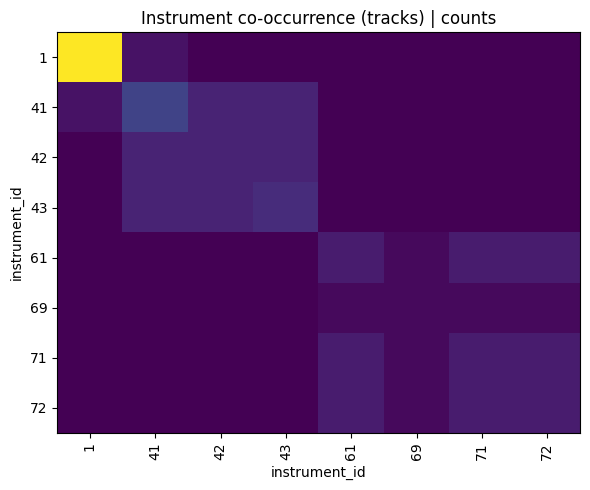

In [55]:
# Instrument co-occurrence (track-level) from label CSVs
# - Builds an instrument_id x instrument_id co-occurrence matrix
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals()
assert "TRAIN_LABEL_DIR" in globals()
assert "TEST_LABEL_DIR" in globals()
assert "read_label_csv" in globals()

label_dirs = [Path(TRAIN_LABEL_DIR), Path(TEST_LABEL_DIR)]

# Collect per-track instrument sets
track_inst = []
for d in label_dirs:
    for p in sorted(d.glob("*.csv")):
        tid = int(p.stem)
        df = read_label_csv(p)
        if len(df) == 0 or "instrument" not in df.columns:
            continue
        insts = sorted(set(df["instrument"].astype(int).tolist()))
        track_inst.append((tid, insts))

# Universe of instrument_ids in subset
all_insts = sorted({i for _, insts in track_inst for i in insts})
idx = {inst:i for i, inst in enumerate(all_insts)}
M = np.zeros((len(all_insts), len(all_insts)), dtype=np.int64)

for tid, insts in track_inst:
    for a in insts:
        for b in insts:
            M[idx[a], idx[b]] += 1

cooc = pd.DataFrame(M, index=[str(i) for i in all_insts], columns=[str(i) for i in all_insts])
cooc.to_csv(Path(RUN_DIR) / "instrument_cooccurrence_tracks.csv", index=True)
print("Saved:", Path(RUN_DIR) / "instrument_cooccurrence_tracks.csv")

plt.figure(figsize=(6,5))
plt.imshow(cooc.values, aspect="auto", origin="upper")
plt.title("Instrument co-occurrence (tracks) | counts")
plt.xlabel("instrument_id"); plt.ylabel("instrument_id")
plt.xticks(range(len(all_insts)), [str(i) for i in all_insts], rotation=90)
plt.yticks(range(len(all_insts)), [str(i) for i in all_insts])
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "instrument_cooccurrence_tracks.png", dpi=160)
plt.show()


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/per_pitch_prf_from_conf.csv
Using PITCH_MIN = 27 | N_PITCH = 88


,register,f1_mean,f1_std,precision_mean,recall_mean,n_pitches
0,high,0.362599,0.350698,0.364362,0.376848,43
1,low,0.159858,0.226869,0.250021,0.138276,21
2,mid,0.649991,0.084297,0.682884,0.633833,24


Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/register_perf_summary.csv


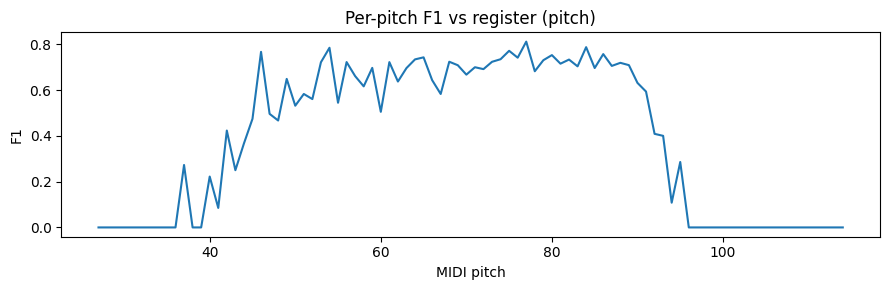

In [59]:
# Register-wise performance (low/mid/high)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals(), "RUN_DIR not found."
assert "conf" in globals(), "Need 'conf' (pitch x pitch confusion counts). Run Block F (aligned confusion) first."

# N_PITCH from confusion matrix
N_PITCH = int(conf.shape[0])

# Determine PITCH_MIN robustly
def infer_pitch_min():
    # 1) global variable if defined
    if "PITCH_MIN" in globals():
        return int(globals()["PITCH_MIN"])

    # 2) from CFG if available
    if "CFG" in globals():
        for key in ["pitch_min", "pitch_min_midi", "midi_min", "min_midi"]:
            if hasattr(CFG, key):
                return int(getattr(CFG, key))

    # 3) infer from label files (subset)
    if "TRAIN_LABEL_DIR" in globals() and "TEST_LABEL_DIR" in globals() and "read_label_csv" in globals():
        mins = []
        for d in [Path(TRAIN_LABEL_DIR), Path(TEST_LABEL_DIR)]:
            for p in d.glob("*.csv"):
                df = read_label_csv(p)
                if len(df) > 0 and "note" in df.columns:
                    mins.append(int(df["note"].min()))
        if len(mins) > 0:
            return int(min(mins))

    # 4) fallback (won't crash, but less semantically meaningful)
    return 0

PITCH_MIN = infer_pitch_min()
pitches = np.arange(PITCH_MIN, PITCH_MIN + N_PITCH)

# Per-pitch precision/recall from confusion matrix
tp = np.diag(conf).astype(np.float64)
pred_sum = conf.sum(axis=0).astype(np.float64)
true_sum = conf.sum(axis=1).astype(np.float64)

precision = tp / np.maximum(pred_sum, 1.0)
recall    = tp / np.maximum(true_sum, 1.0)
f1        = 2 * precision * recall / np.maximum(precision + recall, 1e-12)

dfp = pd.DataFrame({"pitch": pitches, "precision": precision, "recall": recall, "f1": f1})
dfp.to_csv(Path(RUN_DIR) / "per_pitch_prf_from_conf.csv", index=False)
print("Saved:", Path(RUN_DIR) / "per_pitch_prf_from_conf.csv")
print("Using PITCH_MIN =", PITCH_MIN, "| N_PITCH =", N_PITCH)

# Register bins (music-theory meaningful boundaries)
def reg(p):
    if p < 48:   return "low"   # < C3
    if p < 72:   return "mid"   # C3..B5
    return "high"              # >= C6

dfp["register"] = dfp["pitch"].apply(reg)

tab = dfp.groupby("register", observed=True).agg(
    f1_mean=("f1","mean"),
    f1_std=("f1","std"),
    precision_mean=("precision","mean"),
    recall_mean=("recall","mean"),
    n_pitches=("pitch","count")
).reset_index()

display(tab)
tab.to_csv(Path(RUN_DIR) / "register_perf_summary.csv", index=False)
print("Saved:", Path(RUN_DIR) / "register_perf_summary.csv")

plt.figure(figsize=(9,3))
plt.plot(dfp["pitch"], dfp["f1"].values)
plt.title("Per-pitch F1 vs register (pitch)")
plt.xlabel("MIDI pitch"); plt.ylabel("F1")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "per_pitch_f1_curve.png", dpi=160)
plt.show()


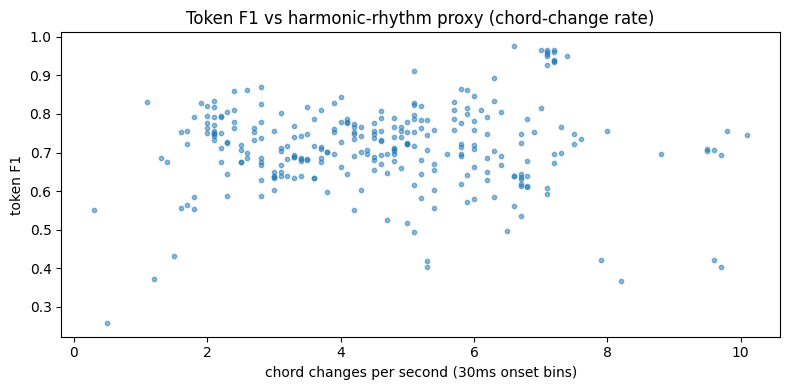

Saved: /home/jovyan/shared/s0599003/ctc_runs/runs_main_grid/hcqt_noaug_seed33/harmonic_rhythm_with_scores.csv


In [57]:
# Harmonic rhythm proxy vs performance
# - Builds chord-sets from onsets in small bins and measures chord-change rate
# - Joins with the segment scores
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

assert "RUN_DIR" in globals()
assert "TEST_LABEL_DIR" in globals()
assert "read_label_csv" in globals()
assert "CFG" in globals() and hasattr(CFG, "sr")

scores_path = Path(RUN_DIR) / "best_segments_scores_all_test.csv"
assert scores_path.exists(), f"Missing {scores_path}"
scores = pd.read_csv(scores_path)

# Robust metric naming
if "F1" not in scores.columns:
    for c in ["token_F1","token_f1","F1_x"]:
        if c in scores.columns:
            scores.rename(columns={c:"F1"}, inplace=True)
            break
assert "F1" in scores.columns, f"Scores columns: {scores.columns.tolist()}"

SR = int(CFG.sr)

def chord_change_rate(label_df, seg_start, seg_end, bin_ms=30):
    if len(label_df) == 0:
        return 0.0

    d = label_df[(label_df["start_time"] >= seg_start) & (label_df["start_time"] < seg_end)].copy()
    if len(d) == 0:
        return 0.0

    # Bin onsets
    bin_samp = int(SR * (bin_ms / 1000.0))
    d["bin"] = ((d["start_time"] - seg_start) // max(1, bin_samp)).astype(int)

    # Chord-set per bin (pitch classes or absolute pitches; choose absolute here)
    chord_sets = []
    for _, g in d.groupby("bin"):
        chord_sets.append(tuple(sorted(set(g["note"].astype(int).tolist()))))

    if len(chord_sets) <= 1:
        return 0.0

    # Count changes
    changes = sum(1 for i in range(1, len(chord_sets)) if chord_sets[i] != chord_sets[i-1])
    dur_sec = (seg_end - seg_start) / float(SR)
    return float(changes / max(dur_sec, 1e-6))

rows = []
for _, r in scores.iterrows():
    tid = int(r["track_id"])
    ss  = int(r["seg_start_samp"])
    ee  = int(r["seg_end_samp"])
    df = read_label_csv(Path(TEST_LABEL_DIR) / f"{tid}.csv")
    rows.append({
        "track_id": tid,
        "seg_start_samp": ss,
        "harm_rhythm": chord_change_rate(df, ss, ee, bin_ms=30)
    })

hr = pd.DataFrame(rows)
joined = scores.merge(hr, on=["track_id","seg_start_samp"], how="left")

plt.figure(figsize=(8,4))
plt.scatter(joined["harm_rhythm"], joined["F1"], s=10, alpha=0.5)
plt.title("Token F1 vs harmonic-rhythm proxy (chord-change rate)")
plt.xlabel("chord changes per second (30ms onset bins)")
plt.ylabel("token F1")
plt.tight_layout()
plt.savefig(Path(RUN_DIR) / "figs" / "f1_vs_harmonic_rhythm.png", dpi=160)
plt.show()

joined.to_csv(Path(RUN_DIR) / "harmonic_rhythm_with_scores.csv", index=False)
print("Saved:", Path(RUN_DIR) / "harmonic_rhythm_with_scores.csv")


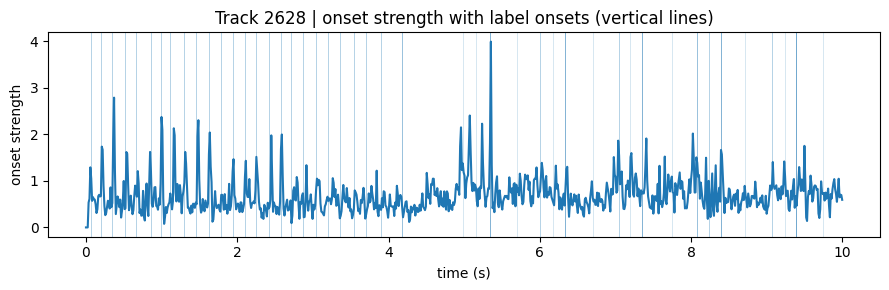

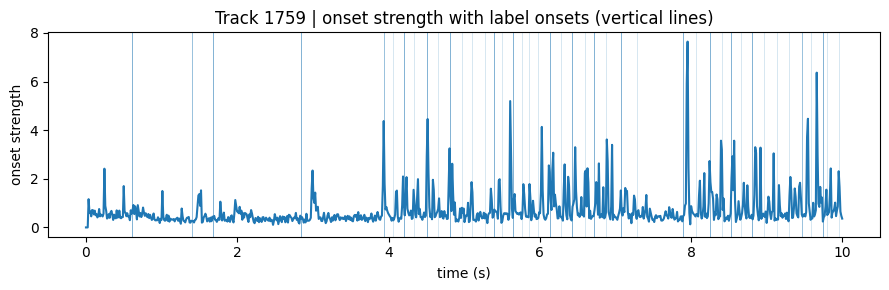

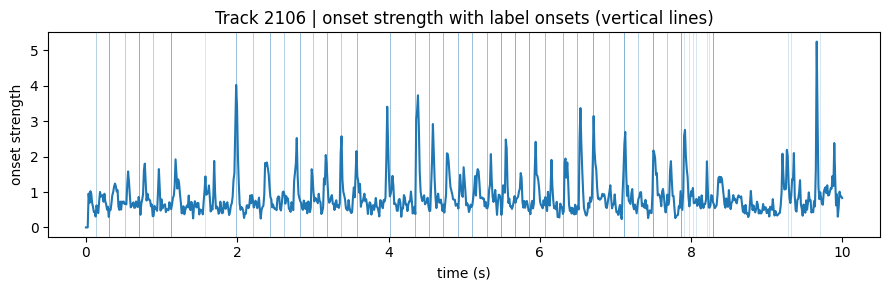

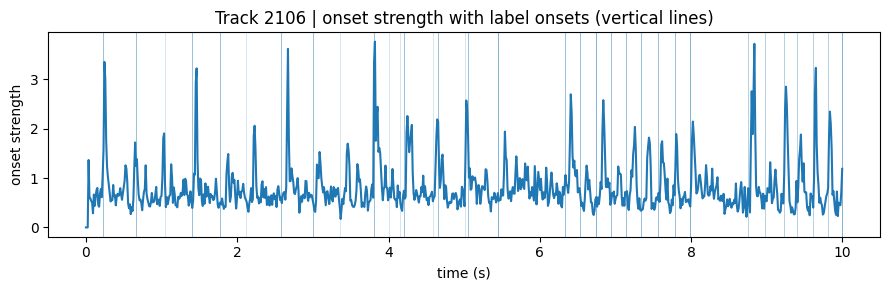

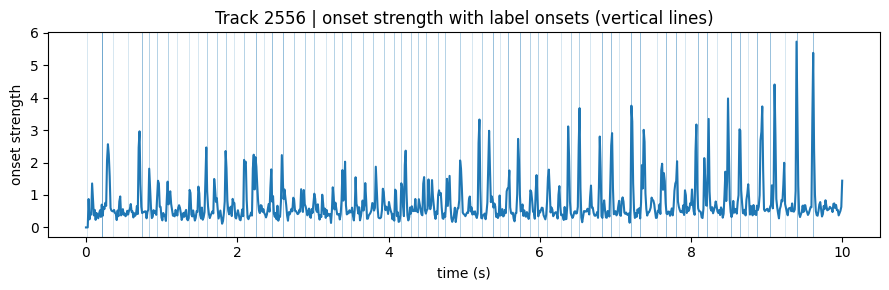

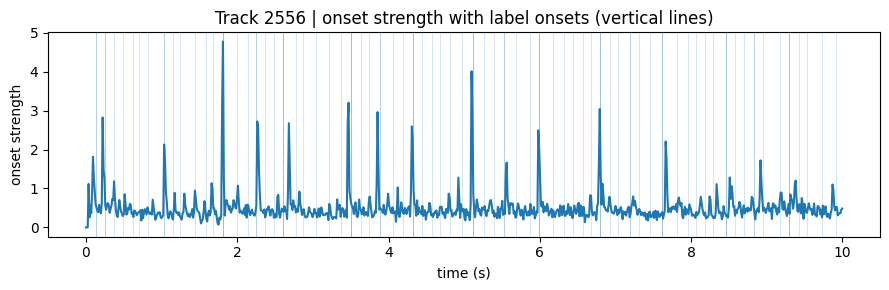

In [58]:
#  Label-onset vs audio onset-strength sanity check (test subset)
# - Picks a few random segments; overlay label onsets on librosa onset envelope
# - Helps justify label-noise discussion
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import random
import librosa

assert "RUN_DIR" in globals()
assert "TEST_AUDIO_DIR" in globals()
assert "TEST_LABEL_DIR" in globals()
assert "read_label_csv" in globals()
assert "CFG" in globals() and hasattr(CFG, "sr")

scores_path = Path(RUN_DIR) / "best_segments_scores_all_test.csv"
scores = pd.read_csv(scores_path)

SR = int(CFG.sr)

# sample a few segments across the range
random.seed(0)
sample = scores.sample(n=min(6, len(scores)), random_state=0)

for _, r in sample.iterrows():
    tid = int(r["track_id"])
    ss  = int(r["seg_start_samp"])
    ee  = int(r["seg_end_samp"])

    wav_path = Path(TEST_AUDIO_DIR) / f"{tid}.wav"
    lab_path = Path(TEST_LABEL_DIR) / f"{tid}.csv"
    if not wav_path.exists() or not lab_path.exists():
        continue

    y, _ = librosa.load(wav_path, sr=SR, mono=True, offset=ss/SR, duration=(ee-ss)/SR)
    onset_env = librosa.onset.onset_strength(y=y, sr=SR)
    times = librosa.times_like(onset_env, sr=SR)

    lab = read_label_csv(lab_path)
    d = lab[(lab["start_time"] >= ss) & (lab["start_time"] < ee)].copy()
    onset_times = (d["start_time"].values - ss) / float(SR)

    plt.figure(figsize=(9,3))
    plt.plot(times, onset_env, label="audio onset strength")
    for t in onset_times[:200]:  # cap for readability
        plt.axvline(t, linewidth=0.5, alpha=0.25)
    plt.title(f"Track {tid} | onset strength with label onsets (vertical lines)")
    plt.xlabel("time (s)"); plt.ylabel("onset strength")
    plt.tight_layout()
    plt.savefig(Path(RUN_DIR) / "figs" / f"label_vs_onsetenv_track{tid}_start{ss}.png", dpi=160)
    plt.show()
